<a href="https://colab.research.google.com/github/XiangLi368/SkinAndEyeAIModel/blob/main/Skin_Lesion_RightDS_SamplesizeTesting_SixClasses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Connect to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive



# **Import**

In [ ]:
import pandas as pd
from glob import glob
import cv2
import matplotlib.pyplot as plt
import re

from numpy.random import seed
seed(101)
import os, cv2
import pandas as pd
import numpy as np
from tensorflow import keras

import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import categorical_accuracy, top_k_categorical_accuracy
import os

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import itertools
import shutil
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm

from sklearn.metrics import classification_report
from sklearn import metrics
from itertools import chain

import matplotlib.pyplot as plt
from itertools import cycle
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

from keras.models import load_model
from keras.preprocessing import image
import numpy as np

# **Check GPU**

In [ ]:
# %tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Aug  9 05:39:46 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    35W / 250W |    389MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Load DATA**

## **Load img**

### **ISIC2019 Train Data**

In [ ]:
#If you are using an already unzip file, you do not need to run this line
dirs = 'Dataset'
if not os.path.exists(dirs):
  os.makedirs(dirs)
!unzip '/content/drive/MyDrive/Work_Metasense/Code&Result/Dataset/ISIC2019_clean_8class_crop2square.zip' -d 'Dataset/ISIC_2019_Training_Input/'

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061171.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061173.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061174.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061175.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061177.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061178.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061181.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061183.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061184.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061186.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061188.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061189.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061192.png  
  inflating: Dataset/ISIC_2019_Training_Input/ISIC_0061194.png  
  inflating: Dataset/ISIC_2019_Training

18553


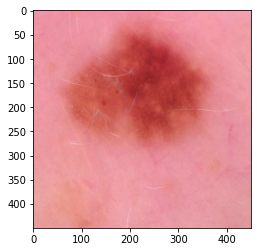

In [ ]:
# Read file path (On Cloab)
image_file = 'Dataset/ISIC_2019_Training_Input'
# Read list of images, display images
images_list = glob("Dataset/ISIC_2019_Training_Input/*.png")
print(len(images_list))
image0 = cv2.imread(images_list[0])
plt.imshow(image0[:,:,::-1])

## **Load CSV and Clean Dataset**

### **ISIC2019**

In [ ]:
#ISIC2019
df_2019 = pd.read_csv ('/content/drive/MyDrive/5703File/DataSet/dataverse_files/ISIC_2019_Training_GroundTruth.csv')
print(df_2019)
df_Metadata = pd.read_csv("/content/drive/MyDrive/5703File/DataSet/dataverse_files/ISIC_2019_Training_Metadata.csv")
print(df_Metadata)
df_2019['lesion_id'] = df_Metadata['lesion_id']
# create a new colum all value is '0'
df_2019['dx'] = '0'

#Assign values to newly added columns according to GroundTruth
df_2019.loc[df_2019['MEL']== 1 ,'dx'] = 'mel'
df_2019.loc[df_2019['NV']== 1 ,'dx'] = 'nv'
df_2019.loc[df_2019['BCC']== 1 ,'dx'] = 'bcc'
df_2019.loc[df_2019['AK']== 1 ,'dx'] = 'akiec'
df_2019.loc[df_2019['BKL']== 1 ,'dx'] = 'bkl'
df_2019.loc[df_2019['DF']== 1 ,'dx'] = 'df'
df_2019.loc[df_2019['VASC']== 1 ,'dx'] = 'vasc'
df_2019.loc[df_2019['SCC']== 1 ,'dx'] = 'scc'
df_2019.loc[df_2019['UNK']== 1 ,'dx'] = 'unk'

#This is the part of the ISIC2019 dataset that has not been subdivided into other datasets
df_2019_Blank = pd.concat([df_2019[:481],df_2019[678:1229],df_2019[2364:2780]],ignore_index=True)

#Removal of nV class
df_2019_Blank = df_2019_Blank.drop(df_2019_Blank[(df_2019_Blank['dx'] =='nv')].index)

##HAM10000
df_2019[2903:12918]

#BC2000
df_3 = df_2019[12918:]

df_3 = df_3.drop(df_3[(df_3['dx'] =='nv')].index)

#Combining the three cleaned out parts
df_2019_fliter = pd.concat([df_2019_Blank,df_2019[2903:12918],df_3],ignore_index=True)

df_2019_clear = df_2019_fliter

# df_2019_clear = df_2019_clear.drop(df_2019_clear[(df_2019_clear['dx'] =='vasc') | (df_2019_clear['dx'] == 'df')| (df_2019_clear['dx'] == 'akiec')| (df_2019_clear['dx'] == 'scc')].index)

print(df_2019_clear['dx'].value_counts())

              image  MEL   NV  BCC   AK  BKL   DF  VASC  SCC  UNK
0      ISIC_0000000  0.0  1.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
1      ISIC_0000001  0.0  1.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
2      ISIC_0000002  1.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
3      ISIC_0000003  0.0  1.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
4      ISIC_0000004  1.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
...             ...  ...  ...  ...  ...  ...  ...   ...  ...  ...
25326  ISIC_0073247  0.0  0.0  1.0  0.0  0.0  0.0   0.0  0.0  0.0
25327  ISIC_0073248  0.0  0.0  0.0  0.0  1.0  0.0   0.0  0.0  0.0
25328  ISIC_0073249  1.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
25329  ISIC_0073251  0.0  1.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0
25330  ISIC_0073254  0.0  0.0  0.0  0.0  1.0  0.0   0.0  0.0  0.0

[25331 rows x 10 columns]
              image  age_approx anatom_site_general    lesion_id     sex
0      ISIC_0000000        55.0      anterior torso          NaN  female
1      ISIC_0000001        30.0    

# **Create folders for training, validation and test sets**

In [ ]:
def CreateBaseDir():
    # Create a new directory
    base_dir = 'base_dir'
    os.mkdir(base_dir)

    # create a path to 'base_dir' to which we will join the names of the new folders
    # train_dir
    train_dir = os.path.join(base_dir, 'train_dir')
    os.mkdir(train_dir)

    # val_dir
    val_dir = os.path.join(base_dir, 'val_dir')
    os.mkdir(val_dir)

    #test_dir
    test_dir = os.path.join(base_dir, 'test_dir')
    os.mkdir(test_dir)

    # [CREATE FOLDERS INSIDE THE TRAIN, VALIDATION AND TEST FOLDERS]
    # Inside each folder we create seperate folders for each class

    # create new folders inside train_dir
    nv = os.path.join(train_dir, 'nv')
    os.mkdir(nv)
    mel = os.path.join(train_dir, 'mel')
    os.mkdir(mel)
    bkl = os.path.join(train_dir, 'bkl')
    os.mkdir(bkl)
    bcc = os.path.join(train_dir, 'bcc')
    os.mkdir(bcc)
    scc = os.path.join(train_dir, 'scc')
    os.mkdir(scc)
    others = os.path.join(train_dir, 'others')
    os.mkdir(others)

    # create new folders inside val_dir
    nv = os.path.join(val_dir, 'nv')
    os.mkdir(nv)
    mel = os.path.join(val_dir, 'mel')
    os.mkdir(mel)
    bkl = os.path.join(val_dir, 'bkl')
    os.mkdir(bkl)
    bcc = os.path.join(val_dir, 'bcc')
    os.mkdir(bcc)
    scc = os.path.join(val_dir, 'scc')
    os.mkdir(scc)
    others = os.path.join(val_dir, 'others')
    os.mkdir(others)

    # create new folders inside test_dir
    nv = os.path.join(test_dir, 'nv')
    os.mkdir(nv)
    mel = os.path.join(test_dir, 'mel')
    os.mkdir(mel)
    bkl = os.path.join(test_dir, 'bkl')
    os.mkdir(bkl)
    bcc = os.path.join(test_dir, 'bcc')
    os.mkdir(bcc)
    scc = os.path.join(test_dir, 'scc')
    os.mkdir(scc)
    others = os.path.join(test_dir, 'others')
    os.mkdir(others)

    return train_dir, val_dir, test_dir

In [ ]:
def DeleteBaseDir():
    shutil.rmtree("/content/base_dir")

# **Splitting the training set, validation set and test set**
This step will divide HAM10000 and BC20000 into a training set validation set and a test set respectively, and then merge them

In [ ]:
def GetHamBcn():
    df_data = df_2019_clear
    #Replace image tag with image_id
    df_data=df_data.rename(columns={'image':'image_id'})
    df = df_data

    df_bc = df[9762:]
    df_Ham = df[:9762]

    # print(df_Ham['dx'].value_counts())
    # print(df_bc['dx'].value_counts())
    # print(df['dx'].value_counts())

    return df, df_bc,df_Ham

In [ ]:
# df, df_bc,df_Ham = GetHamBcn()

In [ ]:
# print(int(6705*0.2))
# print(int(1283*0.2))
# print(int(1064*0.2))
# print(int(494*0.2))
# print(int(196*0.2))
# print(int(134*0.2))
# print(int(128*0.2))
# print(int(106*0.2))
# print(int(2988*0.2))
# print(int(2829*0.2))
# print(int(1203*0.2))
# print(int(739*0.2))
# print(int(432*0.2))
# print(int(348*0.2))
# print(int(133*0.2))
# print(int(119*0.2))

In [ ]:
#The method is to extract the corresponding quantity as soon as possible, here except for NV which is set to extract the total amount
def downsampleHAMtest(df):
    df = pd.concat([
        df.query("dx=='nv'").sample(1000,random_state=42),
        df.query("dx=='mel'").sample(256,random_state=42),
        df.query("dx=='bkl'").sample(212,random_state=42),
        df.query("dx=='bcc'").sample(98,random_state=42),
        df.query("dx=='akiec'").sample(25,random_state=42),
        df.query("dx=='df'").sample(21,random_state=42),
        df.query("dx=='vasc'").sample(26,random_state=42),
        df.query("dx=='scc'").sample(39,random_state=42),
    ])
    df['dx'].replace('akiec','others', inplace=True)
    df['dx'].replace('df','others', inplace=True)
    df['dx'].replace('vasc','others', inplace=True)
    return df
#The method is to extract the corresponding quantity as soon as possible, here except for NV which is set to extract the total amount
def downsampleBCNtest(df):
    df = pd.concat([
        df.query("dx=='mel'").sample(597,random_state=42),
        df.query("dx=='bkl'").sample(240,random_state=42),
        df.query("dx=='bcc'").sample(565,random_state=42),
        df.query("dx=='akiec'").sample(147,random_state=42),
        df.query("dx=='df'").sample(26,random_state=42),
        df.query("dx=='vasc'").sample(23,random_state=42),
        df.query("dx=='scc'").sample(86,random_state=42),
    ])
    df['dx'].replace('akiec','others', inplace=True)
    df['dx'].replace('df','others', inplace=True)
    df['dx'].replace('vasc','others', inplace=True)
    return df

In [ ]:
#The method is to extract the corresponding quantity as soon as possible, here except for NV which is set to extract the total amount
def downsampleHAM(df, SampleSize):
  HAM_nv_size = 6357-1000; HAM_mel_size = 1283-256; HAM_bkl_size=1064-212; HAM_bcc_size=494-98; HAM_scc_size=196-39; HAM_vasc_size=108; HAM_akiec_size=103; HAM_df_size=85;

  nv_size = SampleSize if HAM_nv_size >= SampleSize else HAM_nv_size
  mel_size = int(SampleSize/2) if HAM_mel_size >= int(SampleSize/2) else HAM_mel_size
  bkl_size = int(SampleSize/2) if HAM_bkl_size >= int(SampleSize/2) else HAM_bkl_size
  bcc_size = int(SampleSize/2) if HAM_bcc_size >= int(SampleSize/2) else HAM_bcc_size
  vasc_size = int(SampleSize/6) if HAM_vasc_size >= int(SampleSize/6) else HAM_vasc_size
  akiec_size = int(SampleSize/6) if HAM_akiec_size >= int(SampleSize/6) else HAM_akiec_size
  df_size = int(SampleSize/6) if HAM_df_size >= int(SampleSize/6) else HAM_df_size

  df = pd.concat([
      df.query("dx=='nv'").sample(nv_size,random_state=42),
      df.query("dx=='mel'").sample(mel_size,random_state=42),
      df.query("dx=='bkl'").sample(bkl_size,random_state=42),
      df.query("dx=='bcc'").sample(bcc_size,random_state=42),
      df.query("dx=='akiec'").sample(akiec_size,random_state=42),
      df.query("dx=='df'").sample(df_size,random_state=42),
      df.query("dx=='vasc'").sample(vasc_size,random_state=42),
      df.query("dx=='scc'")
  ])

  df['dx'].replace('akiec','others', inplace=True)
  df['dx'].replace('df','others', inplace=True)
  df['dx'].replace('vasc','others', inplace=True)

  return df
# df_Ham_down = downsampleHAM(df_Ham, 780)
# print(df_Ham_down['dx'].value_counts())

In [ ]:
#The method is to extract the corresponding quantity as soon as possible, here except for NV which is set to extract the total amount
def downsampleBCN(df, SampleSize):
  BCN_mel_size=2988-597; BCN_bcc_size=2829-565; BCN_bkl_size=1203-240; BCN_akiec_size=739-147; BCN_df_size=107; BCN_vasc_size=96

  if (BCN_mel_size <= int(SampleSize/2)):
    mel_size = BCN_mel_size
  elif ((int(SampleSize/2)+(1283-256)) < SampleSize):
    mel_size = SampleSize - (1283-256)
  elif (int(SampleSize/2) <= BCN_mel_size):
    mel_size = int(SampleSize/2)

  if (BCN_bkl_size <= int(SampleSize/2)):
    bkl_size = BCN_bkl_size
  elif ((int(SampleSize/2)+(1064-212)) < SampleSize):
    bkl_size = SampleSize - (1064-212)
  elif (int(SampleSize/2) <= BCN_bkl_size):
    bkl_size = int(SampleSize/2)

  if (BCN_bcc_size <= int(SampleSize/2)):
    bcc_size = BCN_bcc_size
  elif ((int(SampleSize/2) + (494-98)) < SampleSize):
    bcc_size = SampleSize - (494-98)
  elif (int(SampleSize/2) <= BCN_bcc_size):
    bcc_size = int(SampleSize/2)

  vasc_size = int(SampleSize/6) if BCN_vasc_size >= int(SampleSize/6) else BCN_vasc_size
  df_size = int(SampleSize/6) if BCN_df_size >= int(SampleSize/6) else BCN_df_size

  if(BCN_akiec_size >= int(SampleSize/6) and SampleSize < BCN_akiec_size):
    akiec_size = int(SampleSize/6)
  elif(SampleSize < (BCN_akiec_size+499) and SampleSize >= BCN_akiec_size):
    akiec_size = SampleSize - 499
  elif(SampleSize >= (BCN_akiec_size+499)):
    akiec_size = BCN_akiec_size

  df = pd.concat([
      df.query("dx=='mel'").sample(mel_size,random_state=42),
      df.query("dx=='bkl'").sample(bkl_size,random_state=42),
      df.query("dx=='bcc'").sample(bcc_size,random_state=42),
      df.query("dx=='akiec'").sample(akiec_size,random_state=42),
      df.query("dx=='df'").sample(df_size,random_state=42),
      df.query("dx=='vasc'").sample(vasc_size,random_state=42),
      df.query("dx=='scc'")
  ])

  df['dx'].replace('akiec','others', inplace=True)
  df['dx'].replace('df','others', inplace=True)
  df['dx'].replace('vasc','others', inplace=True)
  return df

In [ ]:
def test_trainVal_split(df, df_test):

    code_list=df_test['image_id'].tolist()
    df=df[~df['image_id'].isin(code_list)]

    return df


In [ ]:
def SplitDs(df):
    y = df['dx']

    df_train, df_val = train_test_split(df, test_size=0.1, random_state=100, stratify=y)

    return df_train, df_val

In [ ]:
def combine2Df(df1, df2):
    df = pd.concat([df1,df2],ignore_index=True)
    return df

# **Transfer the Images into the Folders**

In [ ]:
def transFile(df_data, df_train, df_val, df_test, train_dir, val_dir, test_dir):
    # Set the image_id as the index in df_data
    df_data.set_index('image_id', inplace=True)

    df_data['dx'].replace('akiec','others', inplace=True)
    df_data['dx'].replace('df','others', inplace=True)
    df_data['dx'].replace('vasc','others', inplace=True)
    # print(df_data['dx'].value_counts())
    # Get a list of images in the folder
    folder_1 = os.listdir(image_file)

    # Get a list of train val and test images
    train_images = list(df_train.image_id)
    train_labels = list(df_train.dx)
    val_images = list(df_val.image_id)
    val_labels = list(df_val.dx)
    test_images = list(df_test.image_id)
    test_labels = list(df_test.dx)
    # Transfer the train images

    for image in tqdm(train_images):

        fname = image + '.png'
        label = df_data.loc[image,'dx']

        if fname in folder_1:
            # source path to image
            src = os.path.join(image_file, fname)
            # destination path to image
            dst = os.path.join(train_dir, label, fname)
            # copy the image from the source to the destination
            shutil.copyfile(src, dst)

    # Transfer the val images

    for image in tqdm(val_images):

        fname = image + '.png'
        label = df_data.loc[image,'dx']

        if fname in folder_1:
            # source path to image
            src = os.path.join(image_file, fname)
            # destination path to image
            dst = os.path.join(val_dir, label, fname)
            # copy the image from the source to the destination
            shutil.copyfile(src, dst)

    # Transfer the test images

    for image in tqdm(test_images):

        fname = image + '.png'
        label = df_data.loc[image,'dx']

        if fname in folder_1:
            # source path to image
            src = os.path.join(image_file, fname)
            # destination path to image
            dst = os.path.join(test_dir, label, fname)
            # copy the image from the source to the destination
            shutil.copyfile(src, dst)


# **Model Building**

## **Method for Create a Confusion Matrix**

In [ ]:
# Source: Scikit Learn website
# http://scikit-learn.org/stable/auto_examples/
# model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-
# selection-plot-confusion-matrix-py
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion matrix',cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

## **Xception**

In [ ]:
# image_height: The imput height of the image
# image_width: The imput width of the image
# es_patience: Parameters for EarlyStoppingpatience
# lr_patience: Parameters for ReduceLROnPlateau
# min_learningrate: Parameters for ReduceLROnPlateau,means the min learning rate
# epochs_num: epoch number
# batch_size: batch size
# in_learning_rate: Initial learning rate
def Xception_structure(image_height,image_width,es_patience,lr_patience,min_learningrate,epochs_num,batch_size,in_learning_rate,train_lenth,df_val,df_test):
    train_path = 'base_dir/train_dir'
    valid_path = 'base_dir/val_dir'
    test_path = 'base_dir/test_dir'

    # num_train_samples = len(df_train)
    num_train_samples = train_lenth
    num_val_samples = len(df_val)
    num_test_samples = len(df_test)
    train_batch_size = batch_size
    val_batch_size = batch_size
    test_batch_size = batch_size

    train_steps = np.ceil(num_train_samples / train_batch_size)
    val_steps = np.ceil(num_val_samples / val_batch_size)
    test_steps = np.ceil(num_test_samples / test_batch_size)
    ####################################################################
    datagen = ImageDataGenerator(
        preprocessing_function= \
        tf.keras.applications.xception.preprocess_input)

    train_batches = datagen.flow_from_directory(train_path,
                                                target_size=(image_height,image_width),
                                                batch_size=train_batch_size)

    valid_batches = datagen.flow_from_directory(valid_path,
                                                target_size=(image_height,image_width),
                                                batch_size=val_batch_size)

    # Note: shuffle=False causes the test dataset to not be shuffled
    test_batches = datagen.flow_from_directory(test_path,
                                                target_size=(image_height,image_width),
                                                batch_size=1,
                                                shuffle=False)
    #####################################################################
    # create a copy of a Xception model
    model_X = tf.keras.applications.xception.Xception()
    # model_X.summary()
    # CREATE THE MODEL ARCHITECTURE

    # This will include all layers up to and including global_average_pooling2d_1
    x = model_X.layers[-2].output

    # Create a new dense layer for predictions because we are 4 class
    x = Dropout(0.30)(x)
    predictions = Dense(6, activation='softmax')(x)

    model_X = Model(inputs=model_X.input, outputs=predictions)

    # model_X.summary()
    #######################################################################
    # Get the labels that are associated with each index
    print(valid_batches.class_indices)
    # {'akiec': 0, 'bcc': 1, 'bkl': 2, 'mel': 3, 'nv': 4, 'scc': 5}

    # Add weights to try to make the model more sensitive to melanoma

    class_weights={
        0: 1.0, #
        1: 1.0, #
        2: 1.0, #
        3: 1.0, #
        4: 1.0, #
        5: 1.0, #
        # 6: 1.0, #
    }
    #######################################################################
    model_X.compile(Adam(learning_rate=in_learning_rate), loss='categorical_crossentropy',
                    metrics=[categorical_accuracy])

    filepath = "Model/Skin Lesion 299 Random resize 92%.h5" # The pass to save model

    checkpoint = ModelCheckpoint(filepath, monitor='val_categorical_accuracy', verbose=1,
                                save_best_only=True, mode='auto')

    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_categorical_accuracy', patience=es_patience,
                                                    verbose=1, mode='auto',
                                                    restore_best_weights=False)

    reduce_lr = ReduceLROnPlateau(monitor='val_categorical_accuracy', factor=0.4, patience=lr_patience,
                                        verbose=1, mode='auto', min_lr=min_learningrate)


    callbacks_list = [es_callback,checkpoint, reduce_lr]

    history = model_X.fit(train_batches, steps_per_epoch=train_steps,
                                    class_weight=class_weights,
                        validation_data=valid_batches,
                        validation_steps=val_steps,
                        epochs=epochs_num, verbose=1,
                        callbacks=callbacks_list)
    ######################################################################### Evaluation
    #Draw loss figure
    # get the metric names so we can use evaulate_generator
    model_X.metrics_names

    # Here the the last epoch will be used.

    test_loss1, test_cat_acc1 = \
    model_X.evaluate(test_batches,
                            steps=len(df_test))

    print('test_loss_last:', test_loss1)
    print('test_cat_acc_last:', test_cat_acc1)

    # Here the best epoch will be used.

    model_X.load_weights('Model/Skin Lesion 299 Random resize 92%.h5')

    test_loss, test_cat_acc = \
    model_X.evaluate(test_batches,
                            steps=len(df_test))

    print('test_loss:', test_loss)
    print('test_cat_acc:', test_cat_acc)


    #display the loss and accuracy curves

    import matplotlib.pyplot as plt

    acc = history.history['categorical_accuracy']
    val_acc = history.history['val_categorical_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.figure()

    plt.plot(epochs, acc, 'bo', label='Training cat acc')
    plt.plot(epochs, val_acc, 'b', label='Validation cat acc')
    plt.title('Training and validation cat accuracy')
    plt.legend()
    plt.figure()


    plt.show()
    ######################################################################### Evaluation
    #Draw Confusion matrix

    # Get the labels of the test images.

    test_labels = test_batches.classes
    # We need these to plot the confusion matrix.
    test_labels

    # Print the label associated with each class
    test_batches.class_indices

    # make a prediction
    predictions = model_X.predict(test_batches, steps=len(df_test), verbose=1)
    # len test by gordon

    test_labels.shape
    # argmax returns the index of the max value in a row
    cm = confusion_matrix(test_labels, predictions.argmax(axis=1))
    test_batches.class_indices

    # Define the labels of the class indices. These need to match the
    # order shown above.
    cm_plot_labels = ['bcc','bkl','mel','nv','others','scc']

    plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix')
    ######################################################################### Evaluation
    # Get report
    # Get the index of the class with the highest probability score
    y_pred = np.argmax(predictions, axis=1)

    # Get the labels of the test images.
    y_true = test_batches.classes

    # Generate a classification report
    report = classification_report(y_true, y_pred, target_names=cm_plot_labels)

    print(report)
    ######################################################################### Evaluation
    #Get Specificity
    print('Specificity of each class:')
    spe = []
    classnum = len(cm_plot_labels)
    for i in range(classnum):
        number = np.sum(cm[:,:])
        tp = cm[i][i]
        fn = np.sum(cm[i,:]) - tp
        fp = np.sum(cm[:,i]) - tp
        tn = number - tp - fn - fp
        spe1 = tn / (tn + fp)
        spe.append(spe1)
        print(cm_plot_labels[i],':','%.3f'%spe1)
    ######################################################################### Evaluation
    #Draw ROC&AUC

    def f(i):
        l = [0, 0, 0, 0, 0, 0]
        l[i] = 1
        return l
    #Calculation
    y_pre = list(map(f,test_batches.classes))
    y = sum(y_pre,[])
    scores = list(chain.from_iterable(predictions))

    yscore = predictions.tolist()


    # Calculate the ROC for each category
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(cm_plot_labels)):
        fpr[i], tpr[i], thresholds = metrics.roc_curve([m[i] for m in y_pre], [n[i] for n in yscore], pos_label=1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute macro-average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(cm_plot_labels))]))
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(len(cm_plot_labels)):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])
    # Finally average it and compute AUC
    mean_tpr /= len(cm_plot_labels)
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


    # Plot all ROC curves
    lw=2
    plt.figure(figsize=(10,10))


    plt.plot(fpr["macro"], tpr["macro"],
            label='macro-average ROC curve (area = {0:0.3f})'
                    ''.format(roc_auc["macro"]),
            color='r',  linewidth=4)

    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(len(cm_plot_labels)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,linestyle=':',
                label='ROC curve of class {0} (area = {1:0.3f})'
                ''.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Xception')
    plt.legend(loc='lower right', fancybox=True, framealpha=0.8, fontsize=12)
    plt.show()

# Train

In [ ]:
df, df_bc,df_Ham = GetHamBcn()
# df_Ham_test = downsampleHAMtest(df_Ham)
# df_bc_test = downsampleBCNtest(df_bc)

In [ ]:
# print(df_Ham_test['dx'].value_counts())
# print(df_bc_test['dx'].value_counts())
# df_Ham_test.to_csv("/content/drive/MyDrive/Work_Metasense/Code&Result/model/df_Ham_test_sixClass.csv")
# df_bc_test.to_csv("/content/drive/MyDrive/Work_Metasense/Code&Result/model/df_bc_test_sixClass.csv")

In [ ]:
# load the test df
df_Ham_test = pd.read_csv("/content/drive/MyDrive/Work_Metasense/Code&Result/model/df_Ham_test_sixClass.csv")
df_bc_test = pd.read_csv("/content/drive/MyDrive/Work_Metasense/Code&Result/model/df_bc_test_sixClass.csv")

In [ ]:
def train_model(Samplesize):

    #create base dir
    train_dir, val_dir, test_dir = CreateBaseDir()

    #Seperate df and train/val/test
    df, df_bc,df_Ham = GetHamBcn()

    #split test ds
    df_Ham = test_trainVal_split(df_Ham, df_Ham_test)
    df_bc = test_trainVal_split(df_bc, df_bc_test)

    df_Ham_down = downsampleHAM(df_Ham, Samplesize)
    df_bc_down = downsampleBCN(df_bc, Samplesize)

    df_train_Ham, df_val_Ham = SplitDs(df_Ham_down)
    df_train_bc, df_val_bc = SplitDs(df_bc_down)

    #Combine two data set
    df_train = combine2Df(df_train_Ham, df_train_bc)
    df_val = combine2Df(df_val_Ham, df_val_bc)
    df_test = combine2Df(df_Ham_test, df_bc_test)

    print(df_train['dx'].value_counts())
    print(df_val['dx'].value_counts())
    print(df_test['dx'].value_counts())

    # Transfer file
    transFile(df, df_train, df_val, df_test, train_dir, val_dir, test_dir)
    # Training length
    train_lenth = len(os.listdir('/content/base_dir/train_dir/nv'))+len(os.listdir('/content/base_dir/train_dir/mel'))+len(os.listdir('/content/base_dir/train_dir/bkl'))+len(os.listdir('/content/base_dir/train_dir/bcc'))+len(os.listdir('/content/base_dir/train_dir/others'))+len(os.listdir('/content/base_dir/train_dir/scc'))

    # Training
    for i in range(1,2):
        print("This is samplesize " + str(Samplesize) + " " + str(i))
        Xception_structure(image_height=299,image_width=299,es_patience=6,lr_patience=2,min_learningrate=0.00001,epochs_num=60,batch_size=32,in_learning_rate=0.001,train_lenth=train_lenth,df_val=df_val,df_test=df_test)

    #delete the base dir and next we can go another sample size
    DeleteBaseDir()

In [ ]:
# DeleteBaseDir()

# **Test and Result NEW**

scc       452
nv        360
bkl       360
mel       360
bcc       360
others    356
Name: dx, dtype: int64
scc       51
nv        40
bkl       40
others    40
bcc       40
mel       40
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [00:57<00:00, 58.13it/s]


This is samplesize 400 1
Found 2248 images belonging to 6 classes.
Found 251 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
91897856/91884032 [==============================] - 2s 0us/step
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
71/71 [==============================] - ETA: 0s - loss: 1.3263 - categorical_accuracy: 0.5080
Epoch 1: val_categorical_accuracy improved from -inf to 0.34661, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 56s 528ms/step - loss: 1.3263 - categorical_accuracy: 0.5080 - val_loss: 6.7523 - val_categorical_accuracy: 0.3466 - lr: 0.0010
Epoch 2/60
71/71 [==============================] - ETA: 0s - loss: 0.9535 - categorical_accuracy: 0.6330
Epoch 2: val_categorical_accuracy improved from 0.34661 to 0.49402, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 36s 501ms/step - loss: 0.9535 - categorical_accur

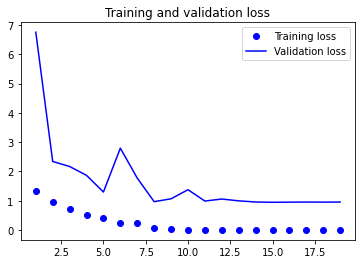

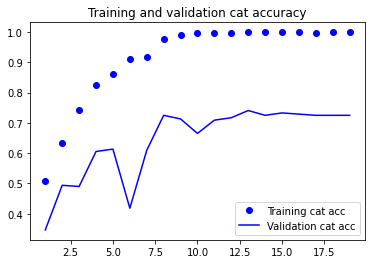

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 48s 14ms/step
Confusion matrix, without normalization
[[458  16  28   2  71  88]
 [ 33 229  90  29  22  49]
 [ 51  66 586  69  38  43]
 [ 19  23  96 838  15   9]
 [ 34  19  14   4 141  56]
 [ 26   3   4   1  11  80]]
              precision    recall  f1-score   support

         bcc       0.74      0.69      0.71       663
         bkl       0.64      0.51      0.57       452
         mel       0.72      0.69      0.70       853
          nv       0.89      0.84      0.86      1000
      others       0.47      0.53      0.50       268
         scc       0.25      0.64      0.36       125

    accuracy                           0.69      3361
   macro avg       0.62      0.65      0.62      3361
weighted avg       0.73      0.69      0.70      3361

Specificity of each class:
bcc : 0.940
bkl : 0.956
mel : 0.907
nv : 0.956
others : 0.949
scc : 0.924


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


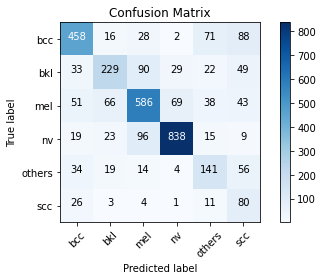

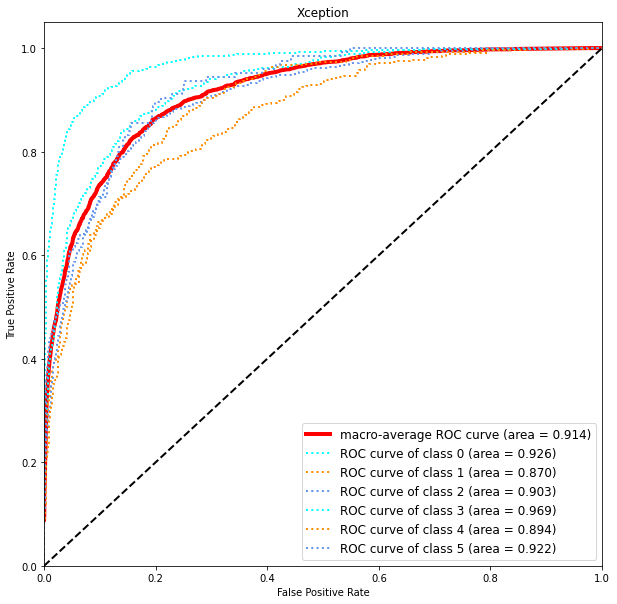

This is samplesize 400 2
Found 2248 images belonging to 6 classes.
Found 251 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
71/71 [==============================] - ETA: 0s - loss: 1.3453 - categorical_accuracy: 0.4791
Epoch 1: val_categorical_accuracy improved from -inf to 0.41833, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 42s 522ms/step - loss: 1.3453 - categorical_accuracy: 0.4791 - val_loss: 2.8961 - val_categorical_accuracy: 0.4183 - lr: 0.0010
Epoch 2/60
71/71 [==============================] - ETA: 0s - loss: 0.9767 - categorical_accuracy: 0.6428
Epoch 2: val_categorical_accuracy improved from 0.41833 to 0.54980, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 36s 505ms/step - loss: 0.9767 - categorical_accuracy: 0.6428 - val_loss: 2.1518 - val_categorical_accuracy: 0.5498

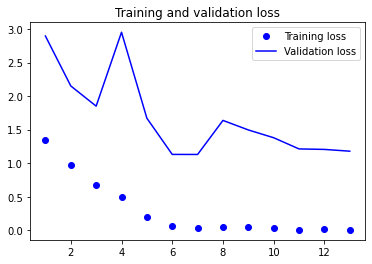

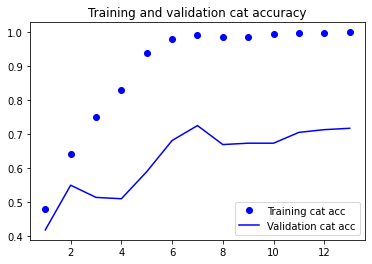

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 48s 14ms/step
Confusion matrix, without normalization
[[477  45  13   2  43  83]
 [ 35 303  21  30  33  30]
 [ 52 290 320  92  65  34]
 [ 17 102  16 840  22   3]
 [ 47  32   8   2 136  43]
 [ 20  10   4   1  14  76]]
              precision    recall  f1-score   support

         bcc       0.74      0.72      0.73       663
         bkl       0.39      0.67      0.49       452
         mel       0.84      0.38      0.52       853
          nv       0.87      0.84      0.85      1000
      others       0.43      0.51      0.47       268
         scc       0.28      0.61      0.39       125

    accuracy                           0.64      3361
   macro avg       0.59      0.62      0.57      3361
weighted avg       0.71      0.64      0.65      3361

Specificity of each class:
bcc : 0.937
bkl : 0.835
mel : 0.975
nv : 0.946
others : 0.943
scc : 0.940


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


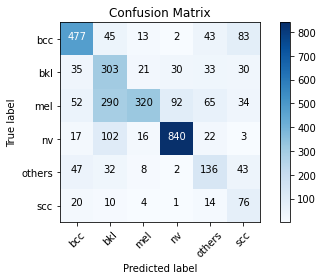

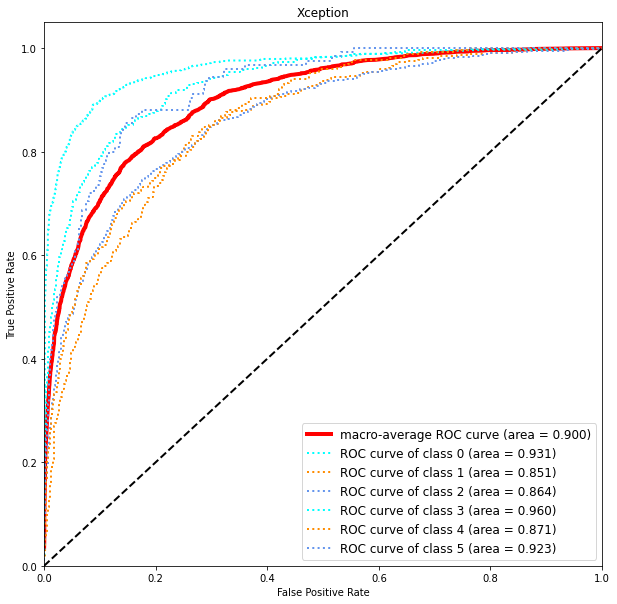

This is samplesize 400 3
Found 2248 images belonging to 6 classes.
Found 251 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
71/71 [==============================] - ETA: 0s - loss: 1.3314 - categorical_accuracy: 0.4849
Epoch 1: val_categorical_accuracy improved from -inf to 0.36653, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 42s 521ms/step - loss: 1.3314 - categorical_accuracy: 0.4849 - val_loss: 2.8640 - val_categorical_accuracy: 0.3665 - lr: 0.0010
Epoch 2/60
71/71 [==============================] - ETA: 0s - loss: 0.9372 - categorical_accuracy: 0.6486
Epoch 2: val_categorical_accuracy improved from 0.36653 to 0.49801, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 36s 504ms/step - loss: 0.9372 - categorical_accuracy: 0.6486 - val_loss: 3.4497 - val_categorical_accuracy: 0.4980

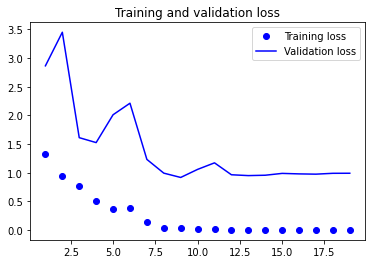

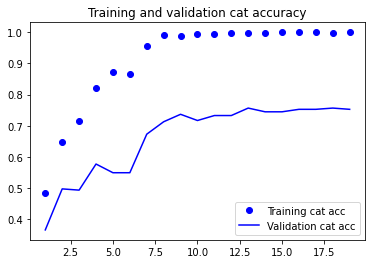

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 48s 14ms/step
Confusion matrix, without normalization
[[439  31  23   0  74  96]
 [ 28 260  62  22  25  55]
 [ 41  82 575  65  41  49]
 [ 22  44  88 827  18   1]
 [ 23  42  18   5 130  50]
 [ 14   5   2   0  11  93]]
              precision    recall  f1-score   support

         bcc       0.77      0.66      0.71       663
         bkl       0.56      0.58      0.57       452
         mel       0.75      0.67      0.71       853
          nv       0.90      0.83      0.86      1000
      others       0.43      0.49      0.46       268
         scc       0.27      0.74      0.40       125

    accuracy                           0.69      3361
   macro avg       0.61      0.66      0.62      3361
weighted avg       0.73      0.69      0.70      3361

Specificity of each class:
bcc : 0.953
bkl : 0.930
mel : 0.923
nv : 0.961
others : 0.945
scc : 0.922


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


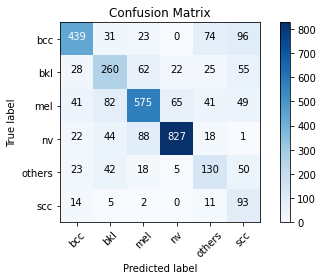

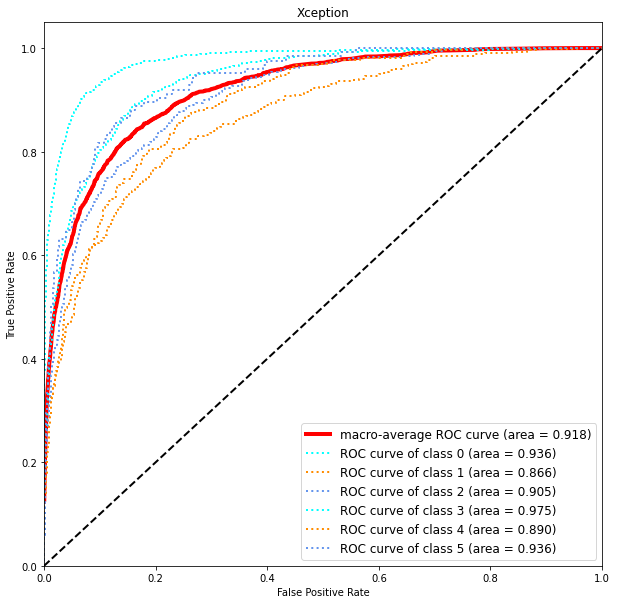

This is samplesize 400 4
Found 2248 images belonging to 6 classes.
Found 251 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
71/71 [==============================] - ETA: 0s - loss: 1.3545 - categorical_accuracy: 0.4862
Epoch 1: val_categorical_accuracy improved from -inf to 0.45817, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 41s 519ms/step - loss: 1.3545 - categorical_accuracy: 0.4862 - val_loss: 2.0780 - val_categorical_accuracy: 0.4582 - lr: 0.0010
Epoch 2/60
71/71 [==============================] - ETA: 0s - loss: 0.9458 - categorical_accuracy: 0.6593
Epoch 2: val_categorical_accuracy did not improve from 0.45817
71/71 [==============================] - 35s 491ms/step - loss: 0.9458 - categorical_accuracy: 0.6593 - val_loss: 3.7846 - val_categorical_accuracy: 0.4223 - lr: 0.0010
Epoch 3/60
71/71 [==============================] 

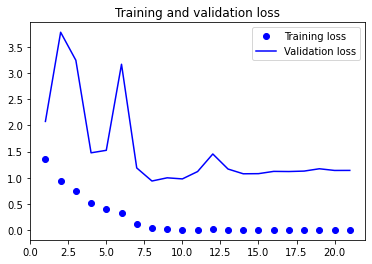

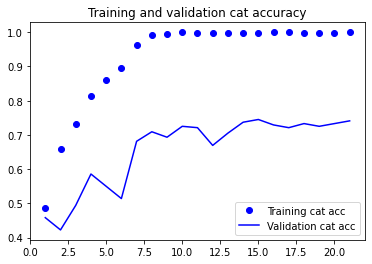

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[406  28  34   7  49 139]
 [ 25 248  67  34  22  56]
 [ 29  84 583  72  29  56]
 [ 15  27  98 841  15   4]
 [ 31  29  15   9 127  57]
 [ 12   3   7   0   6  97]]
              precision    recall  f1-score   support

         bcc       0.78      0.61      0.69       663
         bkl       0.59      0.55      0.57       452
         mel       0.73      0.68      0.70       853
          nv       0.87      0.84      0.86      1000
      others       0.51      0.47      0.49       268
         scc       0.24      0.78      0.36       125

    accuracy                           0.68      3361
   macro avg       0.62      0.66      0.61      3361
weighted avg       0.73      0.68      0.70      3361

Specificity of each class:
bcc : 0.958
bkl : 0.941
mel : 0.912
nv : 0.948
others : 0.961
scc : 0.904


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


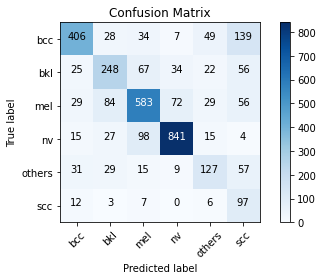

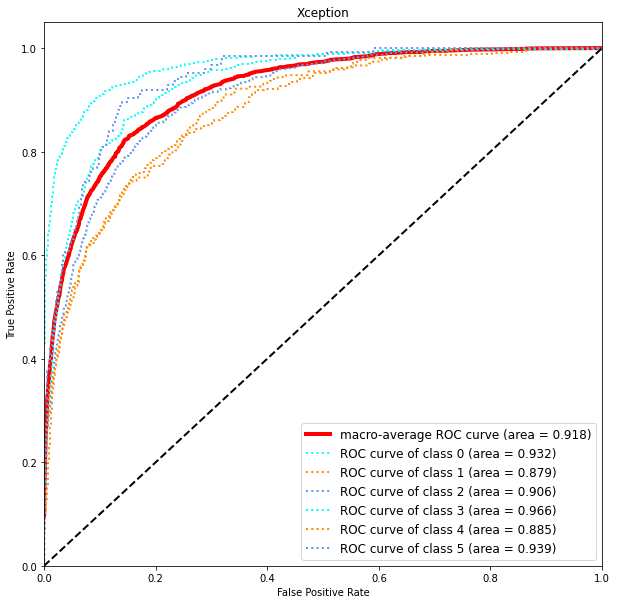

This is samplesize 400 5
Found 2248 images belonging to 6 classes.
Found 251 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
71/71 [==============================] - ETA: 0s - loss: 1.3788 - categorical_accuracy: 0.4733
Epoch 1: val_categorical_accuracy improved from -inf to 0.36255, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 41s 519ms/step - loss: 1.3788 - categorical_accuracy: 0.4733 - val_loss: 3.3578 - val_categorical_accuracy: 0.3625 - lr: 0.0010
Epoch 2/60
71/71 [==============================] - ETA: 0s - loss: 0.9639 - categorical_accuracy: 0.6250
Epoch 2: val_categorical_accuracy improved from 0.36255 to 0.39442, saving model to Model/Skin Lesion 299 Random resize 92%.h5
71/71 [==============================] - 36s 502ms/step - loss: 0.9639 - categorical_accuracy: 0.6250 - val_loss: 3.6469 - val_categorical_accuracy: 0.3944

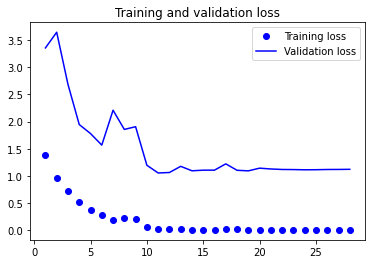

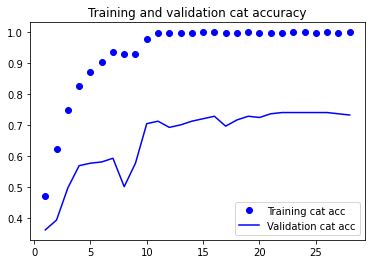

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 13ms/step
Confusion matrix, without normalization
[[409  49  29   6  40 130]
 [ 31 259  65  31  13  53]
 [ 43 100 548  72  33  57]
 [ 22  33  85 836  18   6]
 [ 35  41  11   5 107  69]
 [ 13   4   6   0  12  90]]
              precision    recall  f1-score   support

         bcc       0.74      0.62      0.67       663
         bkl       0.53      0.57      0.55       452
         mel       0.74      0.64      0.69       853
          nv       0.88      0.84      0.86      1000
      others       0.48      0.40      0.44       268
         scc       0.22      0.72      0.34       125

    accuracy                           0.67      3361
   macro avg       0.60      0.63      0.59      3361
weighted avg       0.71      0.67      0.68      3361

Specificity of each class:
bcc : 0.947
bkl : 0.922
mel : 0.922
nv : 0.952
others : 0.962
scc : 0.903


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


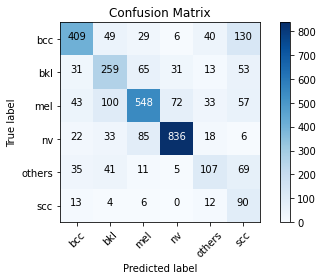

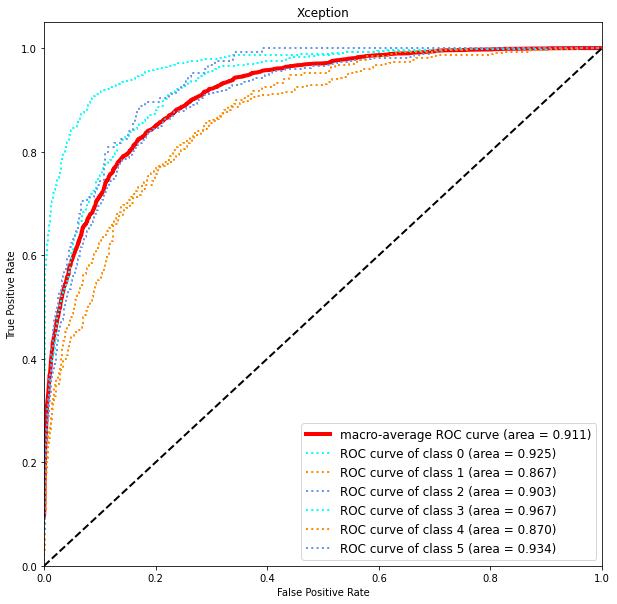

In [ ]:
train_model(400)

bcc       720
others    720
nv        720
mel       720
bkl       720
scc       452
Name: dx, dtype: int64
mel       80
nv        80
others    80
bkl       80
bcc       80
scc       51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:06<00:00, 50.17it/s]


This is samplesize 800 1
Found 4052 images belonging to 6 classes.
Found 451 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
127/127 [==============================] - ETA: 0s - loss: 1.2455 - categorical_accuracy: 0.5197
Epoch 1: val_categorical_accuracy improved from -inf to 0.53437, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 71s 520ms/step - loss: 1.2455 - categorical_accuracy: 0.5197 - val_loss: 1.5470 - val_categorical_accuracy: 0.5344 - lr: 0.0010
Epoch 2/60
127/127 [==============================] - ETA: 0s - loss: 0.9388 - categorical_accuracy: 0.6555
Epoch 2: val_categorical_accuracy did not improve from 0.53437
127/127 [==============================] - 63s 490ms/step - loss: 0.9388 - categorical_accuracy: 0.6555 - val_loss: 1.4755 - val_categorical_accuracy: 0.5144 - lr: 0.0010
Epoch 3/60
127/127 [======================

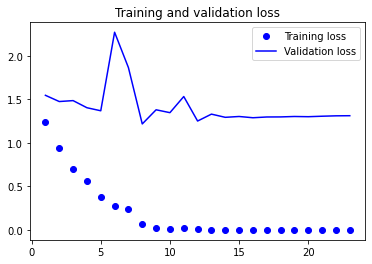

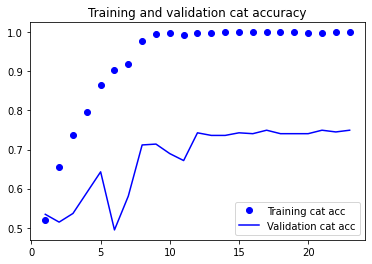

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[449  33  37   5  78  61]
 [ 24 283  54  29  40  22]
 [ 45  88 595  66  45  14]
 [ 13  30  73 869  15   0]
 [ 28  20  17   3 180  20]
 [ 15   5   7   2  13  83]]
              precision    recall  f1-score   support

         bcc       0.78      0.68      0.73       663
         bkl       0.62      0.63      0.62       452
         mel       0.76      0.70      0.73       853
          nv       0.89      0.87      0.88      1000
      others       0.49      0.67      0.56       268
         scc       0.41      0.66      0.51       125

    accuracy                           0.73      3361
   macro avg       0.66      0.70      0.67      3361
weighted avg       0.75      0.73      0.74      3361

Specificity of each class:
bcc : 0.954
bkl : 0.939
mel : 0.925
nv : 0.956
others : 0.938
scc : 0.964


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


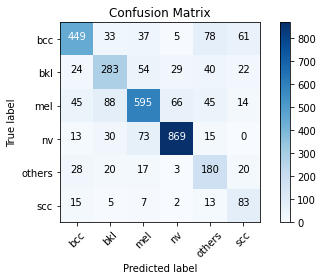

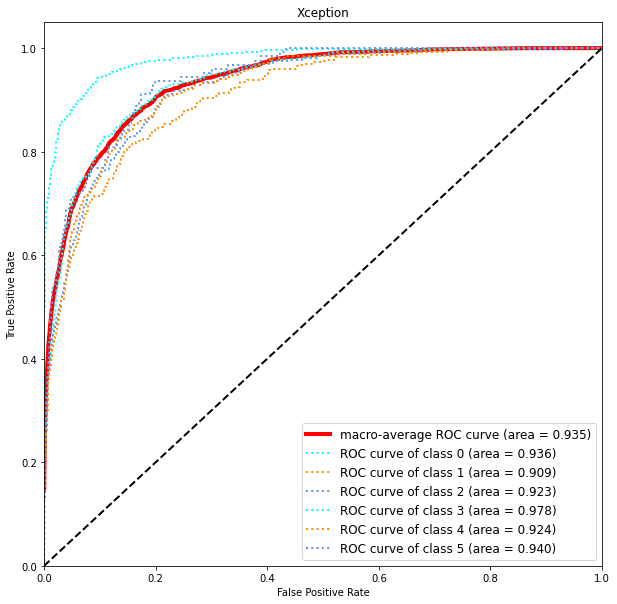

This is samplesize 800 2
Found 4052 images belonging to 6 classes.
Found 451 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
127/127 [==============================] - ETA: 0s - loss: 1.2617 - categorical_accuracy: 0.5101
Epoch 1: val_categorical_accuracy improved from -inf to 0.45455, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 69s 508ms/step - loss: 1.2617 - categorical_accuracy: 0.5101 - val_loss: 5.2119 - val_categorical_accuracy: 0.4545 - lr: 0.0010
Epoch 2/60
127/127 [==============================] - ETA: 0s - loss: 0.9390 - categorical_accuracy: 0.6417
Epoch 2: val_categorical_accuracy improved from 0.45455 to 0.56541, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 64s 498ms/step - loss: 0.9390 - categorical_accuracy: 0.6417 - val_loss: 1.7148 - val_categorical_accuracy

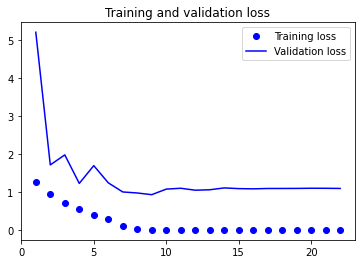

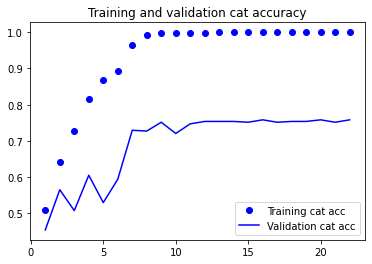

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 13ms/step
Confusion matrix, without normalization
[[435  31  27   1 101  68]
 [ 26 294  57  22  33  20]
 [ 27  80 624  56  51  15]
 [ 11  39  89 843  15   3]
 [ 22  16  12   5 188  25]
 [  8   6   7   2  13  89]]
              precision    recall  f1-score   support

         bcc       0.82      0.66      0.73       663
         bkl       0.63      0.65      0.64       452
         mel       0.76      0.73      0.75       853
          nv       0.91      0.84      0.87      1000
      others       0.47      0.70      0.56       268
         scc       0.40      0.71      0.52       125

    accuracy                           0.74      3361
   macro avg       0.67      0.72      0.68      3361
weighted avg       0.76      0.74      0.74      3361

Specificity of each class:
bcc : 0.965
bkl : 0.941
mel : 0.923
nv : 0.964
others : 0.931
scc : 0.960


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


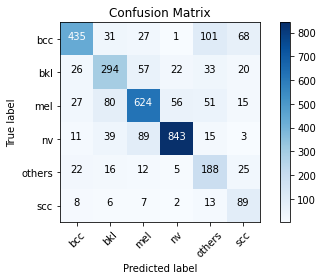

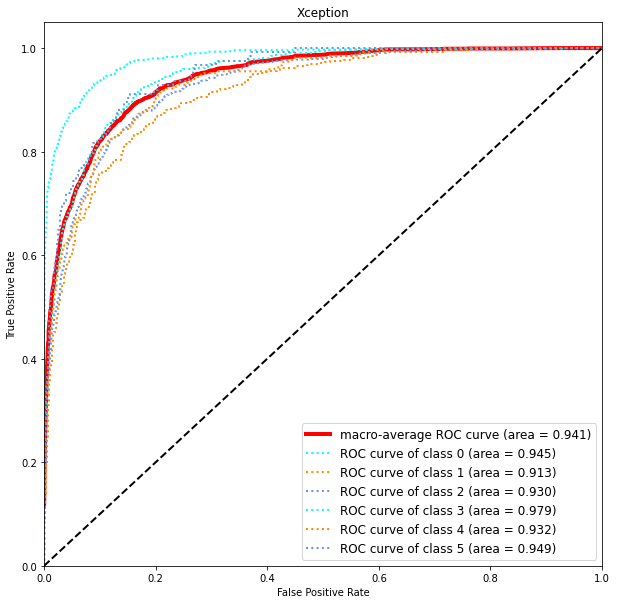

This is samplesize 800 3
Found 4052 images belonging to 6 classes.
Found 451 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
127/127 [==============================] - ETA: 0s - loss: 1.2675 - categorical_accuracy: 0.5111
Epoch 1: val_categorical_accuracy improved from -inf to 0.47228, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 69s 509ms/step - loss: 1.2675 - categorical_accuracy: 0.5111 - val_loss: 2.0427 - val_categorical_accuracy: 0.4723 - lr: 0.0010
Epoch 2/60
127/127 [==============================] - ETA: 0s - loss: 0.9388 - categorical_accuracy: 0.6476
Epoch 2: val_categorical_accuracy improved from 0.47228 to 0.53215, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 64s 500ms/step - loss: 0.9388 - categorical_accuracy: 0.6476 - val_loss: 1.6141 - val_categorical_accuracy

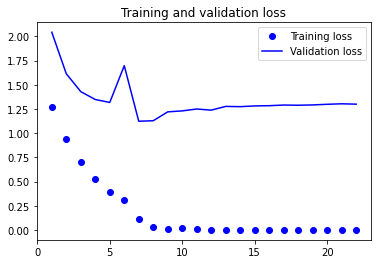

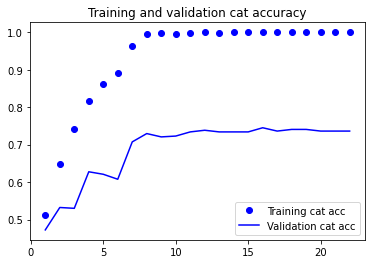

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 13ms/step
Confusion matrix, without normalization
[[449  39  31   0  83  61]
 [ 31 284  50  27  33  27]
 [ 41  87 596  58  47  24]
 [ 14  29  83 856  16   2]
 [ 20  22  11   0 185  30]
 [ 18   5   6   0  14  82]]
              precision    recall  f1-score   support

         bcc       0.78      0.68      0.73       663
         bkl       0.61      0.63      0.62       452
         mel       0.77      0.70      0.73       853
          nv       0.91      0.86      0.88      1000
      others       0.49      0.69      0.57       268
         scc       0.36      0.66      0.47       125

    accuracy                           0.73      3361
   macro avg       0.65      0.70      0.67      3361
weighted avg       0.75      0.73      0.74      3361

Specificity of each class:
bcc : 0.954
bkl : 0.937
mel : 0.928
nv : 0.964
others : 0.938
scc : 0.956


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


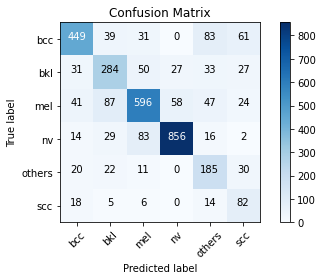

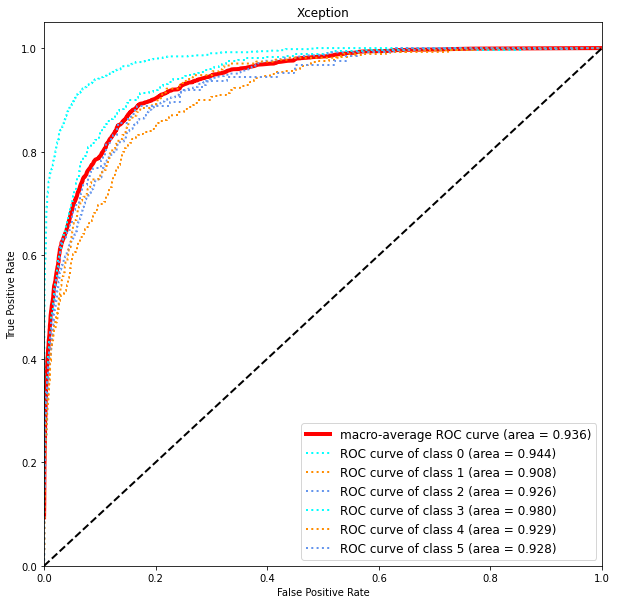

This is samplesize 800 4
Found 4052 images belonging to 6 classes.
Found 451 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
127/127 [==============================] - ETA: 0s - loss: 1.2628 - categorical_accuracy: 0.5148
Epoch 1: val_categorical_accuracy improved from -inf to 0.49002, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 69s 507ms/step - loss: 1.2628 - categorical_accuracy: 0.5148 - val_loss: 2.0309 - val_categorical_accuracy: 0.4900 - lr: 0.0010
Epoch 2/60
127/127 [==============================] - ETA: 0s - loss: 0.9582 - categorical_accuracy: 0.6454
Epoch 2: val_categorical_accuracy did not improve from 0.49002
127/127 [==============================] - 63s 491ms/step - loss: 0.9582 - categorical_accuracy: 0.6454 - val_loss: 2.0141 - val_categorical_accuracy: 0.4124 - lr: 0.0010
Epoch 3/60
127/127 [======================

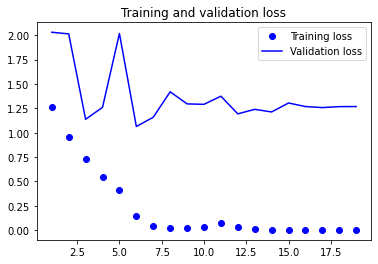

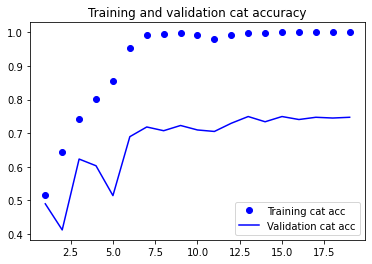

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 47s 14ms/step
Confusion matrix, without normalization
[[392  28  35   6 128  74]
 [ 21 273  39  46  48  25]
 [ 27  63 594  92  62  15]
 [  9  20  53 904  13   1]
 [ 14  16  10   4 199  25]
 [ 12   3   8   1  17  84]]
              precision    recall  f1-score   support

         bcc       0.83      0.59      0.69       663
         bkl       0.68      0.60      0.64       452
         mel       0.80      0.70      0.75       853
          nv       0.86      0.90      0.88      1000
      others       0.43      0.74      0.54       268
         scc       0.38      0.67      0.48       125

    accuracy                           0.73      3361
   macro avg       0.66      0.70      0.66      3361
weighted avg       0.76      0.73      0.73      3361

Specificity of each class:
bcc : 0.969
bkl : 0.955
mel : 0.942
nv : 0.937
others : 0.913
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


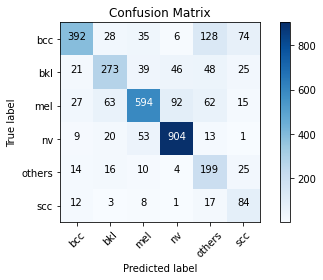

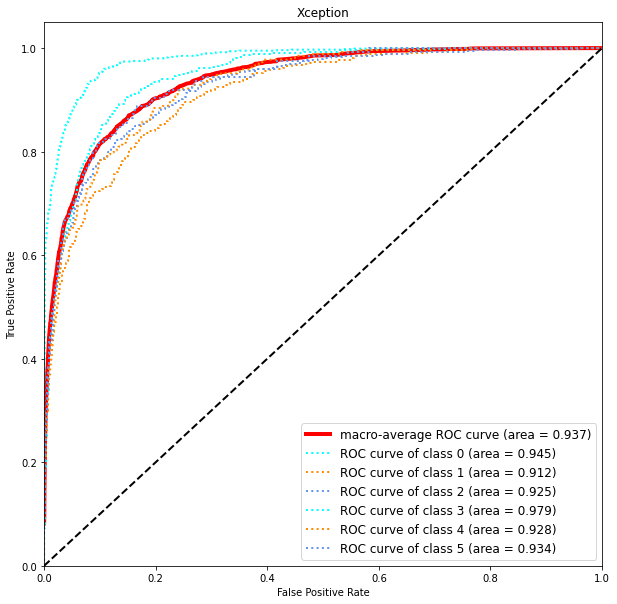

This is samplesize 800 5
Found 4052 images belonging to 6 classes.
Found 451 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
127/127 [==============================] - ETA: 0s - loss: 1.2559 - categorical_accuracy: 0.5131
Epoch 1: val_categorical_accuracy improved from -inf to 0.49889, saving model to Model/Skin Lesion 299 Random resize 92%.h5
127/127 [==============================] - 69s 508ms/step - loss: 1.2559 - categorical_accuracy: 0.5131 - val_loss: 2.0274 - val_categorical_accuracy: 0.4989 - lr: 0.0010
Epoch 2/60
127/127 [==============================] - ETA: 0s - loss: 0.9348 - categorical_accuracy: 0.6542
Epoch 2: val_categorical_accuracy did not improve from 0.49889
127/127 [==============================] - 63s 491ms/step - loss: 0.9348 - categorical_accuracy: 0.6542 - val_loss: 2.4480 - val_categorical_accuracy: 0.3481 - lr: 0.0010
Epoch 3/60
127/127 [======================

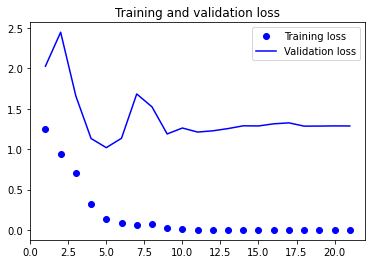

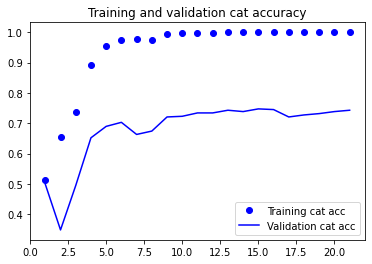

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 47s 14ms/step
Confusion matrix, without normalization
[[450  18  27   2  99  67]
 [ 27 290  51  22  37  25]
 [ 41  86 608  53  46  19]
 [ 12  41  83 844  19   1]
 [ 26  17  13   3 182  27]
 [ 13   5  10   0  12  85]]
              precision    recall  f1-score   support

         bcc       0.79      0.68      0.73       663
         bkl       0.63      0.64      0.64       452
         mel       0.77      0.71      0.74       853
          nv       0.91      0.84      0.88      1000
      others       0.46      0.68      0.55       268
         scc       0.38      0.68      0.49       125

    accuracy                           0.73      3361
   macro avg       0.66      0.71      0.67      3361
weighted avg       0.76      0.73      0.74      3361

Specificity of each class:
bcc : 0.956
bkl : 0.943
mel : 0.927
nv : 0.966
others : 0.931
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


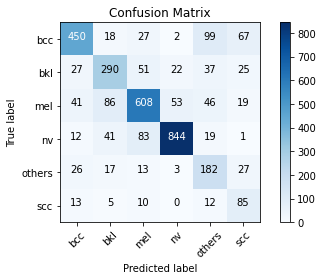

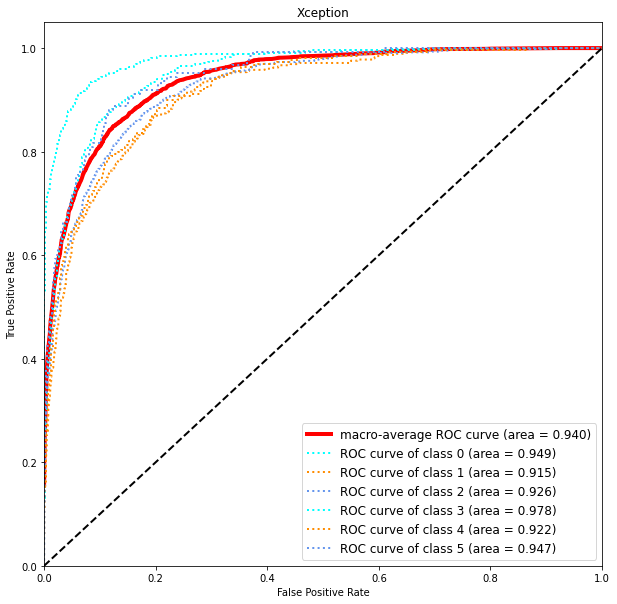

In [ ]:
train_model(800)

nv        1080
bcc       1080
mel       1080
bkl       1080
others     982
scc        452
Name: dx, dtype: int64
mel       120
nv        120
bkl       120
bcc       120
others    109
scc        51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:05<00:00, 50.95it/s]


This is samplesize 1200 1
Found 5754 images belonging to 6 classes.
Found 640 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
180/180 [==============================] - ETA: 0s - loss: 1.2302 - categorical_accuracy: 0.5322
Epoch 1: val_categorical_accuracy improved from -inf to 0.46094, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 143s 765ms/step - loss: 1.2302 - categorical_accuracy: 0.5322 - val_loss: 2.7808 - val_categorical_accuracy: 0.4609 - lr: 0.0010
Epoch 2/60
180/180 [==============================] - ETA: 0s - loss: 0.9287 - categorical_accuracy: 0.6495
Epoch 2: val_categorical_accuracy improved from 0.46094 to 0.48750, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 135s 751ms/step - loss: 0.9287 - categorical_accuracy: 0.6495 - val_loss: 1.4670 - val_categorical_accur

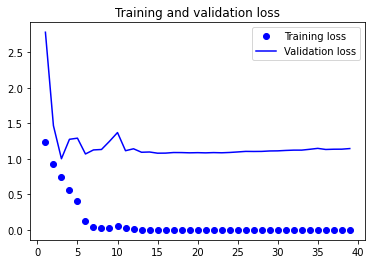

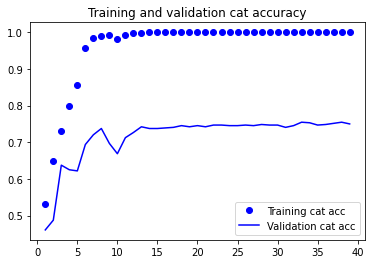

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[509  25  27   1  78  23]
 [ 21 307  37  31  40  16]
 [ 40  77 609  70  43  14]
 [  8  28  57 894  11   2]
 [ 26  13   8   5 200  16]
 [ 18   4   3   1  18  81]]
              precision    recall  f1-score   support

         bcc       0.82      0.77      0.79       663
         bkl       0.68      0.68      0.68       452
         mel       0.82      0.71      0.76       853
          nv       0.89      0.89      0.89      1000
      others       0.51      0.75      0.61       268
         scc       0.53      0.65      0.58       125

    accuracy                           0.77      3361
   macro avg       0.71      0.74      0.72      3361
weighted avg       0.79      0.77      0.78      3361

Specificity of each class:
bcc : 0.958
bkl : 0.949
mel : 0.947
nv : 0.954
others : 0.939
scc : 0.978


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


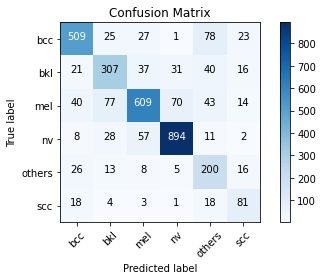

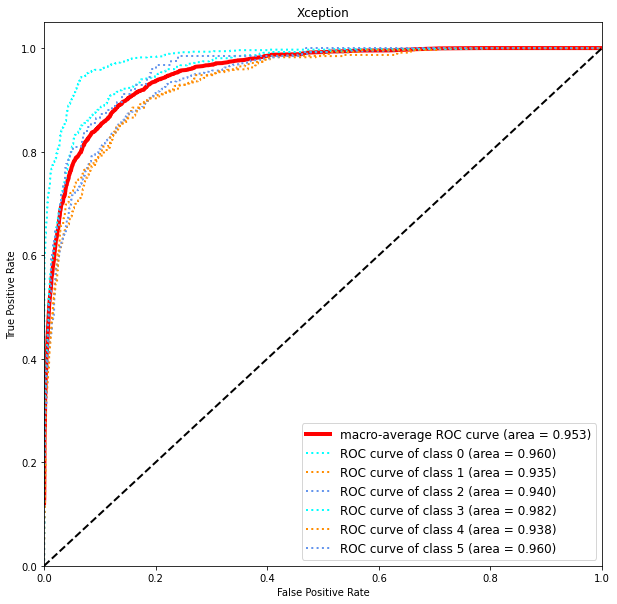

This is samplesize 1200 2
Found 5754 images belonging to 6 classes.
Found 640 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
180/180 [==============================] - ETA: 0s - loss: 1.2085 - categorical_accuracy: 0.5275
Epoch 1: val_categorical_accuracy improved from -inf to 0.33594, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 141s 757ms/step - loss: 1.2085 - categorical_accuracy: 0.5275 - val_loss: 5.7903 - val_categorical_accuracy: 0.3359 - lr: 0.0010
Epoch 2/60
180/180 [==============================] - ETA: 0s - loss: 0.9313 - categorical_accuracy: 0.6502
Epoch 2: val_categorical_accuracy improved from 0.33594 to 0.57500, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 136s 752ms/step - loss: 0.9313 - categorical_accuracy: 0.6502 - val_loss: 1.3263 - val_categorical_accur

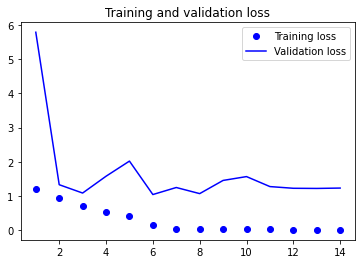

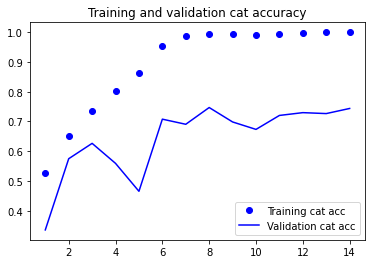

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[449  34  27   3  92  58]
 [ 21 298  35  34  45  19]
 [ 20  77 606  56  67  27]
 [  6  16  73 892  11   2]
 [ 14  12   7   1 212  22]
 [ 13   3   4   1  20  84]]
              precision    recall  f1-score   support

         bcc       0.86      0.68      0.76       663
         bkl       0.68      0.66      0.67       452
         mel       0.81      0.71      0.76       853
          nv       0.90      0.89      0.90      1000
      others       0.47      0.79      0.59       268
         scc       0.40      0.67      0.50       125

    accuracy                           0.76      3361
   macro avg       0.69      0.73      0.69      3361
weighted avg       0.79      0.76      0.76      3361

Specificity of each class:
bcc : 0.973
bkl : 0.951
mel : 0.942
nv : 0.960
others : 0.924
scc : 0.960


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


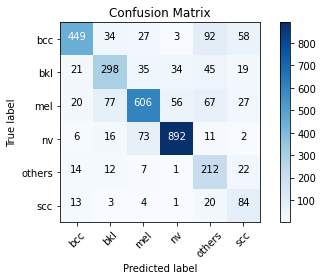

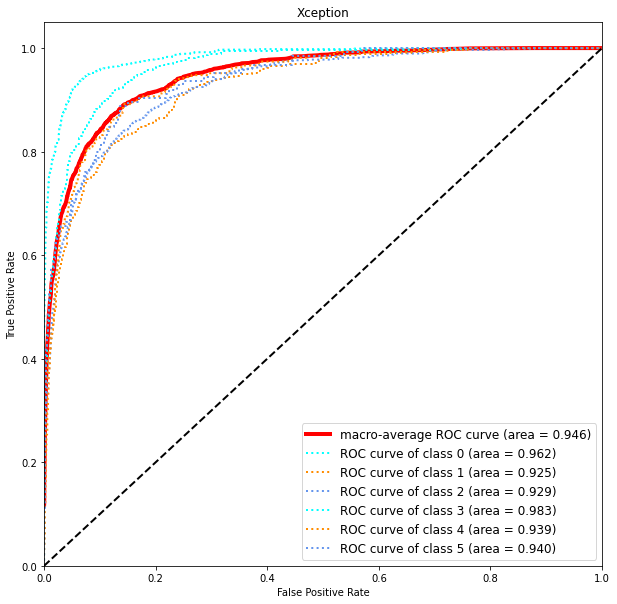

This is samplesize 1200 3
Found 5754 images belonging to 6 classes.
Found 640 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
180/180 [==============================] - ETA: 0s - loss: 1.2169 - categorical_accuracy: 0.5236
Epoch 1: val_categorical_accuracy improved from -inf to 0.47969, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 141s 758ms/step - loss: 1.2169 - categorical_accuracy: 0.5236 - val_loss: 1.3799 - val_categorical_accuracy: 0.4797 - lr: 0.0010
Epoch 2/60
180/180 [==============================] - ETA: 0s - loss: 0.9209 - categorical_accuracy: 0.6582
Epoch 2: val_categorical_accuracy did not improve from 0.47969
180/180 [==============================] - 135s 746ms/step - loss: 0.9209 - categorical_accuracy: 0.6582 - val_loss: 2.4266 - val_categorical_accuracy: 0.3984 - lr: 0.0010
Epoch 3/60
180/180 [===================

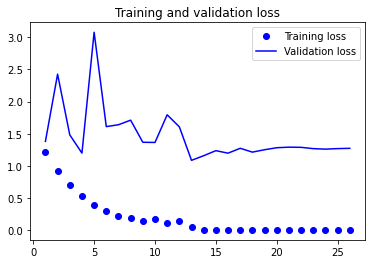

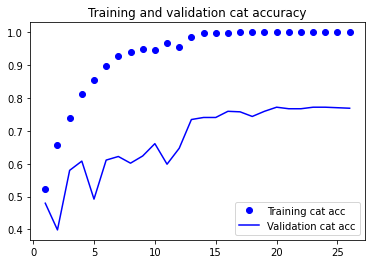

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 13ms/step
Confusion matrix, without normalization
[[515  19  29   1  76  23]
 [ 23 299  47  25  41  17]
 [ 36  80 630  40  59   8]
 [ 15  24  75 869  14   3]
 [ 27  13  10   3 204  11]
 [ 14   9   7   1  18  76]]
              precision    recall  f1-score   support

         bcc       0.82      0.78      0.80       663
         bkl       0.67      0.66      0.67       452
         mel       0.79      0.74      0.76       853
          nv       0.93      0.87      0.90      1000
      others       0.50      0.76      0.60       268
         scc       0.55      0.61      0.58       125

    accuracy                           0.77      3361
   macro avg       0.71      0.74      0.72      3361
weighted avg       0.79      0.77      0.78      3361

Specificity of each class:
bcc : 0.957
bkl : 0.950
mel : 0.933
nv : 0.970
others : 0.933
scc : 0.981


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


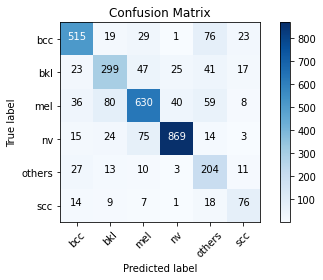

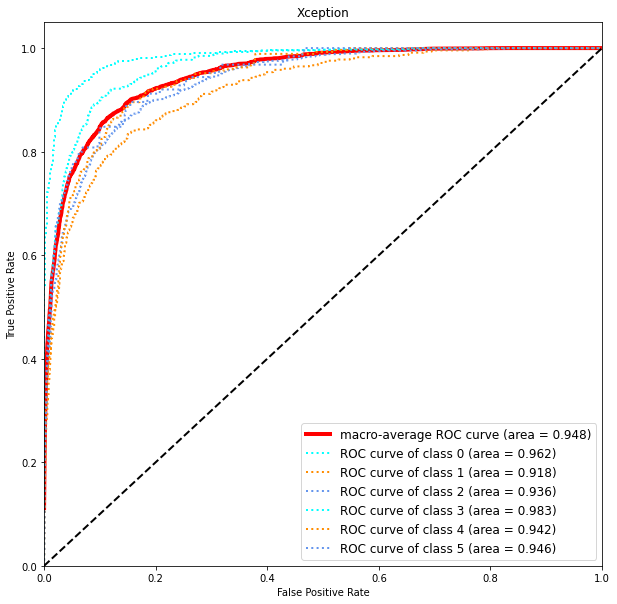

This is samplesize 1200 4
Found 5754 images belonging to 6 classes.
Found 640 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
180/180 [==============================] - ETA: 0s - loss: 1.2247 - categorical_accuracy: 0.5353
Epoch 1: val_categorical_accuracy improved from -inf to 0.45781, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 141s 756ms/step - loss: 1.2247 - categorical_accuracy: 0.5353 - val_loss: 1.6489 - val_categorical_accuracy: 0.4578 - lr: 0.0010
Epoch 2/60
180/180 [==============================] - ETA: 0s - loss: 0.9252 - categorical_accuracy: 0.6521
Epoch 2: val_categorical_accuracy did not improve from 0.45781
180/180 [==============================] - 135s 746ms/step - loss: 0.9252 - categorical_accuracy: 0.6521 - val_loss: 1.7326 - val_categorical_accuracy: 0.4531 - lr: 0.0010
Epoch 3/60
180/180 [===================

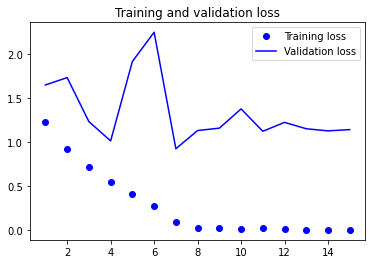

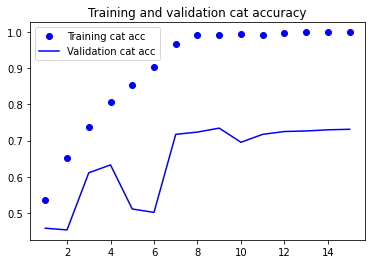

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 47s 14ms/step
Confusion matrix, without normalization
[[476  11  31   3 127  15]
 [ 20 243  89  25  61  14]
 [ 20  36 686  33  71   7]
 [ 14  23 116 834  10   3]
 [ 18  11  16   7 211   5]
 [ 16   5   8   2  31  63]]
              precision    recall  f1-score   support

         bcc       0.84      0.72      0.78       663
         bkl       0.74      0.54      0.62       452
         mel       0.73      0.80      0.76       853
          nv       0.92      0.83      0.88      1000
      others       0.41      0.79      0.54       268
         scc       0.59      0.50      0.54       125

    accuracy                           0.75      3361
   macro avg       0.71      0.70      0.69      3361
weighted avg       0.78      0.75      0.75      3361

Specificity of each class:
bcc : 0.967
bkl : 0.970
mel : 0.896
nv : 0.970
others : 0.903
scc : 0.986


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


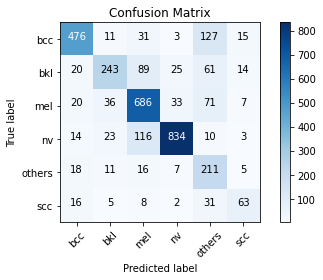

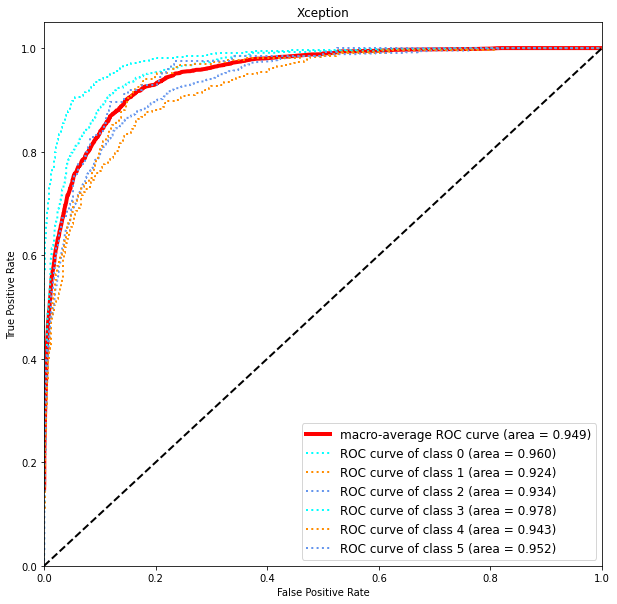

This is samplesize 1200 5
Found 5754 images belonging to 6 classes.
Found 640 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
180/180 [==============================] - ETA: 0s - loss: 1.2325 - categorical_accuracy: 0.5288
Epoch 1: val_categorical_accuracy improved from -inf to 0.40625, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 141s 756ms/step - loss: 1.2325 - categorical_accuracy: 0.5288 - val_loss: 2.4404 - val_categorical_accuracy: 0.4062 - lr: 0.0010
Epoch 2/60
180/180 [==============================] - ETA: 0s - loss: 0.9821 - categorical_accuracy: 0.6347
Epoch 2: val_categorical_accuracy improved from 0.40625 to 0.48750, saving model to Model/Skin Lesion 299 Random resize 92%.h5
180/180 [==============================] - 135s 751ms/step - loss: 0.9821 - categorical_accuracy: 0.6347 - val_loss: 1.7213 - val_categorical_accur

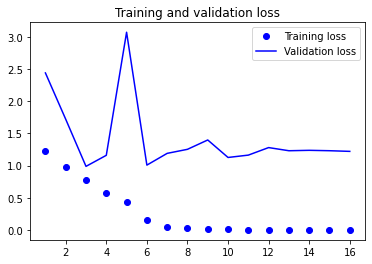

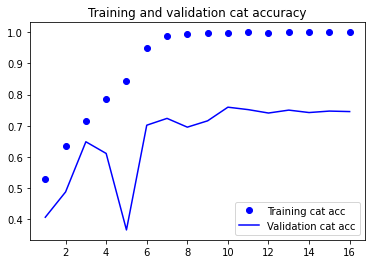

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[479  35  26   5  85  33]
 [ 15 317  43  22  44  11]
 [ 24  81 644  30  61  13]
 [ 12  48  91 840   9   0]
 [ 17  18   5   2 210  16]
 [ 15  14  12   0  13  71]]
              precision    recall  f1-score   support

         bcc       0.85      0.72      0.78       663
         bkl       0.62      0.70      0.66       452
         mel       0.78      0.75      0.77       853
          nv       0.93      0.84      0.88      1000
      others       0.50      0.78      0.61       268
         scc       0.49      0.57      0.53       125

    accuracy                           0.76      3361
   macro avg       0.70      0.73      0.70      3361
weighted avg       0.79      0.76      0.77      3361

Specificity of each class:
bcc : 0.969
bkl : 0.933
mel : 0.929
nv : 0.975
others : 0.931
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


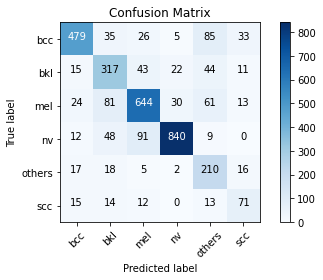

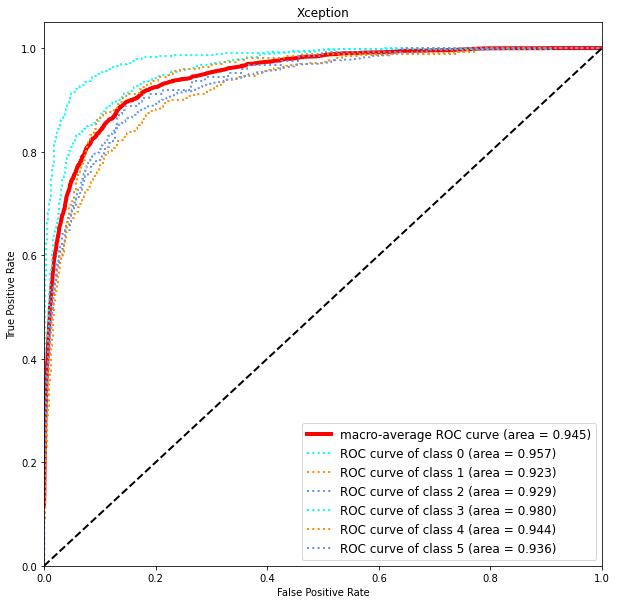

In [ ]:
train_model(1200)

nv        1440
mel       1440
bkl       1440
bcc       1440
others     982
scc        452
Name: dx, dtype: int64
nv        160
mel       160
bkl       160
bcc       160
others    109
scc        51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:00<00:00, 55.66it/s]


This is samplesize 1600 1
Found 7194 images belonging to 6 classes.
Found 800 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
225/225 [==============================] - ETA: 0s - loss: 1.1588 - categorical_accuracy: 0.5589
Epoch 1: val_categorical_accuracy improved from -inf to 0.55625, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 184s 793ms/step - loss: 1.1588 - categorical_accuracy: 0.5589 - val_loss: 1.8708 - val_categorical_accuracy: 0.5562 - lr: 0.0010
Epoch 2/60
225/225 [==============================] - ETA: 0s - loss: 0.8927 - categorical_accuracy: 0.6637
Epoch 2: val_categorical_accuracy improved from 0.55625 to 0.61750, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 169s 751ms/step - loss: 0.8927 - categorical_accuracy: 0.6637 - val_loss: 1.0207 - val_categorical_accur

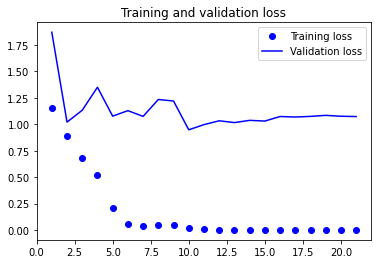

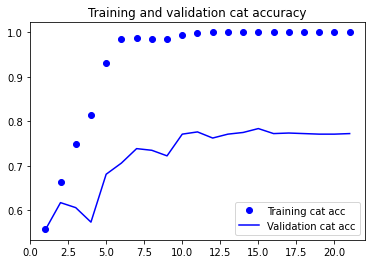

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[556  19  27   0  47  14]
 [ 25 339  32  19  24  13]
 [ 31  66 656  45  41  14]
 [ 11  38  54 891   6   0]
 [ 29  21   8   7 186  17]
 [ 19   6   8   1  10  81]]
              precision    recall  f1-score   support

         bcc       0.83      0.84      0.83       663
         bkl       0.69      0.75      0.72       452
         mel       0.84      0.77      0.80       853
          nv       0.93      0.89      0.91      1000
      others       0.59      0.69      0.64       268
         scc       0.58      0.65      0.61       125

    accuracy                           0.81      3361
   macro avg       0.74      0.77      0.75      3361
weighted avg       0.81      0.81      0.81      3361

Specificity of each class:
bcc : 0.957
bkl : 0.948
mel : 0.949
nv : 0.970
others : 0.959
scc : 0.982


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


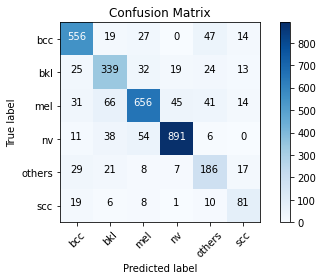

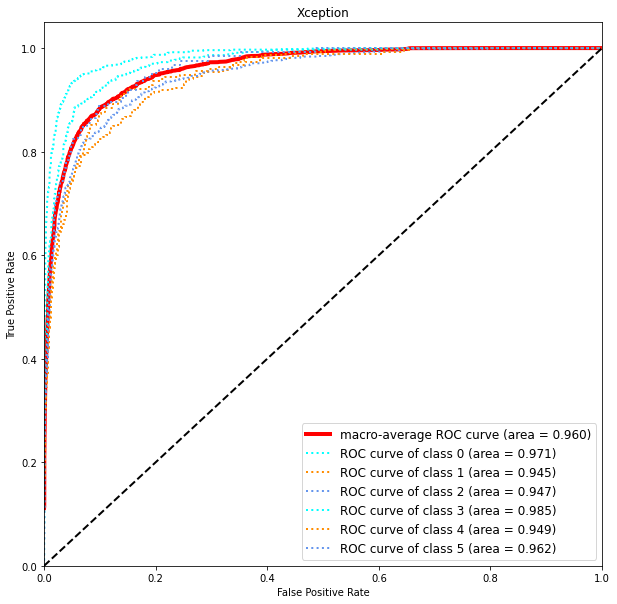

This is samplesize 1600 2
Found 7194 images belonging to 6 classes.
Found 800 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
225/225 [==============================] - ETA: 0s - loss: 1.1799 - categorical_accuracy: 0.5453
Epoch 1: val_categorical_accuracy improved from -inf to 0.44625, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 175s 756ms/step - loss: 1.1799 - categorical_accuracy: 0.5453 - val_loss: 7.8892 - val_categorical_accuracy: 0.4462 - lr: 0.0010
Epoch 2/60
225/225 [==============================] - ETA: 0s - loss: 0.9013 - categorical_accuracy: 0.6571
Epoch 2: val_categorical_accuracy improved from 0.44625 to 0.53875, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 169s 750ms/step - loss: 0.9013 - categorical_accuracy: 0.6571 - val_loss: 1.4635 - val_categorical_accur

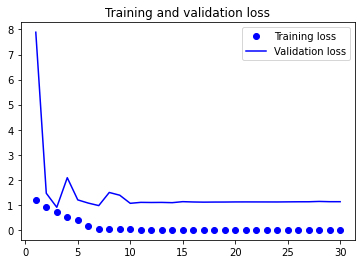

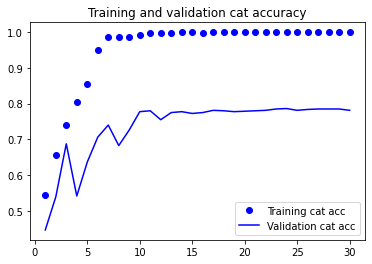

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 14ms/step
Confusion matrix, without normalization
[[544  23  27   1  55  13]
 [ 26 336  38  20  23   9]
 [ 37  64 648  50  39  15]
 [ 10  35  62 887   4   2]
 [ 30  20   7   2 194  15]
 [ 20   2   6   0  16  81]]
              precision    recall  f1-score   support

         bcc       0.82      0.82      0.82       663
         bkl       0.70      0.74      0.72       452
         mel       0.82      0.76      0.79       853
          nv       0.92      0.89      0.91      1000
      others       0.59      0.72      0.65       268
         scc       0.60      0.65      0.62       125

    accuracy                           0.80      3361
   macro avg       0.74      0.76      0.75      3361
weighted avg       0.81      0.80      0.80      3361

Specificity of each class:
bcc : 0.954
bkl : 0.950
mel : 0.944
nv : 0.969
others : 0.956
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


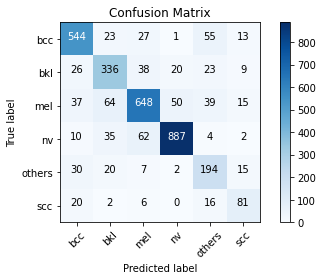

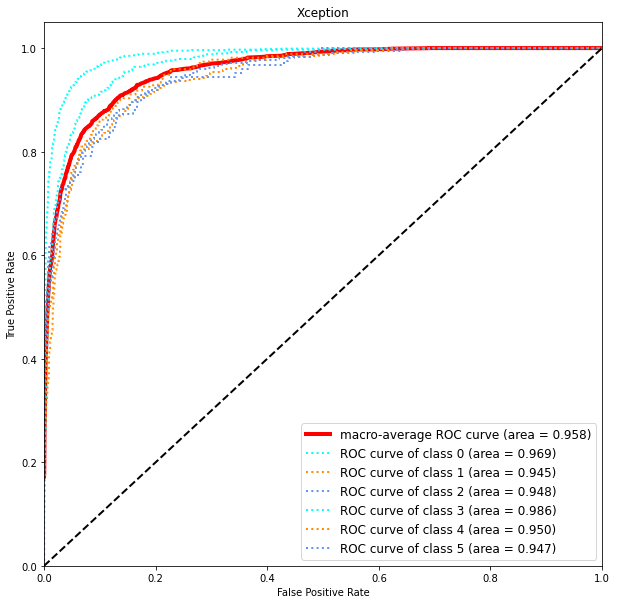

This is samplesize 1600 3
Found 7194 images belonging to 6 classes.
Found 800 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
225/225 [==============================] - ETA: 0s - loss: 1.1541 - categorical_accuracy: 0.5531
Epoch 1: val_categorical_accuracy improved from -inf to 0.61625, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 175s 756ms/step - loss: 1.1541 - categorical_accuracy: 0.5531 - val_loss: 1.0737 - val_categorical_accuracy: 0.6162 - lr: 0.0010
Epoch 2/60
225/225 [==============================] - ETA: 0s - loss: 0.8619 - categorical_accuracy: 0.6672
Epoch 2: val_categorical_accuracy did not improve from 0.61625
225/225 [==============================] - 168s 747ms/step - loss: 0.8619 - categorical_accuracy: 0.6672 - val_loss: 1.2545 - val_categorical_accuracy: 0.5412 - lr: 0.0010
Epoch 3/60
225/225 [===================

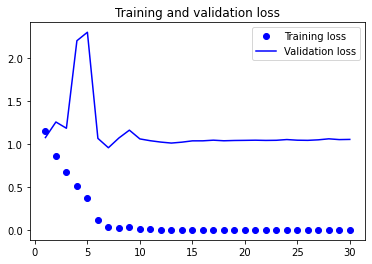

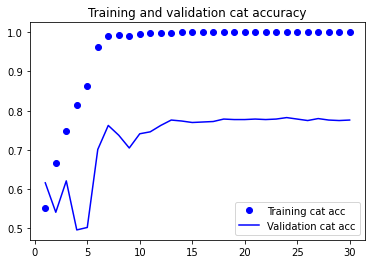

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 45s 13ms/step
Confusion matrix, without normalization
[[554  18  23   2  47  19]
 [ 22 324  39  24  30  13]
 [ 41  74 634  61  35   8]
 [ 11  31  69 881   7   1]
 [ 33  16   9   4 193  13]
 [ 24   7   5   1  14  74]]
              precision    recall  f1-score   support

         bcc       0.81      0.84      0.82       663
         bkl       0.69      0.72      0.70       452
         mel       0.81      0.74      0.78       853
          nv       0.91      0.88      0.89      1000
      others       0.59      0.72      0.65       268
         scc       0.58      0.59      0.58       125

    accuracy                           0.79      3361
   macro avg       0.73      0.75      0.74      3361
weighted avg       0.80      0.79      0.79      3361

Specificity of each class:
bcc : 0.951
bkl : 0.950
mel : 0.942
nv : 0.961
others : 0.957
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


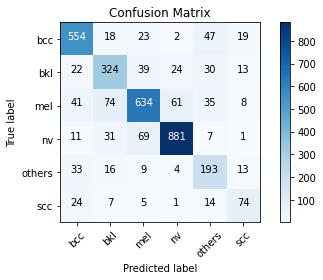

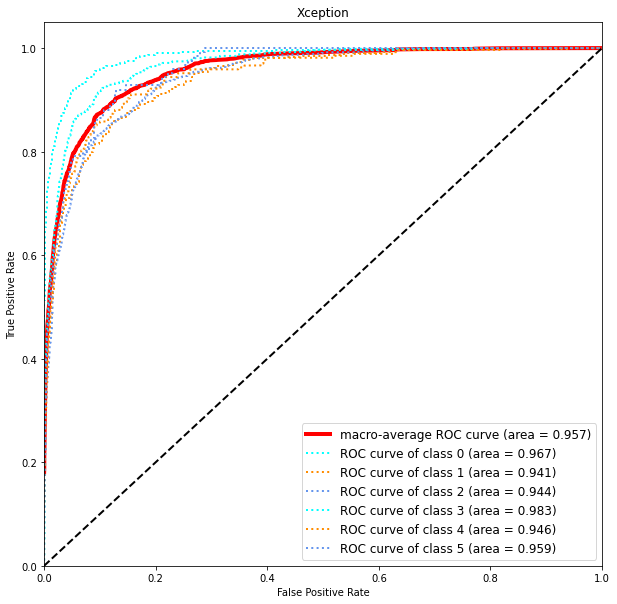

This is samplesize 1600 4
Found 7194 images belonging to 6 classes.
Found 800 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
225/225 [==============================] - ETA: 0s - loss: 1.1495 - categorical_accuracy: 0.5609
Epoch 1: val_categorical_accuracy improved from -inf to 0.43875, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 174s 754ms/step - loss: 1.1495 - categorical_accuracy: 0.5609 - val_loss: 4.4184 - val_categorical_accuracy: 0.4387 - lr: 0.0010
Epoch 2/60
225/225 [==============================] - ETA: 0s - loss: 0.8774 - categorical_accuracy: 0.6740
Epoch 2: val_categorical_accuracy improved from 0.43875 to 0.53250, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 169s 750ms/step - loss: 0.8774 - categorical_accuracy: 0.6740 - val_loss: 1.2958 - val_categorical_accur

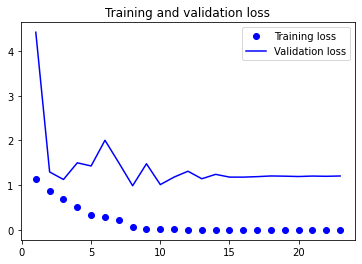

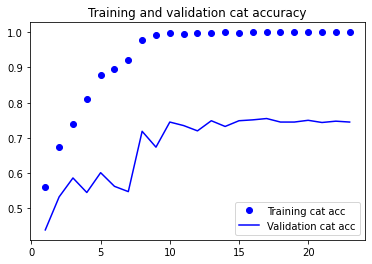

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 45s 13ms/step
Confusion matrix, without normalization
[[539  25  27   3  57  12]
 [ 23 313  38  37  33   8]
 [ 40  76 624  69  36   8]
 [  5  28  51 907   9   0]
 [ 34  12   8   6 198  10]
 [ 18   6  11   1  20  69]]
              precision    recall  f1-score   support

         bcc       0.82      0.81      0.82       663
         bkl       0.68      0.69      0.69       452
         mel       0.82      0.73      0.77       853
          nv       0.89      0.91      0.90      1000
      others       0.56      0.74      0.64       268
         scc       0.64      0.55      0.59       125

    accuracy                           0.79      3361
   macro avg       0.74      0.74      0.73      3361
weighted avg       0.79      0.79      0.79      3361

Specificity of each class:
bcc : 0.956
bkl : 0.949
mel : 0.946
nv : 0.951
others : 0.950
scc : 0.988


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


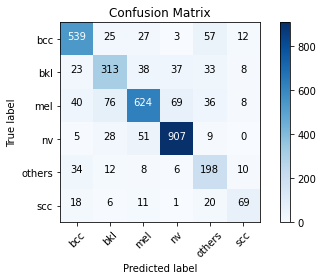

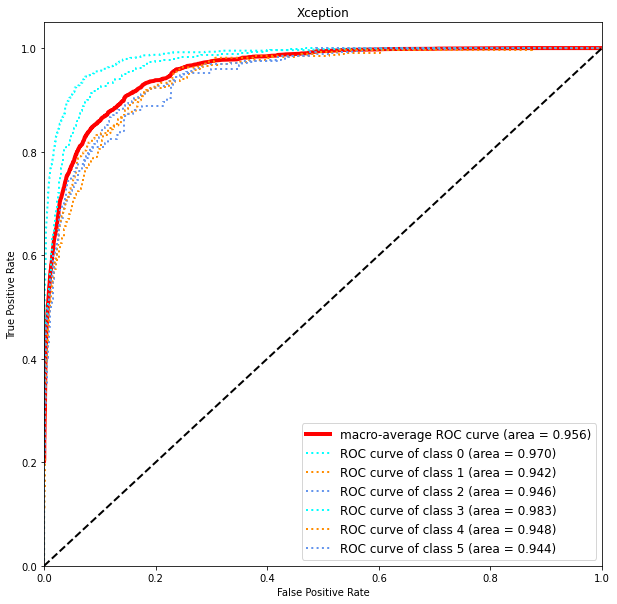

This is samplesize 1600 5
Found 7194 images belonging to 6 classes.
Found 800 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
225/225 [==============================] - ETA: 0s - loss: 1.1850 - categorical_accuracy: 0.5425
Epoch 1: val_categorical_accuracy improved from -inf to 0.50125, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 174s 753ms/step - loss: 1.1850 - categorical_accuracy: 0.5425 - val_loss: 1.7022 - val_categorical_accuracy: 0.5013 - lr: 0.0010
Epoch 2/60
225/225 [==============================] - ETA: 0s - loss: 0.8929 - categorical_accuracy: 0.6618
Epoch 2: val_categorical_accuracy improved from 0.50125 to 0.61375, saving model to Model/Skin Lesion 299 Random resize 92%.h5
225/225 [==============================] - 169s 749ms/step - loss: 0.8929 - categorical_accuracy: 0.6618 - val_loss: 1.0330 - val_categorical_accur

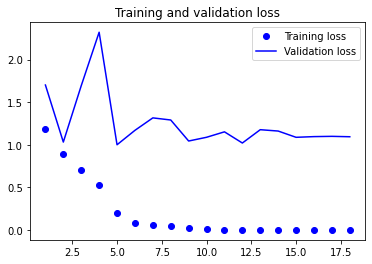

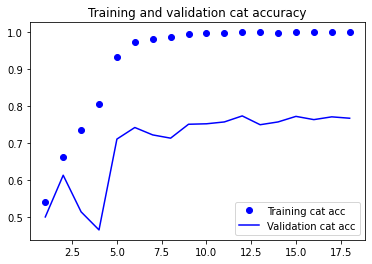

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 45s 13ms/step
Confusion matrix, without normalization
[[542  21  16   2  55  27]
 [ 25 334  32  27  21  13]
 [ 36  87 623  55  35  17]
 [  5  38  72 881   4   0]
 [ 32  19   9   7 182  19]
 [ 18   6   7   0  14  80]]
              precision    recall  f1-score   support

         bcc       0.82      0.82      0.82       663
         bkl       0.66      0.74      0.70       452
         mel       0.82      0.73      0.77       853
          nv       0.91      0.88      0.89      1000
      others       0.59      0.68      0.63       268
         scc       0.51      0.64      0.57       125

    accuracy                           0.79      3361
   macro avg       0.72      0.75      0.73      3361
weighted avg       0.80      0.79      0.79      3361

Specificity of each class:
bcc : 0.957
bkl : 0.941
mel : 0.946
nv : 0.961
others : 0.958
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


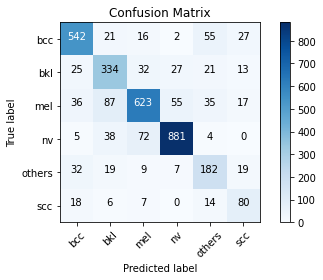

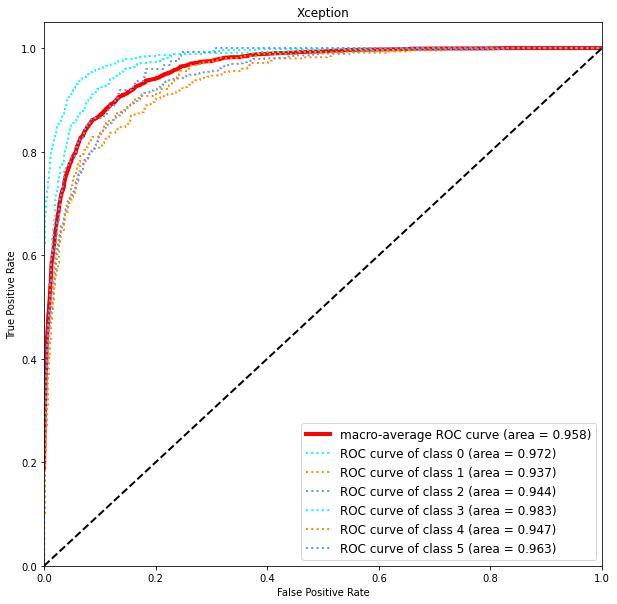

In [ ]:
train_model(1600)

mel       1800
nv        1800
bcc       1800
bkl       1634
others     981
scc        452
Name: dx, dtype: int64
nv        200
mel       200
bcc       200
bkl       181
others    110
scc        51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:02<00:00, 54.17it/s]


This is samplesize 2000 1
Found 8467 images belonging to 6 classes.
Found 942 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
265/265 [==============================] - ETA: 0s - loss: 1.1137 - categorical_accuracy: 0.5791
Epoch 1: val_categorical_accuracy improved from -inf to 0.51062, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 213s 788ms/step - loss: 1.1137 - categorical_accuracy: 0.5791 - val_loss: 2.3680 - val_categorical_accuracy: 0.5106 - lr: 0.0010
Epoch 2/60
265/265 [==============================] - ETA: 0s - loss: 0.8491 - categorical_accuracy: 0.6745
Epoch 2: val_categorical_accuracy improved from 0.51062 to 0.57431, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 199s 748ms/step - loss: 0.8491 - categorical_accuracy: 0.6745 - val_loss: 1.2691 - val_categorical_accur

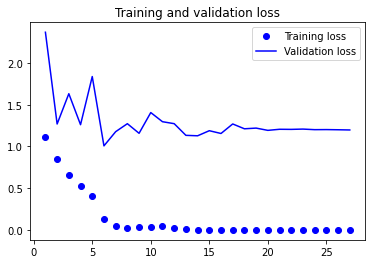

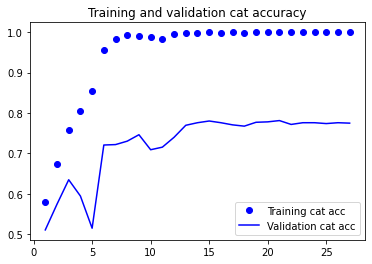

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 44s 13ms/step
Confusion matrix, without normalization
[[559  14  24   4  45  17]
 [ 35 316  39  26  28   8]
 [ 44  70 670  34  29   6]
 [ 13  21  65 891  10   0]
 [ 34  18  10   2 194  10]
 [ 26   9   6   0  13  71]]
              precision    recall  f1-score   support

         bcc       0.79      0.84      0.81       663
         bkl       0.71      0.70      0.70       452
         mel       0.82      0.79      0.80       853
          nv       0.93      0.89      0.91      1000
      others       0.61      0.72      0.66       268
         scc       0.63      0.57      0.60       125

    accuracy                           0.80      3361
   macro avg       0.75      0.75      0.75      3361
weighted avg       0.81      0.80      0.80      3361

Specificity of each class:
bcc : 0.944
bkl : 0.955
mel : 0.943
nv : 0.972
others : 0.960
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


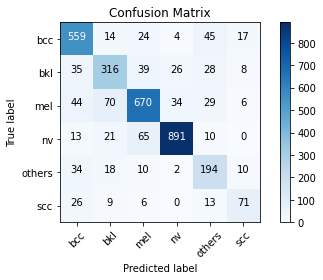

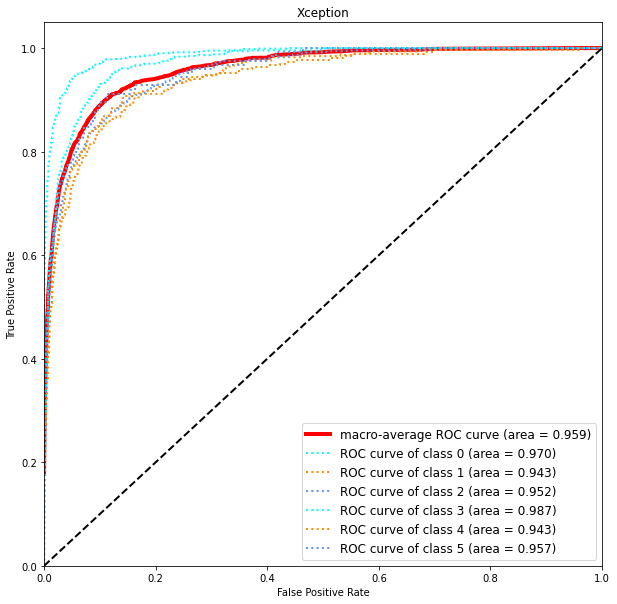

This is samplesize 2000 2
Found 8467 images belonging to 6 classes.
Found 942 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
265/265 [==============================] - ETA: 0s - loss: 1.1067 - categorical_accuracy: 0.5781
Epoch 1: val_categorical_accuracy improved from -inf to 0.53397, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 203s 751ms/step - loss: 1.1067 - categorical_accuracy: 0.5781 - val_loss: 1.4238 - val_categorical_accuracy: 0.5340 - lr: 0.0010
Epoch 2/60
265/265 [==============================] - ETA: 0s - loss: 0.8511 - categorical_accuracy: 0.6795
Epoch 2: val_categorical_accuracy improved from 0.53397 to 0.64225, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 198s 747ms/step - loss: 0.8511 - categorical_accuracy: 0.6795 - val_loss: 1.1984 - val_categorical_accur

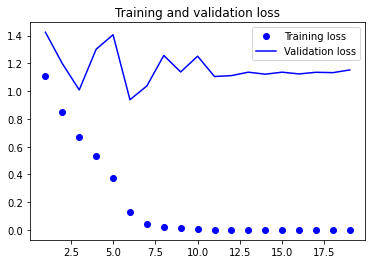

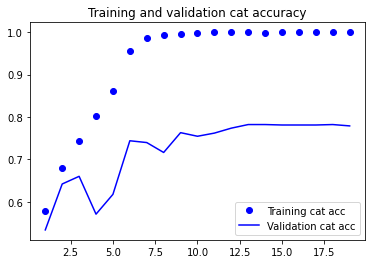

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 44s 13ms/step
Confusion matrix, without normalization
[[589  18  19   1  33   3]
 [ 25 342  35  25  19   6]
 [ 35  61 673  55  25   4]
 [  9  25  45 913   8   0]
 [ 44  18  11   2 181  12]
 [ 32   4   9   1  12  67]]
              precision    recall  f1-score   support

         bcc       0.80      0.89      0.84       663
         bkl       0.73      0.76      0.74       452
         mel       0.85      0.79      0.82       853
          nv       0.92      0.91      0.91      1000
      others       0.65      0.68      0.66       268
         scc       0.73      0.54      0.62       125

    accuracy                           0.82      3361
   macro avg       0.78      0.76      0.77      3361
weighted avg       0.82      0.82      0.82      3361

Specificity of each class:
bcc : 0.946
bkl : 0.957
mel : 0.953
nv : 0.964
others : 0.969
scc : 0.992


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


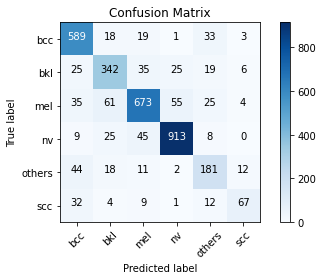

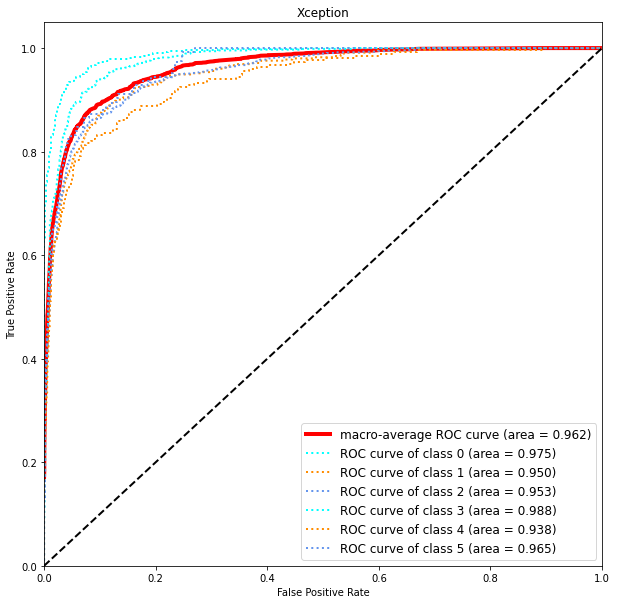

This is samplesize 2000 3
Found 8467 images belonging to 6 classes.
Found 942 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
265/265 [==============================] - ETA: 0s - loss: 1.1405 - categorical_accuracy: 0.5650
Epoch 1: val_categorical_accuracy improved from -inf to 0.50318, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 203s 750ms/step - loss: 1.1405 - categorical_accuracy: 0.5650 - val_loss: 1.5355 - val_categorical_accuracy: 0.5032 - lr: 0.0010
Epoch 2/60
265/265 [==============================] - ETA: 0s - loss: 0.8640 - categorical_accuracy: 0.6749
Epoch 2: val_categorical_accuracy did not improve from 0.50318
265/265 [==============================] - 198s 745ms/step - loss: 0.8640 - categorical_accuracy: 0.6749 - val_loss: 1.4239 - val_categorical_accuracy: 0.4894 - lr: 0.0010
Epoch 3/60
265/265 [===================

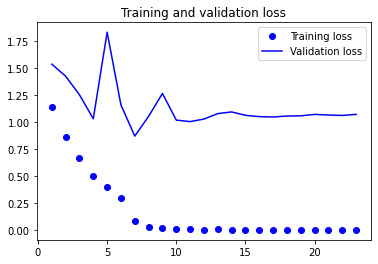

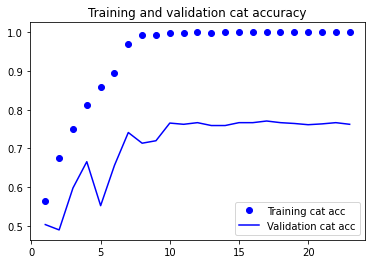

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 44s 13ms/step
Confusion matrix, without normalization
[[570  17  26   3  32  15]
 [ 29 329  44  24  20   6]
 [ 37  60 670  47  32   7]
 [  7  25  74 882  11   1]
 [ 44  16  10   4 177  17]
 [ 18   5  10   0  13  79]]
              precision    recall  f1-score   support

         bcc       0.81      0.86      0.83       663
         bkl       0.73      0.73      0.73       452
         mel       0.80      0.79      0.79       853
          nv       0.92      0.88      0.90      1000
      others       0.62      0.66      0.64       268
         scc       0.63      0.63      0.63       125

    accuracy                           0.81      3361
   macro avg       0.75      0.76      0.75      3361
weighted avg       0.81      0.81      0.81      3361

Specificity of each class:
bcc : 0.950
bkl : 0.958
mel : 0.935
nv : 0.967
others : 0.965
scc : 0.986


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


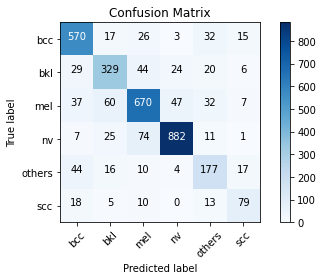

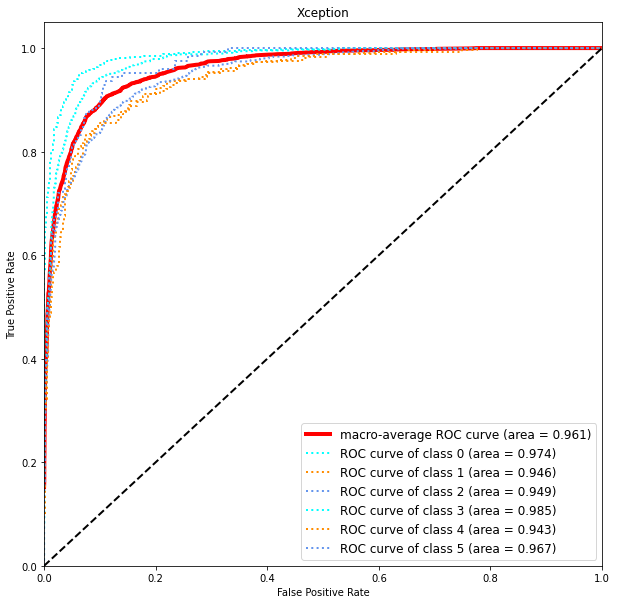

This is samplesize 2000 4
Found 8467 images belonging to 6 classes.
Found 942 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
265/265 [==============================] - ETA: 0s - loss: 1.1022 - categorical_accuracy: 0.5864
Epoch 1: val_categorical_accuracy improved from -inf to 0.54883, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 204s 752ms/step - loss: 1.1022 - categorical_accuracy: 0.5864 - val_loss: 1.5039 - val_categorical_accuracy: 0.5488 - lr: 0.0010
Epoch 2/60
265/265 [==============================] - ETA: 0s - loss: 0.8414 - categorical_accuracy: 0.6827
Epoch 2: val_categorical_accuracy did not improve from 0.54883
265/265 [==============================] - 198s 745ms/step - loss: 0.8414 - categorical_accuracy: 0.6827 - val_loss: 1.4920 - val_categorical_accuracy: 0.5329 - lr: 0.0010
Epoch 3/60
265/265 [===================

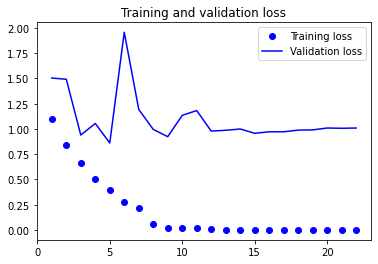

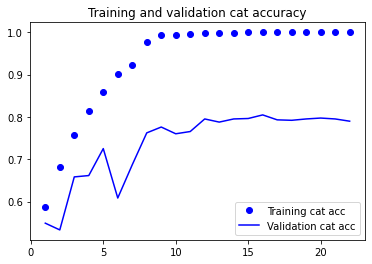

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 45s 13ms/step
Confusion matrix, without normalization
[[557  22  21   3  47  13]
 [ 23 355  26  21  20   7]
 [ 32  80 667  33  30  11]
 [ 12  34  53 890   7   4]
 [ 31  20  10   1 192  14]
 [ 24   3   7   0  15  76]]
              precision    recall  f1-score   support

         bcc       0.82      0.84      0.83       663
         bkl       0.69      0.79      0.73       452
         mel       0.85      0.78      0.81       853
          nv       0.94      0.89      0.91      1000
      others       0.62      0.72      0.66       268
         scc       0.61      0.61      0.61       125

    accuracy                           0.81      3361
   macro avg       0.75      0.77      0.76      3361
weighted avg       0.82      0.81      0.82      3361

Specificity of each class:
bcc : 0.955
bkl : 0.945
mel : 0.953
nv : 0.975
others : 0.962
scc : 0.985


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


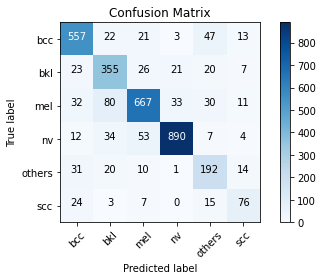

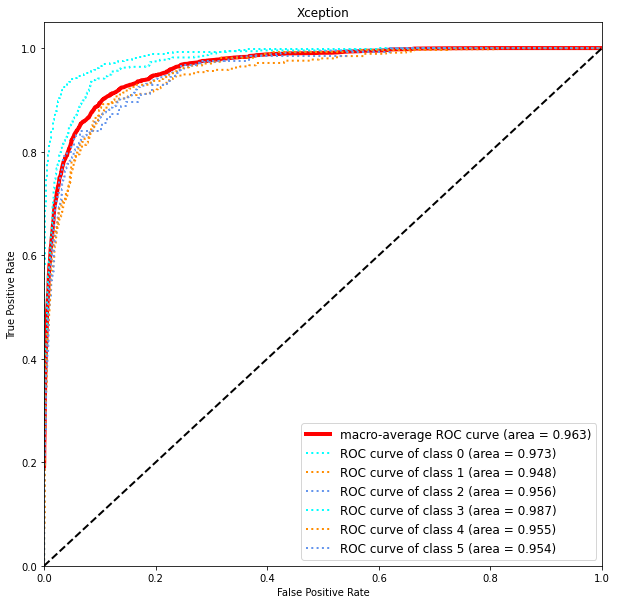

This is samplesize 2000 5
Found 8467 images belonging to 6 classes.
Found 942 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
265/265 [==============================] - ETA: 0s - loss: 1.1500 - categorical_accuracy: 0.5590
Epoch 1: val_categorical_accuracy improved from -inf to 0.49151, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 204s 752ms/step - loss: 1.1500 - categorical_accuracy: 0.5590 - val_loss: 1.3713 - val_categorical_accuracy: 0.4915 - lr: 0.0010
Epoch 2/60
265/265 [==============================] - ETA: 0s - loss: 0.8616 - categorical_accuracy: 0.6757
Epoch 2: val_categorical_accuracy improved from 0.49151 to 0.61253, saving model to Model/Skin Lesion 299 Random resize 92%.h5
265/265 [==============================] - 199s 749ms/step - loss: 0.8616 - categorical_accuracy: 0.6757 - val_loss: 1.1648 - val_categorical_accur

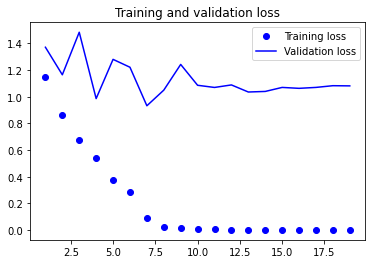

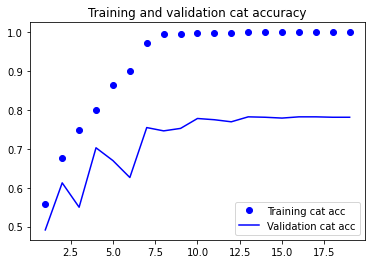

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 45s 13ms/step
Confusion matrix, without normalization
[[589  15  13   3  30  13]
 [ 34 329  39  23  23   4]
 [ 45  65 664  49  27   3]
 [  7  32  60 895   6   0]
 [ 34  18  11   4 191  10]
 [ 15  10   9   1  14  76]]
              precision    recall  f1-score   support

         bcc       0.81      0.89      0.85       663
         bkl       0.70      0.73      0.71       452
         mel       0.83      0.78      0.81       853
          nv       0.92      0.90      0.91      1000
      others       0.66      0.71      0.68       268
         scc       0.72      0.61      0.66       125

    accuracy                           0.82      3361
   macro avg       0.77      0.77      0.77      3361
weighted avg       0.82      0.82      0.82      3361

Specificity of each class:
bcc : 0.950
bkl : 0.952
mel : 0.947
nv : 0.966
others : 0.968
scc : 0.991


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


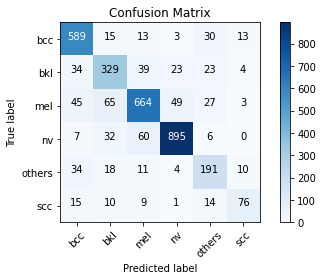

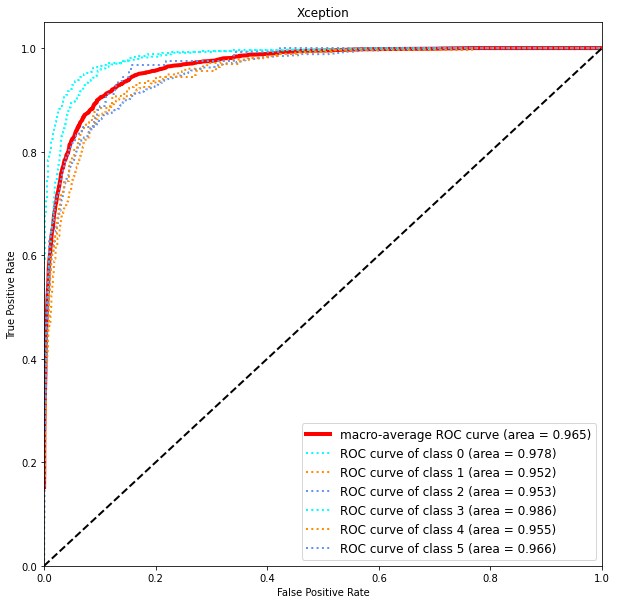

In [ ]:
train_model(2000)

nv        2160
mel       2160
bcc       2159
bkl       1634
others     982
scc        452
Name: dx, dtype: int64
bcc       241
nv        240
mel       240
bkl       181
others    109
scc        51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:07<00:00, 49.96it/s]


This is samplesize 2400 1
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.0849 - categorical_accuracy: 0.6003
Epoch 1: val_categorical_accuracy improved from -inf to 0.50565, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 235s 772ms/step - loss: 1.0849 - categorical_accuracy: 0.6003 - val_loss: 1.5449 - val_categorical_accuracy: 0.5056 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8276 - categorical_accuracy: 0.6946
Epoch 2: val_categorical_accuracy did not improve from 0.50565
299/299 [==============================] - 148s 495ms/step - loss: 0.8276 - categorical_accuracy: 0.6946 - val_loss: 2.2699 - val_categorical_accuracy: 0.4840 - lr: 0.0010
Epoch 3/60
299/299 [==================

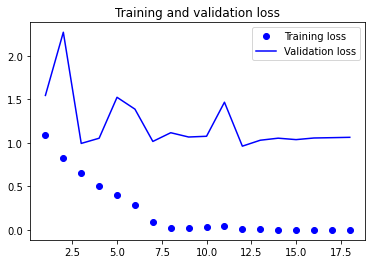

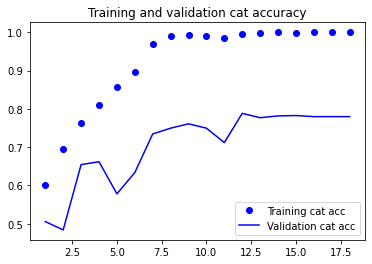

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 47s 14ms/step
Confusion matrix, without normalization
[[570  19  17   1  55   1]
 [ 26 343  28  22  30   3]
 [ 43  78 633  57  36   6]
 [ 15  33  38 905   8   1]
 [ 41  22  13   5 180   7]
 [ 31  13   5   0  24  52]]
              precision    recall  f1-score   support

         bcc       0.79      0.86      0.82       663
         bkl       0.68      0.76      0.71       452
         mel       0.86      0.74      0.80       853
          nv       0.91      0.91      0.91      1000
      others       0.54      0.67      0.60       268
         scc       0.74      0.42      0.53       125

    accuracy                           0.80      3361
   macro avg       0.75      0.73      0.73      3361
weighted avg       0.81      0.80      0.80      3361

Specificity of each class:
bcc : 0.942
bkl : 0.943
mel : 0.960
nv : 0.964
others : 0.951
scc : 0.994


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


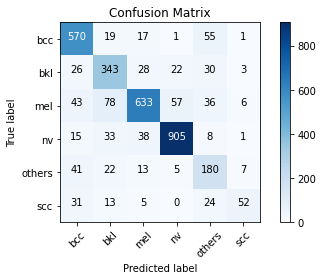

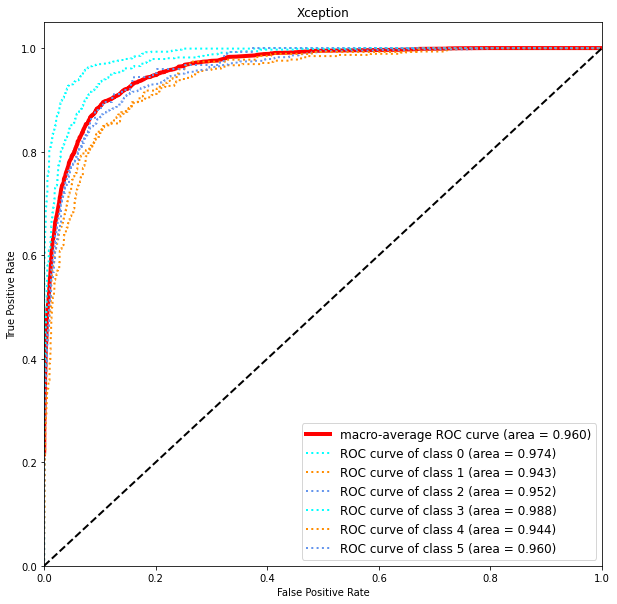

This is samplesize 2400 2
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.1003 - categorical_accuracy: 0.5891
Epoch 1: val_categorical_accuracy improved from -inf to 0.62429, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 155s 505ms/step - loss: 1.1003 - categorical_accuracy: 0.5891 - val_loss: 1.6833 - val_categorical_accuracy: 0.6243 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8510 - categorical_accuracy: 0.6785
Epoch 2: val_categorical_accuracy did not improve from 0.62429
299/299 [==============================] - 148s 494ms/step - loss: 0.8510 - categorical_accuracy: 0.6785 - val_loss: 1.1089 - val_categorical_accuracy: 0.6073 - lr: 0.0010
Epoch 3/60
299/299 [==================

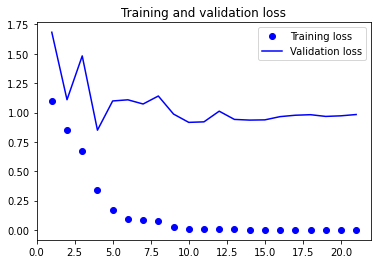

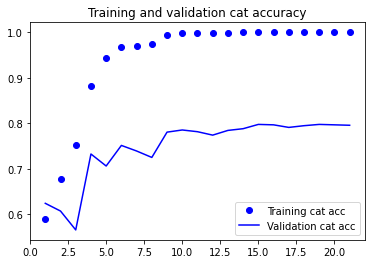

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 47s 14ms/step
Confusion matrix, without normalization
[[557  23  17   4  52  10]
 [ 27 302  57  28  33   5]
 [ 28  56 679  64  24   2]
 [  8  22  33 933   4   0]
 [ 33  12  13   6 193  11]
 [ 20  14   6   2  14  69]]
              precision    recall  f1-score   support

         bcc       0.83      0.84      0.83       663
         bkl       0.70      0.67      0.69       452
         mel       0.84      0.80      0.82       853
          nv       0.90      0.93      0.92      1000
      others       0.60      0.72      0.66       268
         scc       0.71      0.55      0.62       125

    accuracy                           0.81      3361
   macro avg       0.76      0.75      0.76      3361
weighted avg       0.81      0.81      0.81      3361

Specificity of each class:
bcc : 0.957
bkl : 0.956
mel : 0.950
nv : 0.956
others : 0.959
scc : 0.991


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


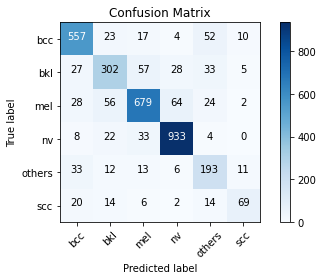

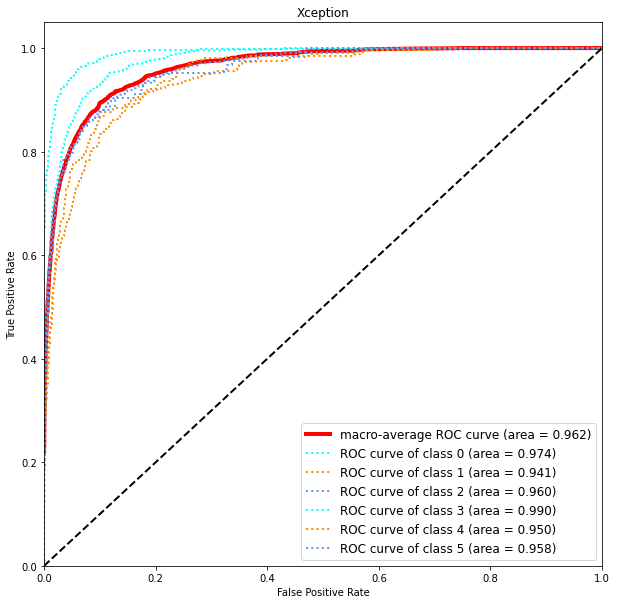

This is samplesize 2400 3
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.0804 - categorical_accuracy: 0.5980
Epoch 1: val_categorical_accuracy improved from -inf to 0.50094, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 154s 499ms/step - loss: 1.0804 - categorical_accuracy: 0.5980 - val_loss: 2.0646 - val_categorical_accuracy: 0.5009 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8382 - categorical_accuracy: 0.6924
Epoch 2: val_categorical_accuracy improved from 0.50094 to 0.57439, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 149s 496ms/step - loss: 0.8382 - categorical_accuracy: 0.6924 - val_loss: 1.3865 - val_categorical_accu

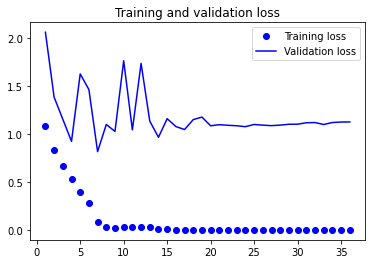

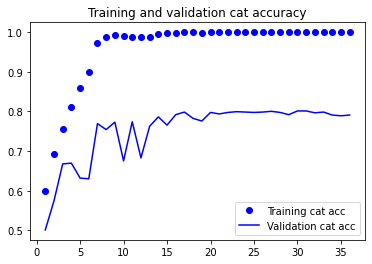

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 48s 14ms/step
Confusion matrix, without normalization
[[581  16  29   4  23  10]
 [ 22 327  43  26  27   7]
 [ 34  46 698  47  26   2]
 [ 13  27  51 903   5   1]
 [ 40  21  20   5 169  13]
 [ 19   6   8   1  19  72]]
              precision    recall  f1-score   support

         bcc       0.82      0.88      0.85       663
         bkl       0.74      0.72      0.73       452
         mel       0.82      0.82      0.82       853
          nv       0.92      0.90      0.91      1000
      others       0.63      0.63      0.63       268
         scc       0.69      0.58      0.63       125

    accuracy                           0.82      3361
   macro avg       0.77      0.75      0.76      3361
weighted avg       0.82      0.82      0.82      3361

Specificity of each class:
bcc : 0.953
bkl : 0.960
mel : 0.940
nv : 0.965
others : 0.968
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


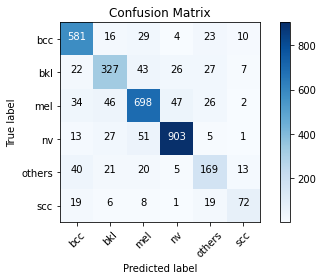

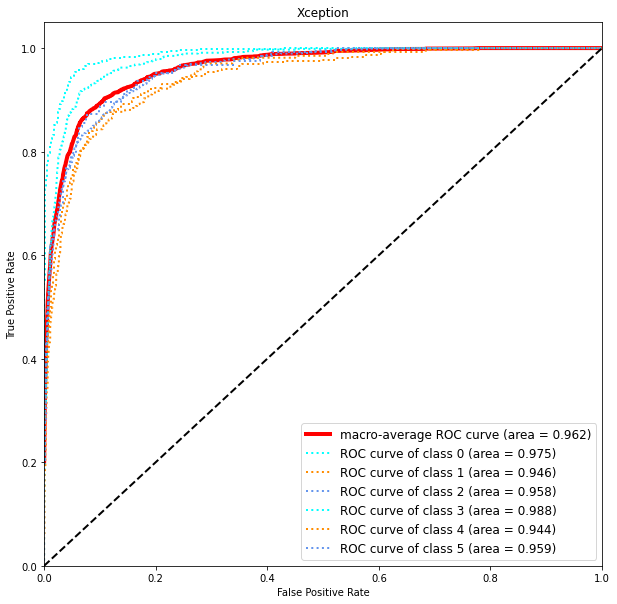

This is samplesize 2400 4
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.0700 - categorical_accuracy: 0.6047
Epoch 1: val_categorical_accuracy improved from -inf to 0.48776, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 155s 502ms/step - loss: 1.0700 - categorical_accuracy: 0.6047 - val_loss: 1.4191 - val_categorical_accuracy: 0.4878 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8001 - categorical_accuracy: 0.7050
Epoch 2: val_categorical_accuracy improved from 0.48776 to 0.61111, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 150s 501ms/step - loss: 0.8001 - categorical_accuracy: 0.7050 - val_loss: 1.1935 - val_categorical_accu

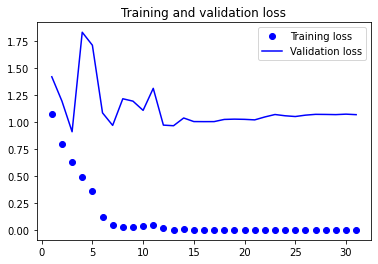

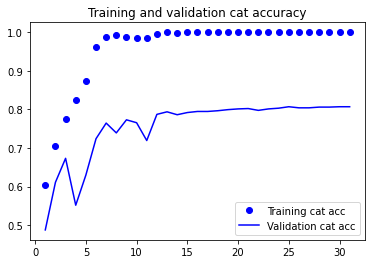

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 46s 13ms/step
Confusion matrix, without normalization
[[589  12  25   3  15  19]
 [ 32 319  42  25  20  14]
 [ 29  47 685  62  19  11]
 [  4  19  48 921   6   2]
 [ 48  17  11   2 167  23]
 [ 20   7   7   2   7  82]]
              precision    recall  f1-score   support

         bcc       0.82      0.89      0.85       663
         bkl       0.76      0.71      0.73       452
         mel       0.84      0.80      0.82       853
          nv       0.91      0.92      0.91      1000
      others       0.71      0.62      0.67       268
         scc       0.54      0.66      0.59       125

    accuracy                           0.82      3361
   macro avg       0.76      0.77      0.76      3361
weighted avg       0.82      0.82      0.82      3361

Specificity of each class:
bcc : 0.951
bkl : 0.965
mel : 0.947
nv : 0.960
others : 0.978
scc : 0.979


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


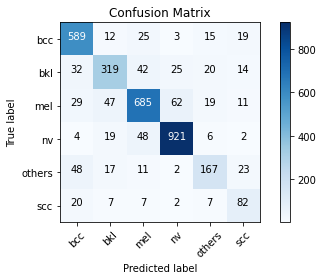

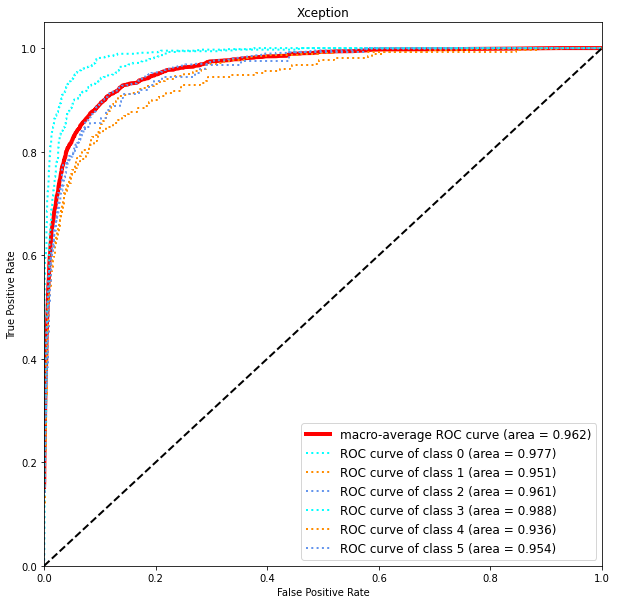

This is samplesize 2400 5
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.0660 - categorical_accuracy: 0.6021
Epoch 1: val_categorical_accuracy improved from -inf to 0.62994, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 154s 499ms/step - loss: 1.0660 - categorical_accuracy: 0.6021 - val_loss: 1.0597 - val_categorical_accuracy: 0.6299 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8004 - categorical_accuracy: 0.7049
Epoch 2: val_categorical_accuracy improved from 0.62994 to 0.65537, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 148s 494ms/step - loss: 0.8004 - categorical_accuracy: 0.7049 - val_loss: 1.1566 - val_categorical_accu

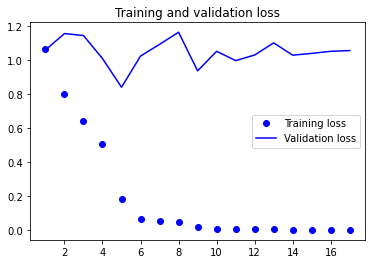

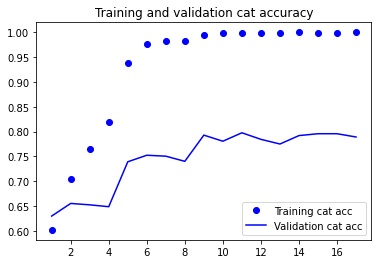

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 48s 14ms/step
Confusion matrix, without normalization
[[585  18  20   3  27  10]
 [ 35 331  22  36  20   8]
 [ 36  64 659  61  26   7]
 [  8  23  34 931   2   2]
 [ 52  15  12   6 174   9]
 [ 19   7   6   2  12  79]]
              precision    recall  f1-score   support

         bcc       0.80      0.88      0.84       663
         bkl       0.72      0.73      0.73       452
         mel       0.88      0.77      0.82       853
          nv       0.90      0.93      0.91      1000
      others       0.67      0.65      0.66       268
         scc       0.69      0.63      0.66       125

    accuracy                           0.82      3361
   macro avg       0.77      0.77      0.77      3361
weighted avg       0.82      0.82      0.82      3361

Specificity of each class:
bcc : 0.944
bkl : 0.956
mel : 0.963
nv : 0.954
others : 0.972
scc : 0.989


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


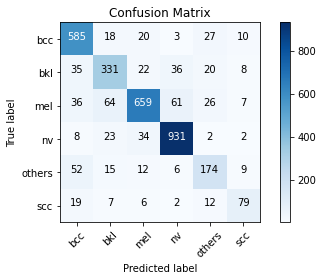

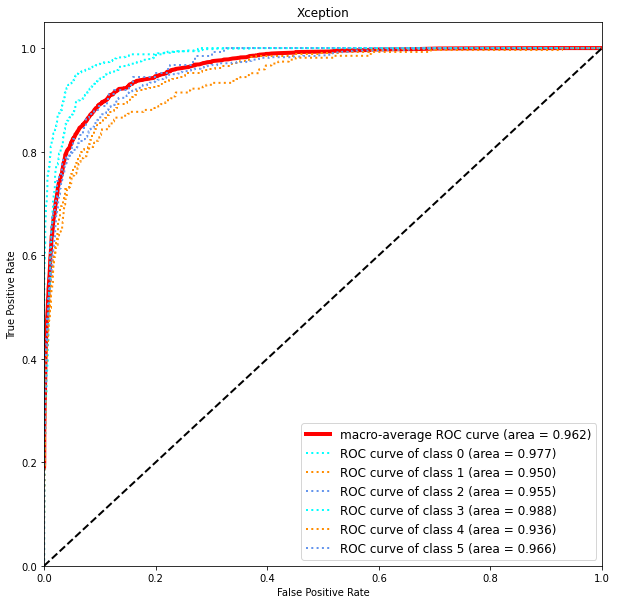

In [ ]:
train_model(2400)

In [ ]:
train_model(2600)

In [ ]:
train_model(3000)

nv        2160
mel       2160
bcc       2159
bkl       1634
others     982
scc        452
Name: dx, dtype: int64
bcc       241
nv        240
mel       240
bkl       181
others    109
scc        51
Name: dx, dtype: int64
nv        1000
mel        853
bcc        663
bkl        452
others     268
scc        125
Name: dx, dtype: int64


100%|██████████| 3361/3361 [01:05<00:00, 51.57it/s]


This is samplesize 2400 1
Found 9547 images belonging to 6 classes.
Found 1062 images belonging to 6 classes.
Found 3361 images belonging to 6 classes.
91897856/91884032 [==============================] - 1s 0us/step
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
299/299 [==============================] - ETA: 0s - loss: 1.0702 - categorical_accuracy: 0.5955
Epoch 1: val_categorical_accuracy improved from -inf to 0.62053, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 270s 832ms/step - loss: 1.0702 - categorical_accuracy: 0.5955 - val_loss: 1.2923 - val_categorical_accuracy: 0.6205 - lr: 0.0010
Epoch 2/60
299/299 [==============================] - ETA: 0s - loss: 0.8118 - categorical_accuracy: 0.6983
Epoch 2: val_categorical_accuracy improved from 0.62053 to 0.67137, saving model to Model/Skin Lesion 299 Random resize 92%.h5
299/299 [==============================] - 226s 754ms/step - loss: 0.8118 - categ

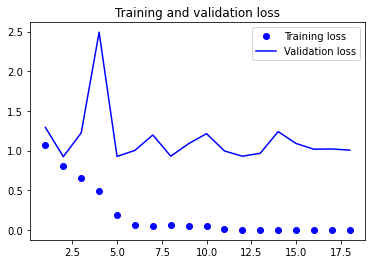

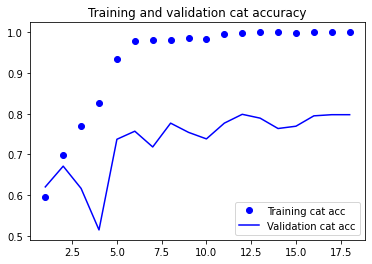

<Figure size 432x288 with 0 Axes>

3361/3361 [==============================] - 51s 15ms/step
Confusion matrix, without normalization
[[592  12  22   3  23  11]
 [ 28 304  57  29  24  10]
 [ 43  36 700  49  21   4]
 [  8  22  58 908   4   0]
 [ 52  14  18   6 160  18]
 [ 28   5  11   2   7  72]]
              precision    recall  f1-score   support

         bcc       0.79      0.89      0.84       663
         bkl       0.77      0.67      0.72       452
         mel       0.81      0.82      0.81       853
          nv       0.91      0.91      0.91      1000
      others       0.67      0.60      0.63       268
         scc       0.63      0.58      0.60       125

    accuracy                           0.81      3361
   macro avg       0.76      0.74      0.75      3361
weighted avg       0.81      0.81      0.81      3361

Specificity of each class:
bcc : 0.941
bkl : 0.969
mel : 0.934
nv : 0.962
others : 0.974
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


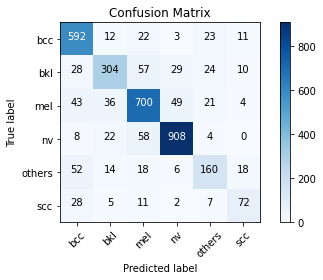

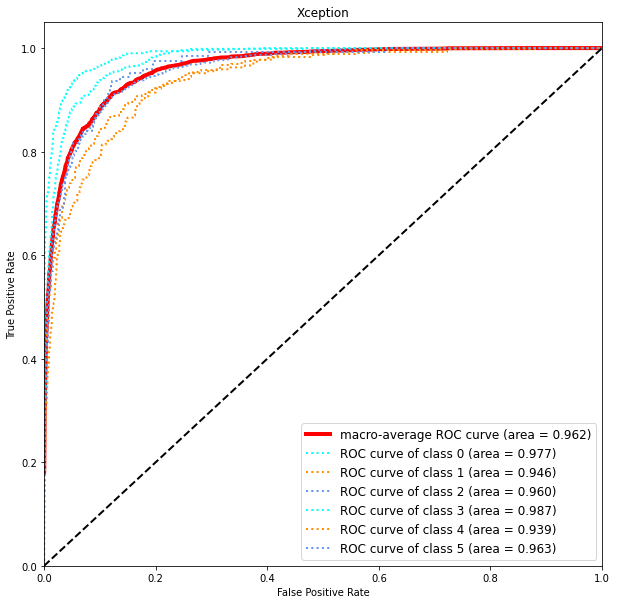

In [ ]:
train_model(2400)

# Tests and Results old

## 400

100%|██████████| 360/360 [00:04<00:00, 76.56it/s]


This is samplesize 400 1
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
91897856/91884032 [==============================] - 2s 0us/step
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.2746 - categorical_accuracy: 0.5059
Epoch 1: val_categorical_accuracy improved from -inf to 0.42412, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 55s 522ms/step - loss: 1.2746 - categorical_accuracy: 0.5059 - val_loss: 2.3240 - val_categorical_accuracy: 0.4241 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9573 - categorical_accuracy: 0.6463
Epoch 2: val_categorical_accuracy improved from 0.42412 to 0.45914, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 502ms/step - loss: 0.9573 - categorical_accura

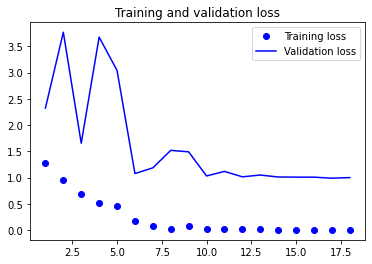

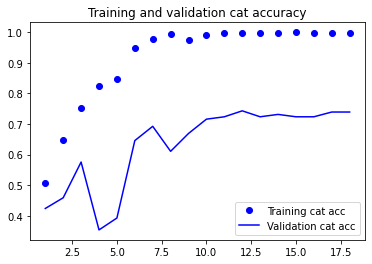

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[35  3  3  0 11  8]
 [ 3 44  3  4  3  3]
 [ 4 12 23 15  4  2]
 [ 1  4  4 48  2  1]
 [ 0  7  3  3 39  8]
 [ 4  4  1  0  4 47]]
              precision    recall  f1-score   support

         bcc       0.74      0.58      0.65        60
         bkl       0.59      0.73      0.66        60
         mel       0.62      0.38      0.47        60
          nv       0.69      0.80      0.74        60
      others       0.62      0.65      0.63        60
         scc       0.68      0.78      0.73        60

    accuracy                           0.66       360
   macro avg       0.66      0.66      0.65       360
weighted avg       0.66      0.66      0.65       360

Specificity of each class:
bcc : 0.960
bkl : 0.900
mel : 0.953
nv : 0.927
others : 0.920
scc : 0.927


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


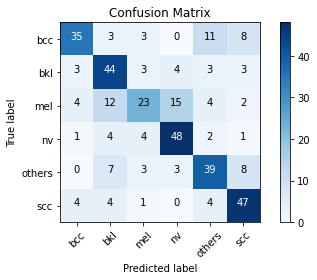

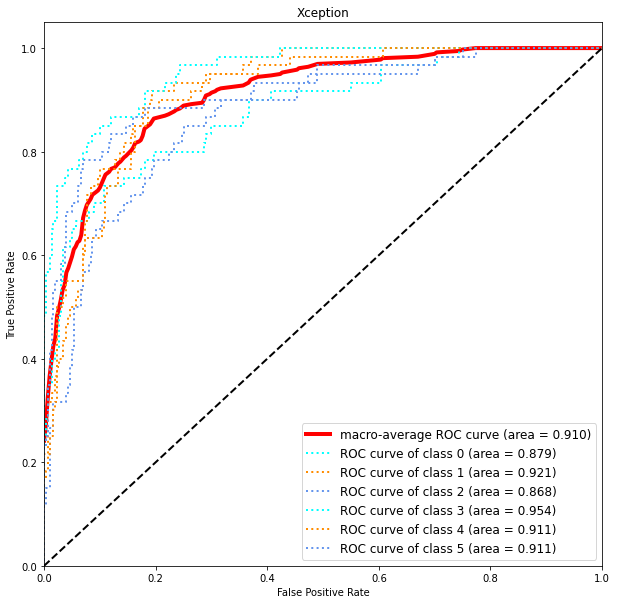

This is samplesize 400 2
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3349 - categorical_accuracy: 0.4894
Epoch 1: val_categorical_accuracy improved from -inf to 0.36187, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 513ms/step - loss: 1.3349 - categorical_accuracy: 0.4894 - val_loss: 4.6827 - val_categorical_accuracy: 0.3619 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0023 - categorical_accuracy: 0.6342
Epoch 2: val_categorical_accuracy did not improve from 0.36187
73/73 [==============================] - 36s 486ms/step - loss: 1.0023 - categorical_accuracy: 0.6342 - val_loss: 3.4076 - val_categorical_accuracy: 0.2763 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

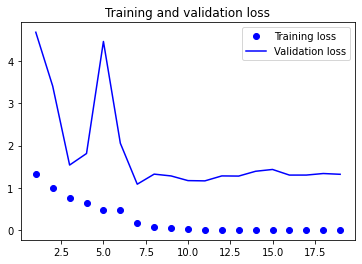

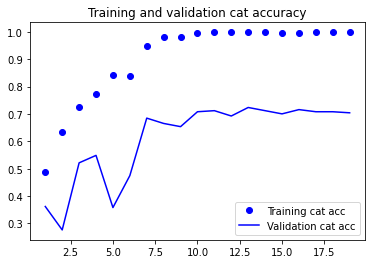

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[26  4  4  0 10 16]
 [ 0 45  4  3  4  4]
 [ 3  4 36 10  3  4]
 [ 2  0  8 48  1  1]
 [ 0  6  0  1 47  6]
 [ 1  5  1  0  5 48]]
              precision    recall  f1-score   support

         bcc       0.81      0.43      0.57        60
         bkl       0.70      0.75      0.73        60
         mel       0.68      0.60      0.64        60
          nv       0.77      0.80      0.79        60
      others       0.67      0.78      0.72        60
         scc       0.61      0.80      0.69        60

    accuracy                           0.69       360
   macro avg       0.71      0.69      0.69       360
weighted avg       0.71      0.69      0.69       360

Specificity of each class:
bcc : 0.980
bkl : 0.937
mel : 0.943
nv : 0.953
others : 0.923
scc : 0.897


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


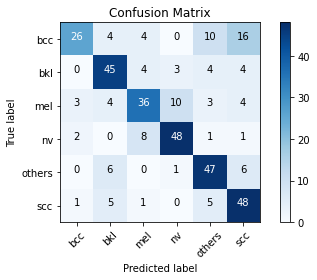

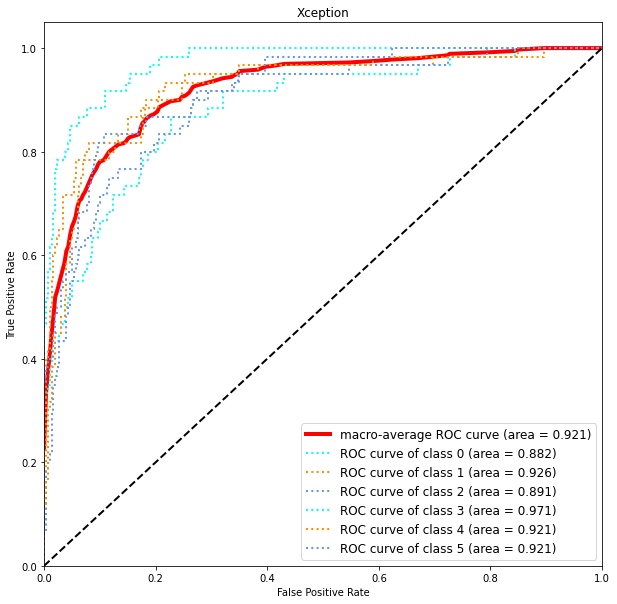

This is samplesize 400 3
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3283 - categorical_accuracy: 0.4846
Epoch 1: val_categorical_accuracy improved from -inf to 0.40078, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 516ms/step - loss: 1.3283 - categorical_accuracy: 0.4846 - val_loss: 2.1099 - val_categorical_accuracy: 0.4008 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9833 - categorical_accuracy: 0.6294
Epoch 2: val_categorical_accuracy did not improve from 0.40078
73/73 [==============================] - 36s 488ms/step - loss: 0.9833 - categorical_accuracy: 0.6294 - val_loss: 4.9067 - val_categorical_accuracy: 0.3463 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

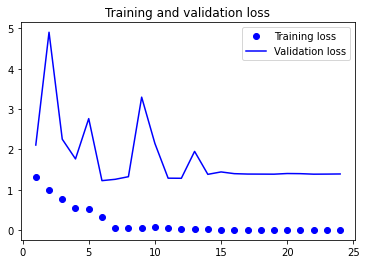

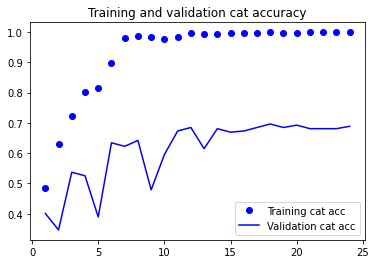

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[38  6  2  0  6  8]
 [ 3 39  6  3  6  3]
 [ 4  6 35  8  1  6]
 [ 1  2  7 46  3  1]
 [ 1  5  2  1 44  7]
 [ 2  0  4  0  7 47]]
              precision    recall  f1-score   support

         bcc       0.78      0.63      0.70        60
         bkl       0.67      0.65      0.66        60
         mel       0.62      0.58      0.60        60
          nv       0.79      0.77      0.78        60
      others       0.66      0.73      0.69        60
         scc       0.65      0.78      0.71        60

    accuracy                           0.69       360
   macro avg       0.70      0.69      0.69       360
weighted avg       0.70      0.69      0.69       360

Specificity of each class:
bcc : 0.963
bkl : 0.937
mel : 0.930
nv : 0.960
others : 0.923
scc : 0.917


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


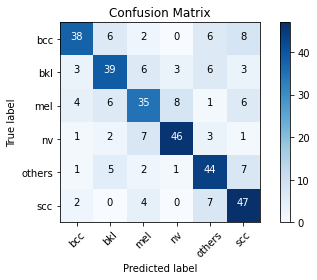

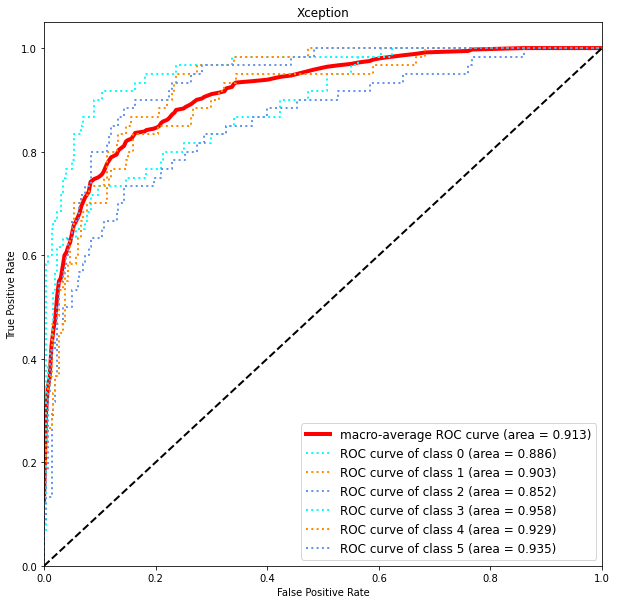

This is samplesize 400 4
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3046 - categorical_accuracy: 0.4946
Epoch 1: val_categorical_accuracy improved from -inf to 0.41245, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 515ms/step - loss: 1.3046 - categorical_accuracy: 0.4946 - val_loss: 3.4838 - val_categorical_accuracy: 0.4125 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.8991 - categorical_accuracy: 0.6771
Epoch 2: val_categorical_accuracy did not improve from 0.41245
73/73 [==============================] - 36s 486ms/step - loss: 0.8991 - categorical_accuracy: 0.6771 - val_loss: 3.1641 - val_categorical_accuracy: 0.3307 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

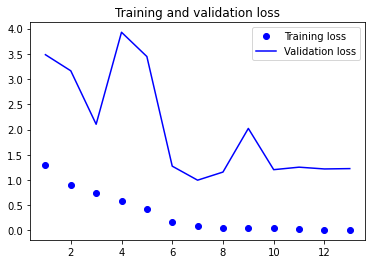

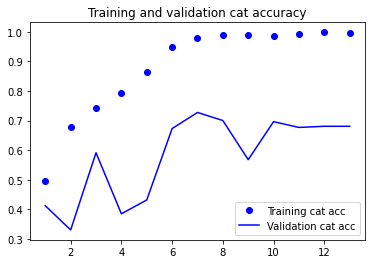

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[45  1  3  0  8  3]
 [ 4 43  5  3  3  2]
 [ 6 10 32  9  1  2]
 [ 2  2  7 48  0  1]
 [ 4  6  5  0 40  5]
 [11  4  1  0  4 40]]
              precision    recall  f1-score   support

         bcc       0.62      0.75      0.68        60
         bkl       0.65      0.72      0.68        60
         mel       0.60      0.53      0.57        60
          nv       0.80      0.80      0.80        60
      others       0.71      0.67      0.69        60
         scc       0.75      0.67      0.71        60

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.69       360
weighted avg       0.69      0.69      0.69       360

Specificity of each class:
bcc : 0.910
bkl : 0.923
mel : 0.930
nv : 0.960
others : 0.947
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


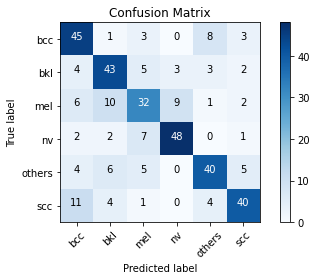

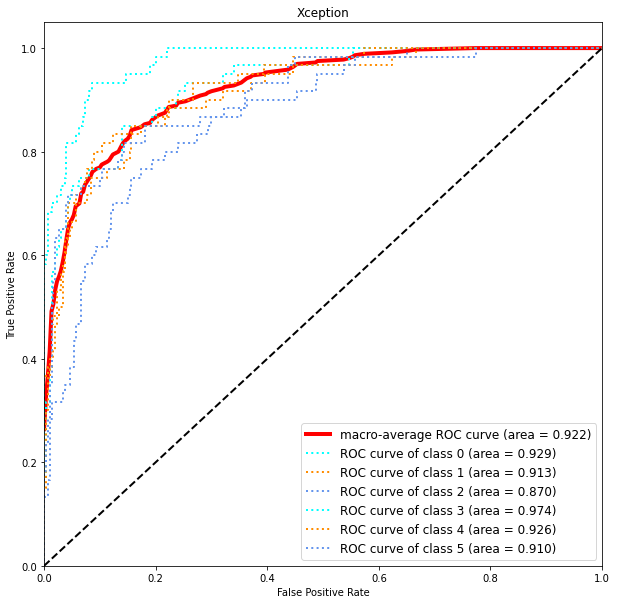

This is samplesize 400 5
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3263 - categorical_accuracy: 0.4959
Epoch 1: val_categorical_accuracy improved from -inf to 0.28405, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 524ms/step - loss: 1.3263 - categorical_accuracy: 0.4959 - val_loss: 6.1456 - val_categorical_accuracy: 0.2840 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9605 - categorical_accuracy: 0.6506
Epoch 2: val_categorical_accuracy improved from 0.28405 to 0.47082, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 499ms/step - loss: 0.9605 - categorical_accuracy: 0.6506 - val_loss: 2.7166 - val_categorical_accuracy: 0.4708 

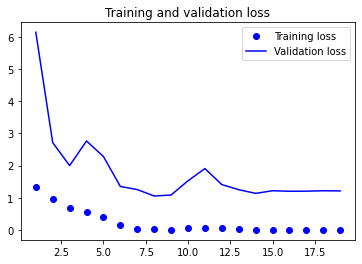

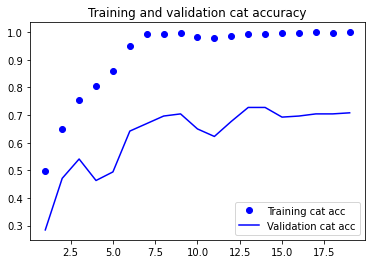

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[36  4  0  0  7 13]
 [ 3 45  2  2  2  6]
 [ 8 11 24  9  2  6]
 [ 1  4  5 46  3  1]
 [ 3 10  1  1 38  7]
 [ 3  1  0  0  2 54]]
              precision    recall  f1-score   support

         bcc       0.67      0.60      0.63        60
         bkl       0.60      0.75      0.67        60
         mel       0.75      0.40      0.52        60
          nv       0.79      0.77      0.78        60
      others       0.70      0.63      0.67        60
         scc       0.62      0.90      0.73        60

    accuracy                           0.68       360
   macro avg       0.69      0.67      0.67       360
weighted avg       0.69      0.68      0.67       360

Specificity of each class:
bcc : 0.940
bkl : 0.900
mel : 0.973
nv : 0.960
others : 0.947
scc : 0.890


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


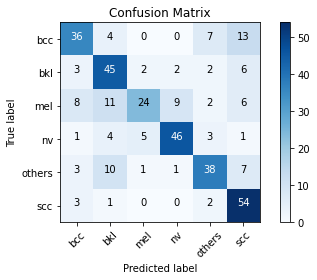

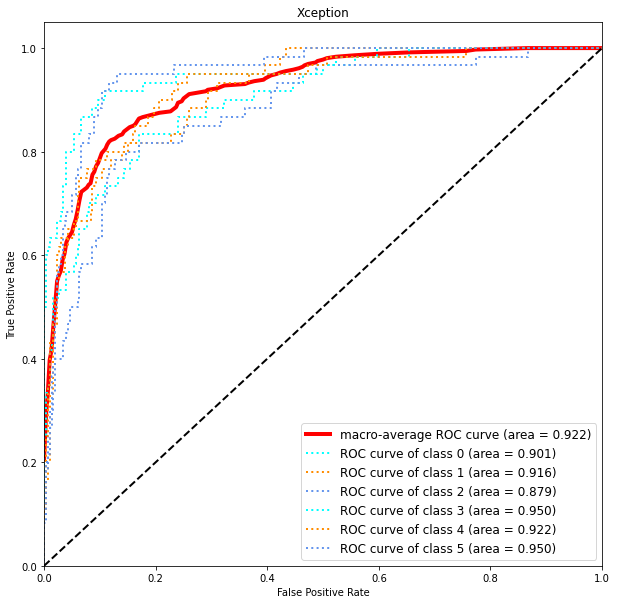

In [ ]:
train_model(400)

100%|██████████| 360/360 [00:06<00:00, 58.11it/s]


This is samplesize 400 1
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
91897856/91884032 [==============================] - 1s 0us/step
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3224 - categorical_accuracy: 0.4846
Epoch 1: val_categorical_accuracy improved from -inf to 0.29183, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 55s 518ms/step - loss: 1.3224 - categorical_accuracy: 0.4846 - val_loss: 7.7350 - val_categorical_accuracy: 0.2918 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9615 - categorical_accuracy: 0.6489
Epoch 2: val_categorical_accuracy improved from 0.29183 to 0.49805, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 500ms/step - loss: 0.9615 - categorical_accura

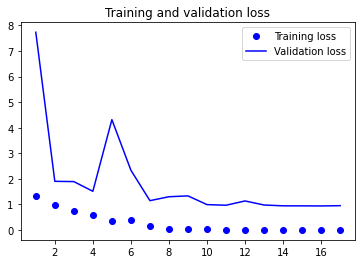

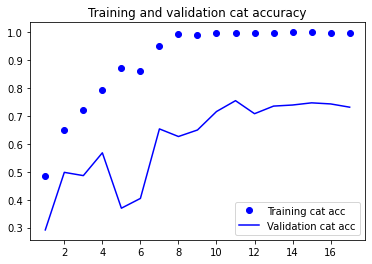

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[39  5  1  1  4 10]
 [ 4 42  5  2  4  3]
 [ 2  8 34  7  1  8]
 [ 1  1  5 49  2  2]
 [ 0 11  2  1 39  7]
 [ 6  4  0  0  2 48]]
              precision    recall  f1-score   support

         bcc       0.75      0.65      0.70        60
         bkl       0.59      0.70      0.64        60
         mel       0.72      0.57      0.64        60
          nv       0.82      0.82      0.82        60
      others       0.75      0.65      0.70        60
         scc       0.62      0.80      0.70        60

    accuracy                           0.70       360
   macro avg       0.71      0.70      0.70       360
weighted avg       0.71      0.70      0.70       360

Specificity of each class:
bcc : 0.957
bkl : 0.903
mel : 0.957
nv : 0.963
others : 0.957
scc : 0.900


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


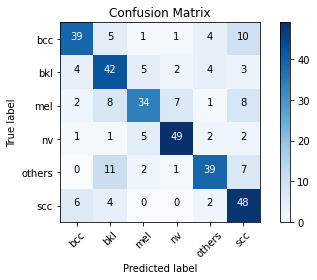

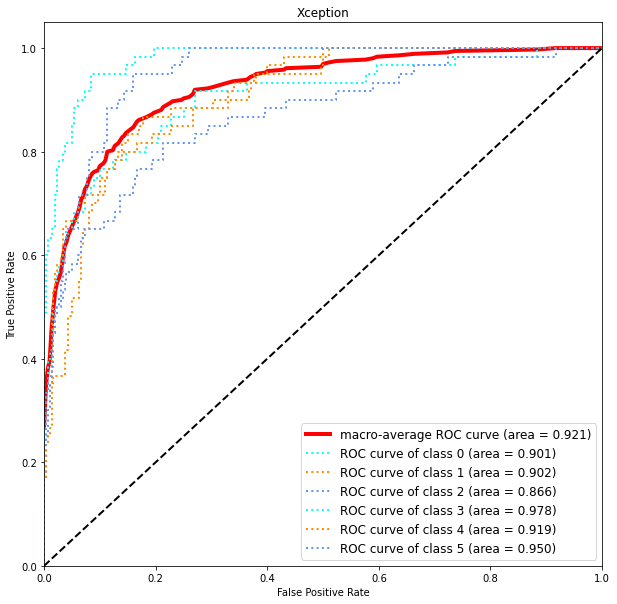

This is samplesize 400 2
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3237 - categorical_accuracy: 0.4868
Epoch 1: val_categorical_accuracy improved from -inf to 0.42802, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 515ms/step - loss: 1.3237 - categorical_accuracy: 0.4868 - val_loss: 2.5949 - val_categorical_accuracy: 0.4280 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0069 - categorical_accuracy: 0.6238
Epoch 2: val_categorical_accuracy did not improve from 0.42802
73/73 [==============================] - 36s 486ms/step - loss: 1.0069 - categorical_accuracy: 0.6238 - val_loss: 2.8943 - val_categorical_accuracy: 0.4086 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

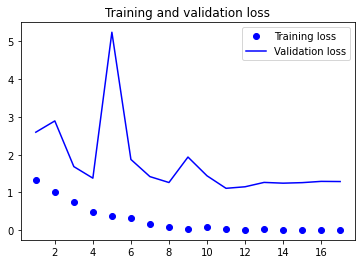

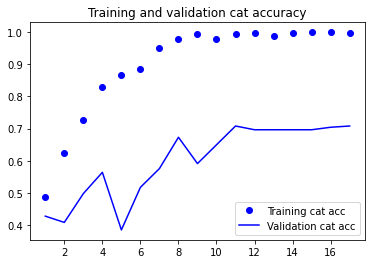

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  2  0  1  7  7]
 [ 8 38  4  2  4  4]
 [ 5  8 29 10  3  5]
 [ 1  1  7 49  1  1]
 [ 3  5  1  1 42  8]
 [10  2  0  0  0 48]]
              precision    recall  f1-score   support

         bcc       0.61      0.72      0.66        60
         bkl       0.68      0.63      0.66        60
         mel       0.71      0.48      0.57        60
          nv       0.78      0.82      0.80        60
      others       0.74      0.70      0.72        60
         scc       0.66      0.80      0.72        60

    accuracy                           0.69       360
   macro avg       0.70      0.69      0.69       360
weighted avg       0.70      0.69      0.69       360

Specificity of each class:
bcc : 0.910
bkl : 0.940
mel : 0.960
nv : 0.953
others : 0.950
scc : 0.917


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


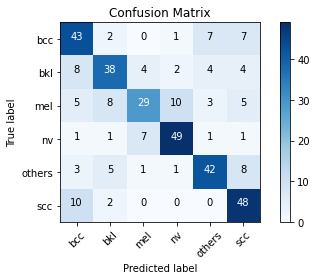

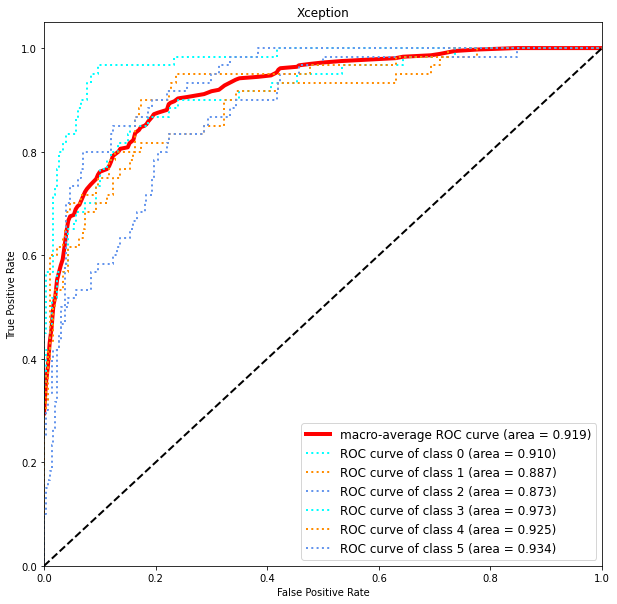

This is samplesize 400 3
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3534 - categorical_accuracy: 0.4846
Epoch 1: val_categorical_accuracy improved from -inf to 0.37354, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 512ms/step - loss: 1.3534 - categorical_accuracy: 0.4846 - val_loss: 2.7720 - val_categorical_accuracy: 0.3735 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0164 - categorical_accuracy: 0.6264
Epoch 2: val_categorical_accuracy improved from 0.37354 to 0.51751, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 500ms/step - loss: 1.0164 - categorical_accuracy: 0.6264 - val_loss: 2.2561 - val_categorical_accuracy: 0.5175 

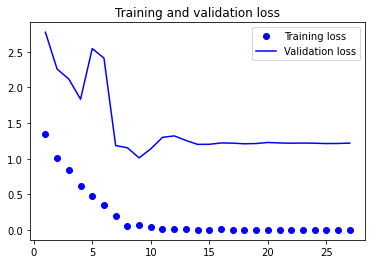

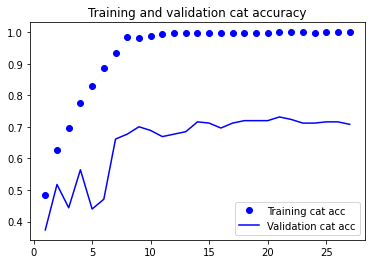

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[40  3  0  0  7 10]
 [ 2 42  3  5  2  6]
 [ 3  6 31 10  5  5]
 [ 0  4  7 46  3  0]
 [ 1  5  3  3 43  5]
 [ 3  2  4  0  4 47]]
              precision    recall  f1-score   support

         bcc       0.82      0.67      0.73        60
         bkl       0.68      0.70      0.69        60
         mel       0.65      0.52      0.57        60
          nv       0.72      0.77      0.74        60
      others       0.67      0.72      0.69        60
         scc       0.64      0.78      0.71        60

    accuracy                           0.69       360
   macro avg       0.70      0.69      0.69       360
weighted avg       0.70      0.69      0.69       360

Specificity of each class:
bcc : 0.970
bkl : 0.933
mel : 0.943
nv : 0.940
others : 0.930
scc : 0.913


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


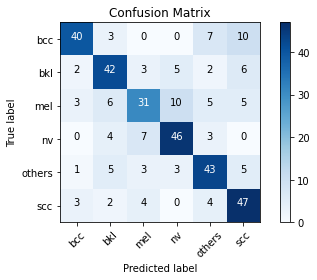

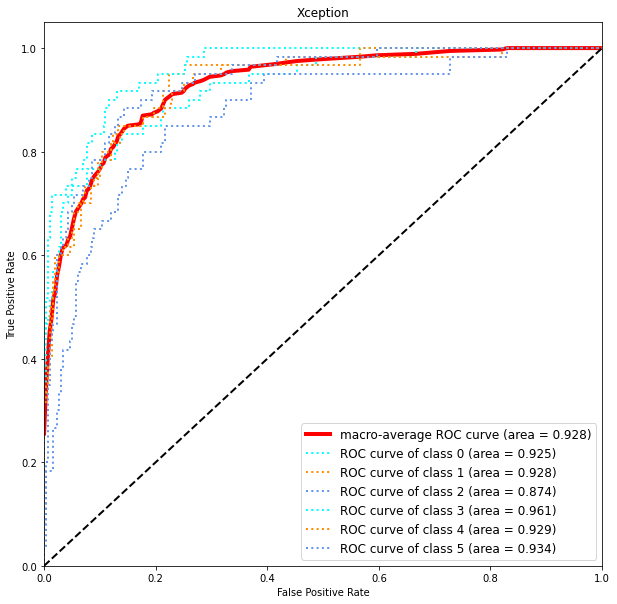

This is samplesize 400 4
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3282 - categorical_accuracy: 0.4902
Epoch 1: val_categorical_accuracy improved from -inf to 0.43580, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 511ms/step - loss: 1.3282 - categorical_accuracy: 0.4902 - val_loss: 2.7232 - val_categorical_accuracy: 0.4358 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9727 - categorical_accuracy: 0.6385
Epoch 2: val_categorical_accuracy did not improve from 0.43580
73/73 [==============================] - 36s 483ms/step - loss: 0.9727 - categorical_accuracy: 0.6385 - val_loss: 2.9923 - val_categorical_accuracy: 0.4086 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

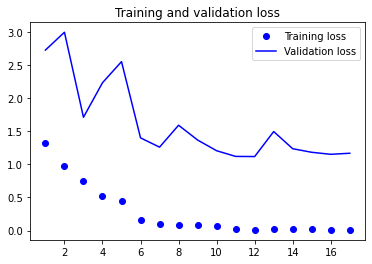

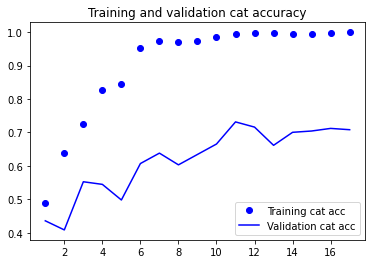

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[41  3  3  0  7  6]
 [ 4 43  4  3  5  1]
 [ 7  5 35  6  5  2]
 [ 2  1  8 47  2  0]
 [ 1  4  7  0 43  5]
 [ 7  1  3  0  6 43]]
              precision    recall  f1-score   support

         bcc       0.66      0.68      0.67        60
         bkl       0.75      0.72      0.74        60
         mel       0.58      0.58      0.58        60
          nv       0.84      0.78      0.81        60
      others       0.63      0.72      0.67        60
         scc       0.75      0.72      0.74        60

    accuracy                           0.70       360
   macro avg       0.70      0.70      0.70       360
weighted avg       0.70      0.70      0.70       360

Specificity of each class:
bcc : 0.930
bkl : 0.953
mel : 0.917
nv : 0.970
others : 0.917
scc : 0.953


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


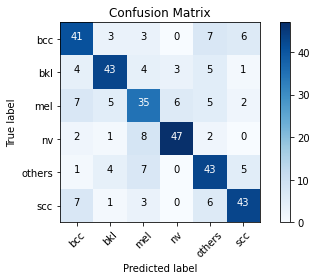

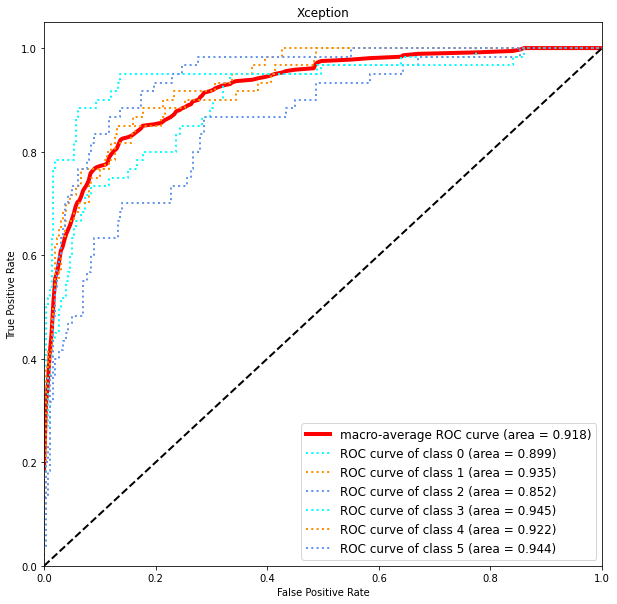

This is samplesize 400 5
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3219 - categorical_accuracy: 0.4842
Epoch 1: val_categorical_accuracy improved from -inf to 0.43969, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 512ms/step - loss: 1.3219 - categorical_accuracy: 0.4842 - val_loss: 2.5657 - val_categorical_accuracy: 0.4397 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9386 - categorical_accuracy: 0.6541
Epoch 2: val_categorical_accuracy did not improve from 0.43969
73/73 [==============================] - 36s 485ms/step - loss: 0.9386 - categorical_accuracy: 0.6541 - val_loss: 5.5495 - val_categorical_accuracy: 0.3230 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

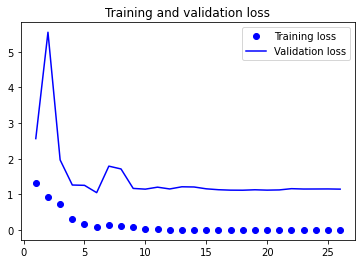

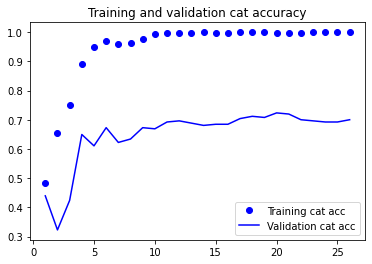

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[40  4  5  1  5  5]
 [ 6 36  6  4  5  3]
 [ 5 10 33  6  2  4]
 [ 2  1  7 49  1  0]
 [ 3  8  4  3 36  6]
 [ 4  3  1  1  3 48]]
              precision    recall  f1-score   support

         bcc       0.67      0.67      0.67        60
         bkl       0.58      0.60      0.59        60
         mel       0.59      0.55      0.57        60
          nv       0.77      0.82      0.79        60
      others       0.69      0.60      0.64        60
         scc       0.73      0.80      0.76        60

    accuracy                           0.67       360
   macro avg       0.67      0.67      0.67       360
weighted avg       0.67      0.67      0.67       360

Specificity of each class:
bcc : 0.933
bkl : 0.913
mel : 0.923
nv : 0.950
others : 0.947
scc : 0.940


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


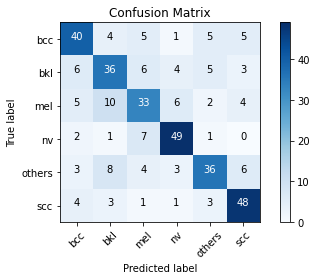

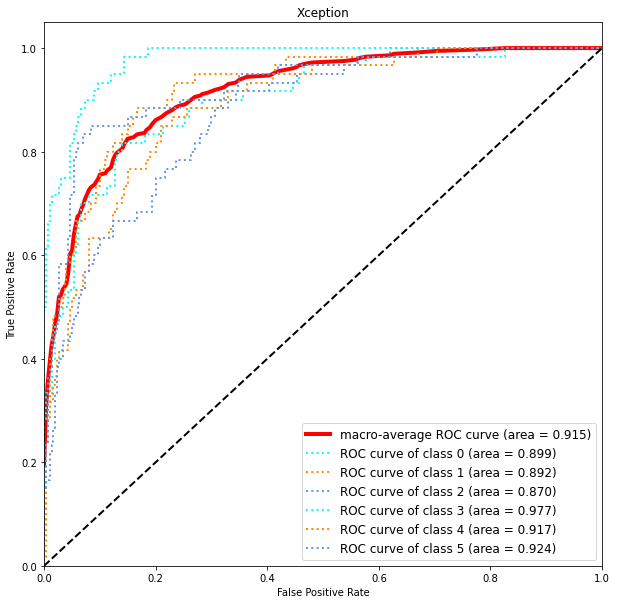

In [ ]:
train_model(400)

100%|██████████| 360/360 [00:01<00:00, 237.57it/s]


This is samplesize 400 1
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3231 - categorical_accuracy: 0.4816
Epoch 1: val_categorical_accuracy improved from -inf to 0.42802, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 513ms/step - loss: 1.3231 - categorical_accuracy: 0.4816 - val_loss: 2.4671 - val_categorical_accuracy: 0.4280 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0061 - categorical_accuracy: 0.6225
Epoch 2: val_categorical_accuracy did not improve from 0.42802
73/73 [==============================] - 36s 487ms/step - loss: 1.0061 - categorical_accuracy: 0.6225 - val_loss: 3.6440 - val_categorical_accuracy: 0.4241 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

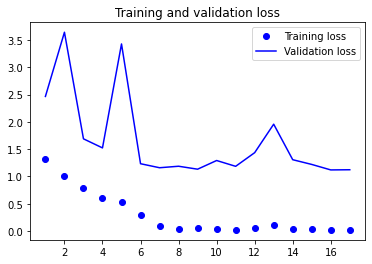

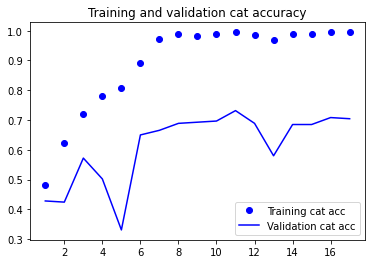

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[40  3  1  0 13  3]
 [ 4 39  6  4  6  1]
 [ 2  7 34  9  3  5]
 [ 1  2  5 50  2  0]
 [ 4  5  4  2 42  3]
 [ 9  1  0  0  8 42]]
              precision    recall  f1-score   support

         bcc       0.67      0.67      0.67        60
         bkl       0.68      0.65      0.67        60
         mel       0.68      0.57      0.62        60
          nv       0.77      0.83      0.80        60
      others       0.57      0.70      0.63        60
         scc       0.78      0.70      0.74        60

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.69       360
weighted avg       0.69      0.69      0.69       360

Specificity of each class:
bcc : 0.933
bkl : 0.940
mel : 0.947
nv : 0.950
others : 0.893
scc : 0.960


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


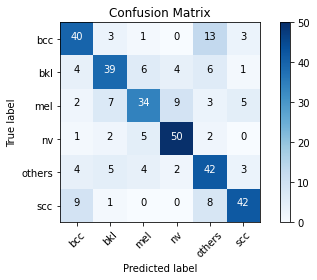

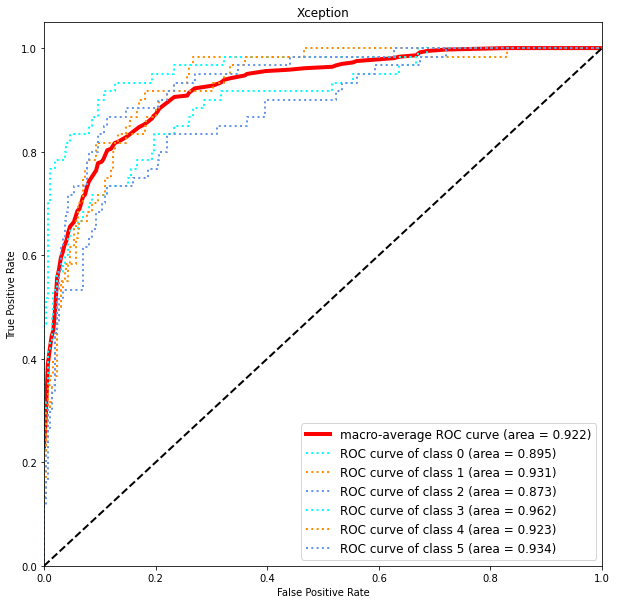

This is samplesize 400 2
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3672 - categorical_accuracy: 0.4655
Epoch 1: val_categorical_accuracy improved from -inf to 0.43580, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 515ms/step - loss: 1.3672 - categorical_accuracy: 0.4655 - val_loss: 2.6715 - val_categorical_accuracy: 0.4358 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9808 - categorical_accuracy: 0.6398
Epoch 2: val_categorical_accuracy improved from 0.43580 to 0.45525, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 499ms/step - loss: 0.9808 - categorical_accuracy: 0.6398 - val_loss: 2.4086 - val_categorical_accuracy: 0.4553 

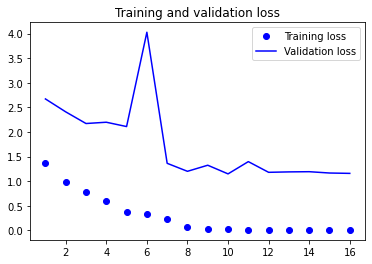

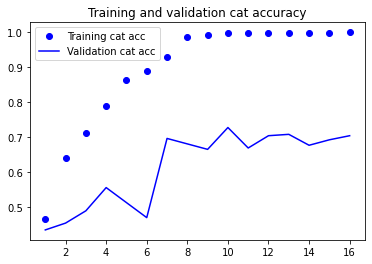

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[28  1  6  2 12 11]
 [ 2 37  6  3  8  4]
 [ 1  4 40  7  4  4]
 [ 1  2  7 46  3  1]
 [ 0  3  3  0 45  9]
 [ 0  3  1  0  5 51]]
              precision    recall  f1-score   support

         bcc       0.88      0.47      0.61        60
         bkl       0.74      0.62      0.67        60
         mel       0.63      0.67      0.65        60
          nv       0.79      0.77      0.78        60
      others       0.58      0.75      0.66        60
         scc       0.64      0.85      0.73        60

    accuracy                           0.69       360
   macro avg       0.71      0.69      0.68       360
weighted avg       0.71      0.69      0.68       360

Specificity of each class:
bcc : 0.987
bkl : 0.957
mel : 0.923
nv : 0.960
others : 0.893
scc : 0.903


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


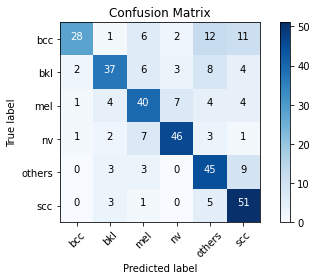

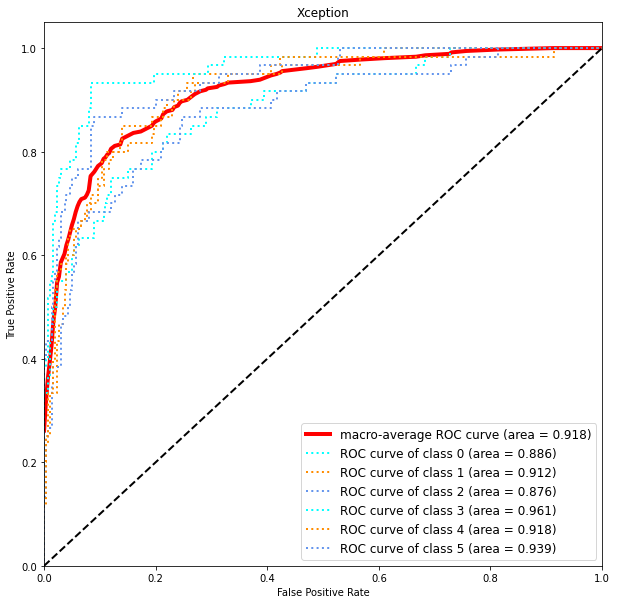

This is samplesize 400 3
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3262 - categorical_accuracy: 0.4894
Epoch 1: val_categorical_accuracy improved from -inf to 0.39300, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 511ms/step - loss: 1.3262 - categorical_accuracy: 0.4894 - val_loss: 5.3643 - val_categorical_accuracy: 0.3930 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9544 - categorical_accuracy: 0.6329
Epoch 2: val_categorical_accuracy improved from 0.39300 to 0.51362, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 501ms/step - loss: 0.9544 - categorical_accuracy: 0.6329 - val_loss: 2.2029 - val_categorical_accuracy: 0.5136 

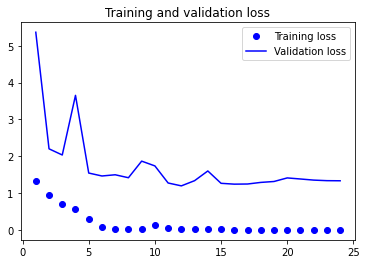

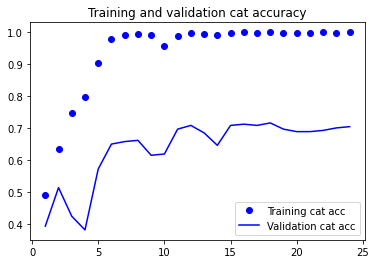

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[40  5  2  3  4  6]
 [ 6 39  6  2  5  2]
 [ 3  5 37  7  2  6]
 [ 0  1  8 49  1  1]
 [ 2  7  1  2 40  8]
 [ 4  3  1  1  5 46]]
              precision    recall  f1-score   support

         bcc       0.73      0.67      0.70        60
         bkl       0.65      0.65      0.65        60
         mel       0.67      0.62      0.64        60
          nv       0.77      0.82      0.79        60
      others       0.70      0.67      0.68        60
         scc       0.67      0.77      0.71        60

    accuracy                           0.70       360
   macro avg       0.70      0.70      0.70       360
weighted avg       0.70      0.70      0.70       360

Specificity of each class:
bcc : 0.950
bkl : 0.930
mel : 0.940
nv : 0.950
others : 0.943
scc : 0.923


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


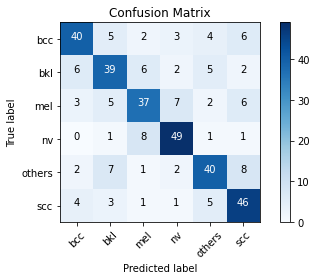

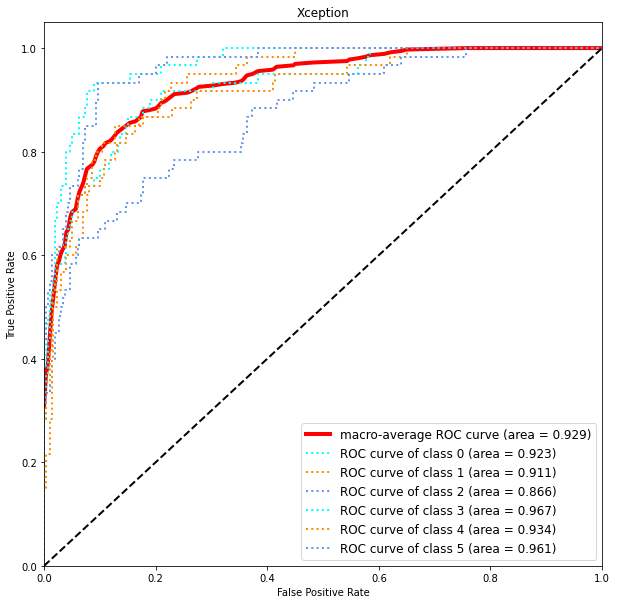

This is samplesize 400 4
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3587 - categorical_accuracy: 0.4742
Epoch 1: val_categorical_accuracy improved from -inf to 0.42802, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 512ms/step - loss: 1.3587 - categorical_accuracy: 0.4742 - val_loss: 1.4821 - val_categorical_accuracy: 0.4280 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9380 - categorical_accuracy: 0.6493
Epoch 2: val_categorical_accuracy did not improve from 0.42802
73/73 [==============================] - 36s 485ms/step - loss: 0.9380 - categorical_accuracy: 0.6493 - val_loss: 4.2425 - val_categorical_accuracy: 0.3074 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

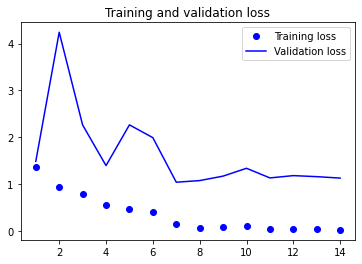

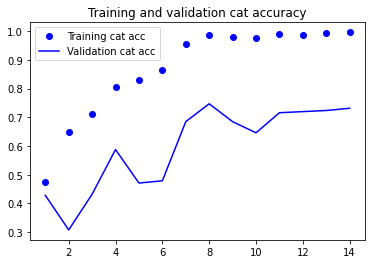

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[31  2  2  0 13 12]
 [ 2 40  6  2  8  2]
 [ 1 10 36  7  3  3]
 [ 2  2  7 46  0  3]
 [ 0  7  2  2 44  5]
 [ 3  2  1  0  5 49]]
              precision    recall  f1-score   support

         bcc       0.79      0.52      0.63        60
         bkl       0.63      0.67      0.65        60
         mel       0.67      0.60      0.63        60
          nv       0.81      0.77      0.79        60
      others       0.60      0.73      0.66        60
         scc       0.66      0.82      0.73        60

    accuracy                           0.68       360
   macro avg       0.69      0.68      0.68       360
weighted avg       0.69      0.68      0.68       360

Specificity of each class:
bcc : 0.973
bkl : 0.923
mel : 0.940
nv : 0.963
others : 0.903
scc : 0.917


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


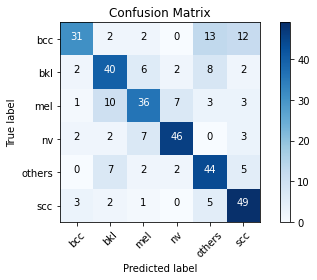

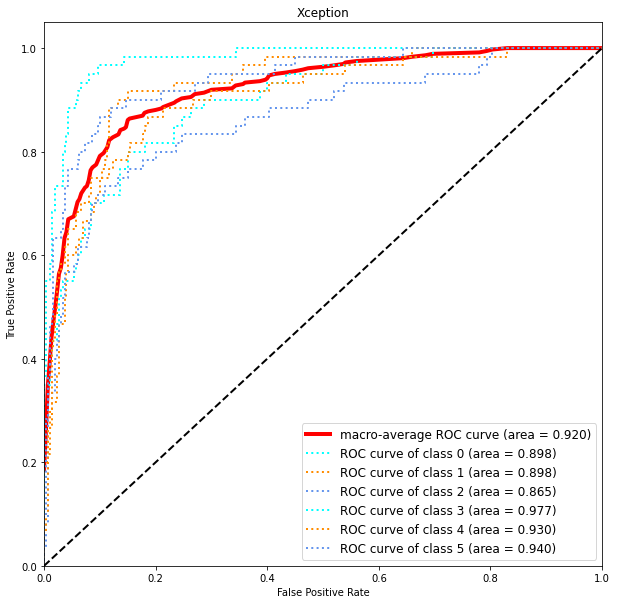

This is samplesize 400 5
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3373 - categorical_accuracy: 0.4920
Epoch 1: val_categorical_accuracy improved from -inf to 0.49027, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 512ms/step - loss: 1.3373 - categorical_accuracy: 0.4920 - val_loss: 1.9253 - val_categorical_accuracy: 0.4903 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9698 - categorical_accuracy: 0.6355
Epoch 2: val_categorical_accuracy improved from 0.49027 to 0.50973, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 497ms/step - loss: 0.9698 - categorical_accuracy: 0.6355 - val_loss: 2.3158 - val_categorical_accuracy: 0.5097 

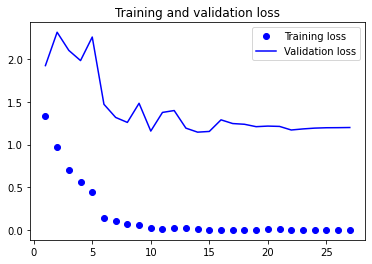

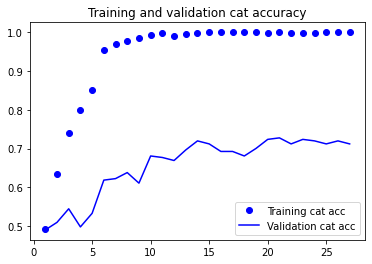

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[39  4  3  1  7  6]
 [ 3 43  6  1  3  4]
 [ 5 11 31  8  2  3]
 [ 2  3  4 48  2  1]
 [ 2  9  3  1 37  8]
 [ 4  3  1  0  3 49]]
              precision    recall  f1-score   support

         bcc       0.71      0.65      0.68        60
         bkl       0.59      0.72      0.65        60
         mel       0.65      0.52      0.57        60
          nv       0.81      0.80      0.81        60
      others       0.69      0.62      0.65        60
         scc       0.69      0.82      0.75        60

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.68       360
weighted avg       0.69      0.69      0.68       360

Specificity of each class:
bcc : 0.947
bkl : 0.900
mel : 0.943
nv : 0.963
others : 0.943
scc : 0.927


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


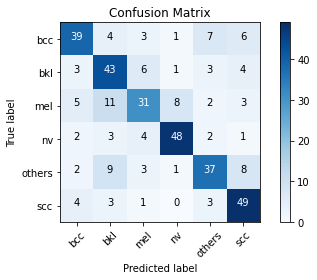

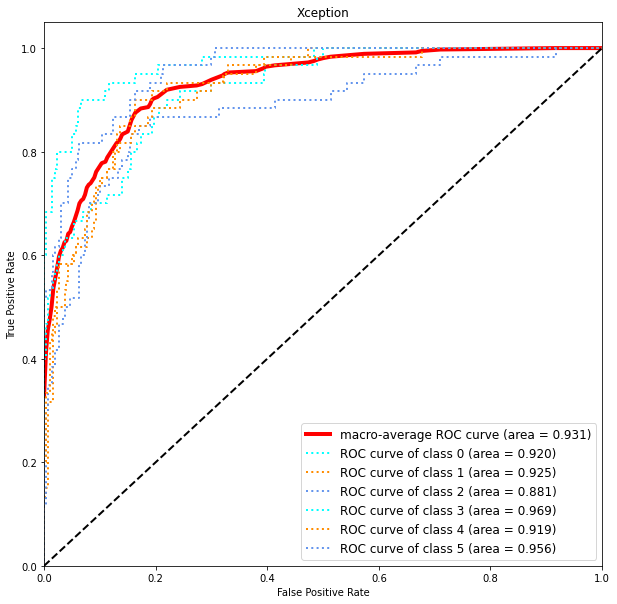

In [ ]:
train_model(400)

100%|██████████| 360/360 [00:03<00:00, 118.97it/s]


This is samplesize 400 1
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3696 - categorical_accuracy: 0.4707
Epoch 1: val_categorical_accuracy improved from -inf to 0.43969, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 511ms/step - loss: 1.3696 - categorical_accuracy: 0.4707 - val_loss: 2.2356 - val_categorical_accuracy: 0.4397 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9754 - categorical_accuracy: 0.6398
Epoch 2: val_categorical_accuracy improved from 0.43969 to 0.52529, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 498ms/step - loss: 0.9754 - categorical_accuracy: 0.6398 - val_loss: 4.1072 - val_categorical_accuracy: 0.5253 

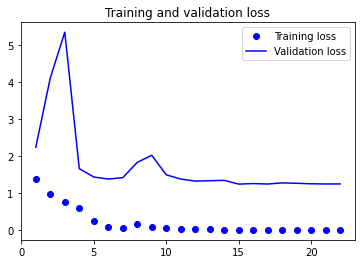

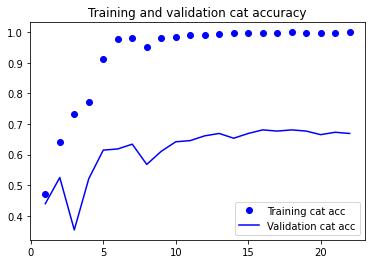

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[38  3  2  0  6 11]
 [ 5 44  2  1  1  7]
 [ 3 10 32  7  4  4]
 [ 2  1  8 47  1  1]
 [ 0  6  0  0 46  8]
 [ 1  2  2  0  4 51]]
              precision    recall  f1-score   support

         bcc       0.78      0.63      0.70        60
         bkl       0.67      0.73      0.70        60
         mel       0.70      0.53      0.60        60
          nv       0.85      0.78      0.82        60
      others       0.74      0.77      0.75        60
         scc       0.62      0.85      0.72        60

    accuracy                           0.72       360
   macro avg       0.73      0.72      0.71       360
weighted avg       0.73      0.72      0.71       360

Specificity of each class:
bcc : 0.963
bkl : 0.927
mel : 0.953
nv : 0.973
others : 0.947
scc : 0.897


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


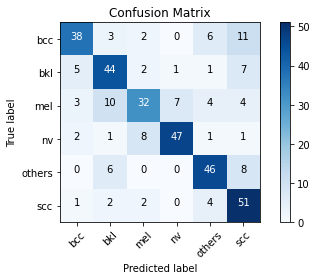

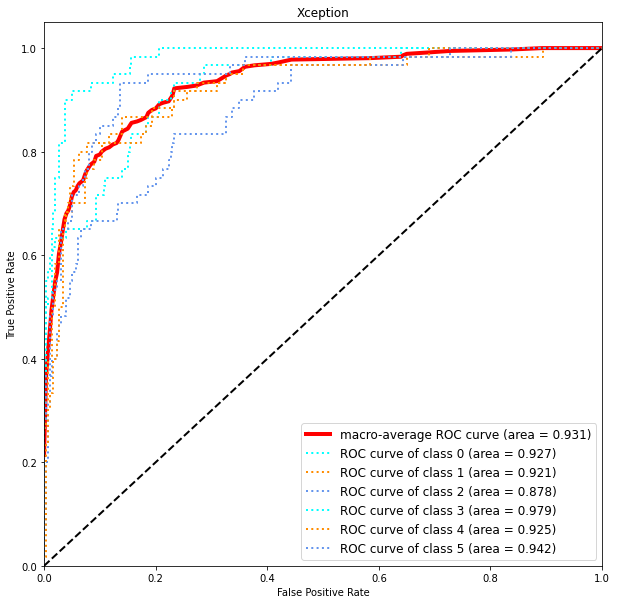

This is samplesize 400 2
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3403 - categorical_accuracy: 0.4920
Epoch 1: val_categorical_accuracy improved from -inf to 0.33463, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 513ms/step - loss: 1.3403 - categorical_accuracy: 0.4920 - val_loss: 6.4201 - val_categorical_accuracy: 0.3346 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9801 - categorical_accuracy: 0.6415
Epoch 2: val_categorical_accuracy improved from 0.33463 to 0.50195, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 498ms/step - loss: 0.9801 - categorical_accuracy: 0.6415 - val_loss: 1.3835 - val_categorical_accuracy: 0.5019 

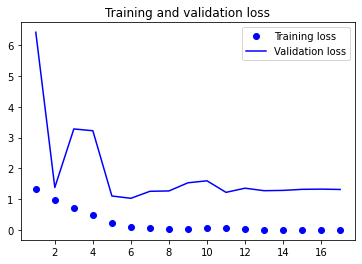

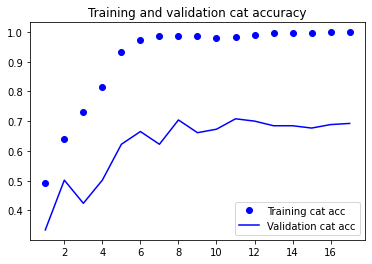

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[38  4  2  0  8  8]
 [ 3 45  2  2  4  4]
 [ 3 10 33  6  3  5]
 [ 1  3  7 48  1  0]
 [ 4  9  1  2 41  3]
 [ 4  3  2  0  7 44]]
              precision    recall  f1-score   support

         bcc       0.72      0.63      0.67        60
         bkl       0.61      0.75      0.67        60
         mel       0.70      0.55      0.62        60
          nv       0.83      0.80      0.81        60
      others       0.64      0.68      0.66        60
         scc       0.69      0.73      0.71        60

    accuracy                           0.69       360
   macro avg       0.70      0.69      0.69       360
weighted avg       0.70      0.69      0.69       360

Specificity of each class:
bcc : 0.950
bkl : 0.903
mel : 0.953
nv : 0.967
others : 0.923
scc : 0.933


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


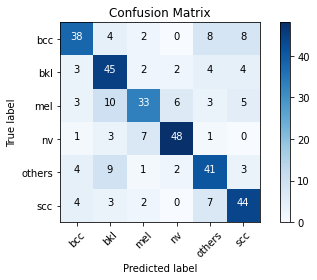

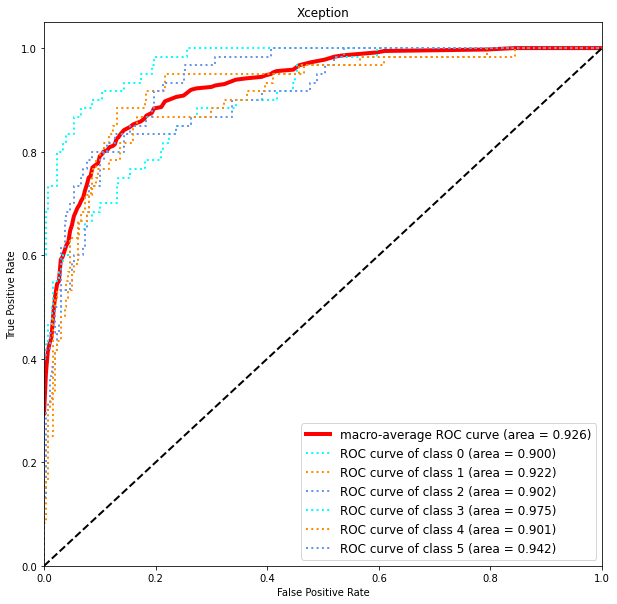

This is samplesize 400 3
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3022 - categorical_accuracy: 0.5033
Epoch 1: val_categorical_accuracy improved from -inf to 0.44747, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 513ms/step - loss: 1.3022 - categorical_accuracy: 0.5033 - val_loss: 2.3007 - val_categorical_accuracy: 0.4475 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9650 - categorical_accuracy: 0.6402
Epoch 2: val_categorical_accuracy improved from 0.44747 to 0.54864, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 498ms/step - loss: 0.9650 - categorical_accuracy: 0.6402 - val_loss: 1.3979 - val_categorical_accuracy: 0.5486 

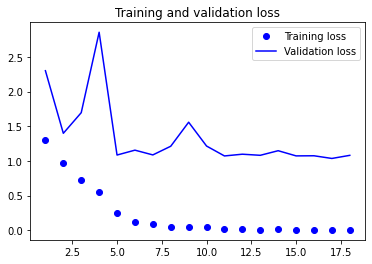

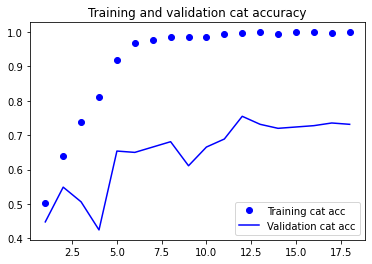

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[38  2  2  3  3 12]
 [ 5 42  4  3  4  2]
 [ 3  8 32  6  4  7]
 [ 2  0  6 49  3  0]
 [ 3  6  1  1 41  8]
 [ 8  3  1  0  2 46]]
              precision    recall  f1-score   support

         bcc       0.64      0.63      0.64        60
         bkl       0.69      0.70      0.69        60
         mel       0.70      0.53      0.60        60
          nv       0.79      0.82      0.80        60
      others       0.72      0.68      0.70        60
         scc       0.61      0.77      0.68        60

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.69       360
weighted avg       0.69      0.69      0.69       360

Specificity of each class:
bcc : 0.930
bkl : 0.937
mel : 0.953
nv : 0.957
others : 0.947
scc : 0.903


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


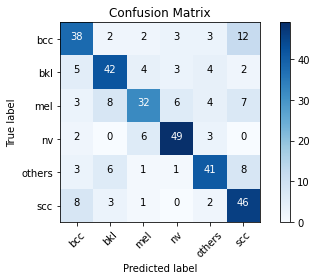

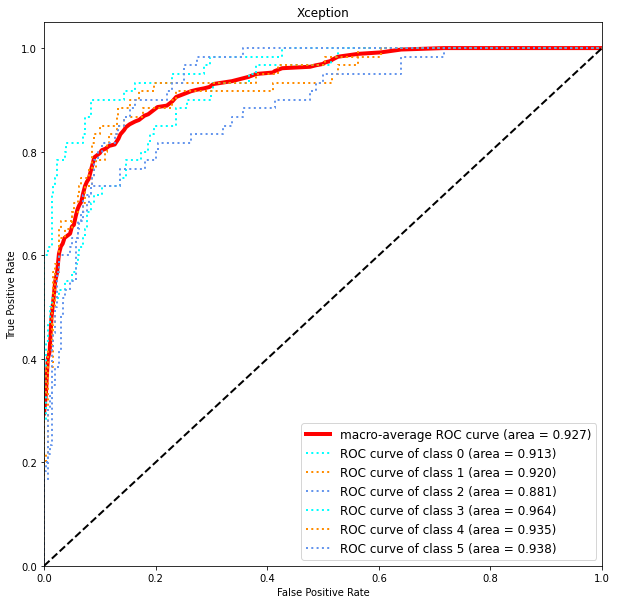

This is samplesize 400 4
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3589 - categorical_accuracy: 0.4764
Epoch 1: val_categorical_accuracy improved from -inf to 0.42023, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 514ms/step - loss: 1.3589 - categorical_accuracy: 0.4764 - val_loss: 2.4229 - val_categorical_accuracy: 0.4202 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9772 - categorical_accuracy: 0.6424
Epoch 2: val_categorical_accuracy did not improve from 0.42023
73/73 [==============================] - 36s 486ms/step - loss: 0.9772 - categorical_accuracy: 0.6424 - val_loss: 4.7479 - val_categorical_accuracy: 0.3541 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

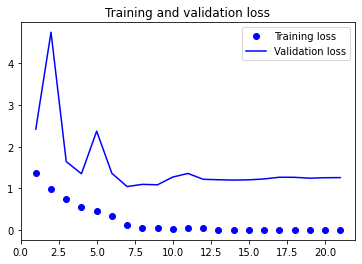

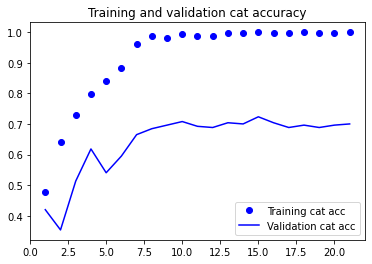

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[41  4  2  0  5  8]
 [ 3 43  6  3  3  2]
 [ 3  7 34  9  3  4]
 [ 1  1  9 46  3  0]
 [ 2  5  1  1 46  5]
 [ 4  2  1  0  3 50]]
              precision    recall  f1-score   support

         bcc       0.76      0.68      0.72        60
         bkl       0.69      0.72      0.70        60
         mel       0.64      0.57      0.60        60
          nv       0.78      0.77      0.77        60
      others       0.73      0.77      0.75        60
         scc       0.72      0.83      0.78        60

    accuracy                           0.72       360
   macro avg       0.72      0.72      0.72       360
weighted avg       0.72      0.72      0.72       360

Specificity of each class:
bcc : 0.957
bkl : 0.937
mel : 0.937
nv : 0.957
others : 0.943
scc : 0.937


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


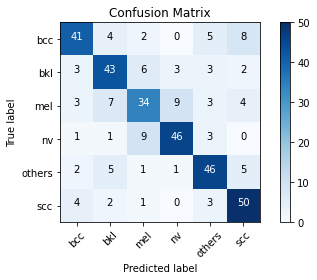

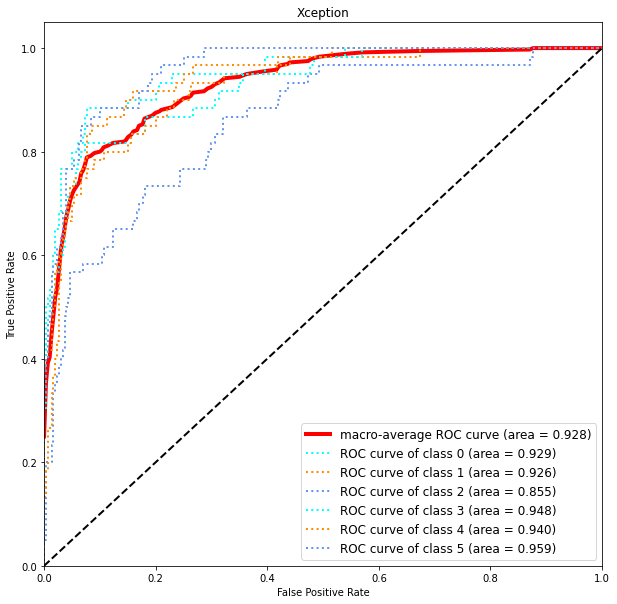

This is samplesize 400 5
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3394 - categorical_accuracy: 0.4859
Epoch 1: val_categorical_accuracy improved from -inf to 0.47471, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 516ms/step - loss: 1.3394 - categorical_accuracy: 0.4859 - val_loss: 1.5477 - val_categorical_accuracy: 0.4747 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9374 - categorical_accuracy: 0.6576
Epoch 2: val_categorical_accuracy improved from 0.47471 to 0.48638, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 501ms/step - loss: 0.9374 - categorical_accuracy: 0.6576 - val_loss: 2.7709 - val_categorical_accuracy: 0.4864 

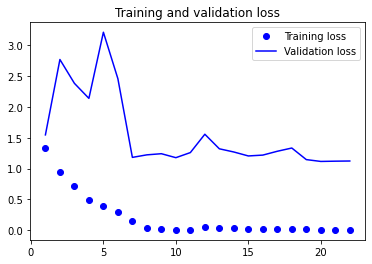

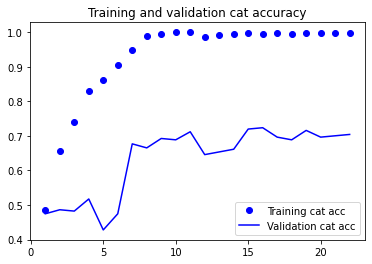

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[39  3  2  0  8  8]
 [ 7 42  4  1  2  4]
 [ 5 10 29  7  7  2]
 [ 1  5  7 43  4  0]
 [ 2  9  1  1 41  6]
 [ 6  4  1  0  5 44]]
              precision    recall  f1-score   support

         bcc       0.65      0.65      0.65        60
         bkl       0.58      0.70      0.63        60
         mel       0.66      0.48      0.56        60
          nv       0.83      0.72      0.77        60
      others       0.61      0.68      0.65        60
         scc       0.69      0.73      0.71        60

    accuracy                           0.66       360
   macro avg       0.67      0.66      0.66       360
weighted avg       0.67      0.66      0.66       360

Specificity of each class:
bcc : 0.930
bkl : 0.897
mel : 0.950
nv : 0.970
others : 0.913
scc : 0.933


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


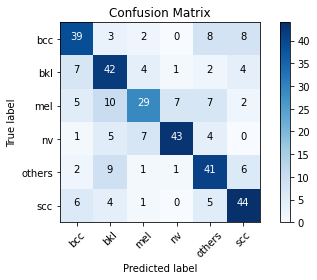

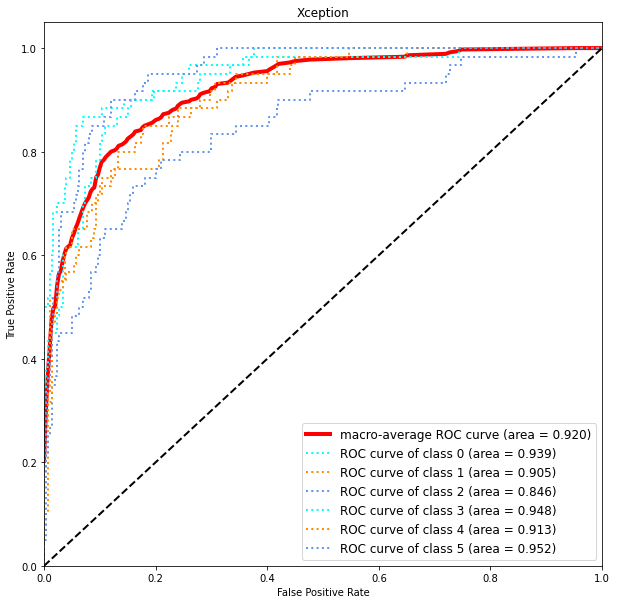

In [ ]:
train_model(400)

100%|██████████| 360/360 [00:02<00:00, 150.75it/s]


This is samplesize 400 1
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3646 - categorical_accuracy: 0.4725
Epoch 1: val_categorical_accuracy improved from -inf to 0.34630, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 43s 515ms/step - loss: 1.3646 - categorical_accuracy: 0.4725 - val_loss: 2.2073 - val_categorical_accuracy: 0.3463 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0151 - categorical_accuracy: 0.6359
Epoch 2: val_categorical_accuracy improved from 0.34630 to 0.43969, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 499ms/step - loss: 1.0151 - categorical_accuracy: 0.6359 - val_loss: 3.2312 - val_categorical_accuracy: 0.4397 

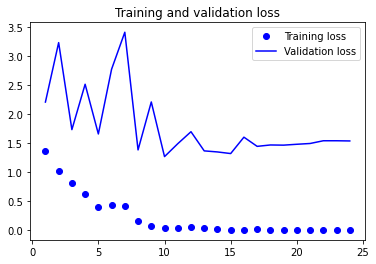

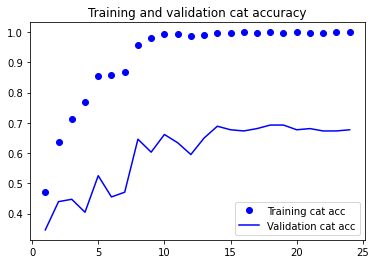

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[40  3  2  0  9  6]
 [ 3 43  4  1  3  6]
 [ 2  7 37  6  2  6]
 [ 0  2  9 45  2  2]
 [ 1  7  3  2 43  4]
 [ 5  5  1  0  6 43]]
              precision    recall  f1-score   support

         bcc       0.78      0.67      0.72        60
         bkl       0.64      0.72      0.68        60
         mel       0.66      0.62      0.64        60
          nv       0.83      0.75      0.79        60
      others       0.66      0.72      0.69        60
         scc       0.64      0.72      0.68        60

    accuracy                           0.70       360
   macro avg       0.70      0.70      0.70       360
weighted avg       0.70      0.70      0.70       360

Specificity of each class:
bcc : 0.963
bkl : 0.920
mel : 0.937
nv : 0.970
others : 0.927
scc : 0.920


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


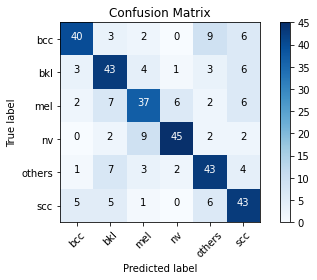

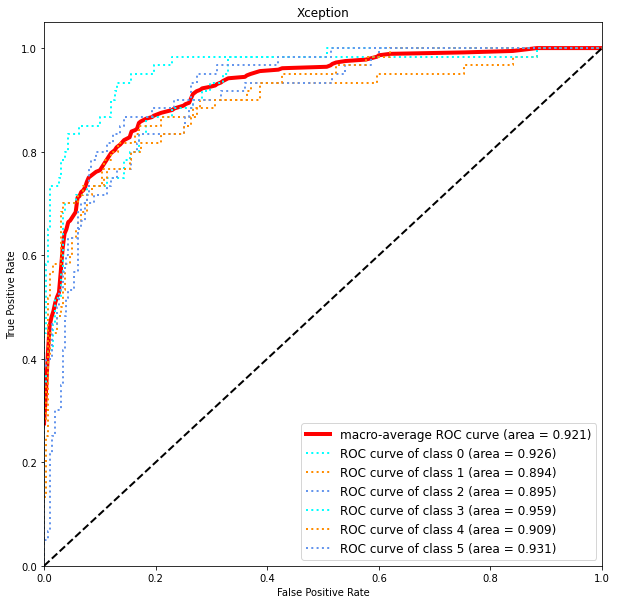

This is samplesize 400 2
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3307 - categorical_accuracy: 0.4989
Epoch 1: val_categorical_accuracy improved from -inf to 0.45914, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 43s 517ms/step - loss: 1.3307 - categorical_accuracy: 0.4989 - val_loss: 3.8401 - val_categorical_accuracy: 0.4591 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 0.9680 - categorical_accuracy: 0.6415
Epoch 2: val_categorical_accuracy did not improve from 0.45914
73/73 [==============================] - 36s 487ms/step - loss: 0.9680 - categorical_accuracy: 0.6415 - val_loss: 1.9817 - val_categorical_accuracy: 0.4241 - lr: 0.0010
Epoch 3/60
73/73 [==============================] -

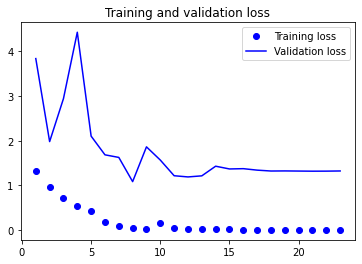

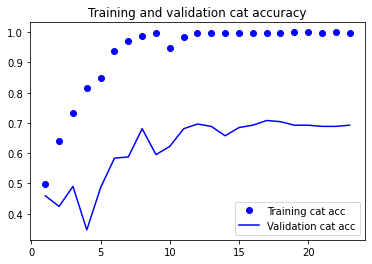

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[35  2  5  1  5 12]
 [ 6 40  3  2  5  4]
 [ 2  9 31  8  2  8]
 [ 1  0  7 49  2  1]
 [ 2  6  4  1 41  6]
 [ 2  1  4  0  2 51]]
              precision    recall  f1-score   support

         bcc       0.73      0.58      0.65        60
         bkl       0.69      0.67      0.68        60
         mel       0.57      0.52      0.54        60
          nv       0.80      0.82      0.81        60
      others       0.72      0.68      0.70        60
         scc       0.62      0.85      0.72        60

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.68       360
weighted avg       0.69      0.69      0.68       360

Specificity of each class:
bcc : 0.957
bkl : 0.940
mel : 0.923
nv : 0.960
others : 0.947
scc : 0.897


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


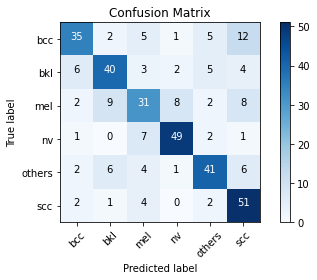

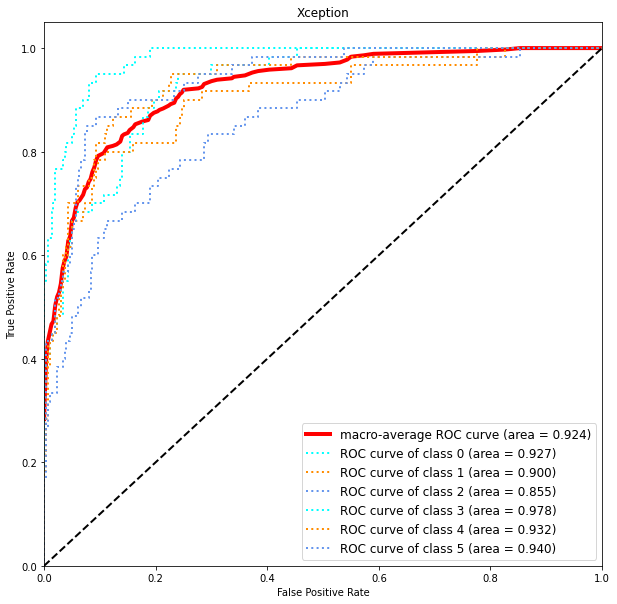

This is samplesize 400 3
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3218 - categorical_accuracy: 0.4781
Epoch 1: val_categorical_accuracy improved from -inf to 0.38132, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 515ms/step - loss: 1.3218 - categorical_accuracy: 0.4781 - val_loss: 2.6632 - val_categorical_accuracy: 0.3813 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0205 - categorical_accuracy: 0.6225
Epoch 2: val_categorical_accuracy did not improve from 0.38132
73/73 [==============================] - 36s 488ms/step - loss: 1.0205 - categorical_accuracy: 0.6225 - val_loss: 10.9135 - val_categorical_accuracy: 0.2179 - lr: 0.0010
Epoch 3/60
73/73 [==============================] 

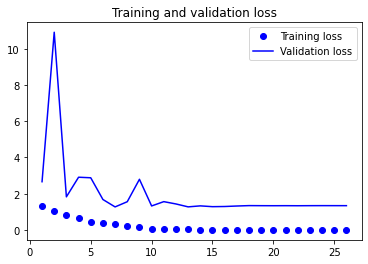

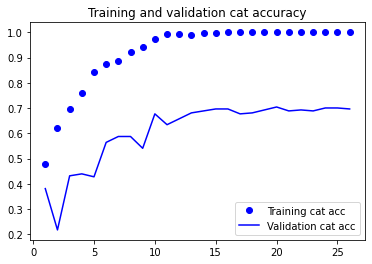

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[38  5  0  0  9  8]
 [ 5 42  4  3  3  3]
 [ 7 14 26  8  3  2]
 [ 2  4  4 47  2  1]
 [ 1  6  3  0 46  4]
 [ 6  0  3  0  4 47]]
              precision    recall  f1-score   support

         bcc       0.64      0.63      0.64        60
         bkl       0.59      0.70      0.64        60
         mel       0.65      0.43      0.52        60
          nv       0.81      0.78      0.80        60
      others       0.69      0.77      0.72        60
         scc       0.72      0.78      0.75        60

    accuracy                           0.68       360
   macro avg       0.68      0.68      0.68       360
weighted avg       0.68      0.68      0.68       360

Specificity of each class:
bcc : 0.930
bkl : 0.903
mel : 0.953
nv : 0.963
others : 0.930
scc : 0.940


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


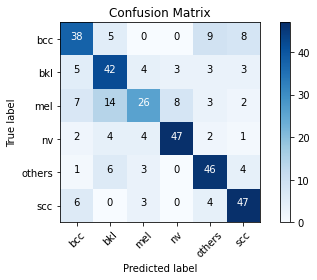

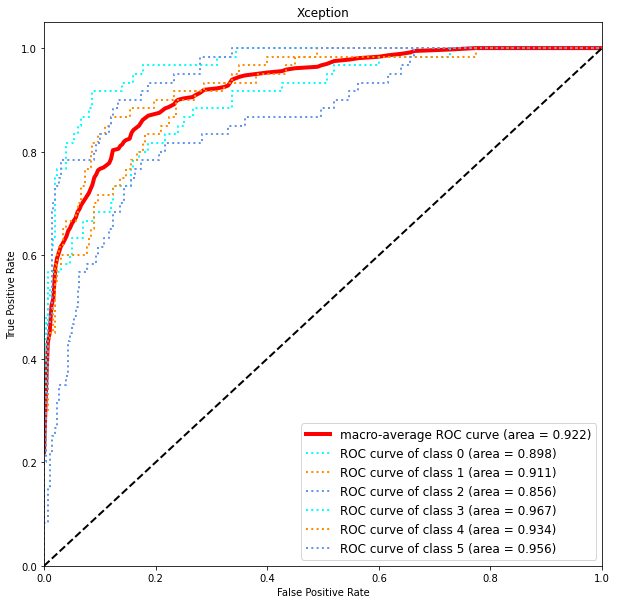

This is samplesize 400 4
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3273 - categorical_accuracy: 0.5015
Epoch 1: val_categorical_accuracy improved from -inf to 0.29961, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 515ms/step - loss: 1.3273 - categorical_accuracy: 0.5015 - val_loss: 8.6945 - val_categorical_accuracy: 0.2996 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0069 - categorical_accuracy: 0.6177
Epoch 2: val_categorical_accuracy improved from 0.29961 to 0.43969, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 500ms/step - loss: 1.0069 - categorical_accuracy: 0.6177 - val_loss: 2.6989 - val_categorical_accuracy: 0.4397 

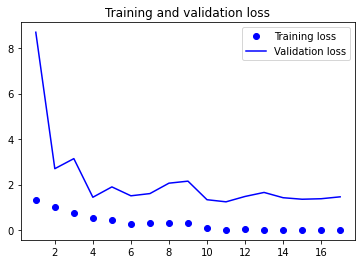

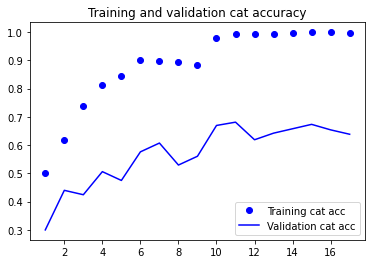

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  5  0  0  7  5]
 [ 4 44  0  2  4  6]
 [ 7 17 17 10  1  8]
 [ 2  0  1 56  0  1]
 [ 1  7  1  1 45  5]
 [ 6  2  0  0  6 46]]
              precision    recall  f1-score   support

         bcc       0.68      0.72      0.70        60
         bkl       0.59      0.73      0.65        60
         mel       0.89      0.28      0.43        60
          nv       0.81      0.93      0.87        60
      others       0.71      0.75      0.73        60
         scc       0.65      0.77      0.70        60

    accuracy                           0.70       360
   macro avg       0.72      0.70      0.68       360
weighted avg       0.72      0.70      0.68       360

Specificity of each class:
bcc : 0.933
bkl : 0.897
mel : 0.993
nv : 0.957
others : 0.940
scc : 0.917


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


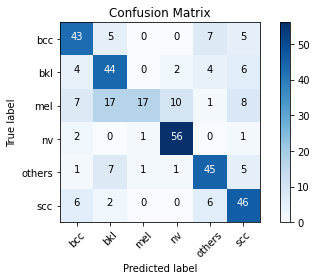

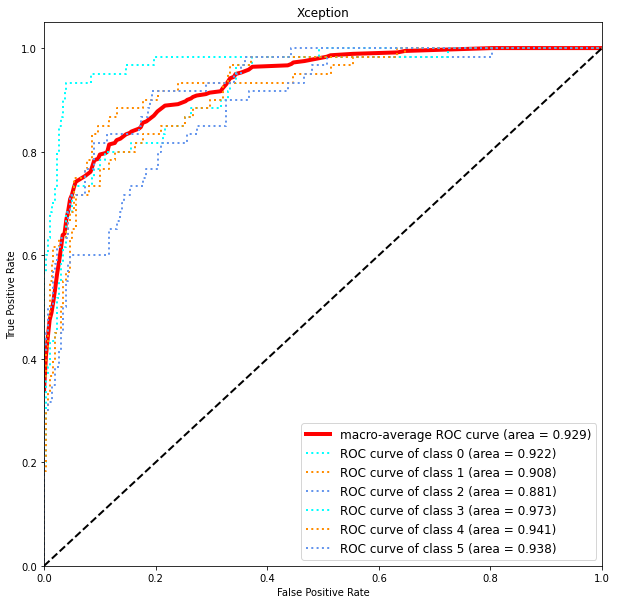

This is samplesize 400 5
Found 2307 images belonging to 6 classes.
Found 257 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 1.3588 - categorical_accuracy: 0.4707
Epoch 1: val_categorical_accuracy improved from -inf to 0.25681, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 42s 514ms/step - loss: 1.3588 - categorical_accuracy: 0.4707 - val_loss: 3.5704 - val_categorical_accuracy: 0.2568 - lr: 0.0010
Epoch 2/60
73/73 [==============================] - ETA: 0s - loss: 1.0797 - categorical_accuracy: 0.5869
Epoch 2: val_categorical_accuracy improved from 0.25681 to 0.47860, saving model to Model/Skin Lesion 299 Random resize 92%.h5
73/73 [==============================] - 37s 501ms/step - loss: 1.0797 - categorical_accuracy: 0.5869 - val_loss: 2.1230 - val_categorical_accuracy: 0.4786 

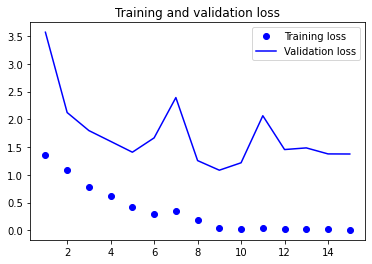

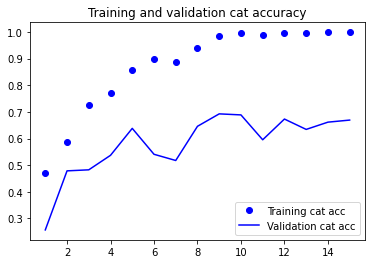

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[37  3  2  1 10  7]
 [ 4 34  2  7  7  6]
 [ 4  7 23 17  4  5]
 [ 1  3  2 53  0  1]
 [ 2  4  1  2 46  5]
 [ 8  2  1  1  5 43]]
              precision    recall  f1-score   support

         bcc       0.66      0.62      0.64        60
         bkl       0.64      0.57      0.60        60
         mel       0.74      0.38      0.51        60
          nv       0.65      0.88      0.75        60
      others       0.64      0.77      0.70        60
         scc       0.64      0.72      0.68        60

    accuracy                           0.66       360
   macro avg       0.66      0.66      0.65       360
weighted avg       0.66      0.66      0.65       360

Specificity of each class:
bcc : 0.937
bkl : 0.937
mel : 0.973
nv : 0.907
others : 0.913
scc : 0.920


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


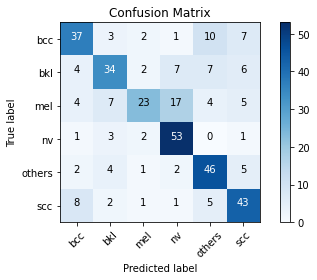

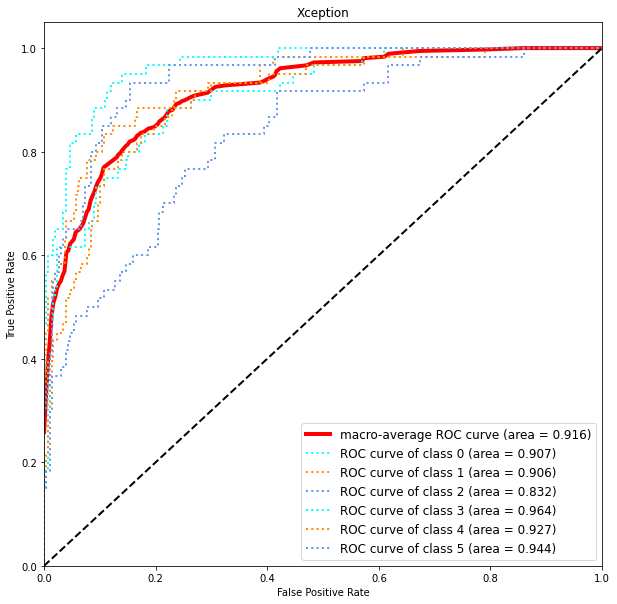

In [ ]:
train_model(400)

## 800

100%|██████████| 360/360 [00:00<00:00, 372.48it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2622 - categorical_accuracy: 0.5129
Epoch 1: val_categorical_accuracy improved from -inf to 0.47598, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 71s 512ms/step - loss: 1.2622 - categorical_accuracy: 0.5129 - val_loss: 1.8820 - val_categorical_accuracy: 0.4760 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9328 - categorical_accuracy: 0.6543
Epoch 2: val_categorical_accuracy improved from 0.47598 to 0.53712, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 498ms/step - loss: 0.9328 - categorical_accuracy: 0.6543 - val_loss: 1.3850 - val_categorical_accuracy:

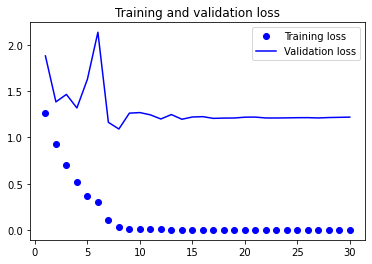

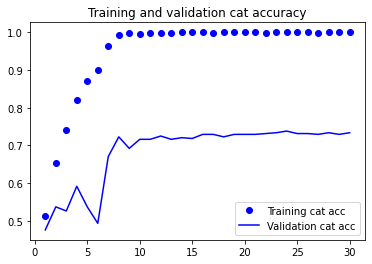

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[45  1  2  0  6  6]
 [ 2 47  4  0  5  2]
 [ 2  9 37  7  2  3]
 [ 1  7  3 48  1  0]
 [ 0  4  2  0 52  2]
 [ 5  2  7  0  5 41]]
              precision    recall  f1-score   support

         bcc       0.82      0.75      0.78        60
         bkl       0.67      0.78      0.72        60
         mel       0.67      0.62      0.64        60
          nv       0.87      0.80      0.83        60
      others       0.73      0.87      0.79        60
         scc       0.76      0.68      0.72        60

    accuracy                           0.75       360
   macro avg       0.75      0.75      0.75       360
weighted avg       0.75      0.75      0.75       360

Specificity of each class:
bcc : 0.967
bkl : 0.923
mel : 0.940
nv : 0.977
others : 0.937
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


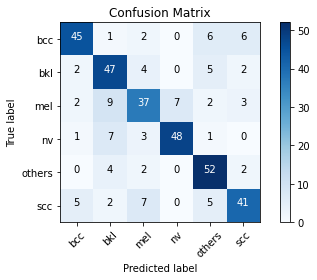

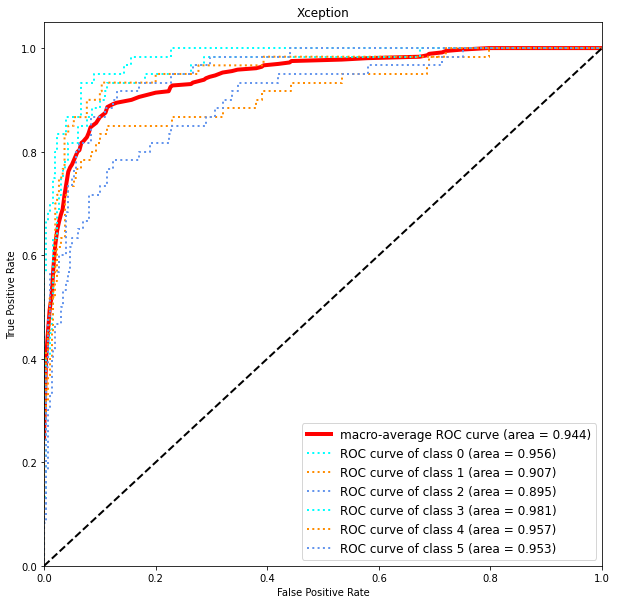

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2320 - categorical_accuracy: 0.5338
Epoch 1: val_categorical_accuracy improved from -inf to 0.48690, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 510ms/step - loss: 1.2320 - categorical_accuracy: 0.5338 - val_loss: 2.3678 - val_categorical_accuracy: 0.4869 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9081 - categorical_accuracy: 0.6577
Epoch 2: val_categorical_accuracy improved from 0.48690 to 0.51965, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 500ms/step - loss: 0.9081 - categorical_accuracy: 0.6577 - val_loss: 1.3817 - val_categorical_accuracy:

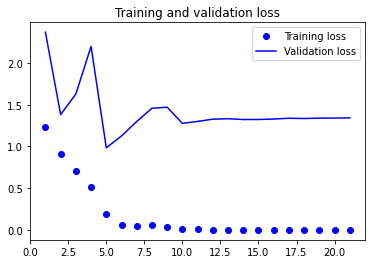

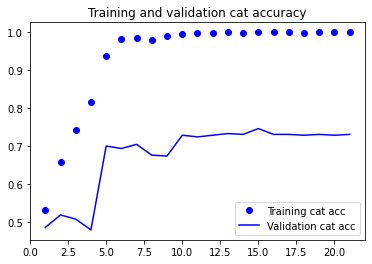

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[45  4  1  0  5  5]
 [ 4 49  3  2  2  0]
 [ 5  9 34  6  3  3]
 [ 0  3  4 51  2  0]
 [ 0  7  1  0 47  5]
 [ 6  2  2  0  8 42]]
              precision    recall  f1-score   support

         bcc       0.75      0.75      0.75        60
         bkl       0.66      0.82      0.73        60
         mel       0.76      0.57      0.65        60
          nv       0.86      0.85      0.86        60
      others       0.70      0.78      0.74        60
         scc       0.76      0.70      0.73        60

    accuracy                           0.74       360
   macro avg       0.75      0.74      0.74       360
weighted avg       0.75      0.74      0.74       360

Specificity of each class:
bcc : 0.950
bkl : 0.917
mel : 0.963
nv : 0.973
others : 0.933
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


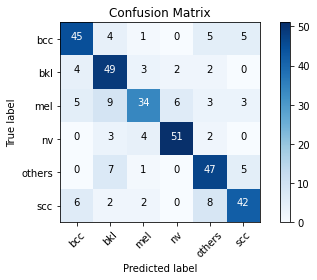

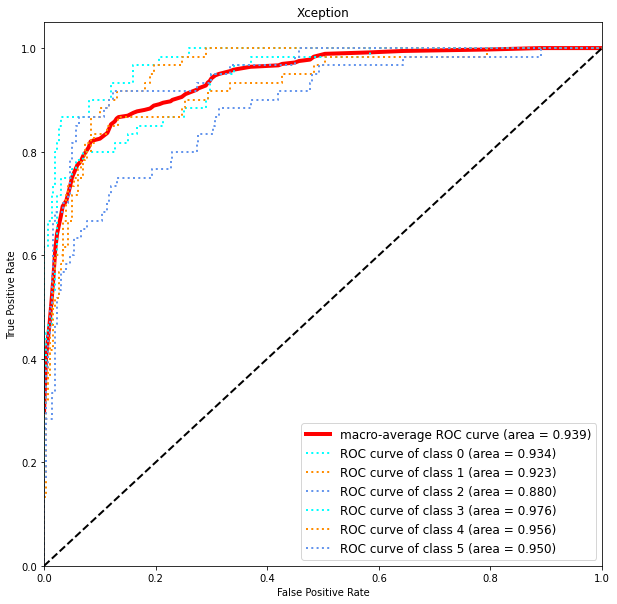

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2867 - categorical_accuracy: 0.4981
Epoch 1: val_categorical_accuracy improved from -inf to 0.36463, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 511ms/step - loss: 1.2867 - categorical_accuracy: 0.4981 - val_loss: 2.5739 - val_categorical_accuracy: 0.3646 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9836 - categorical_accuracy: 0.6285
Epoch 2: val_categorical_accuracy improved from 0.36463 to 0.46288, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 497ms/step - loss: 0.9836 - categorical_accuracy: 0.6285 - val_loss: 1.7341 - val_categorical_accuracy:

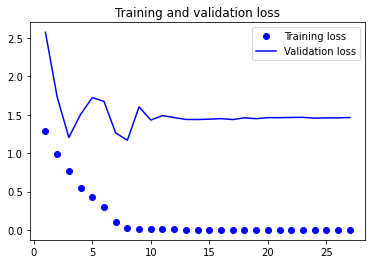

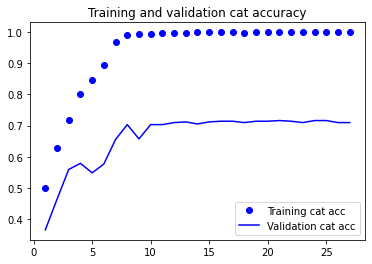

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[46  1  5  0  8  0]
 [ 6 44  3  3  4  0]
 [ 4  9 34  7  4  2]
 [ 1  1  5 52  1  0]
 [ 2  4  0  1 52  1]
 [ 5  5  4  0  7 39]]
              precision    recall  f1-score   support

         bcc       0.72      0.77      0.74        60
         bkl       0.69      0.73      0.71        60
         mel       0.67      0.57      0.61        60
          nv       0.83      0.87      0.85        60
      others       0.68      0.87      0.76        60
         scc       0.93      0.65      0.76        60

    accuracy                           0.74       360
   macro avg       0.75      0.74      0.74       360
weighted avg       0.75      0.74      0.74       360

Specificity of each class:
bcc : 0.940
bkl : 0.933
mel : 0.943
nv : 0.963
others : 0.920
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


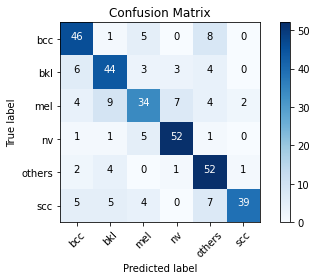

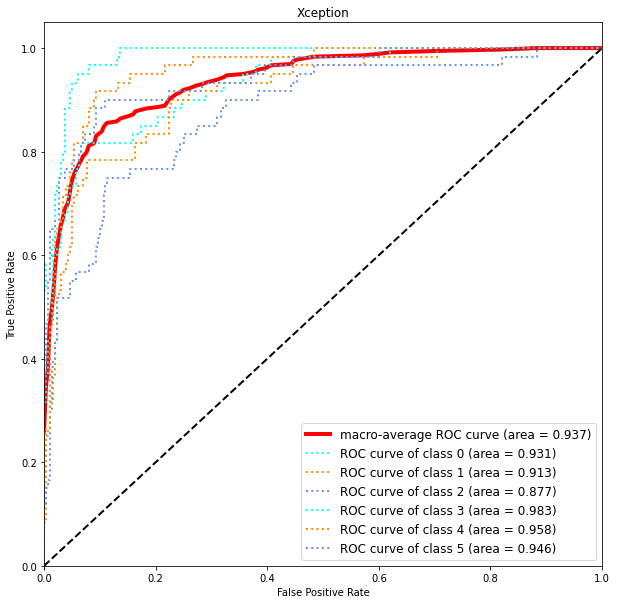

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2612 - categorical_accuracy: 0.5168
Epoch 1: val_categorical_accuracy improved from -inf to 0.39520, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2612 - categorical_accuracy: 0.5168 - val_loss: 3.5016 - val_categorical_accuracy: 0.3952 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9504 - categorical_accuracy: 0.6450
Epoch 2: val_categorical_accuracy improved from 0.39520 to 0.50218, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 497ms/step - loss: 0.9504 - categorical_accuracy: 0.6450 - val_loss: 2.3737 - val_categorical_accuracy:

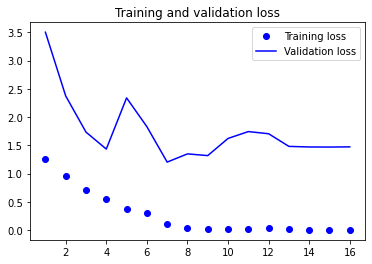

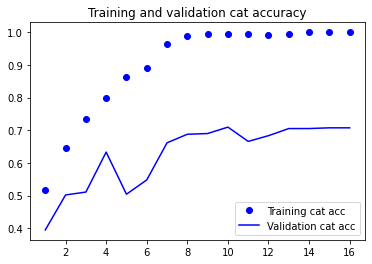

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  3  3  0  6  5]
 [ 2 52  2  0  4  0]
 [ 2 21 26  4  3  4]
 [ 1  8  6 44  1  0]
 [ 1  6  1  1 49  2]
 [ 6  4  4  0  7 39]]
              precision    recall  f1-score   support

         bcc       0.78      0.72      0.75        60
         bkl       0.55      0.87      0.68        60
         mel       0.62      0.43      0.51        60
          nv       0.90      0.73      0.81        60
      others       0.70      0.82      0.75        60
         scc       0.78      0.65      0.71        60

    accuracy                           0.70       360
   macro avg       0.72      0.70      0.70       360
weighted avg       0.72      0.70      0.70       360

Specificity of each class:
bcc : 0.960
bkl : 0.860
mel : 0.947
nv : 0.983
others : 0.930
scc : 0.963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


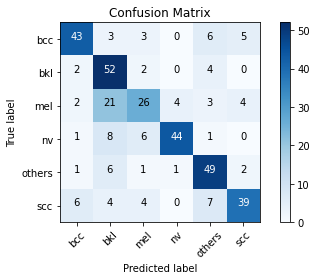

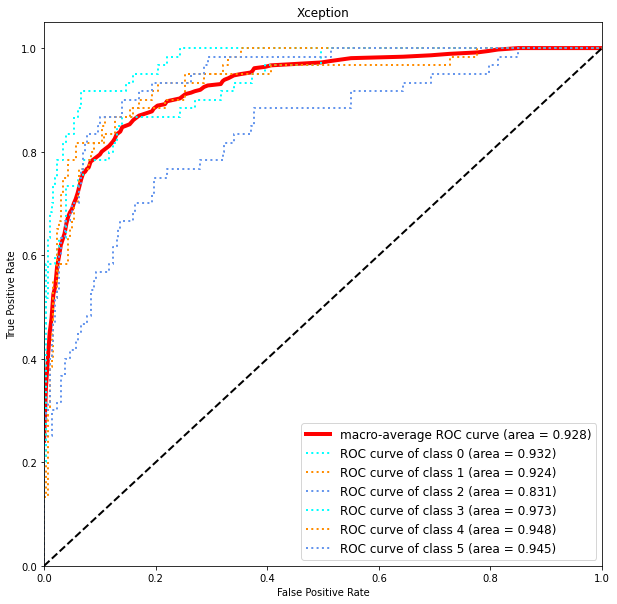

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2359 - categorical_accuracy: 0.5321
Epoch 1: val_categorical_accuracy improved from -inf to 0.32096, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2359 - categorical_accuracy: 0.5321 - val_loss: 13.5734 - val_categorical_accuracy: 0.3210 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9258 - categorical_accuracy: 0.6540
Epoch 2: val_categorical_accuracy improved from 0.32096 to 0.51747, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 497ms/step - loss: 0.9258 - categorical_accuracy: 0.6540 - val_loss: 1.2837 - val_categorical_accuracy

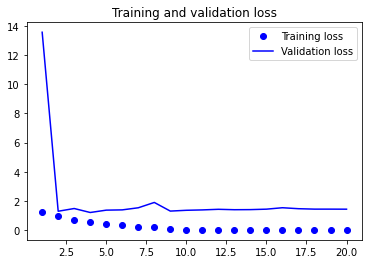

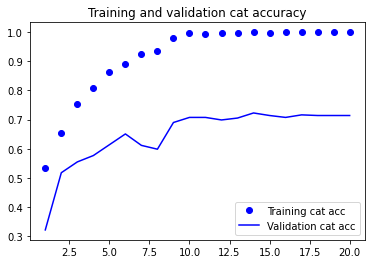

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[42  2  4  1  8  3]
 [ 3 45  5  1  4  2]
 [ 6  6 36  6  2  4]
 [ 1  1 10 46  1  1]
 [ 6  5  1  0 44  4]
 [10  3  4  0  6 37]]
              precision    recall  f1-score   support

         bcc       0.62      0.70      0.66        60
         bkl       0.73      0.75      0.74        60
         mel       0.60      0.60      0.60        60
          nv       0.85      0.77      0.81        60
      others       0.68      0.73      0.70        60
         scc       0.73      0.62      0.67        60

    accuracy                           0.69       360
   macro avg       0.70      0.69      0.70       360
weighted avg       0.70      0.69      0.70       360

Specificity of each class:
bcc : 0.913
bkl : 0.943
mel : 0.920
nv : 0.973
others : 0.930
scc : 0.953


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


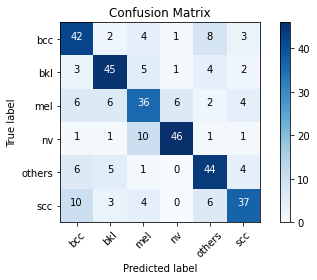

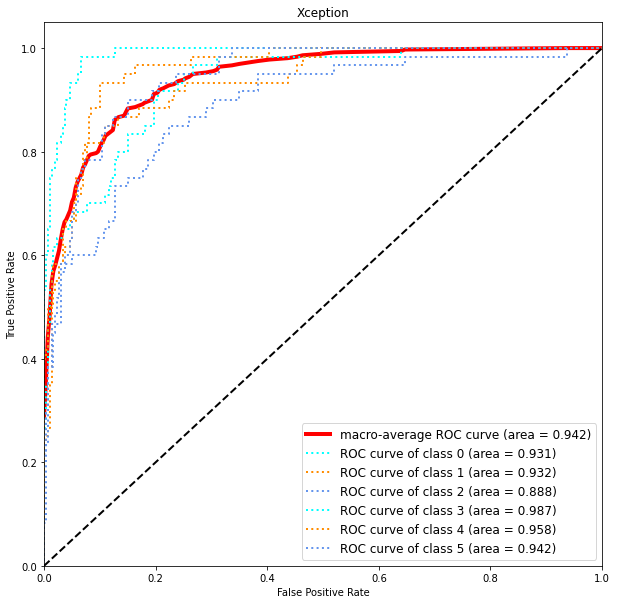

In [ ]:
train_model(800)

100%|██████████| 360/360 [00:00<00:00, 504.88it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2500 - categorical_accuracy: 0.5212
Epoch 1: val_categorical_accuracy improved from -inf to 0.42576, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 510ms/step - loss: 1.2500 - categorical_accuracy: 0.5212 - val_loss: 1.8706 - val_categorical_accuracy: 0.4258 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9378 - categorical_accuracy: 0.6470
Epoch 2: val_categorical_accuracy improved from 0.42576 to 0.57205, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 501ms/step - loss: 0.9378 - categorical_accuracy: 0.6470 - val_loss: 1.6536 - val_categorical_accuracy:

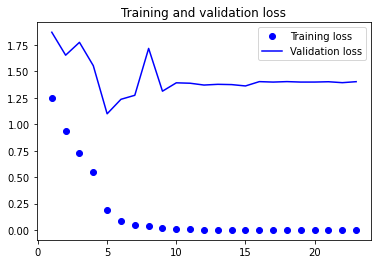

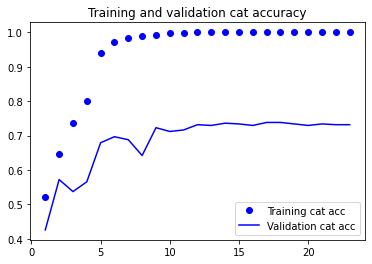

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[42  1  6  1  8  2]
 [ 5 47  2  2  4  0]
 [ 4 11 30 10  3  2]
 [ 0  3  3 53  1  0]
 [ 3  4  2  1 48  2]
 [ 7  0  3  0  7 43]]
              precision    recall  f1-score   support

         bcc       0.69      0.70      0.69        60
         bkl       0.71      0.78      0.75        60
         mel       0.65      0.50      0.57        60
          nv       0.79      0.88      0.83        60
      others       0.68      0.80      0.73        60
         scc       0.88      0.72      0.79        60

    accuracy                           0.73       360
   macro avg       0.73      0.73      0.73       360
weighted avg       0.73      0.73      0.73       360

Specificity of each class:
bcc : 0.937
bkl : 0.937
mel : 0.947
nv : 0.953
others : 0.923
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


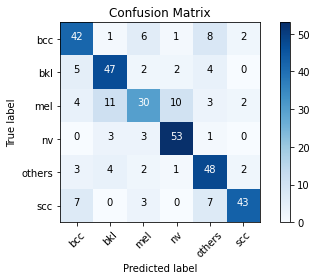

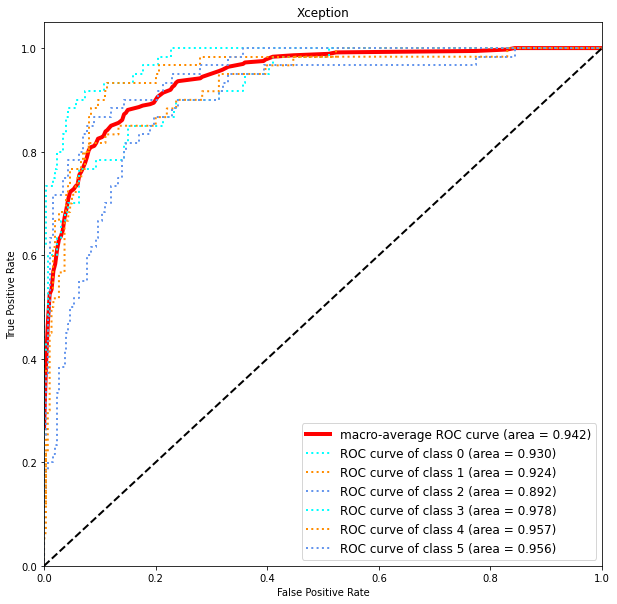

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2462 - categorical_accuracy: 0.5148
Epoch 1: val_categorical_accuracy improved from -inf to 0.35590, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2462 - categorical_accuracy: 0.5148 - val_loss: 3.8174 - val_categorical_accuracy: 0.3559 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.8957 - categorical_accuracy: 0.6672
Epoch 2: val_categorical_accuracy improved from 0.35590 to 0.51310, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 498ms/step - loss: 0.8957 - categorical_accuracy: 0.6672 - val_loss: 1.7713 - val_categorical_accuracy:

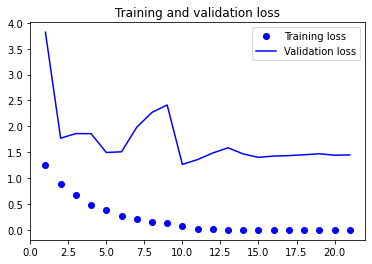

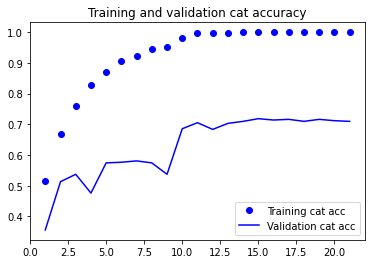

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[39  4  1  0 10  6]
 [ 2 50  3  0  5  0]
 [ 2 14 34  8  1  1]
 [ 1  2  6 51  0  0]
 [ 2  2  4  0 50  2]
 [ 5  5  2  0  8 40]]
              precision    recall  f1-score   support

         bcc       0.76      0.65      0.70        60
         bkl       0.65      0.83      0.73        60
         mel       0.68      0.57      0.62        60
          nv       0.86      0.85      0.86        60
      others       0.68      0.83      0.75        60
         scc       0.82      0.67      0.73        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.73       360
weighted avg       0.74      0.73      0.73       360

Specificity of each class:
bcc : 0.960
bkl : 0.910
mel : 0.947
nv : 0.973
others : 0.920
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


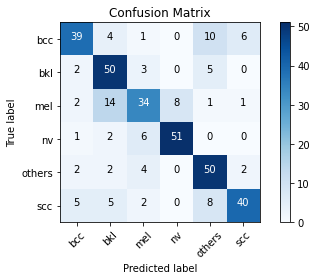

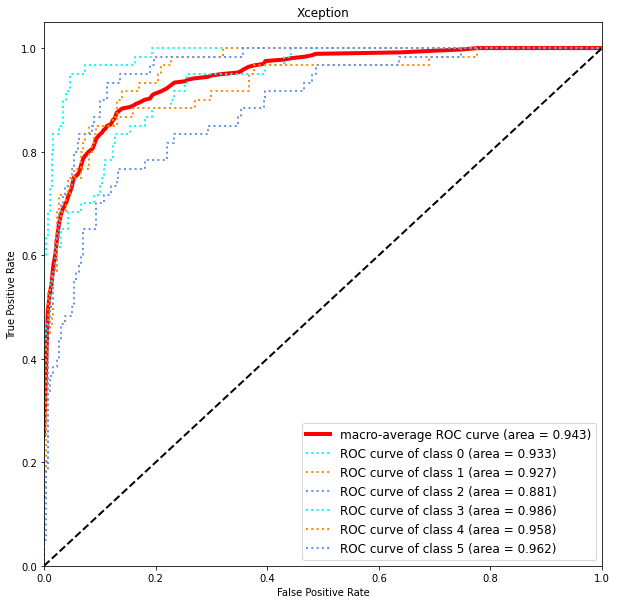

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2330 - categorical_accuracy: 0.5175
Epoch 1: val_categorical_accuracy improved from -inf to 0.51528, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2330 - categorical_accuracy: 0.5175 - val_loss: 1.7134 - val_categorical_accuracy: 0.5153 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9314 - categorical_accuracy: 0.6423
Epoch 2: val_categorical_accuracy improved from 0.51528 to 0.59170, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 498ms/step - loss: 0.9314 - categorical_accuracy: 0.6423 - val_loss: 1.1891 - val_categorical_accuracy:

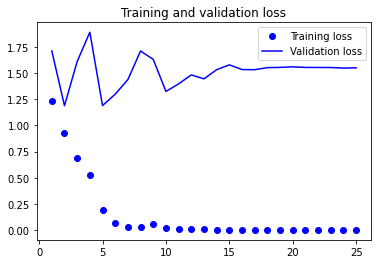

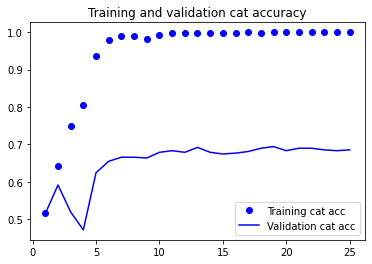

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[44  2  2  0  8  4]
 [ 3 46  6  0  4  1]
 [ 2 12 38  3  4  1]
 [ 1  5  4 49  1  0]
 [ 3  6  2  1 48  0]
 [10  3  4  0  6 37]]
              precision    recall  f1-score   support

         bcc       0.70      0.73      0.72        60
         bkl       0.62      0.77      0.69        60
         mel       0.68      0.63      0.66        60
          nv       0.92      0.82      0.87        60
      others       0.68      0.80      0.73        60
         scc       0.86      0.62      0.72        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.73       360
weighted avg       0.74      0.73      0.73       360

Specificity of each class:
bcc : 0.937
bkl : 0.907
mel : 0.940
nv : 0.987
others : 0.923
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


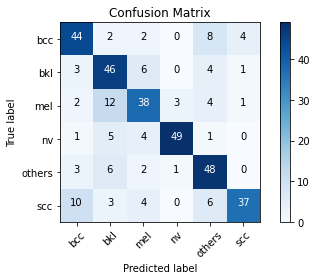

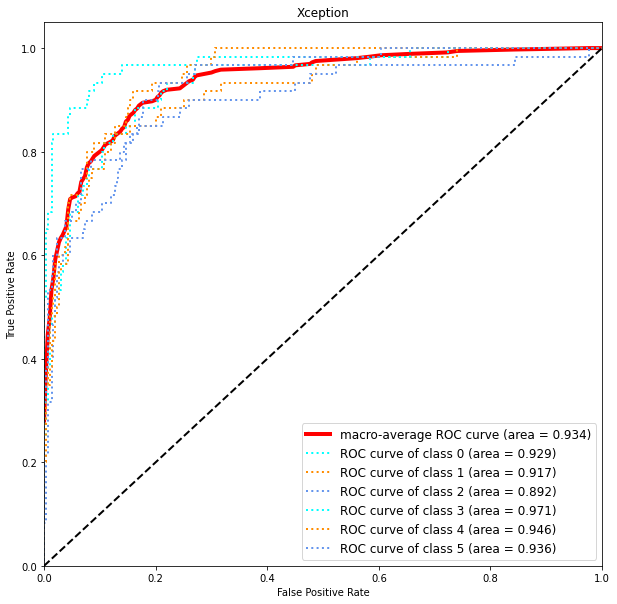

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2206 - categorical_accuracy: 0.5331
Epoch 1: val_categorical_accuracy improved from -inf to 0.39083, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2206 - categorical_accuracy: 0.5331 - val_loss: 7.6096 - val_categorical_accuracy: 0.3908 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9077 - categorical_accuracy: 0.6606
Epoch 2: val_categorical_accuracy improved from 0.39083 to 0.53712, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 496ms/step - loss: 0.9077 - categorical_accuracy: 0.6606 - val_loss: 1.4881 - val_categorical_accuracy:

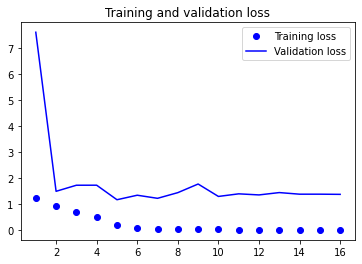

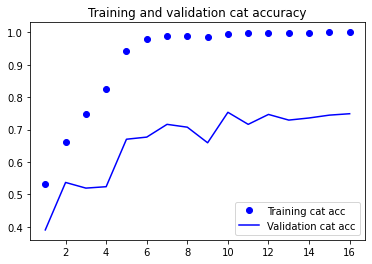

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[45  3  2  0  6  4]
 [ 4 42  6  1  6  1]
 [ 4  8 35  8  2  3]
 [ 0  3  5 49  1  2]
 [ 1  2  2  0 53  2]
 [ 9  6  2  0  4 39]]
              precision    recall  f1-score   support

         bcc       0.71      0.75      0.73        60
         bkl       0.66      0.70      0.68        60
         mel       0.67      0.58      0.63        60
          nv       0.84      0.82      0.83        60
      others       0.74      0.88      0.80        60
         scc       0.76      0.65      0.70        60

    accuracy                           0.73       360
   macro avg       0.73      0.73      0.73       360
weighted avg       0.73      0.73      0.73       360

Specificity of each class:
bcc : 0.940
bkl : 0.927
mel : 0.943
nv : 0.970
others : 0.937
scc : 0.960


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


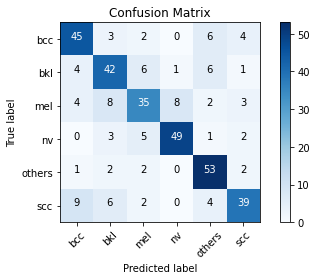

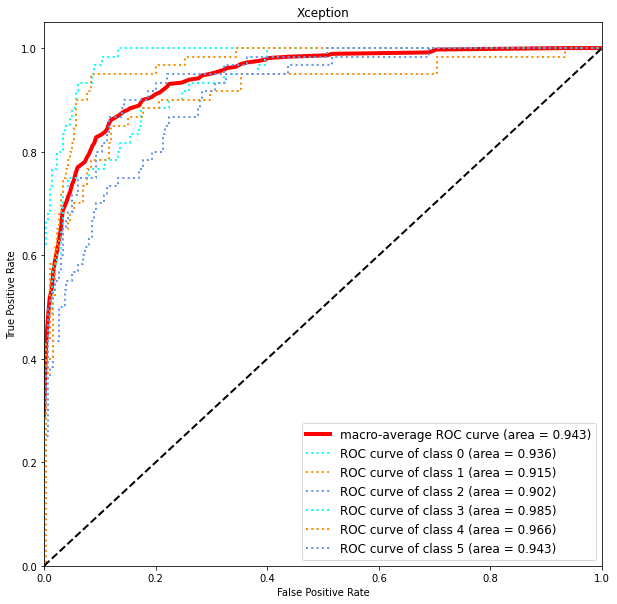

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2653 - categorical_accuracy: 0.5136
Epoch 1: val_categorical_accuracy improved from -inf to 0.50873, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2653 - categorical_accuracy: 0.5136 - val_loss: 1.2808 - val_categorical_accuracy: 0.5087 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9209 - categorical_accuracy: 0.6567
Epoch 2: val_categorical_accuracy did not improve from 0.50873
129/129 [==============================] - 63s 487ms/step - loss: 0.9209 - categorical_accuracy: 0.6567 - val_loss: 2.1474 - val_categorical_accuracy: 0.4825 - lr: 0.0010
Epoch 3/60
129/129 [=======================

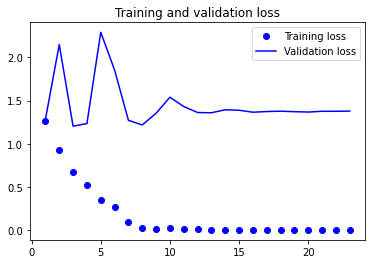

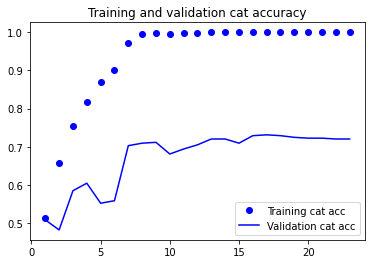

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[46  3  3  0  6  2]
 [ 2 47  5  0  5  1]
 [ 1 11 36  8  1  3]
 [ 0  0  7 52  1  0]
 [ 0  4  2  2 47  5]
 [ 3  3  3  0  6 45]]
              precision    recall  f1-score   support

         bcc       0.88      0.77      0.82        60
         bkl       0.69      0.78      0.73        60
         mel       0.64      0.60      0.62        60
          nv       0.84      0.87      0.85        60
      others       0.71      0.78      0.75        60
         scc       0.80      0.75      0.78        60

    accuracy                           0.76       360
   macro avg       0.76      0.76      0.76       360
weighted avg       0.76      0.76      0.76       360

Specificity of each class:
bcc : 0.980
bkl : 0.930
mel : 0.933
nv : 0.967
others : 0.937
scc : 0.963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


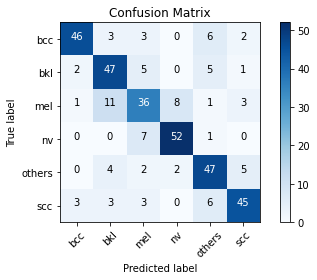

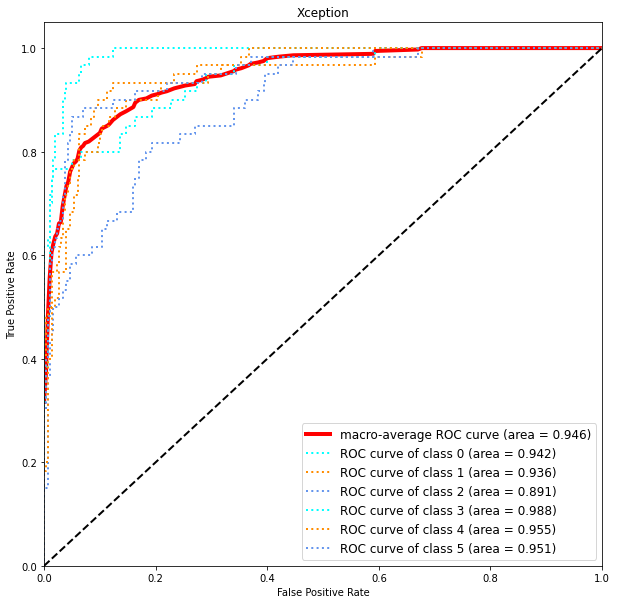

In [ ]:
train_model(800)

100%|██████████| 360/360 [00:01<00:00, 227.23it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2385 - categorical_accuracy: 0.5212
Epoch 1: val_categorical_accuracy improved from -inf to 0.39520, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 69s 502ms/step - loss: 1.2385 - categorical_accuracy: 0.5212 - val_loss: 3.1193 - val_categorical_accuracy: 0.3952 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9305 - categorical_accuracy: 0.6426
Epoch 2: val_categorical_accuracy did not improve from 0.39520
129/129 [==============================] - 63s 487ms/step - loss: 0.9305 - categorical_accuracy: 0.6426 - val_loss: 4.5894 - val_categorical_accuracy: 0.3166 - lr: 0.0010
Epoch 3/60
129/129 [=======================

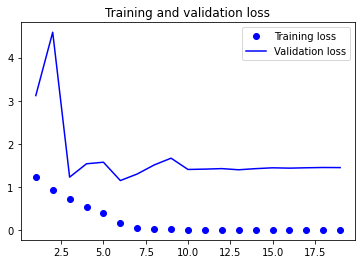

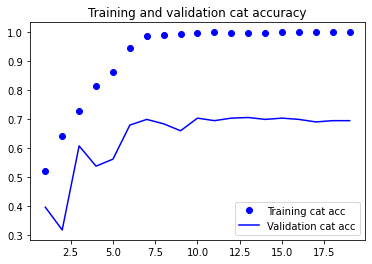

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[45  1  5  0  7  2]
 [ 3 44  3  2  4  4]
 [ 5 12 31  7  2  3]
 [ 0  2  1 56  0  1]
 [ 2  4  3  0 48  3]
 [ 8  1  5  0  5 41]]
              precision    recall  f1-score   support

         bcc       0.71      0.75      0.73        60
         bkl       0.69      0.73      0.71        60
         mel       0.65      0.52      0.57        60
          nv       0.86      0.93      0.90        60
      others       0.73      0.80      0.76        60
         scc       0.76      0.68      0.72        60

    accuracy                           0.74       360
   macro avg       0.73      0.74      0.73       360
weighted avg       0.73      0.74      0.73       360

Specificity of each class:
bcc : 0.940
bkl : 0.933
mel : 0.943
nv : 0.970
others : 0.940
scc : 0.957


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


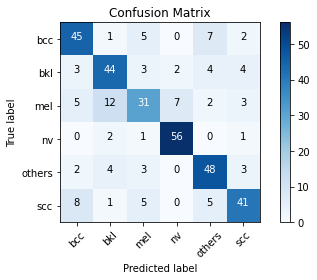

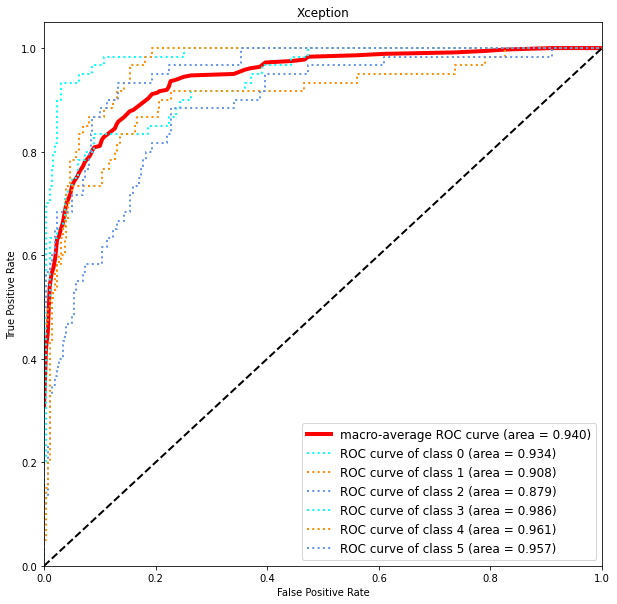

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2297 - categorical_accuracy: 0.5268
Epoch 1: val_categorical_accuracy improved from -inf to 0.27729, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 72s 523ms/step - loss: 1.2297 - categorical_accuracy: 0.5268 - val_loss: 4.1265 - val_categorical_accuracy: 0.2773 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9263 - categorical_accuracy: 0.6528
Epoch 2: val_categorical_accuracy improved from 0.27729 to 0.58079, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 66s 508ms/step - loss: 0.9263 - categorical_accuracy: 0.6528 - val_loss: 1.2401 - val_categorical_accuracy:

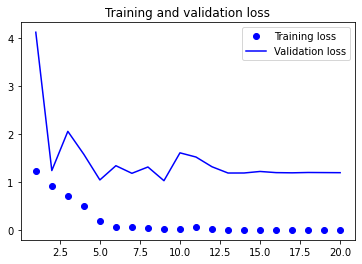

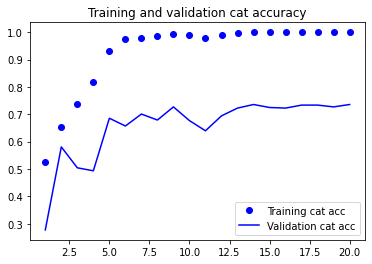

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  1  2  1  7  6]
 [ 4 47  3  0  6  0]
 [ 2  9 33  8  4  4]
 [ 0  3  4 51  1  1]
 [ 4  1  3  1 50  1]
 [ 7  2  4  0  7 40]]
              precision    recall  f1-score   support

         bcc       0.72      0.72      0.72        60
         bkl       0.75      0.78      0.76        60
         mel       0.67      0.55      0.61        60
          nv       0.84      0.85      0.84        60
      others       0.67      0.83      0.74        60
         scc       0.77      0.67      0.71        60

    accuracy                           0.73       360
   macro avg       0.73      0.73      0.73       360
weighted avg       0.73      0.73      0.73       360

Specificity of each class:
bcc : 0.943
bkl : 0.947
mel : 0.947
nv : 0.967
others : 0.917
scc : 0.960


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


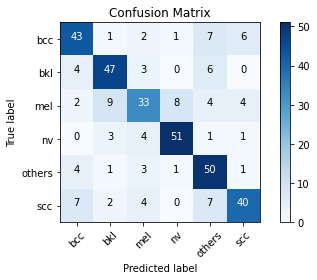

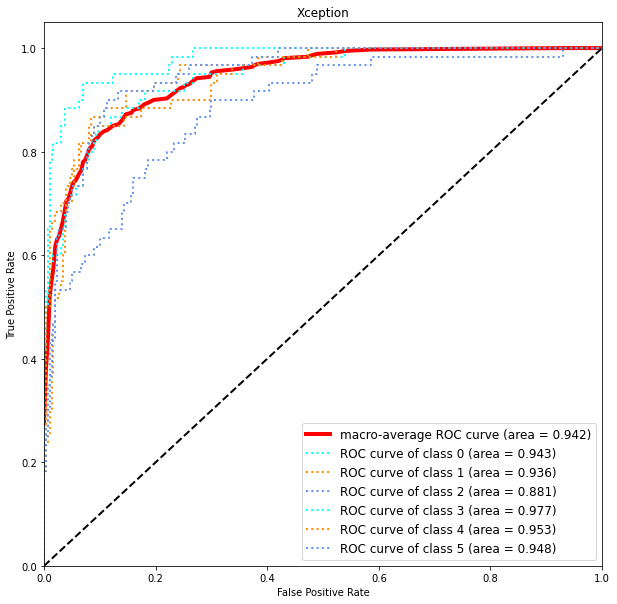

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2543 - categorical_accuracy: 0.5202
Epoch 1: val_categorical_accuracy improved from -inf to 0.45415, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 505ms/step - loss: 1.2543 - categorical_accuracy: 0.5202 - val_loss: 1.8923 - val_categorical_accuracy: 0.4541 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9019 - categorical_accuracy: 0.6574
Epoch 2: val_categorical_accuracy improved from 0.45415 to 0.53057, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 495ms/step - loss: 0.9019 - categorical_accuracy: 0.6574 - val_loss: 1.7985 - val_categorical_accuracy:

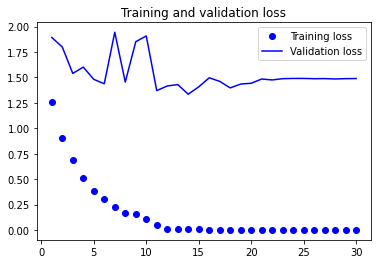

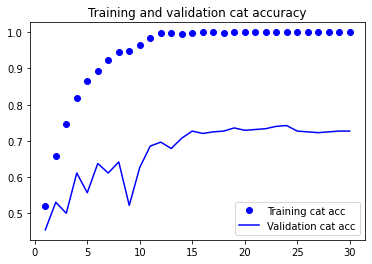

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  1  4  0  4  3]
 [ 3 46  5  2  3  1]
 [ 2  9 38  6  3  2]
 [ 2  3  3 52  0  0]
 [ 1  5  2  1 48  3]
 [ 7  5  2  1  5 40]]
              precision    recall  f1-score   support

         bcc       0.76      0.80      0.78        60
         bkl       0.67      0.77      0.71        60
         mel       0.70      0.63      0.67        60
          nv       0.84      0.87      0.85        60
      others       0.76      0.80      0.78        60
         scc       0.82      0.67      0.73        60

    accuracy                           0.76       360
   macro avg       0.76      0.76      0.75       360
weighted avg       0.76      0.76      0.75       360

Specificity of each class:
bcc : 0.950
bkl : 0.923
mel : 0.947
nv : 0.967
others : 0.950
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


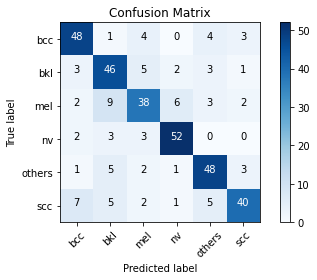

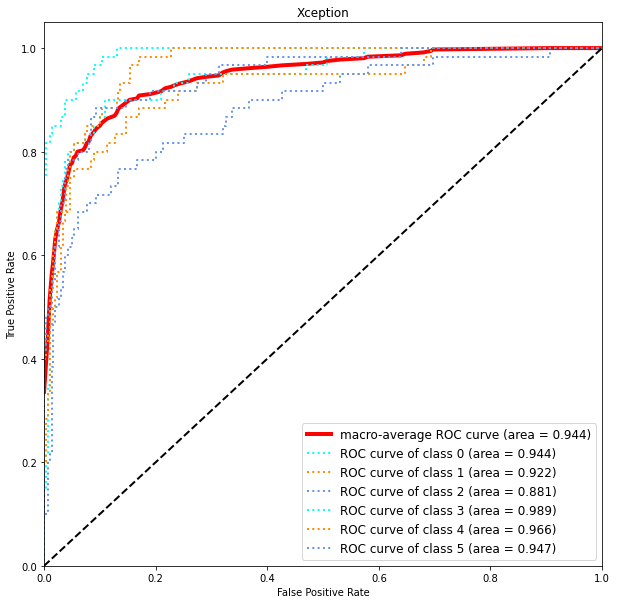

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2524 - categorical_accuracy: 0.5066
Epoch 1: val_categorical_accuracy improved from -inf to 0.50000, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2524 - categorical_accuracy: 0.5066 - val_loss: 1.7001 - val_categorical_accuracy: 0.5000 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9587 - categorical_accuracy: 0.6406
Epoch 2: val_categorical_accuracy improved from 0.50000 to 0.51092, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 496ms/step - loss: 0.9587 - categorical_accuracy: 0.6406 - val_loss: 1.7153 - val_categorical_accuracy:

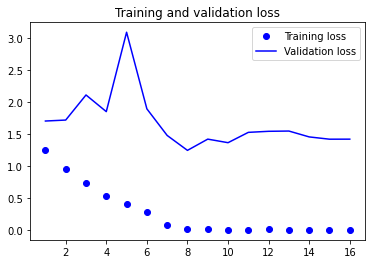

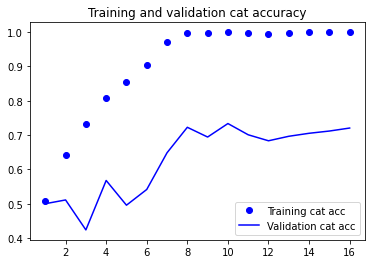

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  2  5  0  8  2]
 [ 4 45  6  0  5  0]
 [ 3  7 40  6  3  1]
 [ 0  4 11 45  0  0]
 [ 2  4  2  2 49  1]
 [ 7  4  6  0  8 35]]
              precision    recall  f1-score   support

         bcc       0.73      0.72      0.72        60
         bkl       0.68      0.75      0.71        60
         mel       0.57      0.67      0.62        60
          nv       0.85      0.75      0.80        60
      others       0.67      0.82      0.74        60
         scc       0.90      0.58      0.71        60

    accuracy                           0.71       360
   macro avg       0.73      0.71      0.72       360
weighted avg       0.73      0.71      0.72       360

Specificity of each class:
bcc : 0.947
bkl : 0.930
mel : 0.900
nv : 0.973
others : 0.920
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


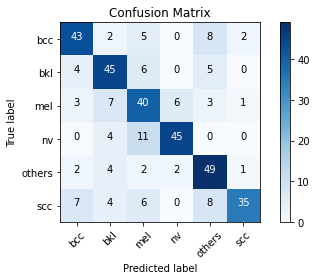

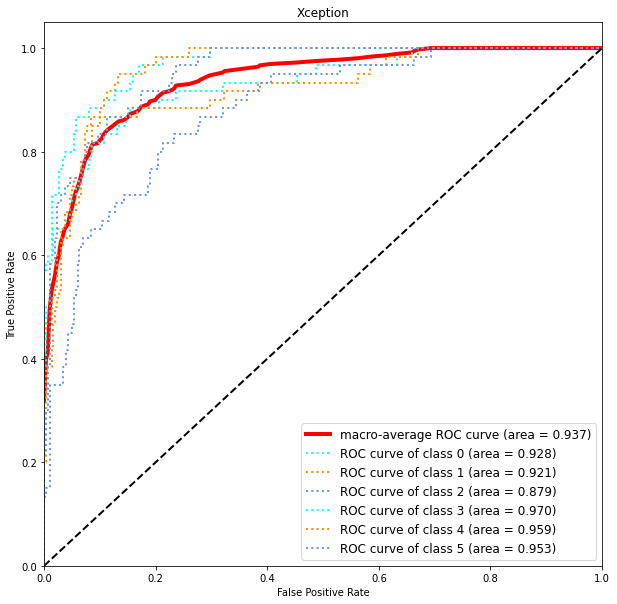

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2479 - categorical_accuracy: 0.5180
Epoch 1: val_categorical_accuracy improved from -inf to 0.36681, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2479 - categorical_accuracy: 0.5180 - val_loss: 2.7972 - val_categorical_accuracy: 0.3668 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9284 - categorical_accuracy: 0.6637
Epoch 2: val_categorical_accuracy improved from 0.36681 to 0.46288, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 494ms/step - loss: 0.9284 - categorical_accuracy: 0.6637 - val_loss: 1.8575 - val_categorical_accuracy:

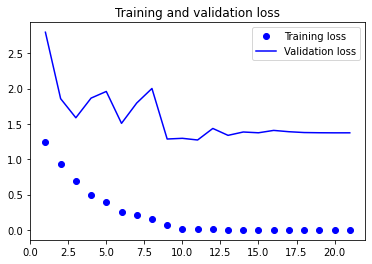

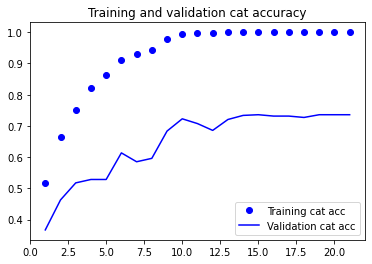

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[44  1  4  2  8  1]
 [ 4 47  3  1  4  1]
 [ 2 12 35  7  2  2]
 [ 0  3  4 52  1  0]
 [ 2  5  0  3 46  4]
 [ 7  3  6  0  4 40]]
              precision    recall  f1-score   support

         bcc       0.75      0.73      0.74        60
         bkl       0.66      0.78      0.72        60
         mel       0.67      0.58      0.63        60
          nv       0.80      0.87      0.83        60
      others       0.71      0.77      0.74        60
         scc       0.83      0.67      0.74        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.73       360
weighted avg       0.74      0.73      0.73       360

Specificity of each class:
bcc : 0.950
bkl : 0.920
mel : 0.943
nv : 0.957
others : 0.937
scc : 0.973


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


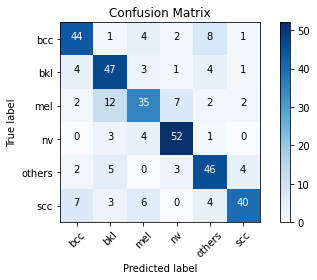

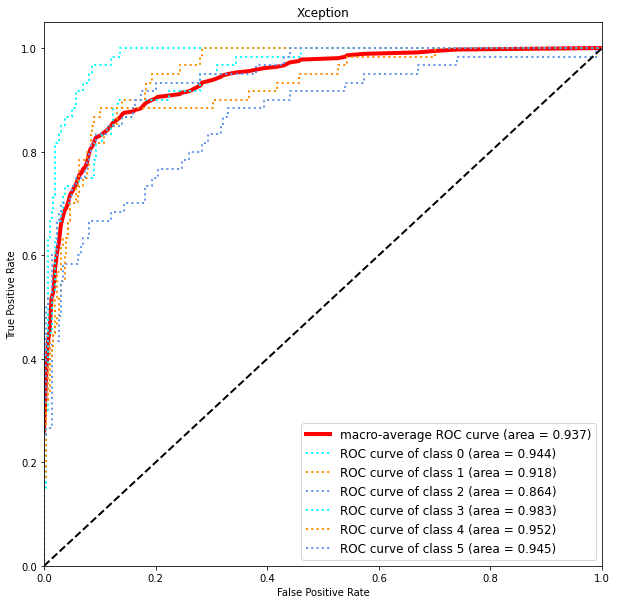

In [ ]:
train_model(800)

100%|██████████| 360/360 [00:00<00:00, 403.03it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2796 - categorical_accuracy: 0.5015
Epoch 1: val_categorical_accuracy improved from -inf to 0.45633, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2796 - categorical_accuracy: 0.5015 - val_loss: 1.4027 - val_categorical_accuracy: 0.4563 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9753 - categorical_accuracy: 0.6399
Epoch 2: val_categorical_accuracy improved from 0.45633 to 0.53275, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 498ms/step - loss: 0.9753 - categorical_accuracy: 0.6399 - val_loss: 1.4964 - val_categorical_accuracy:

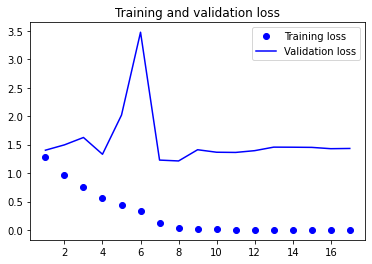

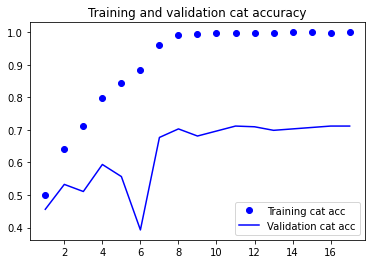

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[44  2  4  1  7  2]
 [ 3 42  7  1  6  1]
 [ 1 11 34 12  1  1]
 [ 0  3  0 57  0  0]
 [ 1  4  1  1 51  2]
 [ 5  1  4  1  8 41]]
              precision    recall  f1-score   support

         bcc       0.81      0.73      0.77        60
         bkl       0.67      0.70      0.68        60
         mel       0.68      0.57      0.62        60
          nv       0.78      0.95      0.86        60
      others       0.70      0.85      0.77        60
         scc       0.87      0.68      0.77        60

    accuracy                           0.75       360
   macro avg       0.75      0.75      0.74       360
weighted avg       0.75      0.75      0.74       360

Specificity of each class:
bcc : 0.967
bkl : 0.930
mel : 0.947
nv : 0.947
others : 0.927
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


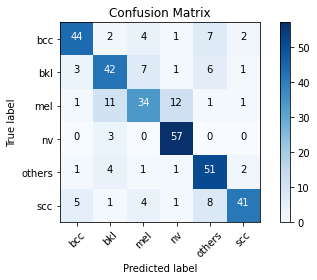

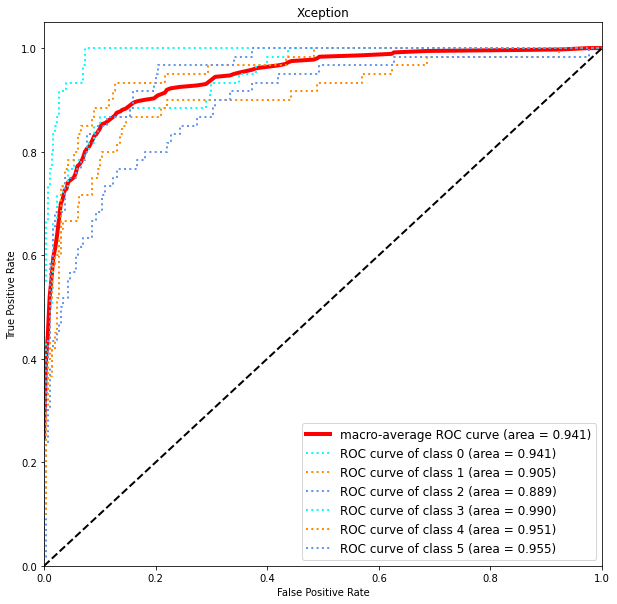

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2566 - categorical_accuracy: 0.5073
Epoch 1: val_categorical_accuracy improved from -inf to 0.39083, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 71s 508ms/step - loss: 1.2566 - categorical_accuracy: 0.5073 - val_loss: 7.7428 - val_categorical_accuracy: 0.3908 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9553 - categorical_accuracy: 0.6472
Epoch 2: val_categorical_accuracy improved from 0.39083 to 0.42795, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 499ms/step - loss: 0.9553 - categorical_accuracy: 0.6472 - val_loss: 2.2563 - val_categorical_accuracy:

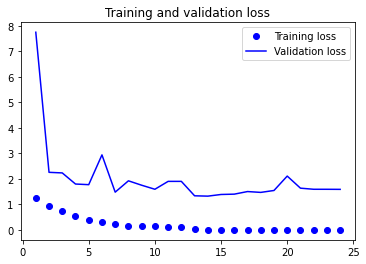

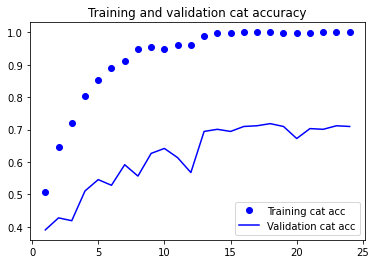

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[41  2  1  1  8  7]
 [ 3 43  6  2  4  2]
 [ 2 11 33  7  3  4]
 [ 0  3  4 52  1  0]
 [ 2  4  2  2 47  3]
 [ 5  2  3  2  9 39]]
              precision    recall  f1-score   support

         bcc       0.77      0.68      0.73        60
         bkl       0.66      0.72      0.69        60
         mel       0.67      0.55      0.61        60
          nv       0.79      0.87      0.83        60
      others       0.65      0.78      0.71        60
         scc       0.71      0.65      0.68        60

    accuracy                           0.71       360
   macro avg       0.71      0.71      0.71       360
weighted avg       0.71      0.71      0.71       360

Specificity of each class:
bcc : 0.960
bkl : 0.927
mel : 0.947
nv : 0.953
others : 0.917
scc : 0.947


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


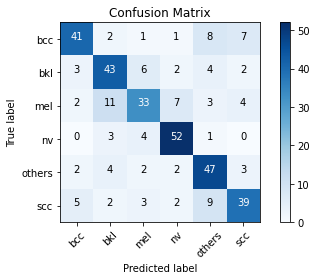

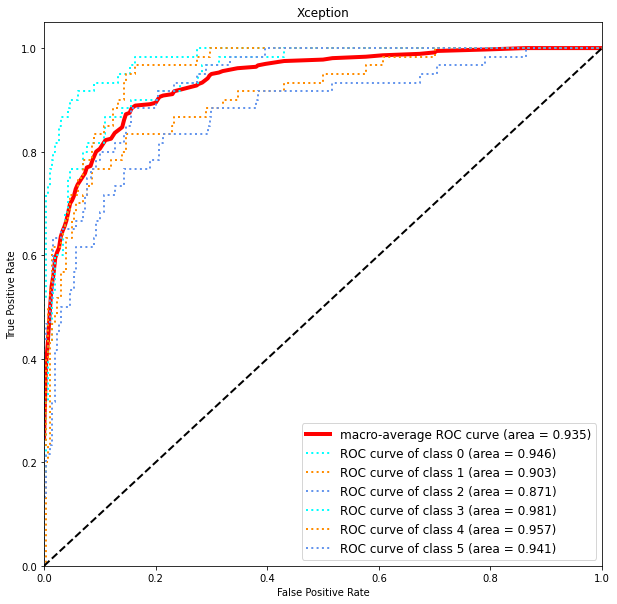

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2785 - categorical_accuracy: 0.5129
Epoch 1: val_categorical_accuracy improved from -inf to 0.32533, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2785 - categorical_accuracy: 0.5129 - val_loss: 3.7913 - val_categorical_accuracy: 0.3253 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9479 - categorical_accuracy: 0.6455
Epoch 2: val_categorical_accuracy improved from 0.32533 to 0.50000, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 495ms/step - loss: 0.9479 - categorical_accuracy: 0.6455 - val_loss: 1.5341 - val_categorical_accuracy:

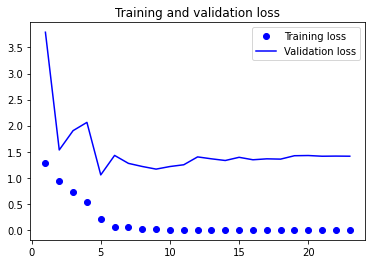

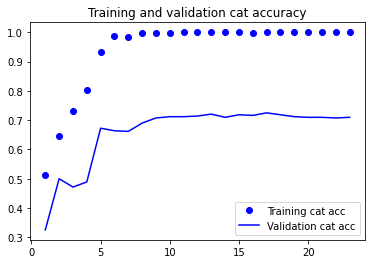

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  2  2  0  8  5]
 [ 3 42  5  3  7  0]
 [ 4  7 36  7  5  1]
 [ 1  2  2 55  0  0]
 [ 2  3  3  3 46  3]
 [ 9  3  3  2  8 35]]
              precision    recall  f1-score   support

         bcc       0.69      0.72      0.70        60
         bkl       0.71      0.70      0.71        60
         mel       0.71      0.60      0.65        60
          nv       0.79      0.92      0.85        60
      others       0.62      0.77      0.69        60
         scc       0.80      0.58      0.67        60

    accuracy                           0.71       360
   macro avg       0.72      0.71      0.71       360
weighted avg       0.72      0.71      0.71       360

Specificity of each class:
bcc : 0.937
bkl : 0.943
mel : 0.950
nv : 0.950
others : 0.907
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


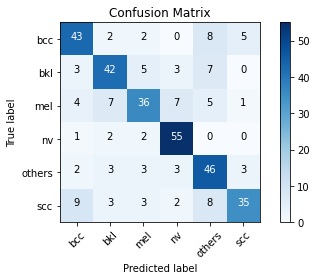

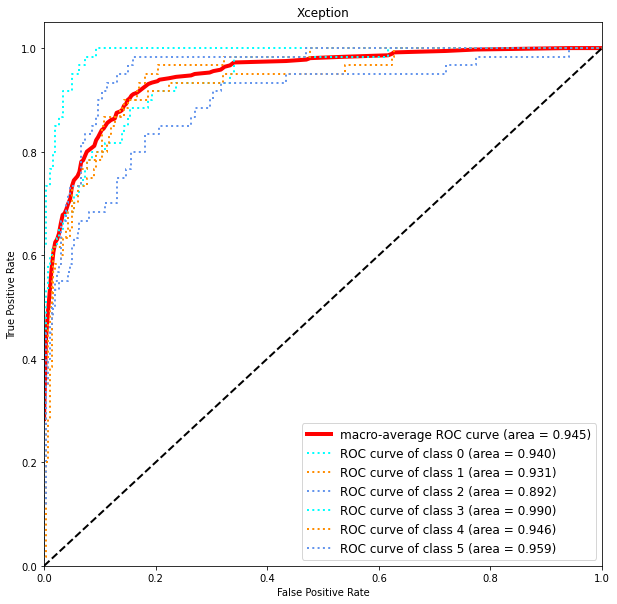

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2817 - categorical_accuracy: 0.4956
Epoch 1: val_categorical_accuracy improved from -inf to 0.35590, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 505ms/step - loss: 1.2817 - categorical_accuracy: 0.4956 - val_loss: 11.7727 - val_categorical_accuracy: 0.3559 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9746 - categorical_accuracy: 0.6277
Epoch 2: val_categorical_accuracy improved from 0.35590 to 0.55240, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 495ms/step - loss: 0.9746 - categorical_accuracy: 0.6277 - val_loss: 1.8475 - val_categorical_accuracy

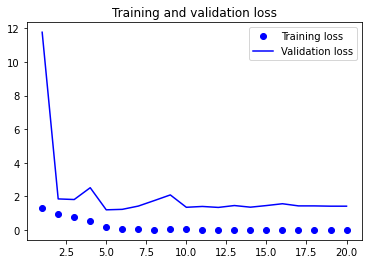

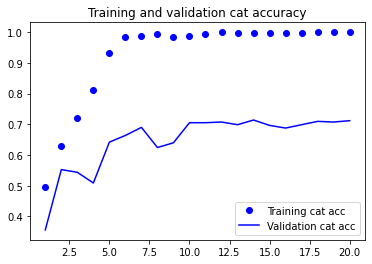

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[45  2  4  0  7  2]
 [ 4 44  7  0  4  1]
 [ 3 10 37  7  1  2]
 [ 1  5  4 50  0  0]
 [ 4  5  4  2 40  5]
 [ 8  3  5  1  3 40]]
              precision    recall  f1-score   support

         bcc       0.69      0.75      0.72        60
         bkl       0.64      0.73      0.68        60
         mel       0.61      0.62      0.61        60
          nv       0.83      0.83      0.83        60
      others       0.73      0.67      0.70        60
         scc       0.80      0.67      0.73        60

    accuracy                           0.71       360
   macro avg       0.72      0.71      0.71       360
weighted avg       0.72      0.71      0.71       360

Specificity of each class:
bcc : 0.933
bkl : 0.917
mel : 0.920
nv : 0.967
others : 0.950
scc : 0.967


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


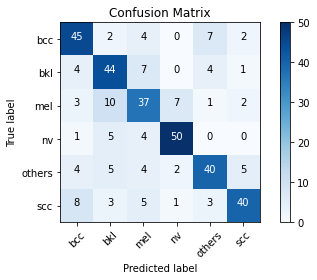

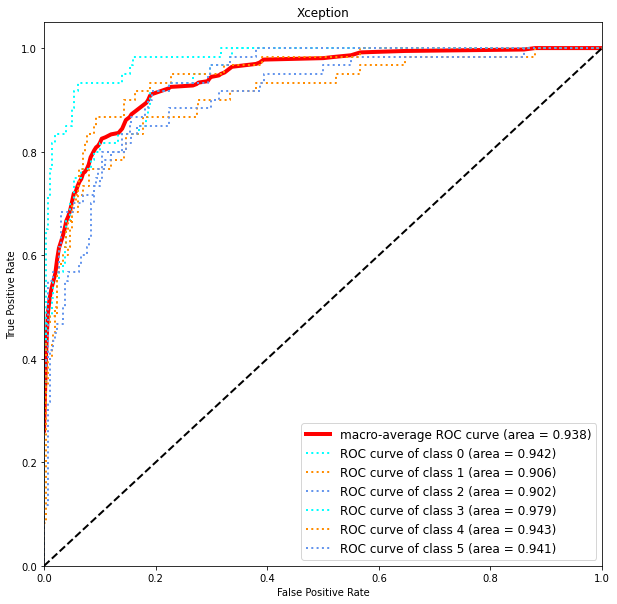

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2365 - categorical_accuracy: 0.5333
Epoch 1: val_categorical_accuracy improved from -inf to 0.51092, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2365 - categorical_accuracy: 0.5333 - val_loss: 2.0277 - val_categorical_accuracy: 0.5109 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9199 - categorical_accuracy: 0.6521
Epoch 2: val_categorical_accuracy improved from 0.51092 to 0.55459, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 497ms/step - loss: 0.9199 - categorical_accuracy: 0.6521 - val_loss: 1.5216 - val_categorical_accuracy:

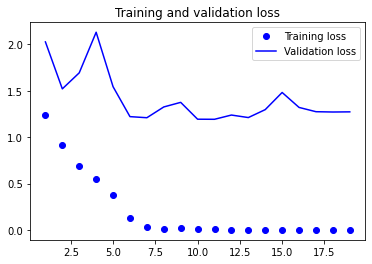

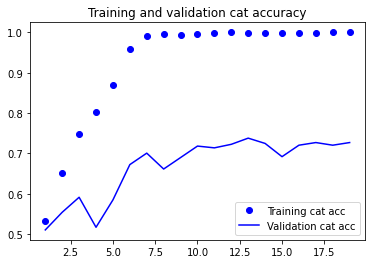

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[46  2  4  0  5  3]
 [ 4 46  5  0  4  1]
 [ 2  8 37  6  3  4]
 [ 0  2  5 52  1  0]
 [ 2  3  1  0 51  3]
 [ 9  3  3  0 10 35]]
              precision    recall  f1-score   support

         bcc       0.73      0.77      0.75        60
         bkl       0.72      0.77      0.74        60
         mel       0.67      0.62      0.64        60
          nv       0.90      0.87      0.88        60
      others       0.69      0.85      0.76        60
         scc       0.76      0.58      0.66        60

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360

Specificity of each class:
bcc : 0.943
bkl : 0.940
mel : 0.940
nv : 0.980
others : 0.923
scc : 0.963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


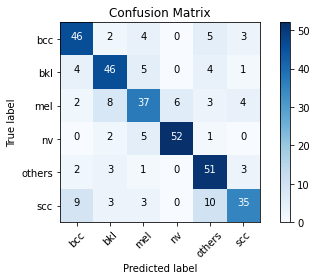

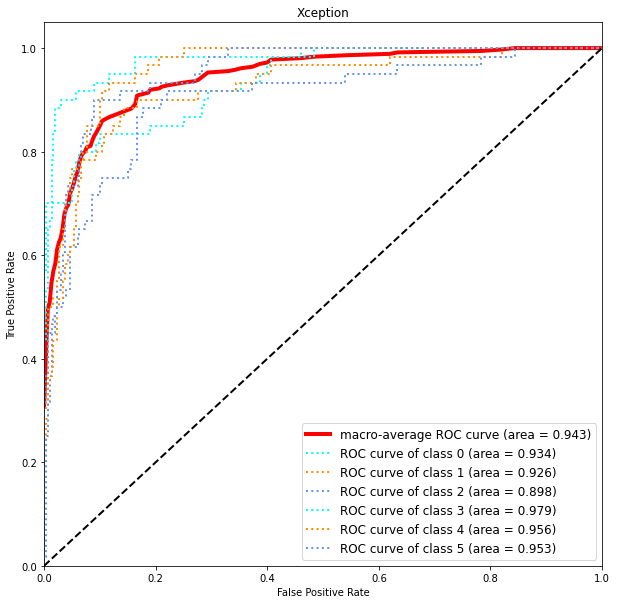

In [ ]:
train_model(800)

100%|██████████| 360/360 [00:00<00:00, 372.43it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2161 - categorical_accuracy: 0.5321
Epoch 1: val_categorical_accuracy improved from -inf to 0.47817, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 508ms/step - loss: 1.2161 - categorical_accuracy: 0.5321 - val_loss: 2.5462 - val_categorical_accuracy: 0.4782 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.8991 - categorical_accuracy: 0.6674
Epoch 2: val_categorical_accuracy improved from 0.47817 to 0.54803, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 501ms/step - loss: 0.8991 - categorical_accuracy: 0.6674 - val_loss: 1.3750 - val_categorical_accuracy:

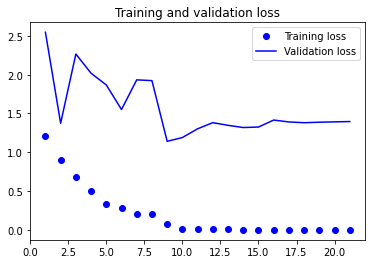

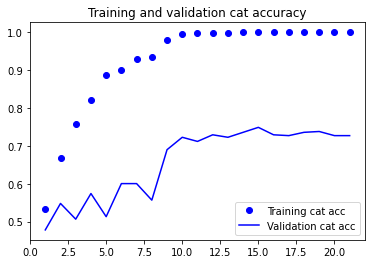

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[45  2  2  0  7  4]
 [ 1 50  3  1  5  0]
 [ 4 13 26  9  5  3]
 [ 2  3  5 49  1  0]
 [ 2  5  2  1 48  2]
 [ 5  6  3  0 11 35]]
              precision    recall  f1-score   support

         bcc       0.76      0.75      0.76        60
         bkl       0.63      0.83      0.72        60
         mel       0.63      0.43      0.51        60
          nv       0.82      0.82      0.82        60
      others       0.62      0.80      0.70        60
         scc       0.80      0.58      0.67        60

    accuracy                           0.70       360
   macro avg       0.71      0.70      0.70       360
weighted avg       0.71      0.70      0.70       360

Specificity of each class:
bcc : 0.953
bkl : 0.903
mel : 0.950
nv : 0.963
others : 0.903
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


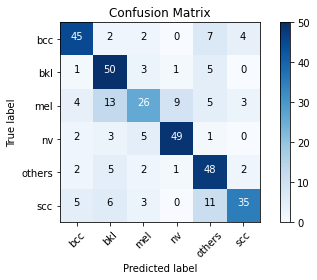

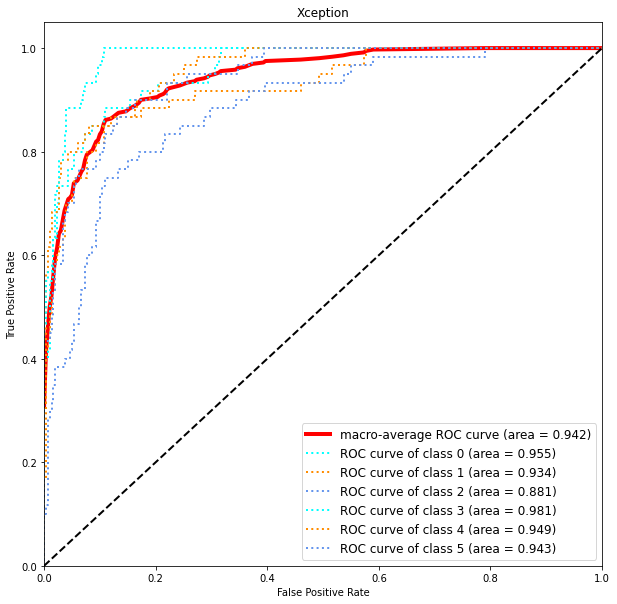

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2582 - categorical_accuracy: 0.5251
Epoch 1: val_categorical_accuracy improved from -inf to 0.37555, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 508ms/step - loss: 1.2582 - categorical_accuracy: 0.5251 - val_loss: 4.0546 - val_categorical_accuracy: 0.3755 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9334 - categorical_accuracy: 0.6513
Epoch 2: val_categorical_accuracy improved from 0.37555 to 0.44760, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 502ms/step - loss: 0.9334 - categorical_accuracy: 0.6513 - val_loss: 2.3899 - val_categorical_accuracy:

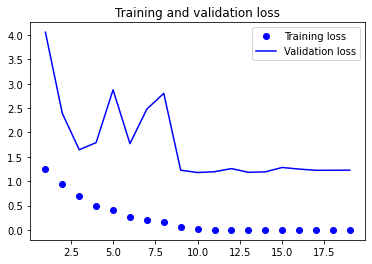

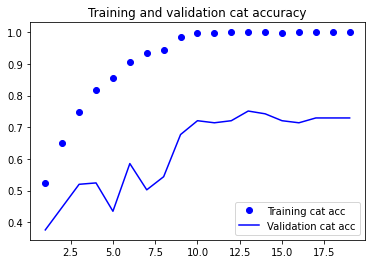

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[45  4  3  0  5  3]
 [ 6 43  5  2  4  0]
 [ 5  8 35  8  2  2]
 [ 2  3  5 49  1  0]
 [ 4  3  2  2 46  3]
 [ 4  3  7  1  6 39]]
              precision    recall  f1-score   support

         bcc       0.68      0.75      0.71        60
         bkl       0.67      0.72      0.69        60
         mel       0.61      0.58      0.60        60
          nv       0.79      0.82      0.80        60
      others       0.72      0.77      0.74        60
         scc       0.83      0.65      0.73        60

    accuracy                           0.71       360
   macro avg       0.72      0.71      0.71       360
weighted avg       0.72      0.71      0.71       360

Specificity of each class:
bcc : 0.930
bkl : 0.930
mel : 0.927
nv : 0.957
others : 0.940
scc : 0.973


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


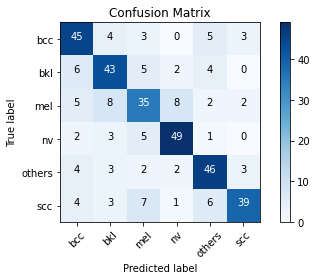

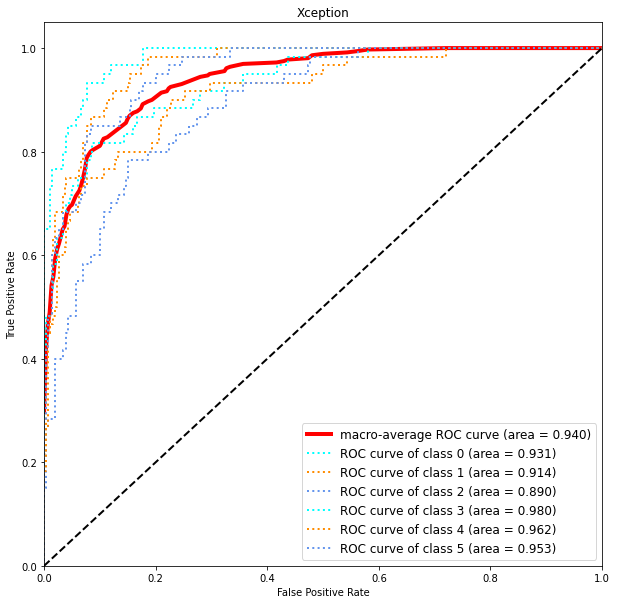

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2424 - categorical_accuracy: 0.5238
Epoch 1: val_categorical_accuracy improved from -inf to 0.39738, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2424 - categorical_accuracy: 0.5238 - val_loss: 2.0316 - val_categorical_accuracy: 0.3974 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9088 - categorical_accuracy: 0.6623
Epoch 2: val_categorical_accuracy improved from 0.39738 to 0.56114, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 500ms/step - loss: 0.9088 - categorical_accuracy: 0.6623 - val_loss: 1.2799 - val_categorical_accuracy:

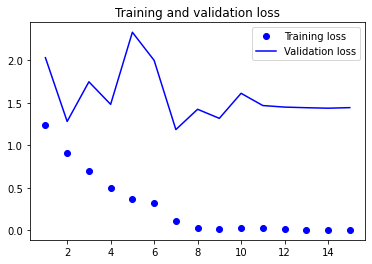

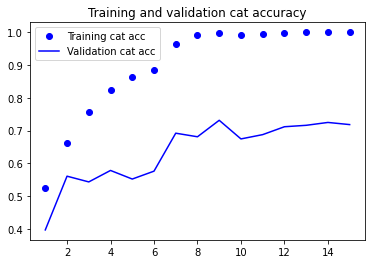

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[46  1  2  0  8  3]
 [ 2 44  6  2  5  1]
 [ 2 10 34 11  2  1]
 [ 1  1  6 52  0  0]
 [ 4  4  3  2 43  4]
 [ 7  3  6  0  5 39]]
              precision    recall  f1-score   support

         bcc       0.74      0.77      0.75        60
         bkl       0.70      0.73      0.72        60
         mel       0.60      0.57      0.58        60
          nv       0.78      0.87      0.82        60
      others       0.68      0.72      0.70        60
         scc       0.81      0.65      0.72        60

    accuracy                           0.72       360
   macro avg       0.72      0.72      0.72       360
weighted avg       0.72      0.72      0.72       360

Specificity of each class:
bcc : 0.947
bkl : 0.937
mel : 0.923
nv : 0.950
others : 0.933
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


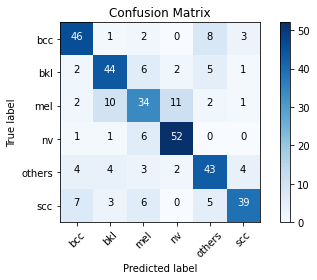

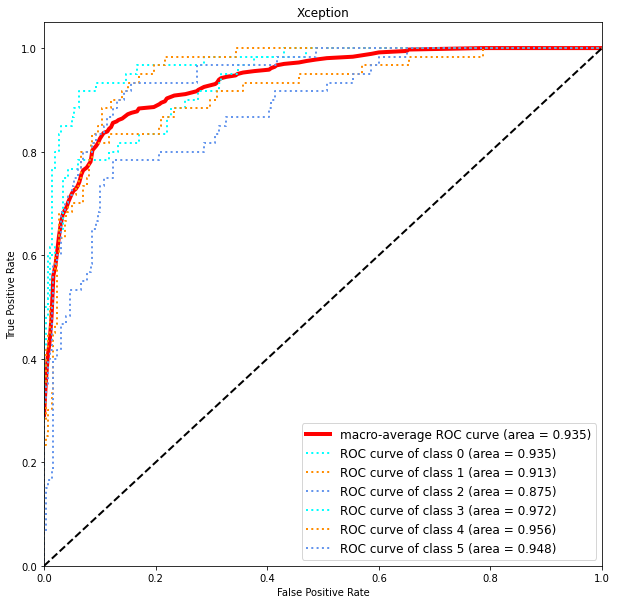

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2537 - categorical_accuracy: 0.5117
Epoch 1: val_categorical_accuracy improved from -inf to 0.46943, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 71s 510ms/step - loss: 1.2537 - categorical_accuracy: 0.5117 - val_loss: 3.3913 - val_categorical_accuracy: 0.4694 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9320 - categorical_accuracy: 0.6484
Epoch 2: val_categorical_accuracy improved from 0.46943 to 0.49782, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 499ms/step - loss: 0.9320 - categorical_accuracy: 0.6484 - val_loss: 1.5557 - val_categorical_accuracy:

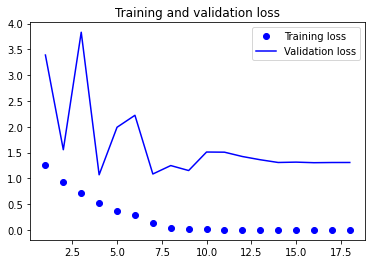

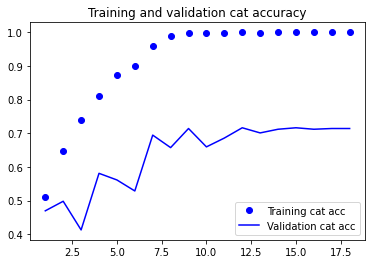

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[41  3  5  0  5  6]
 [ 3 47  5  2  2  1]
 [ 3 10 38  6  1  2]
 [ 1  3 11 43  2  0]
 [ 6  0  3  1 44  6]
 [12  3  5  0  1 39]]
              precision    recall  f1-score   support

         bcc       0.62      0.68      0.65        60
         bkl       0.71      0.78      0.75        60
         mel       0.57      0.63      0.60        60
          nv       0.83      0.72      0.77        60
      others       0.80      0.73      0.77        60
         scc       0.72      0.65      0.68        60

    accuracy                           0.70       360
   macro avg       0.71      0.70      0.70       360
weighted avg       0.71      0.70      0.70       360

Specificity of each class:
bcc : 0.917
bkl : 0.937
mel : 0.903
nv : 0.970
others : 0.963
scc : 0.950


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


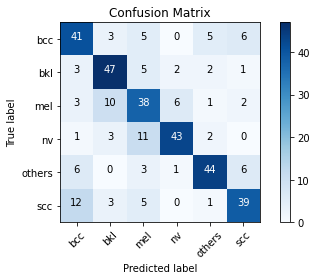

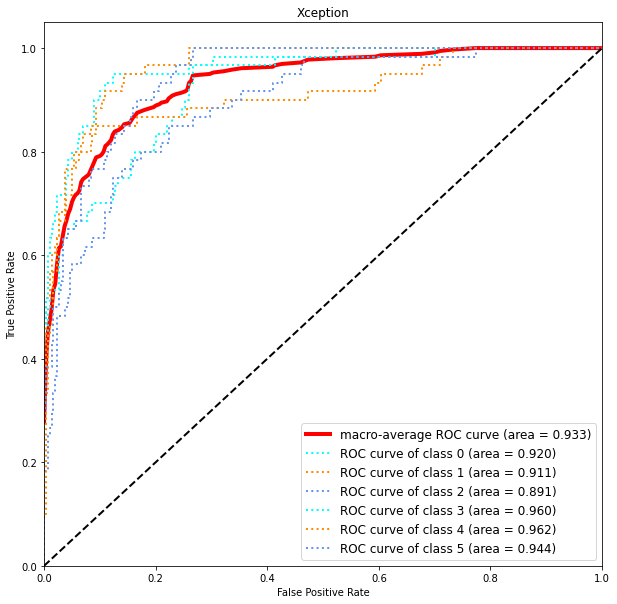

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2205 - categorical_accuracy: 0.5321
Epoch 1: val_categorical_accuracy improved from -inf to 0.48035, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 504ms/step - loss: 1.2205 - categorical_accuracy: 0.5321 - val_loss: 2.6618 - val_categorical_accuracy: 0.4803 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9323 - categorical_accuracy: 0.6445
Epoch 2: val_categorical_accuracy improved from 0.48035 to 0.54803, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 496ms/step - loss: 0.9323 - categorical_accuracy: 0.6445 - val_loss: 1.5602 - val_categorical_accuracy:

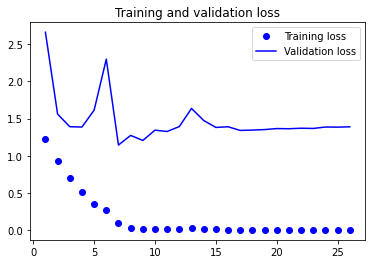

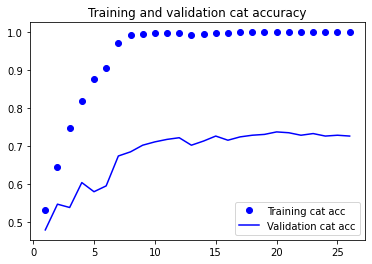

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[47  2  2  0  7  2]
 [ 3 48  5  1  3  0]
 [ 4  8 37  7  1  3]
 [ 1  2  4 52  1  0]
 [ 1  3  5  3 44  4]
 [ 7  1  3  0  6 43]]
              precision    recall  f1-score   support

         bcc       0.75      0.78      0.76        60
         bkl       0.75      0.80      0.77        60
         mel       0.66      0.62      0.64        60
          nv       0.83      0.87      0.85        60
      others       0.71      0.73      0.72        60
         scc       0.83      0.72      0.77        60

    accuracy                           0.75       360
   macro avg       0.75      0.75      0.75       360
weighted avg       0.75      0.75      0.75       360

Specificity of each class:
bcc : 0.947
bkl : 0.947
mel : 0.937
nv : 0.963
others : 0.940
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


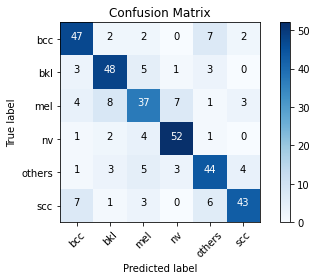

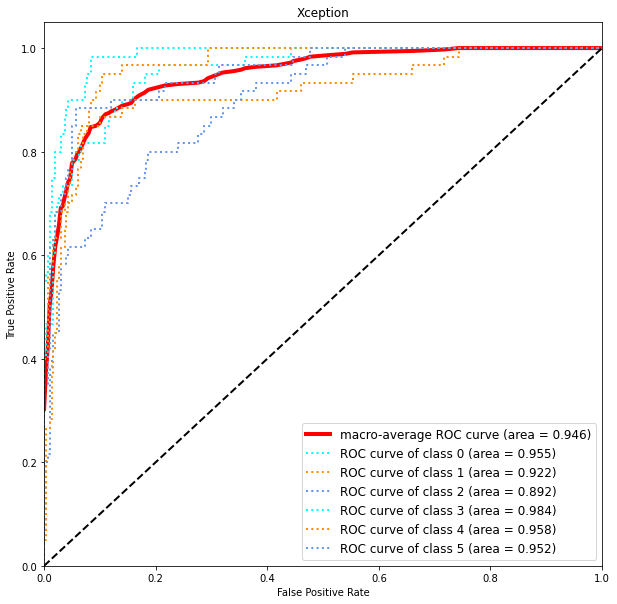

In [ ]:
train_model(800)

## 1200

100%|██████████| 360/360 [00:01<00:00, 296.26it/s]


This is samplesize 1200 1
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.1756 - categorical_accuracy: 0.5453
Epoch 1: val_categorical_accuracy improved from -inf to 0.41400, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 100s 515ms/step - loss: 1.1756 - categorical_accuracy: 0.5453 - val_loss: 2.0709 - val_categorical_accuracy: 0.4140 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9088 - categorical_accuracy: 0.6544
Epoch 2: val_categorical_accuracy improved from 0.41400 to 0.49772, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 498ms/step - loss: 0.9088 - categorical_accuracy: 0.6544 - val_loss: 2.2467 - val_categorical_accurac

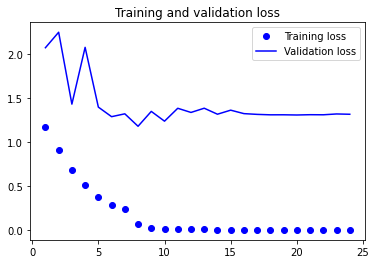

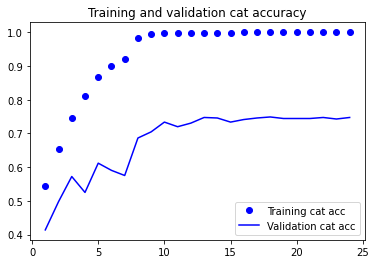

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[48  2  2  2  5  1]
 [ 2 50  2  2  4  0]
 [ 3 11 33  7  4  2]
 [ 1  4  3 52  0  0]
 [ 1  4  3  1 49  2]
 [ 6  6  4  0  4 40]]
              precision    recall  f1-score   support

         bcc       0.79      0.80      0.79        60
         bkl       0.65      0.83      0.73        60
         mel       0.70      0.55      0.62        60
          nv       0.81      0.87      0.84        60
      others       0.74      0.82      0.78        60
         scc       0.89      0.67      0.76        60

    accuracy                           0.76       360
   macro avg       0.76      0.76      0.75       360
weighted avg       0.76      0.76      0.75       360

Specificity of each class:
bcc : 0.957
bkl : 0.910
mel : 0.953
nv : 0.960
others : 0.943
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


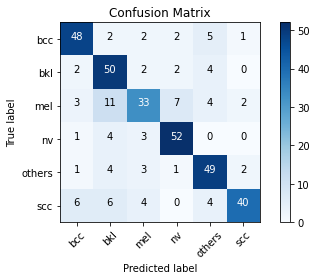

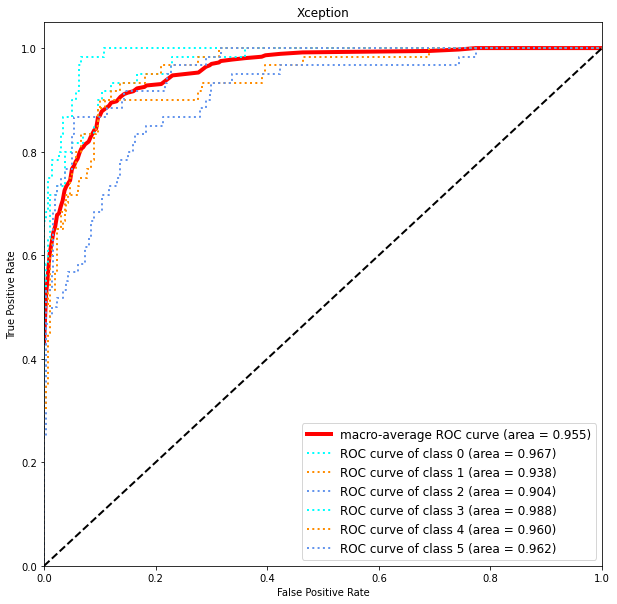

This is samplesize 1200 2
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2077 - categorical_accuracy: 0.5290
Epoch 1: val_categorical_accuracy improved from -inf to 0.45814, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 505ms/step - loss: 1.2077 - categorical_accuracy: 0.5290 - val_loss: 1.8888 - val_categorical_accuracy: 0.4581 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9131 - categorical_accuracy: 0.6561
Epoch 2: val_categorical_accuracy improved from 0.45814 to 0.61492, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 92s 498ms/step - loss: 0.9131 - categorical_accuracy: 0.6561 - val_loss: 1.2877 - val_categorical_accuracy

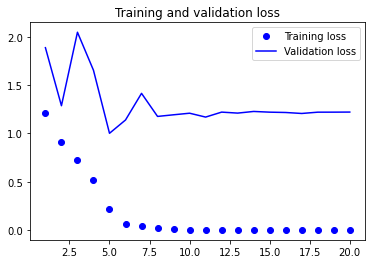

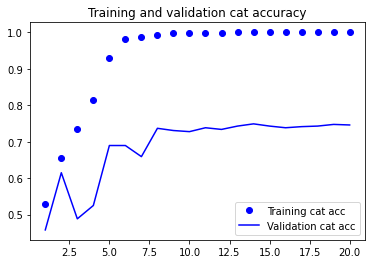

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[48  1  3  0  7  1]
 [ 3 50  2  0  5  0]
 [ 5 14 31  6  3  1]
 [ 0  4  3 53  0  0]
 [ 1  3  2  0 51  3]
 [ 5  5  3  0  8 39]]
              precision    recall  f1-score   support

         bcc       0.77      0.80      0.79        60
         bkl       0.65      0.83      0.73        60
         mel       0.70      0.52      0.60        60
          nv       0.90      0.88      0.89        60
      others       0.69      0.85      0.76        60
         scc       0.89      0.65      0.75        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.75       360
weighted avg       0.77      0.76      0.75       360

Specificity of each class:
bcc : 0.953
bkl : 0.910
mel : 0.957
nv : 0.980
others : 0.923
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


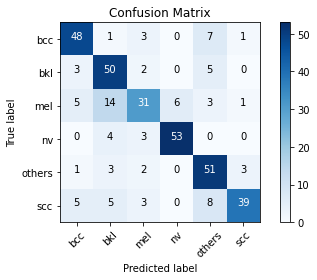

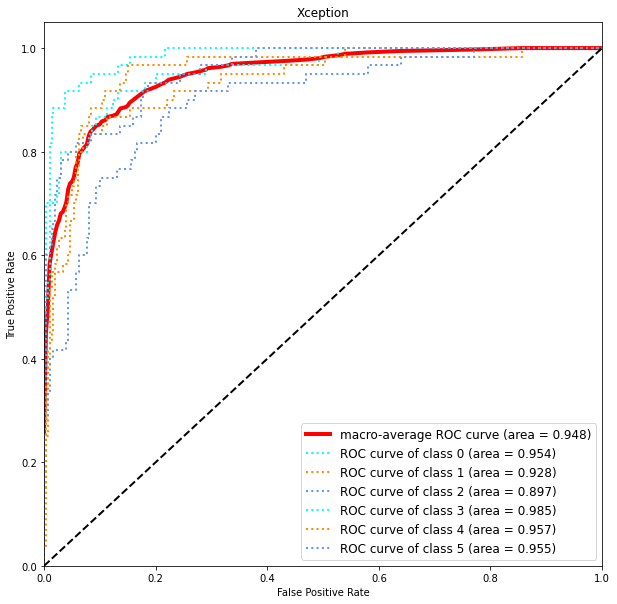

This is samplesize 1200 3
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.1959 - categorical_accuracy: 0.5398
Epoch 1: val_categorical_accuracy improved from -inf to 0.51598, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 504ms/step - loss: 1.1959 - categorical_accuracy: 0.5398 - val_loss: 1.4196 - val_categorical_accuracy: 0.5160 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9039 - categorical_accuracy: 0.6490
Epoch 2: val_categorical_accuracy improved from 0.51598 to 0.63927, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 500ms/step - loss: 0.9039 - categorical_accuracy: 0.6490 - val_loss: 1.0421 - val_categorical_accuracy

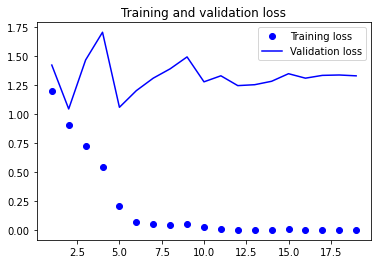

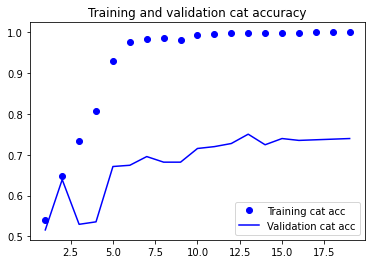

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[46  3  1  2  8  0]
 [ 2 49  4  1  4  0]
 [ 3  8 34 11  4  0]
 [ 0  4  2 54  0  0]
 [ 0  2  4  1 52  1]
 [ 3  2  2  2 12 39]]
              precision    recall  f1-score   support

         bcc       0.85      0.77      0.81        60
         bkl       0.72      0.82      0.77        60
         mel       0.72      0.57      0.64        60
          nv       0.76      0.90      0.82        60
      others       0.65      0.87      0.74        60
         scc       0.97      0.65      0.78        60

    accuracy                           0.76       360
   macro avg       0.78      0.76      0.76       360
weighted avg       0.78      0.76      0.76       360

Specificity of each class:
bcc : 0.973
bkl : 0.937
mel : 0.957
nv : 0.943
others : 0.907
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


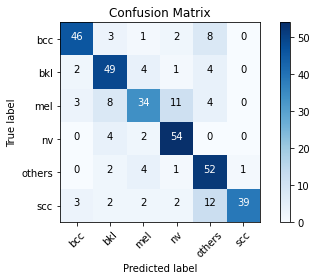

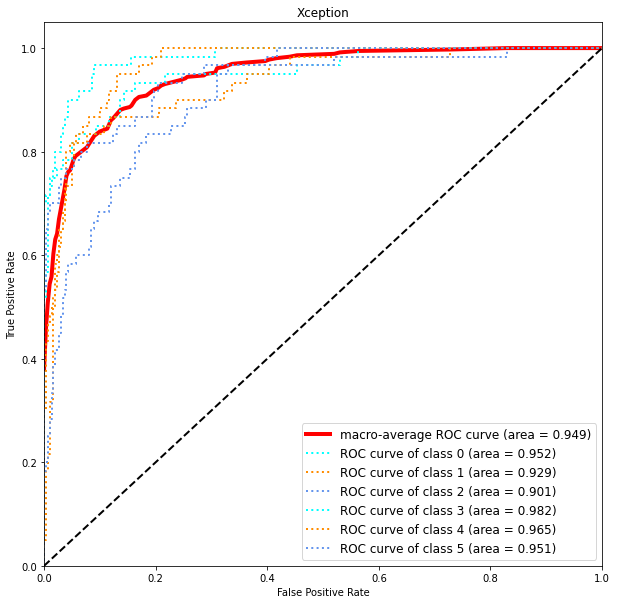

This is samplesize 1200 4
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2023 - categorical_accuracy: 0.5419
Epoch 1: val_categorical_accuracy improved from -inf to 0.35769, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 99s 506ms/step - loss: 1.2023 - categorical_accuracy: 0.5419 - val_loss: 3.5627 - val_categorical_accuracy: 0.3577 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9009 - categorical_accuracy: 0.6610
Epoch 2: val_categorical_accuracy improved from 0.35769 to 0.54795, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 499ms/step - loss: 0.9009 - categorical_accuracy: 0.6610 - val_loss: 1.4931 - val_categorical_accuracy

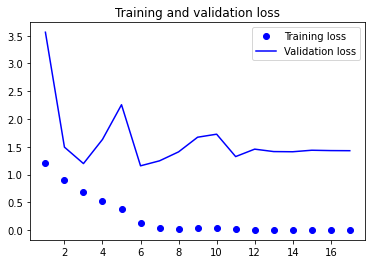

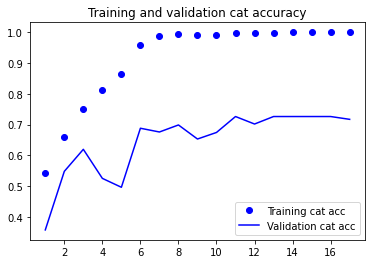

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[51  1  1  0  6  1]
 [ 6 40  3  5  6  0]
 [ 4  5 36 10  4  1]
 [ 0  0  6 54  0  0]
 [ 0  2  0  1 55  2]
 [11  1  3  0  9 36]]
              precision    recall  f1-score   support

         bcc       0.71      0.85      0.77        60
         bkl       0.82      0.67      0.73        60
         mel       0.73      0.60      0.66        60
          nv       0.77      0.90      0.83        60
      others       0.69      0.92      0.79        60
         scc       0.90      0.60      0.72        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.75       360
weighted avg       0.77      0.76      0.75       360

Specificity of each class:
bcc : 0.930
bkl : 0.970
mel : 0.957
nv : 0.947
others : 0.917
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


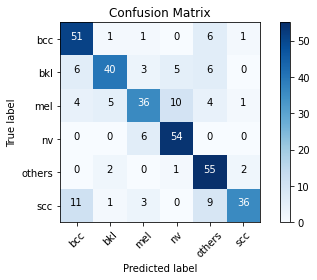

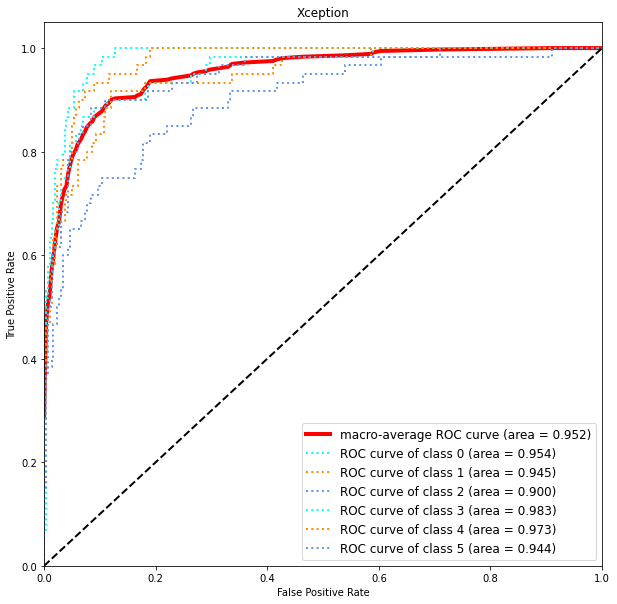

This is samplesize 1200 5
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2047 - categorical_accuracy: 0.5375
Epoch 1: val_categorical_accuracy improved from -inf to 0.41248, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 504ms/step - loss: 1.2047 - categorical_accuracy: 0.5375 - val_loss: 1.6897 - val_categorical_accuracy: 0.4125 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9201 - categorical_accuracy: 0.6550
Epoch 2: val_categorical_accuracy improved from 0.41248 to 0.61644, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 498ms/step - loss: 0.9201 - categorical_accuracy: 0.6550 - val_loss: 1.2264 - val_categorical_accuracy

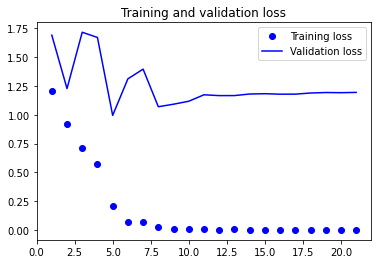

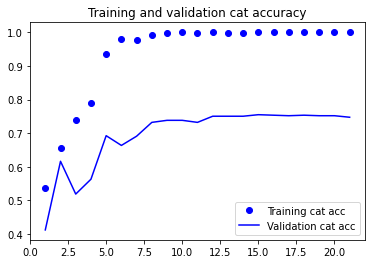

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[51  2  0  2  2  3]
 [ 2 48  3  1  4  2]
 [ 6  8 33  7  4  2]
 [ 0  3  3 54  0  0]
 [ 3  4  1  0 50  2]
 [ 9  2  3  0  9 37]]
              precision    recall  f1-score   support

         bcc       0.72      0.85      0.78        60
         bkl       0.72      0.80      0.76        60
         mel       0.77      0.55      0.64        60
          nv       0.84      0.90      0.87        60
      others       0.72      0.83      0.78        60
         scc       0.80      0.62      0.70        60

    accuracy                           0.76       360
   macro avg       0.76      0.76      0.75       360
weighted avg       0.76      0.76      0.75       360

Specificity of each class:
bcc : 0.933
bkl : 0.937
mel : 0.967
nv : 0.967
others : 0.937
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


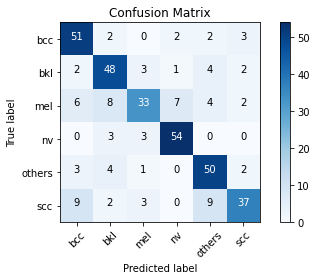

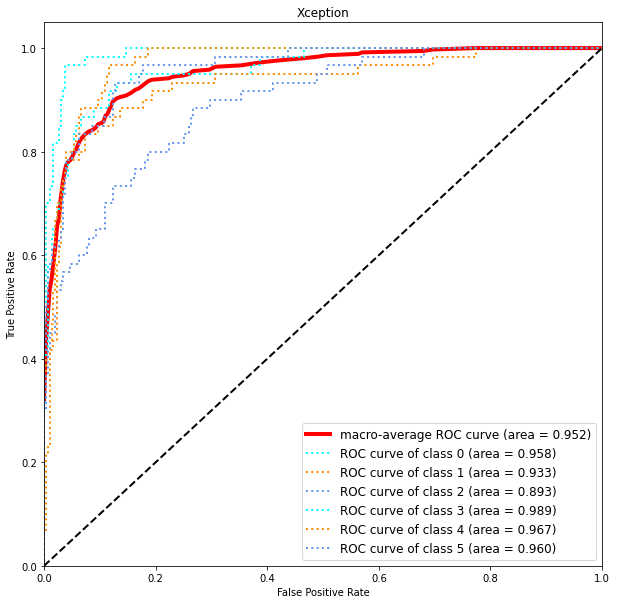

In [ ]:
train_model(1200)

100%|██████████| 360/360 [00:00<00:00, 488.04it/s]


This is samplesize 800 1
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2536 - categorical_accuracy: 0.5124
Epoch 1: val_categorical_accuracy improved from -inf to 0.41266, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 506ms/step - loss: 1.2536 - categorical_accuracy: 0.5124 - val_loss: 2.4175 - val_categorical_accuracy: 0.4127 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9200 - categorical_accuracy: 0.6552
Epoch 2: val_categorical_accuracy improved from 0.41266 to 0.51310, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 497ms/step - loss: 0.9200 - categorical_accuracy: 0.6552 - val_loss: 1.6598 - val_categorical_accuracy:

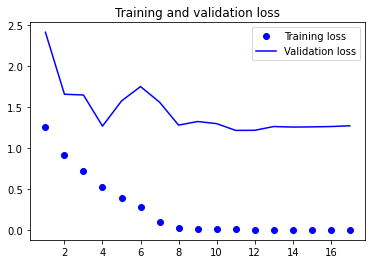

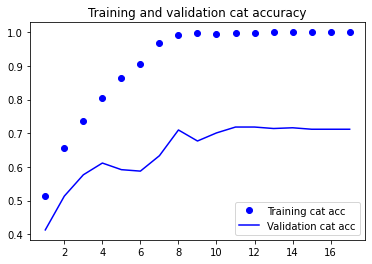

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  2  1  0 11  3]
 [ 2 44  4  3  5  2]
 [ 4 10 36  6  2  2]
 [ 2  3  3 52  0  0]
 [ 1  2  1  1 53  2]
 [ 6  0  5  0  7 42]]
              precision    recall  f1-score   support

         bcc       0.74      0.72      0.73        60
         bkl       0.72      0.73      0.73        60
         mel       0.72      0.60      0.65        60
          nv       0.84      0.87      0.85        60
      others       0.68      0.88      0.77        60
         scc       0.82      0.70      0.76        60

    accuracy                           0.75       360
   macro avg       0.75      0.75      0.75       360
weighted avg       0.75      0.75      0.75       360

Specificity of each class:
bcc : 0.950
bkl : 0.943
mel : 0.953
nv : 0.967
others : 0.917
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


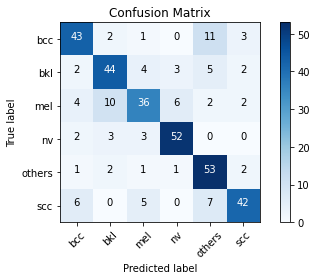

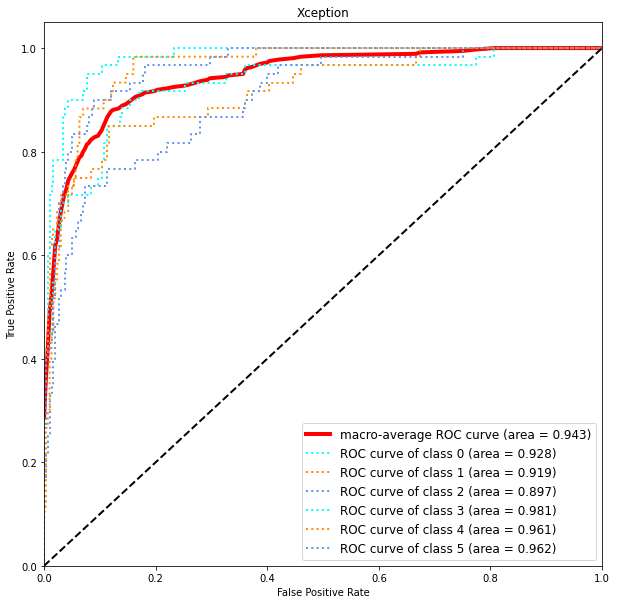

This is samplesize 800 2
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2745 - categorical_accuracy: 0.5114
Epoch 1: val_categorical_accuracy improved from -inf to 0.37991, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2745 - categorical_accuracy: 0.5114 - val_loss: 2.3642 - val_categorical_accuracy: 0.3799 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9744 - categorical_accuracy: 0.6294
Epoch 2: val_categorical_accuracy improved from 0.37991 to 0.52183, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 497ms/step - loss: 0.9744 - categorical_accuracy: 0.6294 - val_loss: 2.0044 - val_categorical_accuracy:

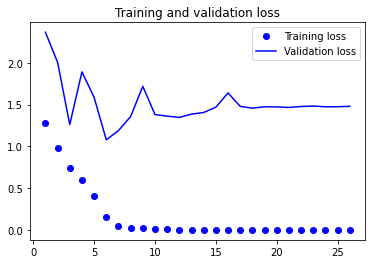

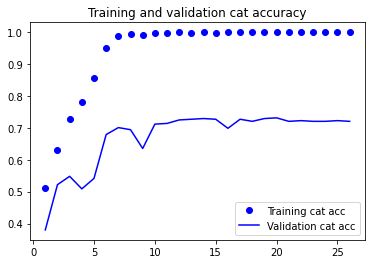

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[47  4  2  0  5  2]
 [ 2 45  7  1  3  2]
 [ 5  7 31  9  6  2]
 [ 0  1  5 53  1  0]
 [ 2  7  1  1 46  3]
 [ 6  5  3  0  2 44]]
              precision    recall  f1-score   support

         bcc       0.76      0.78      0.77        60
         bkl       0.65      0.75      0.70        60
         mel       0.63      0.52      0.57        60
          nv       0.83      0.88      0.85        60
      others       0.73      0.77      0.75        60
         scc       0.83      0.73      0.78        60

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360

Specificity of each class:
bcc : 0.950
bkl : 0.920
mel : 0.940
nv : 0.963
others : 0.943
scc : 0.970


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


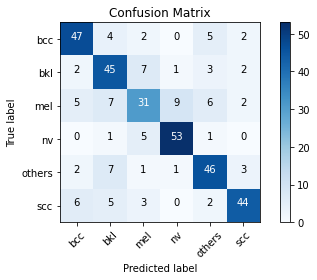

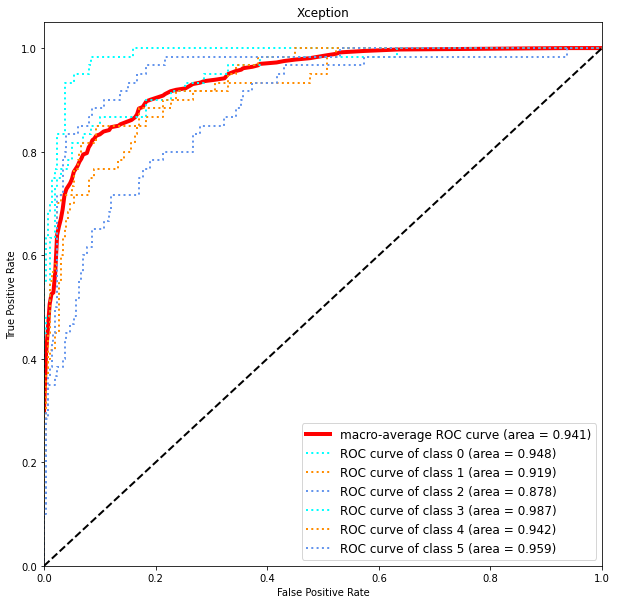

This is samplesize 800 3
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2578 - categorical_accuracy: 0.5078
Epoch 1: val_categorical_accuracy improved from -inf to 0.42795, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 507ms/step - loss: 1.2578 - categorical_accuracy: 0.5078 - val_loss: 1.8319 - val_categorical_accuracy: 0.4279 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9438 - categorical_accuracy: 0.6438
Epoch 2: val_categorical_accuracy improved from 0.42795 to 0.58297, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 501ms/step - loss: 0.9438 - categorical_accuracy: 0.6438 - val_loss: 1.2497 - val_categorical_accuracy:

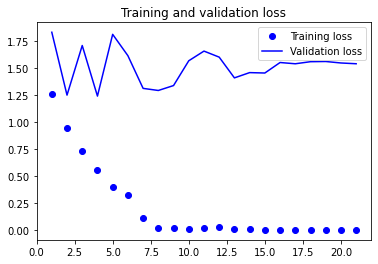

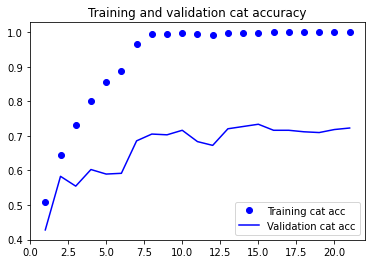

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[46  0  4  0  9  1]
 [ 4 45  6  0  3  2]
 [ 7  6 35  9  2  1]
 [ 1  2  7 50  0  0]
 [ 2  5  3  1 48  1]
 [10  4  2  0  4 40]]
              precision    recall  f1-score   support

         bcc       0.66      0.77      0.71        60
         bkl       0.73      0.75      0.74        60
         mel       0.61      0.58      0.60        60
          nv       0.83      0.83      0.83        60
      others       0.73      0.80      0.76        60
         scc       0.89      0.67      0.76        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.73       360
weighted avg       0.74      0.73      0.73       360

Specificity of each class:
bcc : 0.920
bkl : 0.943
mel : 0.927
nv : 0.967
others : 0.940
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


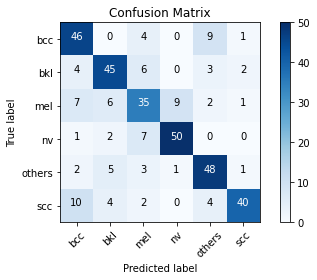

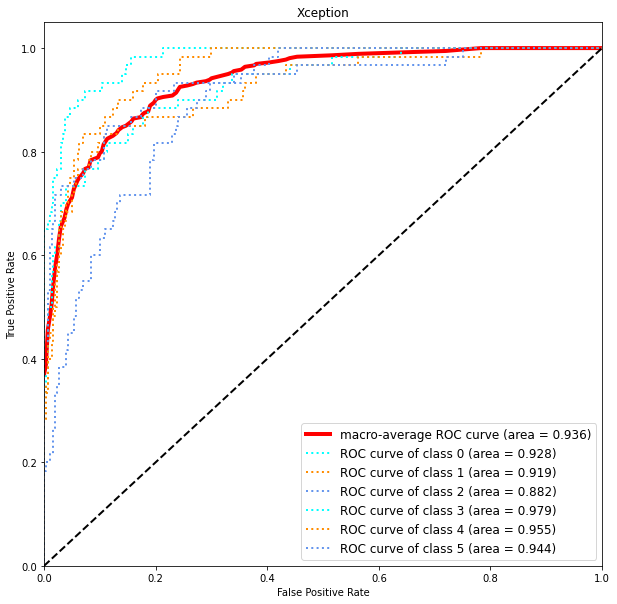

This is samplesize 800 4
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2267 - categorical_accuracy: 0.5253
Epoch 1: val_categorical_accuracy improved from -inf to 0.44541, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 505ms/step - loss: 1.2267 - categorical_accuracy: 0.5253 - val_loss: 4.3349 - val_categorical_accuracy: 0.4454 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9306 - categorical_accuracy: 0.6482
Epoch 2: val_categorical_accuracy improved from 0.44541 to 0.50218, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 65s 498ms/step - loss: 0.9306 - categorical_accuracy: 0.6482 - val_loss: 3.4655 - val_categorical_accuracy:

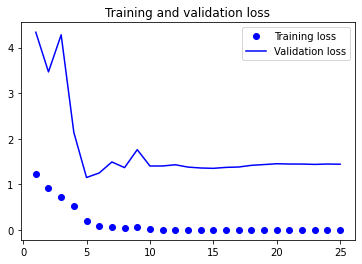

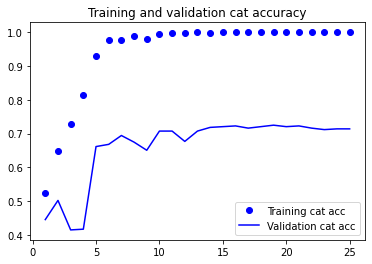

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  1  3  0  6  7]
 [ 4 47  3  1  3  2]
 [ 2 10 33  8  4  3]
 [ 2  3  6 48  1  0]
 [ 1  4  2  1 50  2]
 [ 9  1  3  0  8 39]]
              precision    recall  f1-score   support

         bcc       0.70      0.72      0.71        60
         bkl       0.71      0.78      0.75        60
         mel       0.66      0.55      0.60        60
          nv       0.83      0.80      0.81        60
      others       0.69      0.83      0.76        60
         scc       0.74      0.65      0.69        60

    accuracy                           0.72       360
   macro avg       0.72      0.72      0.72       360
weighted avg       0.72      0.72      0.72       360

Specificity of each class:
bcc : 0.940
bkl : 0.937
mel : 0.943
nv : 0.967
others : 0.927
scc : 0.953


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


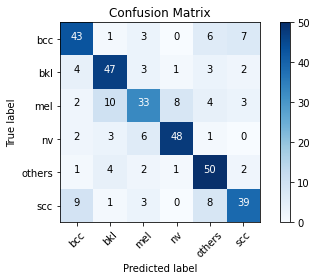

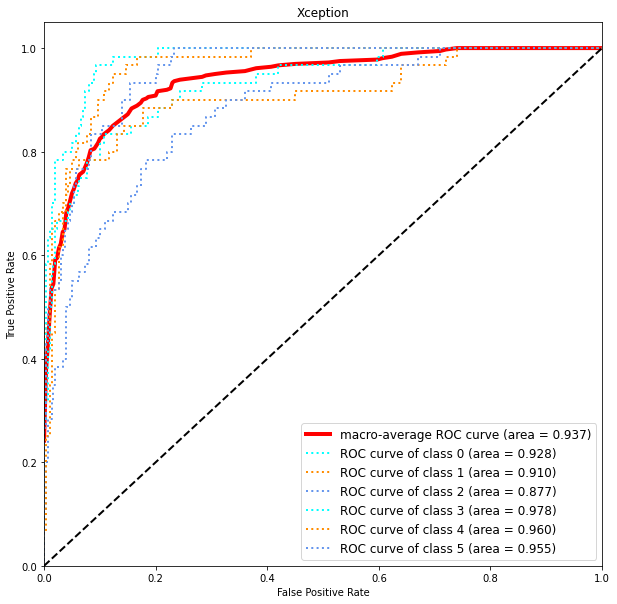

This is samplesize 800 5
Found 4110 images belonging to 6 classes.
Found 458 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
129/129 [==============================] - ETA: 0s - loss: 1.2564 - categorical_accuracy: 0.5114
Epoch 1: val_categorical_accuracy improved from -inf to 0.28821, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 70s 504ms/step - loss: 1.2564 - categorical_accuracy: 0.5114 - val_loss: 3.8966 - val_categorical_accuracy: 0.2882 - lr: 0.0010
Epoch 2/60
129/129 [==============================] - ETA: 0s - loss: 0.9234 - categorical_accuracy: 0.6543
Epoch 2: val_categorical_accuracy improved from 0.28821 to 0.49345, saving model to Model/Skin Lesion 299 Random resize 92%.h5
129/129 [==============================] - 64s 498ms/step - loss: 0.9234 - categorical_accuracy: 0.6543 - val_loss: 1.7816 - val_categorical_accuracy:

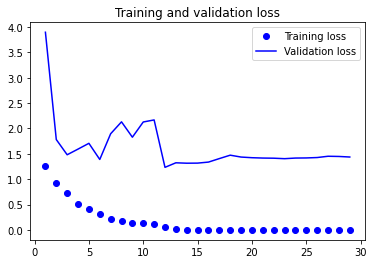

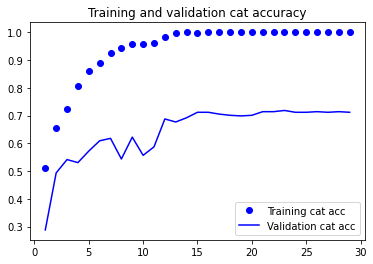

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[43  3  3  0  7  4]
 [ 3 44  4  2  5  2]
 [ 2 12 31  9  4  2]
 [ 0  2  3 53  1  1]
 [ 2  8  2  0 47  1]
 [ 7  3  6  1  8 35]]
              precision    recall  f1-score   support

         bcc       0.75      0.72      0.74        60
         bkl       0.61      0.73      0.67        60
         mel       0.63      0.52      0.57        60
          nv       0.82      0.88      0.85        60
      others       0.65      0.78      0.71        60
         scc       0.78      0.58      0.67        60

    accuracy                           0.70       360
   macro avg       0.71      0.70      0.70       360
weighted avg       0.71      0.70      0.70       360

Specificity of each class:
bcc : 0.953
bkl : 0.907
mel : 0.940
nv : 0.960
others : 0.917
scc : 0.967


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


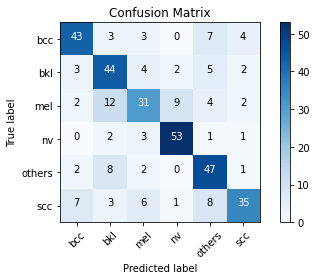

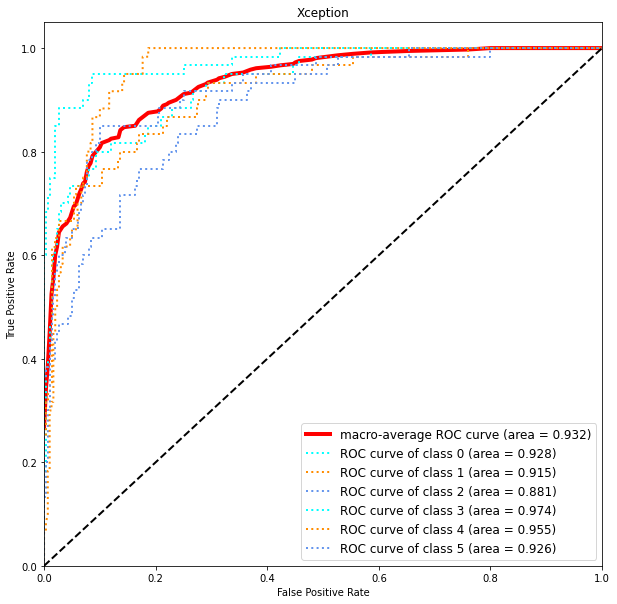

In [ ]:
train_model(1200)

100%|██████████| 360/360 [00:00<00:00, 486.78it/s]


This is samplesize 1200 1
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.1974 - categorical_accuracy: 0.5326
Epoch 1: val_categorical_accuracy improved from -inf to 0.44444, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 101s 517ms/step - loss: 1.1974 - categorical_accuracy: 0.5326 - val_loss: 1.6009 - val_categorical_accuracy: 0.4444 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9125 - categorical_accuracy: 0.6547
Epoch 2: val_categorical_accuracy improved from 0.44444 to 0.48097, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 500ms/step - loss: 0.9125 - categorical_accuracy: 0.6547 - val_loss: 1.7038 - val_categorical_accurac

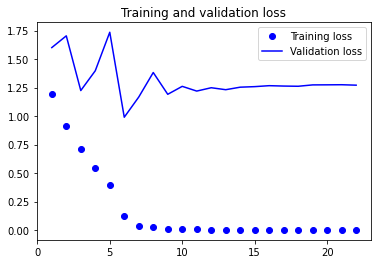

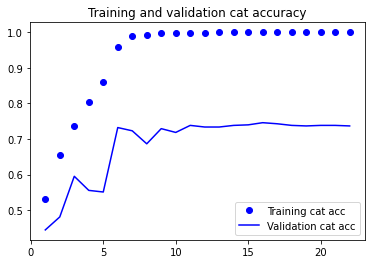

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  1  3  1  6  1]
 [ 3 47  3  0  7  0]
 [ 3 11 36  7  2  1]
 [ 0  0  3 56  1  0]
 [ 1  2  2  3 51  1]
 [13  2  5  0  9 31]]
              precision    recall  f1-score   support

         bcc       0.71      0.80      0.75        60
         bkl       0.75      0.78      0.76        60
         mel       0.69      0.60      0.64        60
          nv       0.84      0.93      0.88        60
      others       0.67      0.85      0.75        60
         scc       0.91      0.52      0.66        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.74       360
weighted avg       0.76      0.75      0.74       360

Specificity of each class:
bcc : 0.933
bkl : 0.947
mel : 0.947
nv : 0.963
others : 0.917
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


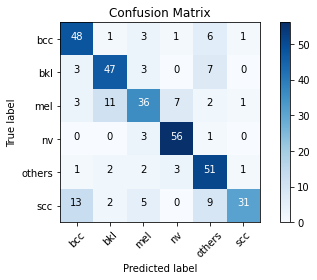

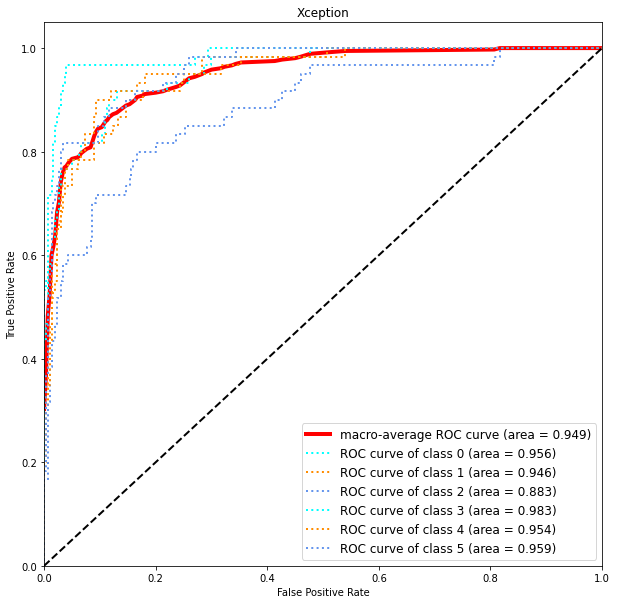

This is samplesize 1200 2
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.1964 - categorical_accuracy: 0.5498
Epoch 1: val_categorical_accuracy improved from -inf to 0.45205, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 506ms/step - loss: 1.1964 - categorical_accuracy: 0.5498 - val_loss: 1.7164 - val_categorical_accuracy: 0.4521 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9210 - categorical_accuracy: 0.6600
Epoch 2: val_categorical_accuracy did not improve from 0.45205
185/185 [==============================] - 92s 495ms/step - loss: 0.9210 - categorical_accuracy: 0.6600 - val_loss: 3.6377 - val_categorical_accuracy: 0.3181 - lr: 0.0010
Epoch 3/60
185/185 [======================

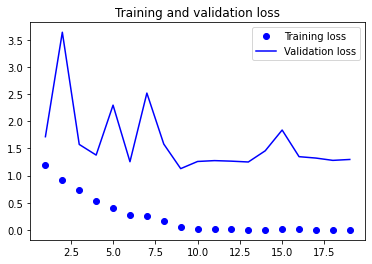

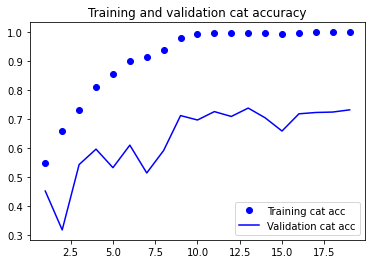

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[53  1  3  0  2  1]
 [ 1 47  4  1  4  3]
 [ 4  7 34  8  4  3]
 [ 1  4  6 48  1  0]
 [ 0  1  1  0 55  3]
 [ 6  1  5  0  7 41]]
              precision    recall  f1-score   support

         bcc       0.82      0.88      0.85        60
         bkl       0.77      0.78      0.78        60
         mel       0.64      0.57      0.60        60
          nv       0.84      0.80      0.82        60
      others       0.75      0.92      0.83        60
         scc       0.80      0.68      0.74        60

    accuracy                           0.77       360
   macro avg       0.77      0.77      0.77       360
weighted avg       0.77      0.77      0.77       360

Specificity of each class:
bcc : 0.960
bkl : 0.953
mel : 0.937
nv : 0.970
others : 0.940
scc : 0.967


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


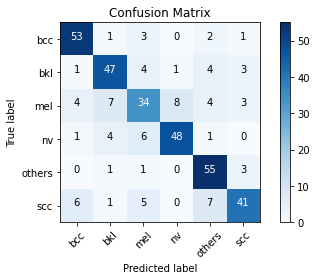

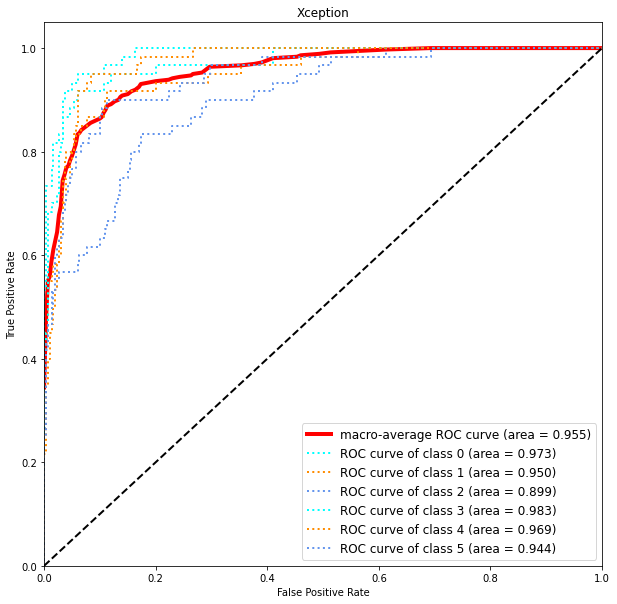

This is samplesize 1200 3
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2487 - categorical_accuracy: 0.5109
Epoch 1: val_categorical_accuracy improved from -inf to 0.44444, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 99s 508ms/step - loss: 1.2487 - categorical_accuracy: 0.5109 - val_loss: 2.4830 - val_categorical_accuracy: 0.4444 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9565 - categorical_accuracy: 0.6351
Epoch 2: val_categorical_accuracy improved from 0.44444 to 0.60426, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 499ms/step - loss: 0.9565 - categorical_accuracy: 0.6351 - val_loss: 1.2305 - val_categorical_accuracy

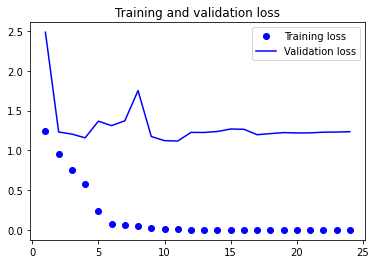

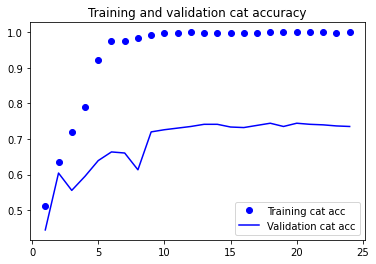

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  2  2  1  6  1]
 [ 3 45  4  1  7  0]
 [ 2 10 37  5  3  3]
 [ 0  2  1 57  0  0]
 [ 3  2  2  0 51  2]
 [ 4  4  4  0  7 41]]
              precision    recall  f1-score   support

         bcc       0.80      0.80      0.80        60
         bkl       0.69      0.75      0.72        60
         mel       0.74      0.62      0.67        60
          nv       0.89      0.95      0.92        60
      others       0.69      0.85      0.76        60
         scc       0.87      0.68      0.77        60

    accuracy                           0.78       360
   macro avg       0.78      0.78      0.77       360
weighted avg       0.78      0.78      0.77       360

Specificity of each class:
bcc : 0.960
bkl : 0.933
mel : 0.957
nv : 0.977
others : 0.923
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


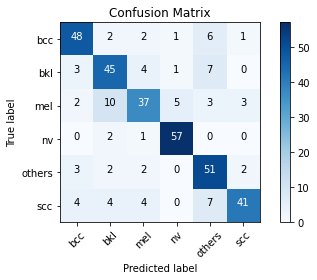

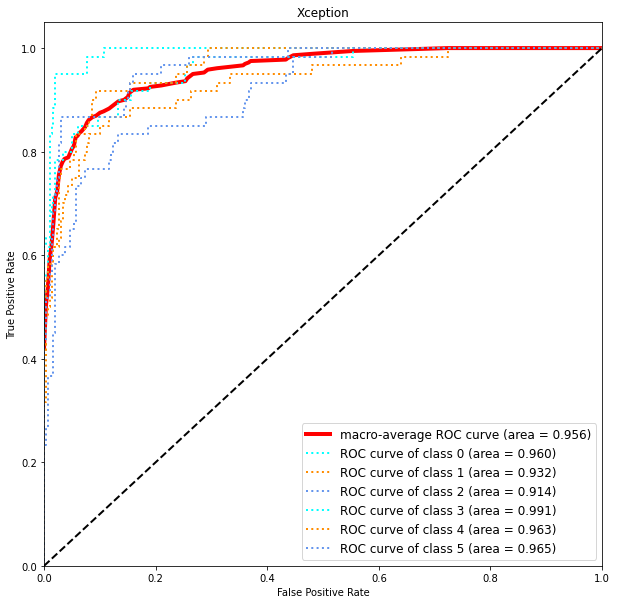

This is samplesize 1200 4
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2214 - categorical_accuracy: 0.5256
Epoch 1: val_categorical_accuracy improved from -inf to 0.52968, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 506ms/step - loss: 1.2214 - categorical_accuracy: 0.5256 - val_loss: 1.3427 - val_categorical_accuracy: 0.5297 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9278 - categorical_accuracy: 0.6481
Epoch 2: val_categorical_accuracy did not improve from 0.52968
185/185 [==============================] - 92s 495ms/step - loss: 0.9278 - categorical_accuracy: 0.6481 - val_loss: 1.6959 - val_categorical_accuracy: 0.4688 - lr: 0.0010
Epoch 3/60
185/185 [======================

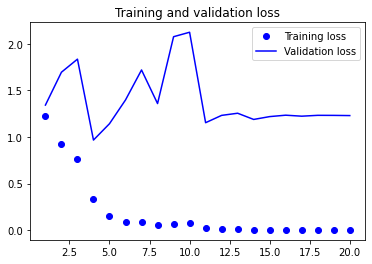

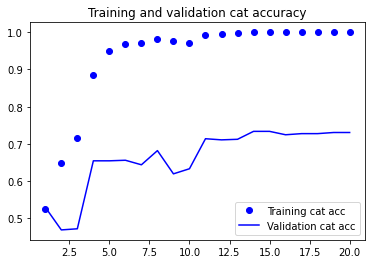

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[43  2  4  1  7  3]
 [ 2 46  4  1  6  1]
 [ 3 10 38  7  2  0]
 [ 1  2  4 53  0  0]
 [ 2  4  2  0 50  2]
 [ 8  1  2  1 11 37]]
              precision    recall  f1-score   support

         bcc       0.73      0.72      0.72        60
         bkl       0.71      0.77      0.74        60
         mel       0.70      0.63      0.67        60
          nv       0.84      0.88      0.86        60
      others       0.66      0.83      0.74        60
         scc       0.86      0.62      0.72        60

    accuracy                           0.74       360
   macro avg       0.75      0.74      0.74       360
weighted avg       0.75      0.74      0.74       360

Specificity of each class:
bcc : 0.947
bkl : 0.937
mel : 0.947
nv : 0.967
others : 0.913
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


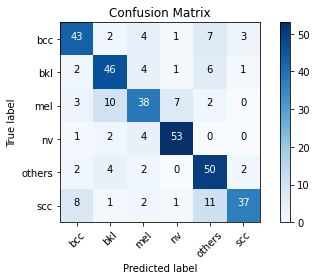

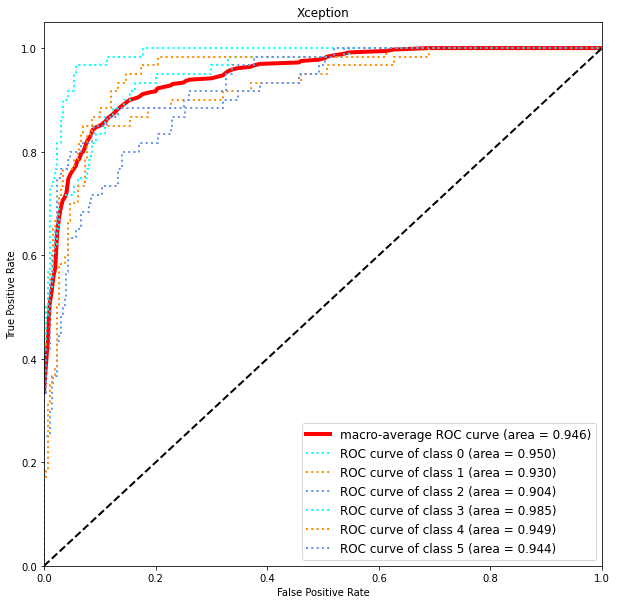

This is samplesize 1200 5
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2195 - categorical_accuracy: 0.5348
Epoch 1: val_categorical_accuracy improved from -inf to 0.42770, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 99s 509ms/step - loss: 1.2195 - categorical_accuracy: 0.5348 - val_loss: 1.4963 - val_categorical_accuracy: 0.4277 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9068 - categorical_accuracy: 0.6530
Epoch 2: val_categorical_accuracy improved from 0.42770 to 0.55860, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 501ms/step - loss: 0.9068 - categorical_accuracy: 0.6530 - val_loss: 1.2202 - val_categorical_accuracy

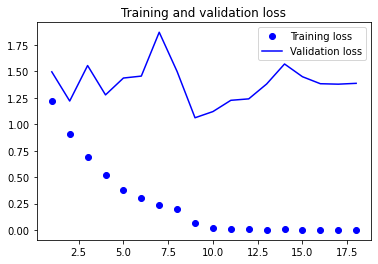

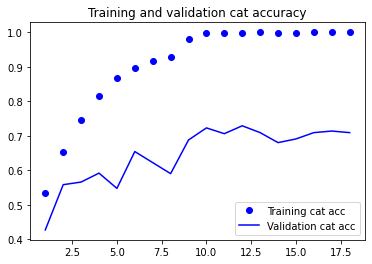

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[47  1  5  1  5  1]
 [ 2 40  6  4  8  0]
 [ 2  7 38  9  4  0]
 [ 1  0  4 54  1  0]
 [ 0  2  0  4 54  0]
 [ 7  4  6  4  9 30]]
              precision    recall  f1-score   support

         bcc       0.80      0.78      0.79        60
         bkl       0.74      0.67      0.70        60
         mel       0.64      0.63      0.64        60
          nv       0.71      0.90      0.79        60
      others       0.67      0.90      0.77        60
         scc       0.97      0.50      0.66        60

    accuracy                           0.73       360
   macro avg       0.75      0.73      0.72       360
weighted avg       0.75      0.73      0.72       360

Specificity of each class:
bcc : 0.960
bkl : 0.953
mel : 0.930
nv : 0.927
others : 0.910
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


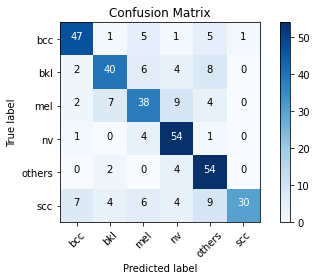

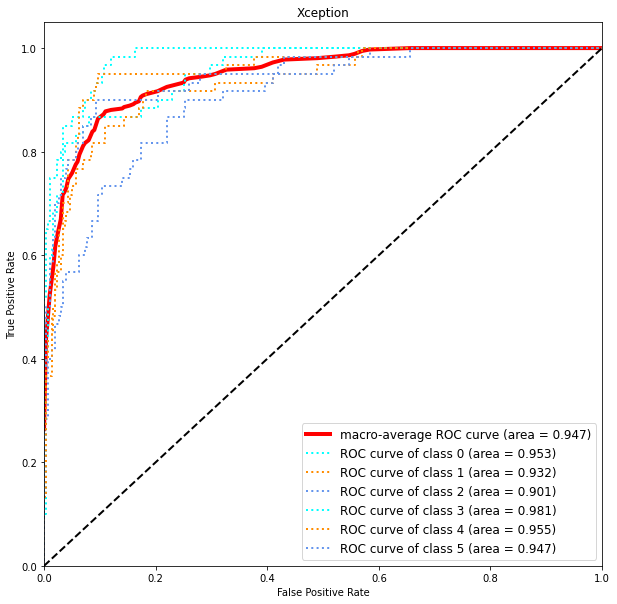

In [ ]:
train_model(1200)

100%|██████████| 360/360 [00:03<00:00, 93.26it/s]


This is samplesize 1200 1
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2003 - categorical_accuracy: 0.5446
Epoch 1: val_categorical_accuracy improved from -inf to 0.49772, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 99s 505ms/step - loss: 1.2003 - categorical_accuracy: 0.5446 - val_loss: 1.6118 - val_categorical_accuracy: 0.4977 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9207 - categorical_accuracy: 0.6589
Epoch 2: val_categorical_accuracy improved from 0.49772 to 0.55403, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 498ms/step - loss: 0.9207 - categorical_accuracy: 0.6589 - val_loss: 1.3355 - val_categorical_accuracy

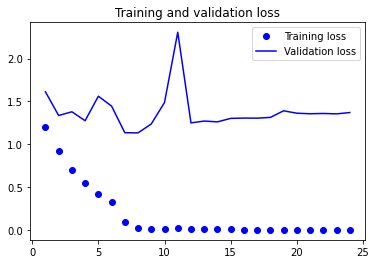

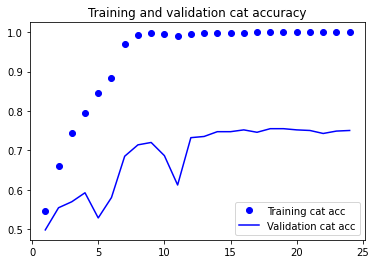

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[50  1  2  0  7  0]
 [ 4 47  4  1  4  0]
 [ 2  9 35  8  4  2]
 [ 0  3  2 55  0  0]
 [ 3  5  4  2 45  1]
 [ 8  3  4  0  5 40]]
              precision    recall  f1-score   support

         bcc       0.75      0.83      0.79        60
         bkl       0.69      0.78      0.73        60
         mel       0.69      0.58      0.63        60
          nv       0.83      0.92      0.87        60
      others       0.69      0.75      0.72        60
         scc       0.93      0.67      0.78        60

    accuracy                           0.76       360
   macro avg       0.76      0.76      0.75       360
weighted avg       0.76      0.76      0.75       360

Specificity of each class:
bcc : 0.943
bkl : 0.930
mel : 0.947
nv : 0.963
others : 0.933
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


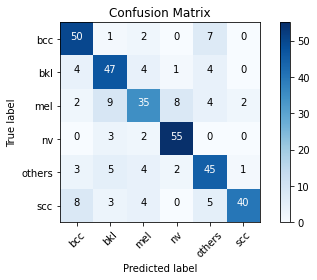

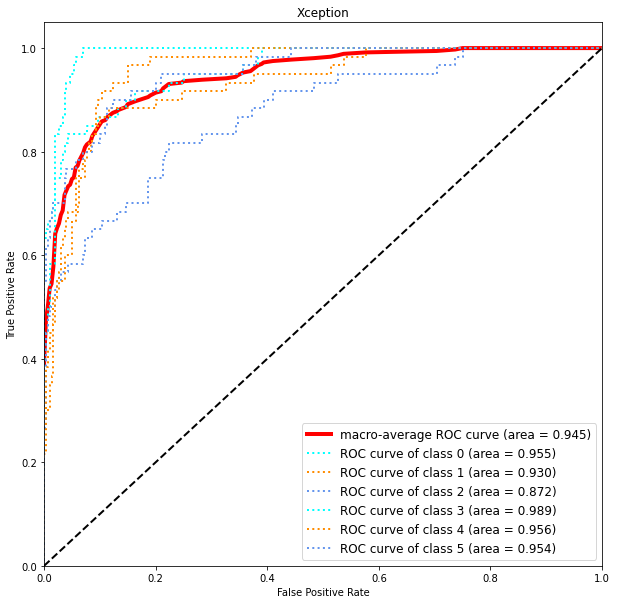

This is samplesize 1200 2
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.1990 - categorical_accuracy: 0.5339
Epoch 1: val_categorical_accuracy improved from -inf to 0.50837, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 98s 505ms/step - loss: 1.1990 - categorical_accuracy: 0.5339 - val_loss: 1.5856 - val_categorical_accuracy: 0.5084 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9065 - categorical_accuracy: 0.6589
Epoch 2: val_categorical_accuracy improved from 0.50837 to 0.53881, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 498ms/step - loss: 0.9065 - categorical_accuracy: 0.6589 - val_loss: 1.3160 - val_categorical_accuracy

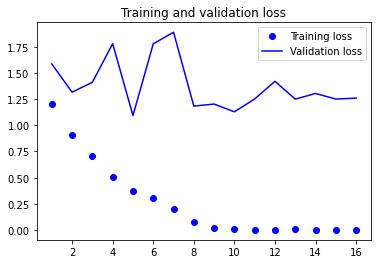

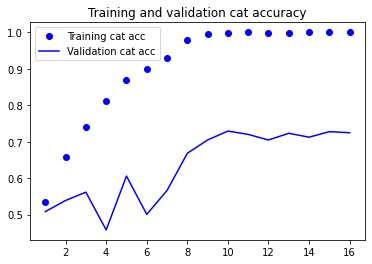

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[47  1  3  1  6  2]
 [ 3 44  5  3  5  0]
 [ 3  6 38 10  2  1]
 [ 1  1  6 52  0  0]
 [ 3  3  4  0 48  2]
 [ 8  1  4  1  5 41]]
              precision    recall  f1-score   support

         bcc       0.72      0.78      0.75        60
         bkl       0.79      0.73      0.76        60
         mel       0.63      0.63      0.63        60
          nv       0.78      0.87      0.82        60
      others       0.73      0.80      0.76        60
         scc       0.89      0.68      0.77        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.75       360
weighted avg       0.76      0.75      0.75       360

Specificity of each class:
bcc : 0.940
bkl : 0.960
mel : 0.927
nv : 0.950
others : 0.940
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


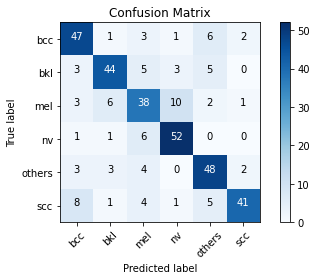

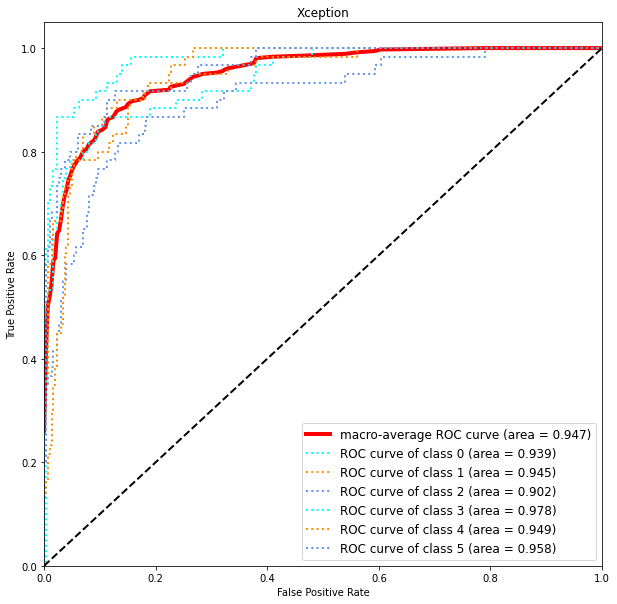

This is samplesize 1200 3
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2255 - categorical_accuracy: 0.5326
Epoch 1: val_categorical_accuracy improved from -inf to 0.43988, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 99s 510ms/step - loss: 1.2255 - categorical_accuracy: 0.5326 - val_loss: 1.5856 - val_categorical_accuracy: 0.4399 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9250 - categorical_accuracy: 0.6501
Epoch 2: val_categorical_accuracy improved from 0.43988 to 0.55099, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 93s 501ms/step - loss: 0.9250 - categorical_accuracy: 0.6501 - val_loss: 1.4308 - val_categorical_accuracy

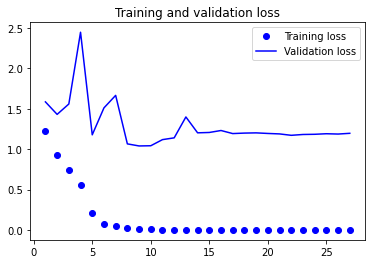

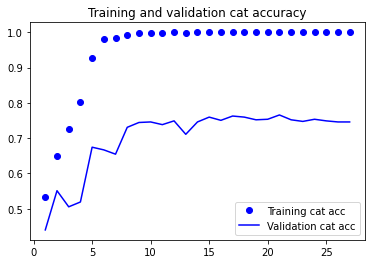

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[51  1  1  0  5  2]
 [ 3 44  3  2  8  0]
 [ 2  7 37  9  3  2]
 [ 1  1  3 54  1  0]
 [ 0  1  1  2 52  4]
 [ 6  2  2  1 10 39]]
              precision    recall  f1-score   support

         bcc       0.81      0.85      0.83        60
         bkl       0.79      0.73      0.76        60
         mel       0.79      0.62      0.69        60
          nv       0.79      0.90      0.84        60
      others       0.66      0.87      0.75        60
         scc       0.83      0.65      0.73        60

    accuracy                           0.77       360
   macro avg       0.78      0.77      0.77       360
weighted avg       0.78      0.77      0.77       360

Specificity of each class:
bcc : 0.960
bkl : 0.960
mel : 0.967
nv : 0.953
others : 0.910
scc : 0.973


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


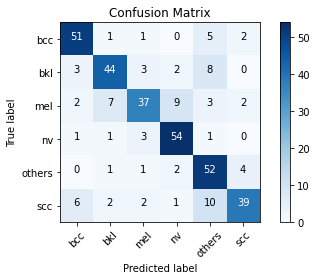

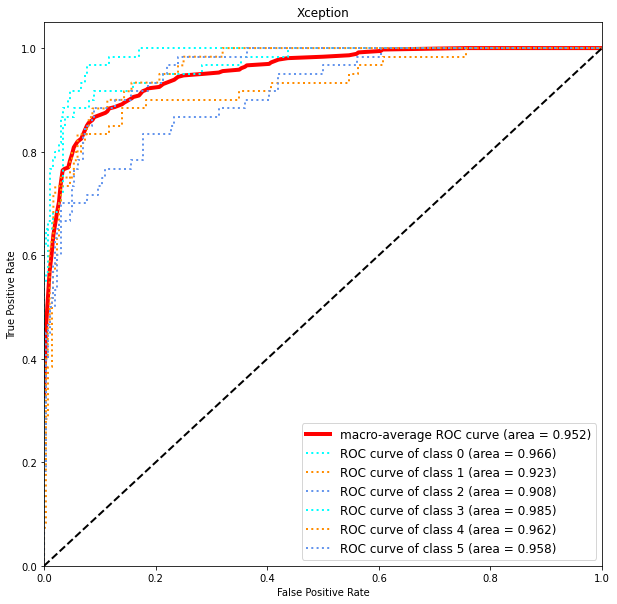

This is samplesize 1200 4
Found 5911 images belonging to 6 classes.
Found 657 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
185/185 [==============================] - ETA: 0s - loss: 1.2182 - categorical_accuracy: 0.5354
Epoch 1: val_categorical_accuracy improved from -inf to 0.50381, saving model to Model/Skin Lesion 299 Random resize 92%.h5
185/185 [==============================] - 100s 510ms/step - loss: 1.2182 - categorical_accuracy: 0.5354 - val_loss: 2.2513 - val_categorical_accuracy: 0.5038 - lr: 0.0010
Epoch 2/60
185/185 [==============================] - ETA: 0s - loss: 0.9211 - categorical_accuracy: 0.6529
Epoch 2: val_categorical_accuracy did not improve from 0.50381
185/185 [==============================] - 92s 496ms/step - loss: 0.9211 - categorical_accuracy: 0.6529 - val_loss: 2.1522 - val_categorical_accuracy: 0.4703 - lr: 0.0010
Epoch 3/60
185/185 [=====================

In [ ]:
train_model(1200)

In [ ]:
train_model(1200)

## 1600

100%|██████████| 360/360 [00:05<00:00, 65.61it/s]


This is samplesize 1600 1
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1731 - categorical_accuracy: 0.5399
Epoch 1: val_categorical_accuracy improved from -inf to 0.54534, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 136s 565ms/step - loss: 1.1731 - categorical_accuracy: 0.5399 - val_loss: 1.2988 - val_categorical_accuracy: 0.5453 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8894 - categorical_accuracy: 0.6590
Epoch 2: val_categorical_accuracy improved from 0.54534 to 0.59129, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 498ms/step - loss: 0.8894 - categorical_accuracy: 0.6590 - val_loss: 1.4638 - val_categorical_accura

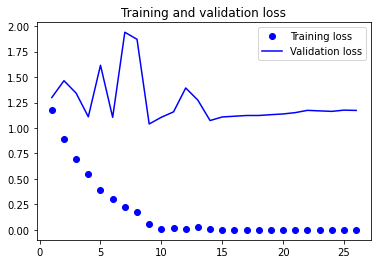

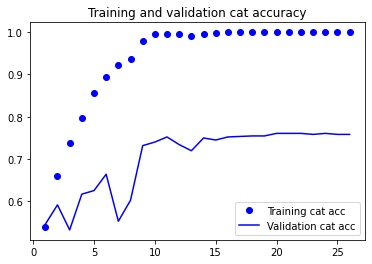

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[52  2  2  0  4  0]
 [ 2 46  4  1  7  0]
 [ 3 12 37  7  1  0]
 [ 0  2  3 55  0  0]
 [ 3  3  1  4 47  2]
 [11  3  3  1  7 35]]
              precision    recall  f1-score   support

         bcc       0.73      0.87      0.79        60
         bkl       0.68      0.77      0.72        60
         mel       0.74      0.62      0.67        60
          nv       0.81      0.92      0.86        60
      others       0.71      0.78      0.75        60
         scc       0.95      0.58      0.72        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.75       360
weighted avg       0.77      0.76      0.75       360

Specificity of each class:
bcc : 0.937
bkl : 0.927
mel : 0.957
nv : 0.957
others : 0.937
scc : 0.993


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


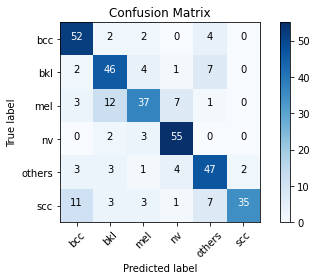

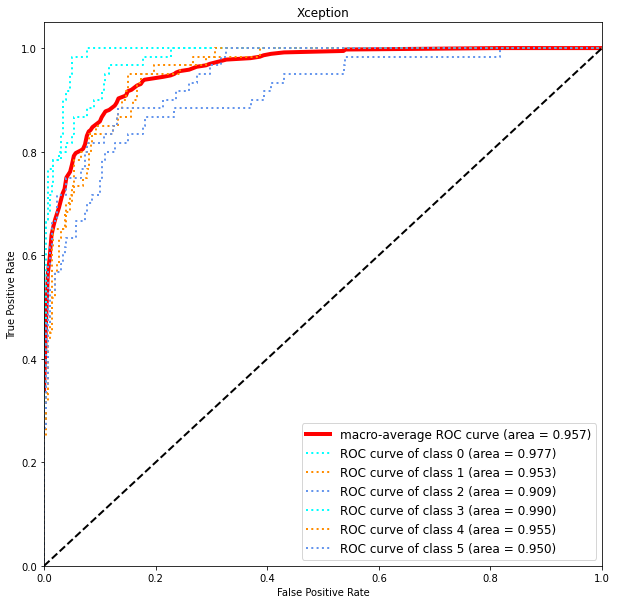

This is samplesize 1600 2
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1702 - categorical_accuracy: 0.5484
Epoch 1: val_categorical_accuracy improved from -inf to 0.55139, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 122s 503ms/step - loss: 1.1702 - categorical_accuracy: 0.5484 - val_loss: 1.2414 - val_categorical_accuracy: 0.5514 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8923 - categorical_accuracy: 0.6601
Epoch 2: val_categorical_accuracy did not improve from 0.55139
233/233 [==============================] - 115s 492ms/step - loss: 0.8923 - categorical_accuracy: 0.6601 - val_loss: 1.8463 - val_categorical_accuracy: 0.4704 - lr: 0.0010
Epoch 3/60
233/233 [====================

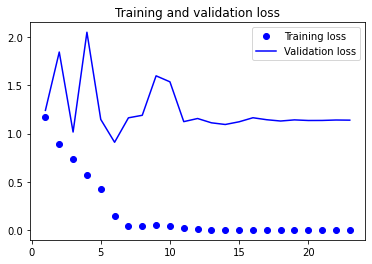

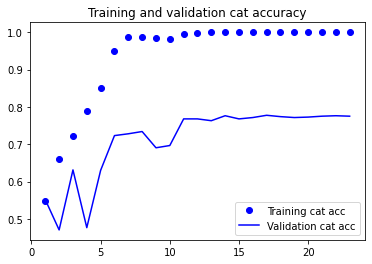

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[52  1  1  1  4  1]
 [ 3 46  1  3  7  0]
 [ 3 12 34  7  4  0]
 [ 0  4  0 56  0  0]
 [ 4  3  0  1 52  0]
 [ 8  4  3  0  8 37]]
              precision    recall  f1-score   support

         bcc       0.74      0.87      0.80        60
         bkl       0.66      0.77      0.71        60
         mel       0.87      0.57      0.69        60
          nv       0.82      0.93      0.87        60
      others       0.69      0.87      0.77        60
         scc       0.97      0.62      0.76        60

    accuracy                           0.77       360
   macro avg       0.79      0.77      0.77       360
weighted avg       0.79      0.77      0.77       360

Specificity of each class:
bcc : 0.940
bkl : 0.920
mel : 0.983
nv : 0.960
others : 0.923
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


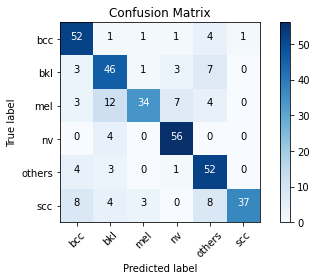

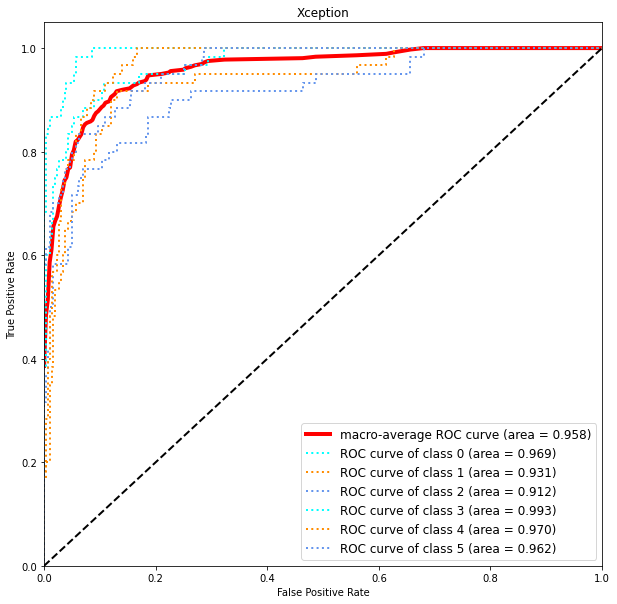

This is samplesize 1600 3
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1843 - categorical_accuracy: 0.5388
Epoch 1: val_categorical_accuracy improved from -inf to 0.50786, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 122s 504ms/step - loss: 1.1843 - categorical_accuracy: 0.5388 - val_loss: 1.3939 - val_categorical_accuracy: 0.5079 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9040 - categorical_accuracy: 0.6626
Epoch 2: val_categorical_accuracy improved from 0.50786 to 0.62152, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 117s 498ms/step - loss: 0.9040 - categorical_accuracy: 0.6626 - val_loss: 1.1252 - val_categorical_accura

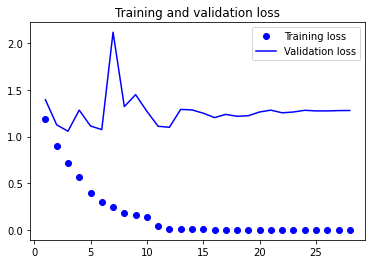

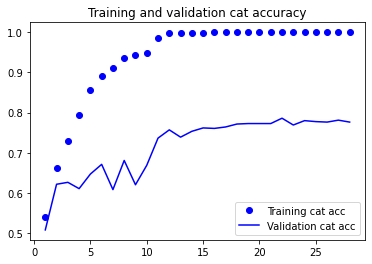

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 14ms/step
Confusion matrix, without normalization
[[48  3  4  0  4  1]
 [ 2 48  4  2  2  2]
 [ 4  8 40  6  2  0]
 [ 0  1  3 56  0  0]
 [ 3  6  4  2 41  4]
 [10  2  3  1  8 36]]
              precision    recall  f1-score   support

         bcc       0.72      0.80      0.76        60
         bkl       0.71      0.80      0.75        60
         mel       0.69      0.67      0.68        60
          nv       0.84      0.93      0.88        60
      others       0.72      0.68      0.70        60
         scc       0.84      0.60      0.70        60

    accuracy                           0.75       360
   macro avg       0.75      0.75      0.74       360
weighted avg       0.75      0.75      0.74       360

Specificity of each class:
bcc : 0.937
bkl : 0.933
mel : 0.940
nv : 0.963
others : 0.947
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


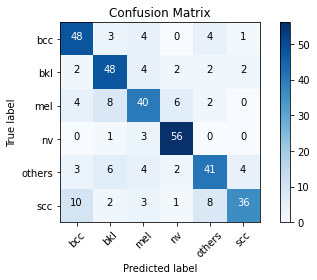

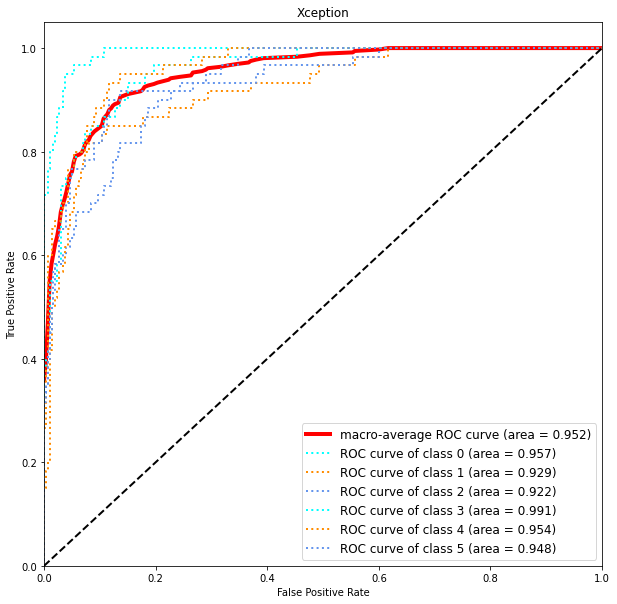

This is samplesize 1600 4
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1727 - categorical_accuracy: 0.5441
Epoch 1: val_categorical_accuracy improved from -inf to 0.53446, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 122s 504ms/step - loss: 1.1727 - categorical_accuracy: 0.5441 - val_loss: 1.5804 - val_categorical_accuracy: 0.5345 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9048 - categorical_accuracy: 0.6551
Epoch 2: val_categorical_accuracy did not improve from 0.53446
233/233 [==============================] - 115s 494ms/step - loss: 0.9048 - categorical_accuracy: 0.6551 - val_loss: 1.3952 - val_categorical_accuracy: 0.5030 - lr: 0.0010
Epoch 3/60
233/233 [====================

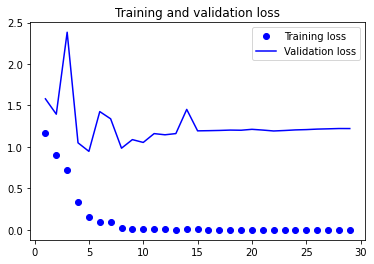

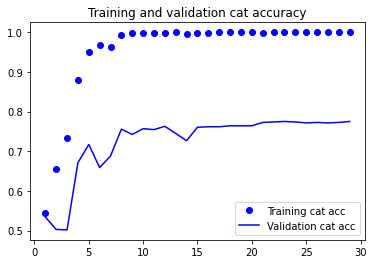

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  1  5  1  5  0]
 [ 4 49  2  0  5  0]
 [ 5  6 40  6  1  2]
 [ 0  4  3 53  0  0]
 [ 2  2  2  2 51  1]
 [10  4  4  1  7 34]]
              precision    recall  f1-score   support

         bcc       0.70      0.80      0.74        60
         bkl       0.74      0.82      0.78        60
         mel       0.71      0.67      0.69        60
          nv       0.84      0.88      0.86        60
      others       0.74      0.85      0.79        60
         scc       0.92      0.57      0.70        60

    accuracy                           0.76       360
   macro avg       0.78      0.76      0.76       360
weighted avg       0.78      0.76      0.76       360

Specificity of each class:
bcc : 0.930
bkl : 0.943
mel : 0.947
nv : 0.967
others : 0.940
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


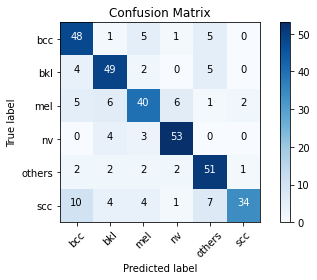

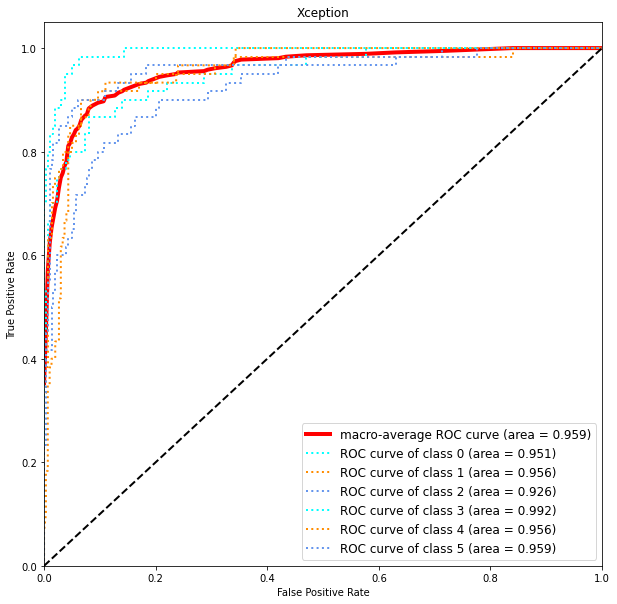

This is samplesize 1600 5
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1579 - categorical_accuracy: 0.5508
Epoch 1: val_categorical_accuracy improved from -inf to 0.48609, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1579 - categorical_accuracy: 0.5508 - val_loss: 1.9640 - val_categorical_accuracy: 0.4861 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8790 - categorical_accuracy: 0.6707
Epoch 2: val_categorical_accuracy improved from 0.48609 to 0.59129, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 496ms/step - loss: 0.8790 - categorical_accuracy: 0.6707 - val_loss: 1.2517 - val_categorical_accura

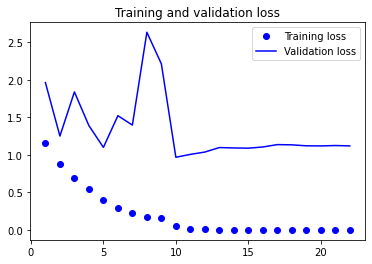

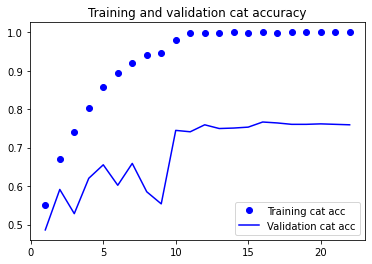

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[48  4  2  0  5  1]
 [ 3 46  7  1  3  0]
 [ 4  7 41  6  2  0]
 [ 0  3  3 54  0  0]
 [ 2  6  2  4 46  0]
 [10  2  5  1  8 34]]
              precision    recall  f1-score   support

         bcc       0.72      0.80      0.76        60
         bkl       0.68      0.77      0.72        60
         mel       0.68      0.68      0.68        60
          nv       0.82      0.90      0.86        60
      others       0.72      0.77      0.74        60
         scc       0.97      0.57      0.72        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.75       360
weighted avg       0.76      0.75      0.75       360

Specificity of each class:
bcc : 0.937
bkl : 0.927
mel : 0.937
nv : 0.960
others : 0.940
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


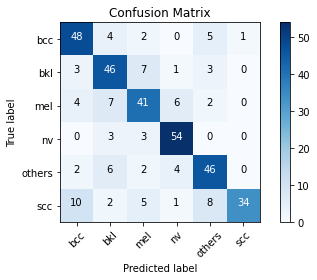

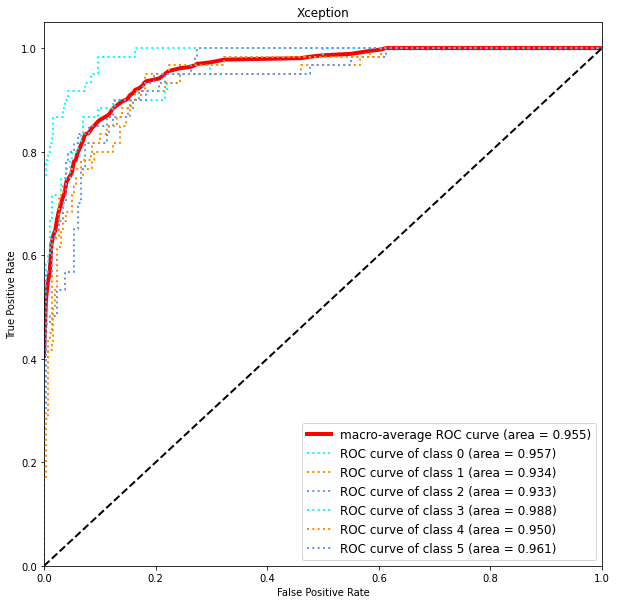

In [ ]:
train_model(1600)

100%|██████████| 360/360 [00:05<00:00, 63.65it/s]


This is samplesize 1600 1
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1815 - categorical_accuracy: 0.5403
Epoch 1: val_categorical_accuracy improved from -inf to 0.55865, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 132s 544ms/step - loss: 1.1815 - categorical_accuracy: 0.5403 - val_loss: 1.4476 - val_categorical_accuracy: 0.5586 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8944 - categorical_accuracy: 0.6546
Epoch 2: val_categorical_accuracy improved from 0.55865 to 0.60943, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 498ms/step - loss: 0.8944 - categorical_accuracy: 0.6546 - val_loss: 1.1477 - val_categorical_accura

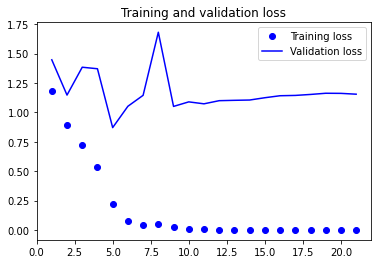

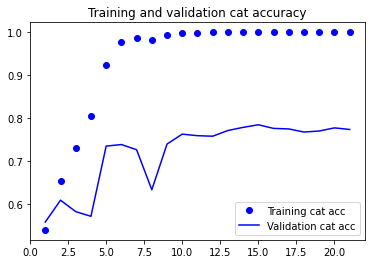

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[48  2  3  0  4  3]
 [ 3 46  3  3  4  1]
 [ 4  5 39  6  4  2]
 [ 0  1  4 55  0  0]
 [ 2  3  2  2 49  2]
 [ 4  5  6  1 10 34]]
              precision    recall  f1-score   support

         bcc       0.79      0.80      0.79        60
         bkl       0.74      0.77      0.75        60
         mel       0.68      0.65      0.67        60
          nv       0.82      0.92      0.87        60
      others       0.69      0.82      0.75        60
         scc       0.81      0.57      0.67        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.75       360
weighted avg       0.76      0.75      0.75       360

Specificity of each class:
bcc : 0.957
bkl : 0.947
mel : 0.940
nv : 0.960
others : 0.927
scc : 0.973


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


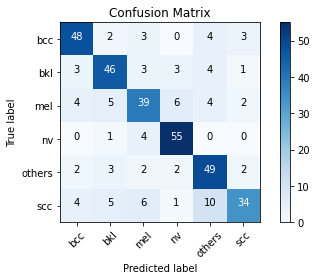

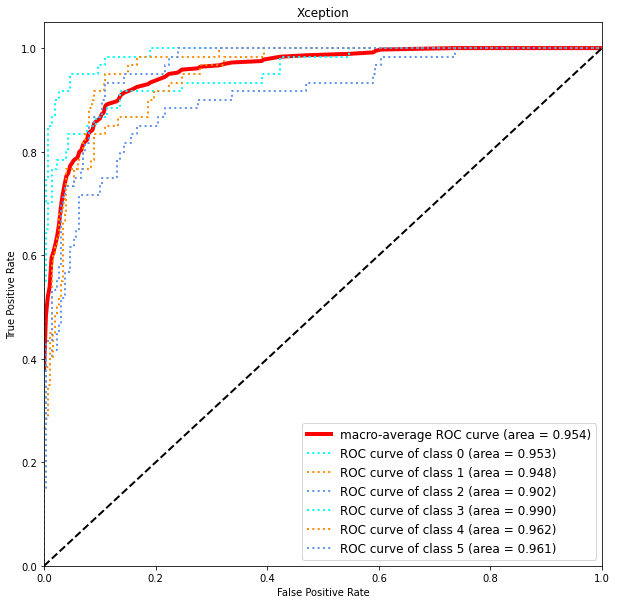

This is samplesize 1600 2
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1913 - categorical_accuracy: 0.5423
Epoch 1: val_categorical_accuracy improved from -inf to 0.46796, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 499ms/step - loss: 1.1913 - categorical_accuracy: 0.5423 - val_loss: 2.5457 - val_categorical_accuracy: 0.4680 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9159 - categorical_accuracy: 0.6546
Epoch 2: val_categorical_accuracy improved from 0.46796 to 0.59855, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 496ms/step - loss: 0.9159 - categorical_accuracy: 0.6546 - val_loss: 1.1335 - val_categorical_accura

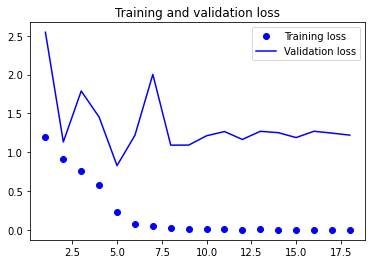

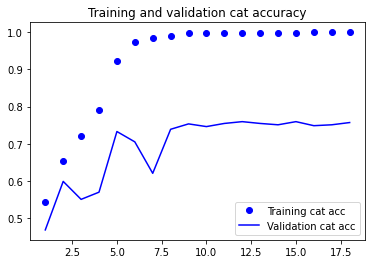

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[52  1  4  0  3  0]
 [ 5 44  9  0  2  0]
 [ 3  5 46  4  2  0]
 [ 1  1  8 49  1  0]
 [ 2  7  2  2 42  5]
 [ 7  6  9  0  5 33]]
              precision    recall  f1-score   support

         bcc       0.74      0.87      0.80        60
         bkl       0.69      0.73      0.71        60
         mel       0.59      0.77      0.67        60
          nv       0.89      0.82      0.85        60
      others       0.76      0.70      0.73        60
         scc       0.87      0.55      0.67        60

    accuracy                           0.74       360
   macro avg       0.76      0.74      0.74       360
weighted avg       0.76      0.74      0.74       360

Specificity of each class:
bcc : 0.940
bkl : 0.933
mel : 0.893
nv : 0.980
others : 0.957
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


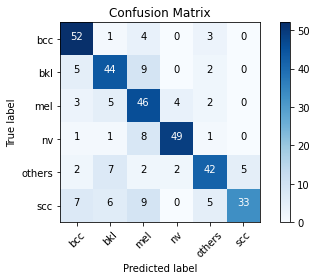

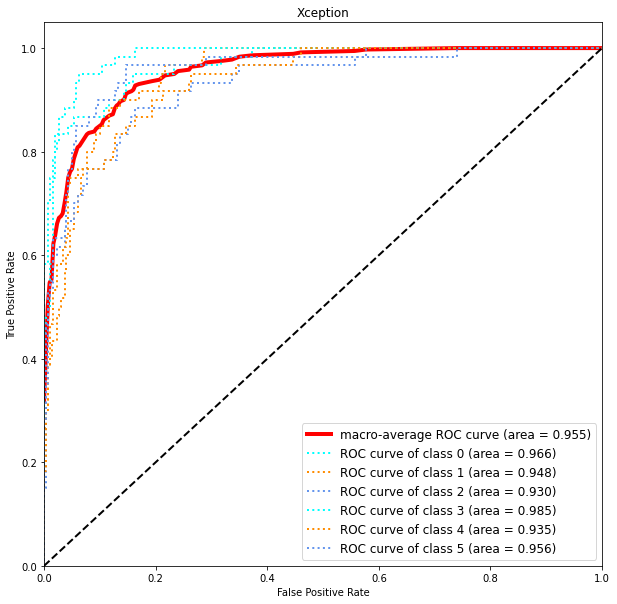

This is samplesize 1600 3
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1748 - categorical_accuracy: 0.5340
Epoch 1: val_categorical_accuracy improved from -inf to 0.43168, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1748 - categorical_accuracy: 0.5340 - val_loss: 1.8164 - val_categorical_accuracy: 0.4317 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8860 - categorical_accuracy: 0.6622
Epoch 2: val_categorical_accuracy improved from 0.43168 to 0.52842, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 495ms/step - loss: 0.8860 - categorical_accuracy: 0.6622 - val_loss: 1.7095 - val_categorical_accura

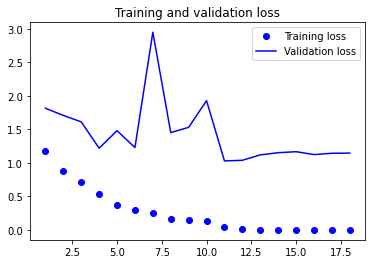

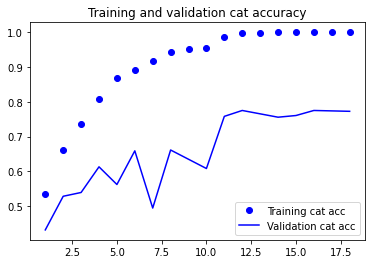

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[51  2  1  0  4  2]
 [ 4 42  4  3  6  1]
 [ 4 11 40  3  1  1]
 [ 0  2  4 53  1  0]
 [10  4  3  2 38  3]
 [11  5  4  0  4 36]]
              precision    recall  f1-score   support

         bcc       0.64      0.85      0.73        60
         bkl       0.64      0.70      0.67        60
         mel       0.71      0.67      0.69        60
          nv       0.87      0.88      0.88        60
      others       0.70      0.63      0.67        60
         scc       0.84      0.60      0.70        60

    accuracy                           0.72       360
   macro avg       0.73      0.72      0.72       360
weighted avg       0.73      0.72      0.72       360

Specificity of each class:
bcc : 0.903
bkl : 0.920
mel : 0.947
nv : 0.973
others : 0.947
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


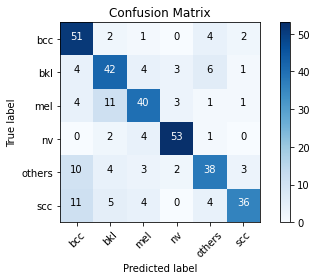

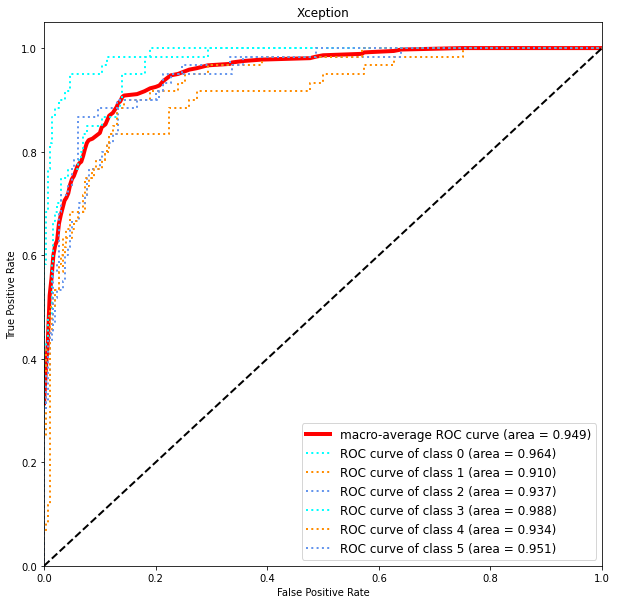

This is samplesize 1600 4
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1657 - categorical_accuracy: 0.5590
Epoch 1: val_categorical_accuracy improved from -inf to 0.59129, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 502ms/step - loss: 1.1657 - categorical_accuracy: 0.5590 - val_loss: 1.2983 - val_categorical_accuracy: 0.5913 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8838 - categorical_accuracy: 0.6703
Epoch 2: val_categorical_accuracy did not improve from 0.59129
233/233 [==============================] - 115s 492ms/step - loss: 0.8838 - categorical_accuracy: 0.6703 - val_loss: 1.4333 - val_categorical_accuracy: 0.5441 - lr: 0.0010
Epoch 3/60
233/233 [====================

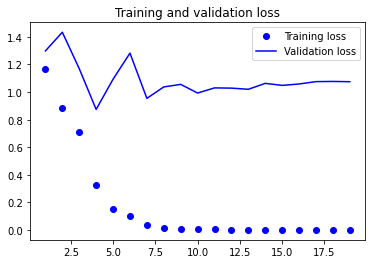

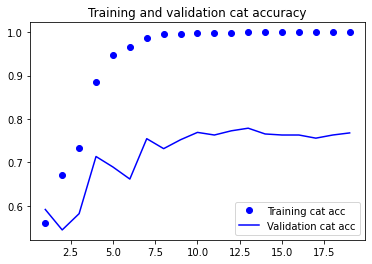

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 6s 13ms/step
Confusion matrix, without normalization
[[51  3  1  0  4  1]
 [ 2 47  6  0  4  1]
 [ 2  9 43  4  2  0]
 [ 0  1  2 57  0  0]
 [ 1  3  4  2 48  2]
 [10  3  5  1  9 32]]
              precision    recall  f1-score   support

         bcc       0.77      0.85      0.81        60
         bkl       0.71      0.78      0.75        60
         mel       0.70      0.72      0.71        60
          nv       0.89      0.95      0.92        60
      others       0.72      0.80      0.76        60
         scc       0.89      0.53      0.67        60

    accuracy                           0.77       360
   macro avg       0.78      0.77      0.77       360
weighted avg       0.78      0.77      0.77       360

Specificity of each class:
bcc : 0.950
bkl : 0.937
mel : 0.940
nv : 0.977
others : 0.937
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


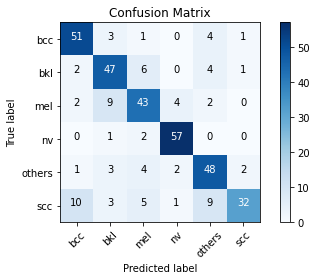

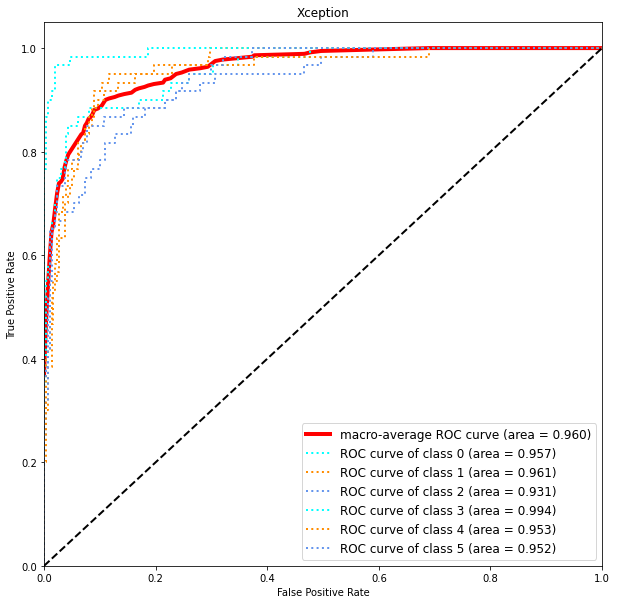

This is samplesize 1600 5
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1586 - categorical_accuracy: 0.5512
Epoch 1: val_categorical_accuracy improved from -inf to 0.49940, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 501ms/step - loss: 1.1586 - categorical_accuracy: 0.5512 - val_loss: 2.6022 - val_categorical_accuracy: 0.4994 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9059 - categorical_accuracy: 0.6603
Epoch 2: val_categorical_accuracy improved from 0.49940 to 0.58888, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 494ms/step - loss: 0.9059 - categorical_accuracy: 0.6603 - val_loss: 1.3777 - val_categorical_accura

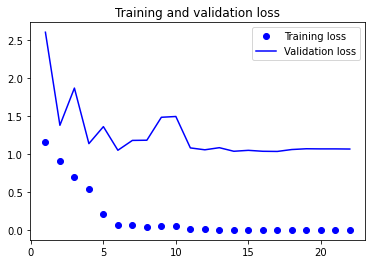

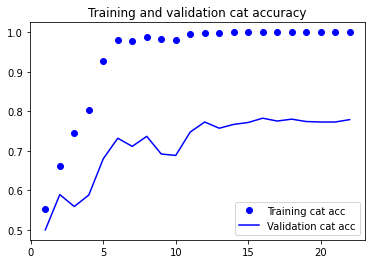

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[52  1  1  1  2  3]
 [ 3 47  3  1  6  0]
 [ 3 10 34  7  5  1]
 [ 0  4  3 53  0  0]
 [ 2  6  0  2 48  2]
 [ 9  9  4  1  8 29]]
              precision    recall  f1-score   support

         bcc       0.75      0.87      0.81        60
         bkl       0.61      0.78      0.69        60
         mel       0.76      0.57      0.65        60
          nv       0.82      0.88      0.85        60
      others       0.70      0.80      0.74        60
         scc       0.83      0.48      0.61        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.72       360
weighted avg       0.74      0.73      0.72       360

Specificity of each class:
bcc : 0.943
bkl : 0.900
mel : 0.963
nv : 0.960
others : 0.930
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


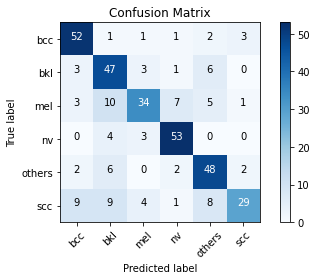

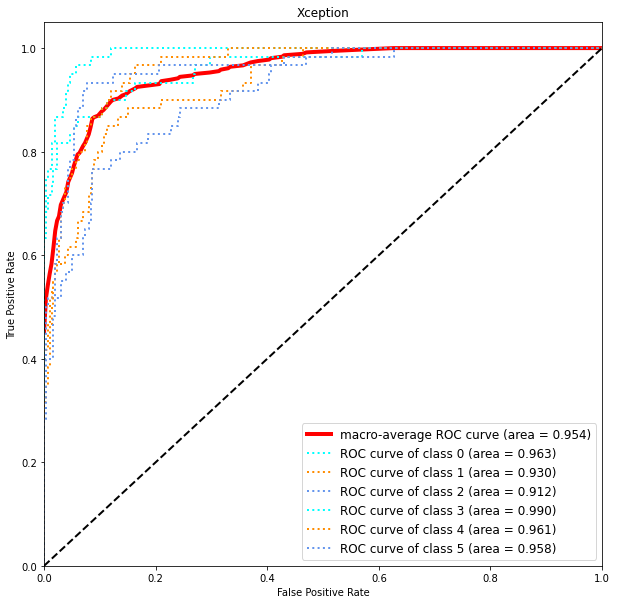

In [ ]:
train_model(1600)

100%|██████████| 360/360 [00:06<00:00, 54.97it/s]


This is samplesize 1600 1
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1658 - categorical_accuracy: 0.5526
Epoch 1: val_categorical_accuracy improved from -inf to 0.49456, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 134s 554ms/step - loss: 1.1658 - categorical_accuracy: 0.5526 - val_loss: 1.3506 - val_categorical_accuracy: 0.4946 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8970 - categorical_accuracy: 0.6602
Epoch 2: val_categorical_accuracy did not improve from 0.49456
233/233 [==============================] - 116s 497ms/step - loss: 0.8970 - categorical_accuracy: 0.6602 - val_loss: 1.5978 - val_categorical_accuracy: 0.4885 - lr: 0.0010
Epoch 3/60
233/233 [====================

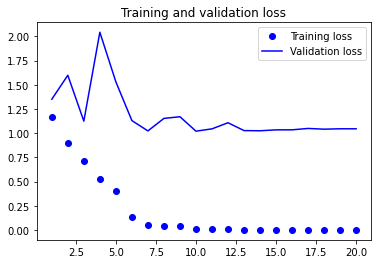

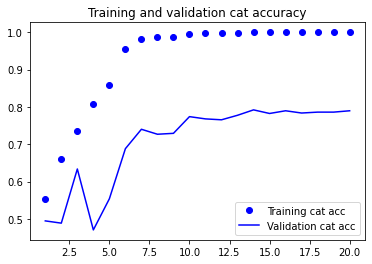

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[52  1  1  0  3  3]
 [ 4 43  3  2  8  0]
 [ 3  5 40  6  5  1]
 [ 1  2  2 55  0  0]
 [ 1  4  1  1 50  3]
 [ 9  1 10  0  5 35]]
              precision    recall  f1-score   support

         bcc       0.74      0.87      0.80        60
         bkl       0.77      0.72      0.74        60
         mel       0.70      0.67      0.68        60
          nv       0.86      0.92      0.89        60
      others       0.70      0.83      0.76        60
         scc       0.83      0.58      0.69        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.76       360
weighted avg       0.77      0.76      0.76       360

Specificity of each class:
bcc : 0.940
bkl : 0.957
mel : 0.943
nv : 0.970
others : 0.930
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


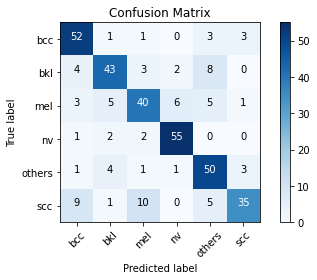

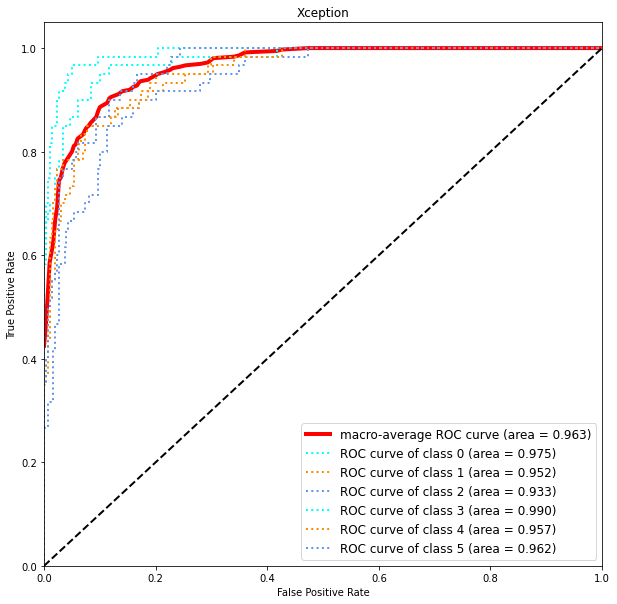

This is samplesize 1600 2
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1525 - categorical_accuracy: 0.5603
Epoch 1: val_categorical_accuracy improved from -inf to 0.53809, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1525 - categorical_accuracy: 0.5603 - val_loss: 1.3293 - val_categorical_accuracy: 0.5381 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8759 - categorical_accuracy: 0.6706
Epoch 2: val_categorical_accuracy improved from 0.53809 to 0.54051, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 497ms/step - loss: 0.8759 - categorical_accuracy: 0.6706 - val_loss: 1.4954 - val_categorical_accura

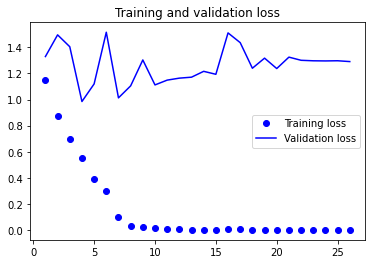

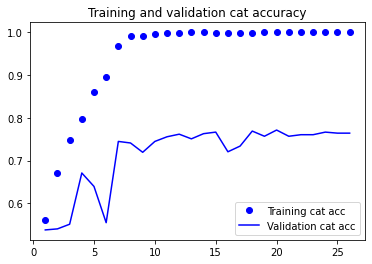

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[50  2  3  0  3  2]
 [ 2 48  3  1  5  1]
 [ 3  9 40  5  2  1]
 [ 0  1  4 54  1  0]
 [ 3  6  2  1 47  1]
 [ 7  5  6  1  5 36]]
              precision    recall  f1-score   support

         bcc       0.77      0.83      0.80        60
         bkl       0.68      0.80      0.73        60
         mel       0.69      0.67      0.68        60
          nv       0.87      0.90      0.89        60
      others       0.75      0.78      0.76        60
         scc       0.88      0.60      0.71        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.76       360
weighted avg       0.77      0.76      0.76       360

Specificity of each class:
bcc : 0.950
bkl : 0.923
mel : 0.940
nv : 0.973
others : 0.947
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


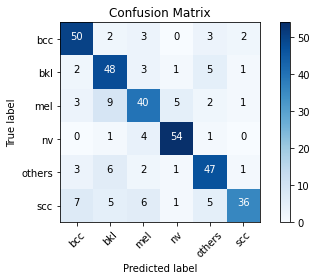

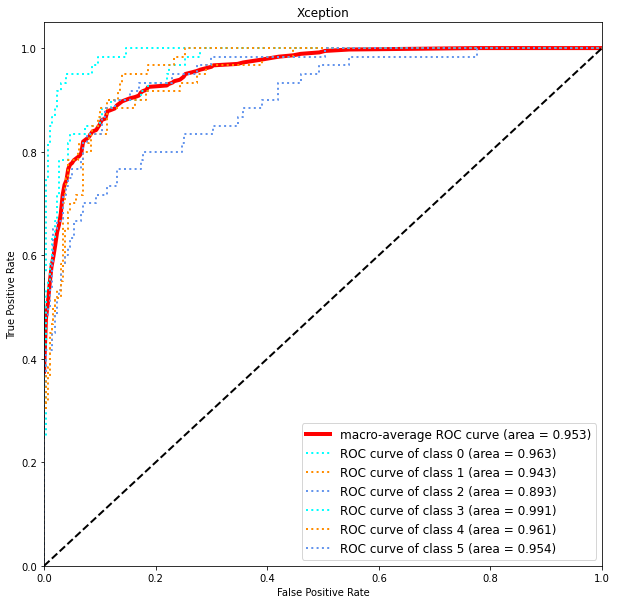

This is samplesize 1600 3
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1691 - categorical_accuracy: 0.5526
Epoch 1: val_categorical_accuracy improved from -inf to 0.43047, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 499ms/step - loss: 1.1691 - categorical_accuracy: 0.5526 - val_loss: 1.7359 - val_categorical_accuracy: 0.4305 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9041 - categorical_accuracy: 0.6565
Epoch 2: val_categorical_accuracy improved from 0.43047 to 0.57437, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 495ms/step - loss: 0.9041 - categorical_accuracy: 0.6565 - val_loss: 1.6155 - val_categorical_accura

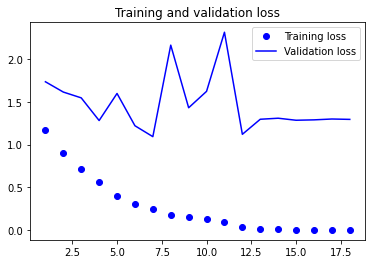

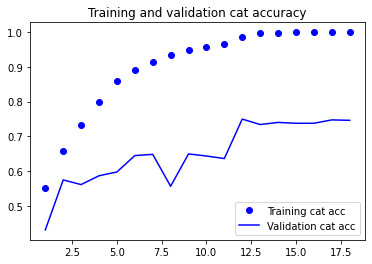

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  3  3  1  4  1]
 [ 5 41  8  0  6  0]
 [ 2  6 40  7  5  0]
 [ 0  0  8 52  0  0]
 [ 3  3  1  1 52  0]
 [ 6  3  5  0  7 39]]
              precision    recall  f1-score   support

         bcc       0.75      0.80      0.77        60
         bkl       0.73      0.68      0.71        60
         mel       0.62      0.67      0.64        60
          nv       0.85      0.87      0.86        60
      others       0.70      0.87      0.78        60
         scc       0.97      0.65      0.78        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.76       360
weighted avg       0.77      0.76      0.76       360

Specificity of each class:
bcc : 0.947
bkl : 0.950
mel : 0.917
nv : 0.970
others : 0.927
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


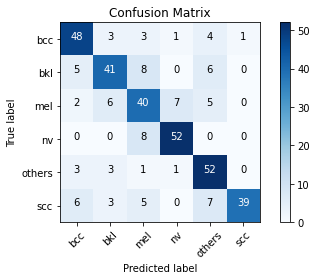

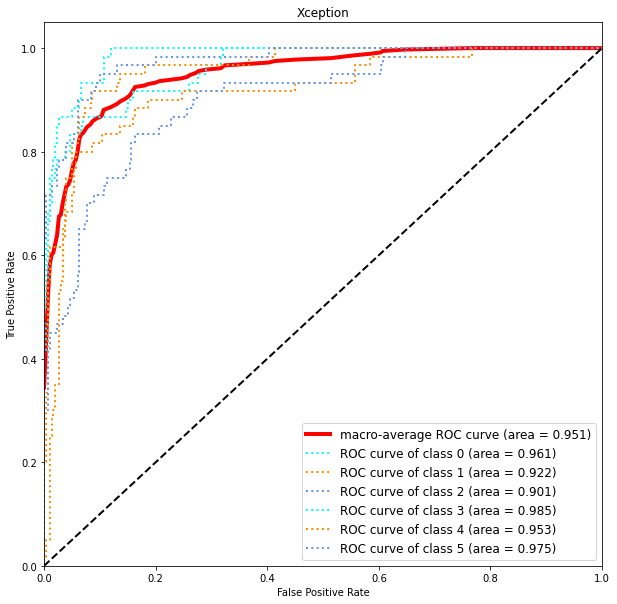

This is samplesize 1600 4
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1772 - categorical_accuracy: 0.5469
Epoch 1: val_categorical_accuracy improved from -inf to 0.42684, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 122s 505ms/step - loss: 1.1772 - categorical_accuracy: 0.5469 - val_loss: 1.4289 - val_categorical_accuracy: 0.4268 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8895 - categorical_accuracy: 0.6617
Epoch 2: val_categorical_accuracy improved from 0.42684 to 0.50181, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 117s 499ms/step - loss: 0.8895 - categorical_accuracy: 0.6617 - val_loss: 1.5899 - val_categorical_accura

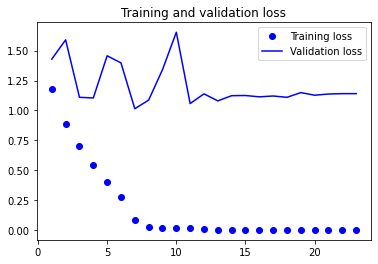

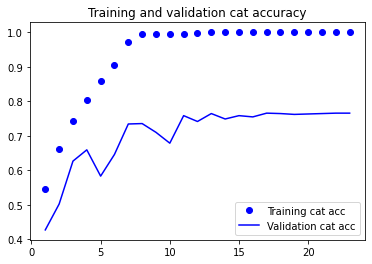

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[47  1  7  0  4  1]
 [ 3 47  4  1  5  0]
 [ 1 11 42  5  1  0]
 [ 1  1  5 52  1  0]
 [ 2  7  2  0 47  2]
 [11  1  5  0  8 35]]
              precision    recall  f1-score   support

         bcc       0.72      0.78      0.75        60
         bkl       0.69      0.78      0.73        60
         mel       0.65      0.70      0.67        60
          nv       0.90      0.87      0.88        60
      others       0.71      0.78      0.75        60
         scc       0.92      0.58      0.71        60

    accuracy                           0.75       360
   macro avg       0.77      0.75      0.75       360
weighted avg       0.77      0.75      0.75       360

Specificity of each class:
bcc : 0.940
bkl : 0.930
mel : 0.923
nv : 0.980
others : 0.937
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


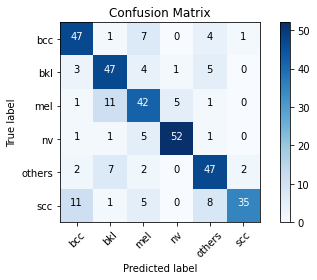

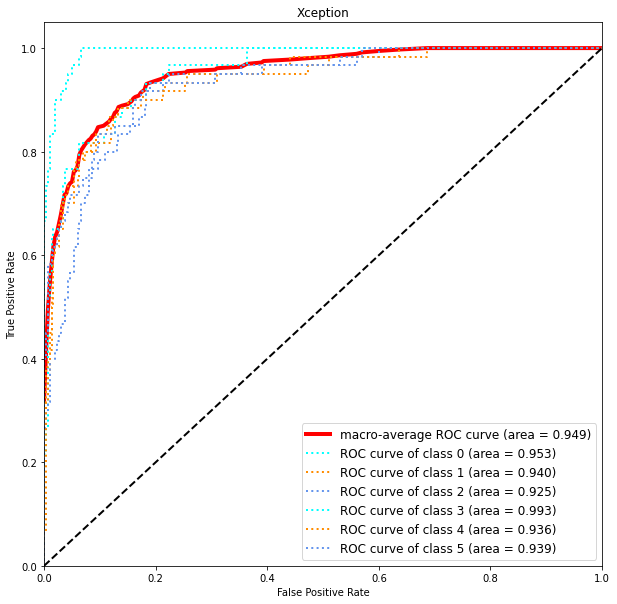

This is samplesize 1600 5
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1822 - categorical_accuracy: 0.5444
Epoch 1: val_categorical_accuracy improved from -inf to 0.49456, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1822 - categorical_accuracy: 0.5444 - val_loss: 1.9430 - val_categorical_accuracy: 0.4946 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8991 - categorical_accuracy: 0.6548
Epoch 2: val_categorical_accuracy improved from 0.49456 to 0.52963, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 495ms/step - loss: 0.8991 - categorical_accuracy: 0.6548 - val_loss: 1.4579 - val_categorical_accura

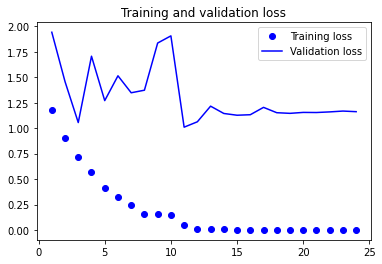

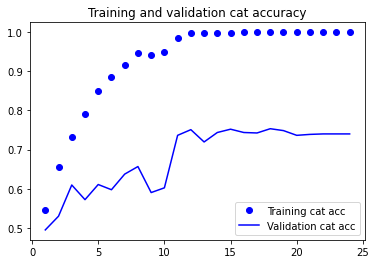

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[53  1  3  0  3  0]
 [ 3 52  2  0  3  0]
 [ 2 13 36  6  2  1]
 [ 0  3  3 54  0  0]
 [ 3  5  3  1 44  4]
 [ 8  3  5  1 11 32]]
              precision    recall  f1-score   support

         bcc       0.77      0.88      0.82        60
         bkl       0.68      0.87      0.76        60
         mel       0.69      0.60      0.64        60
          nv       0.87      0.90      0.89        60
      others       0.70      0.73      0.72        60
         scc       0.86      0.53      0.66        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.75       360
weighted avg       0.76      0.75      0.75       360

Specificity of each class:
bcc : 0.947
bkl : 0.917
mel : 0.947
nv : 0.973
others : 0.937
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


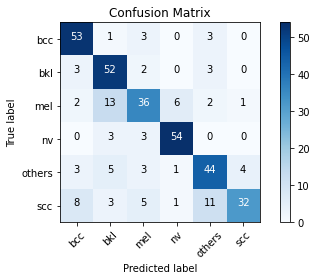

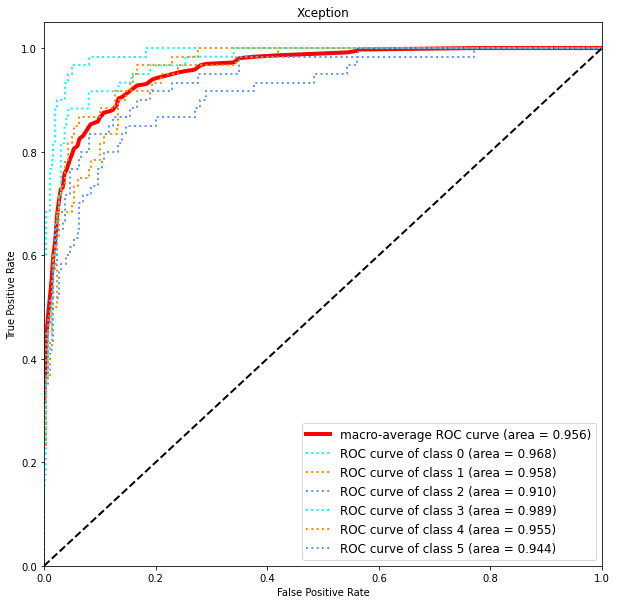

In [ ]:
train_model(1600)

100%|██████████| 360/360 [00:06<00:00, 53.24it/s]


This is samplesize 1600 1
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1740 - categorical_accuracy: 0.5465
Epoch 1: val_categorical_accuracy improved from -inf to 0.46070, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 132s 547ms/step - loss: 1.1740 - categorical_accuracy: 0.5465 - val_loss: 1.5129 - val_categorical_accuracy: 0.4607 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9025 - categorical_accuracy: 0.6644
Epoch 2: val_categorical_accuracy improved from 0.46070 to 0.53688, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 115s 494ms/step - loss: 0.9025 - categorical_accuracy: 0.6644 - val_loss: 1.3302 - val_categorical_accura

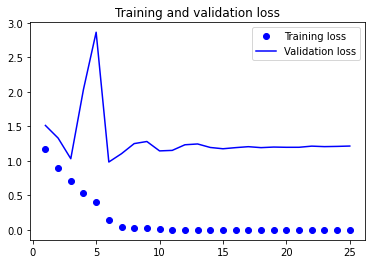

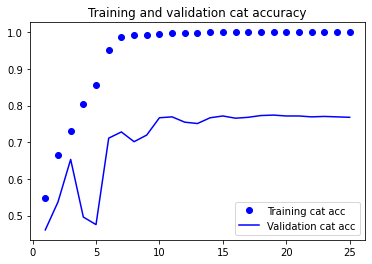

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[49  2  2  0  6  1]
 [ 3 49  2  2  3  1]
 [ 5 10 40  3  1  1]
 [ 1  6  2 51  0  0]
 [ 1  4  0  1 53  1]
 [ 9  2  5  0  8 36]]
              precision    recall  f1-score   support

         bcc       0.72      0.82      0.77        60
         bkl       0.67      0.82      0.74        60
         mel       0.78      0.67      0.72        60
          nv       0.89      0.85      0.87        60
      others       0.75      0.88      0.81        60
         scc       0.90      0.60      0.72        60

    accuracy                           0.77       360
   macro avg       0.79      0.77      0.77       360
weighted avg       0.79      0.77      0.77       360

Specificity of each class:
bcc : 0.937
bkl : 0.920
mel : 0.963
nv : 0.980
others : 0.940
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


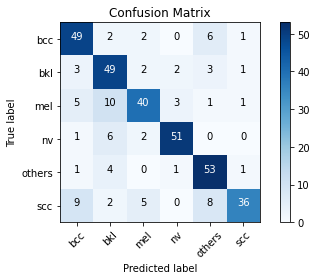

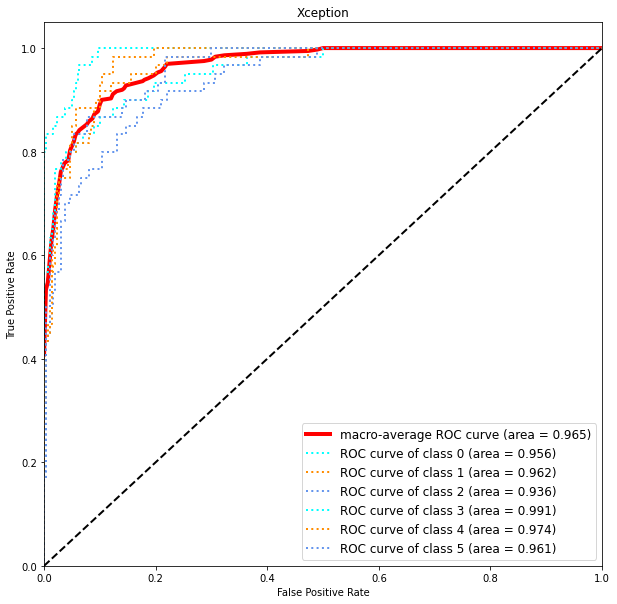

This is samplesize 1600 2
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1470 - categorical_accuracy: 0.5575
Epoch 1: val_categorical_accuracy improved from -inf to 0.46554, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 501ms/step - loss: 1.1470 - categorical_accuracy: 0.5575 - val_loss: 2.3300 - val_categorical_accuracy: 0.4655 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8850 - categorical_accuracy: 0.6640
Epoch 2: val_categorical_accuracy improved from 0.46554 to 0.59734, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 494ms/step - loss: 0.8850 - categorical_accuracy: 0.6640 - val_loss: 1.1309 - val_categorical_accura

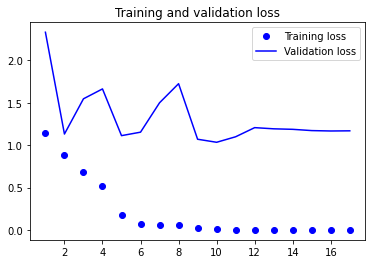

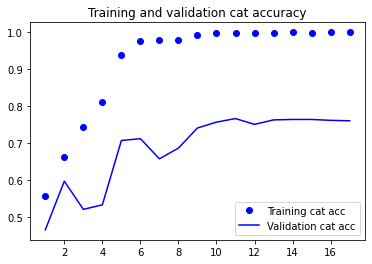

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[49  3  1  0  5  2]
 [ 2 47  2  1  5  3]
 [ 5  3 42  4  3  3]
 [ 0  1  3 53  2  1]
 [ 3  3  0  1 51  2]
 [ 8  0  5  0  9 38]]
              precision    recall  f1-score   support

         bcc       0.73      0.82      0.77        60
         bkl       0.82      0.78      0.80        60
         mel       0.79      0.70      0.74        60
          nv       0.90      0.88      0.89        60
      others       0.68      0.85      0.76        60
         scc       0.78      0.63      0.70        60

    accuracy                           0.78       360
   macro avg       0.78      0.78      0.78       360
weighted avg       0.78      0.78      0.78       360

Specificity of each class:
bcc : 0.940
bkl : 0.967
mel : 0.963
nv : 0.980
others : 0.920
scc : 0.963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


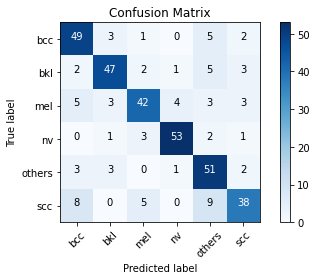

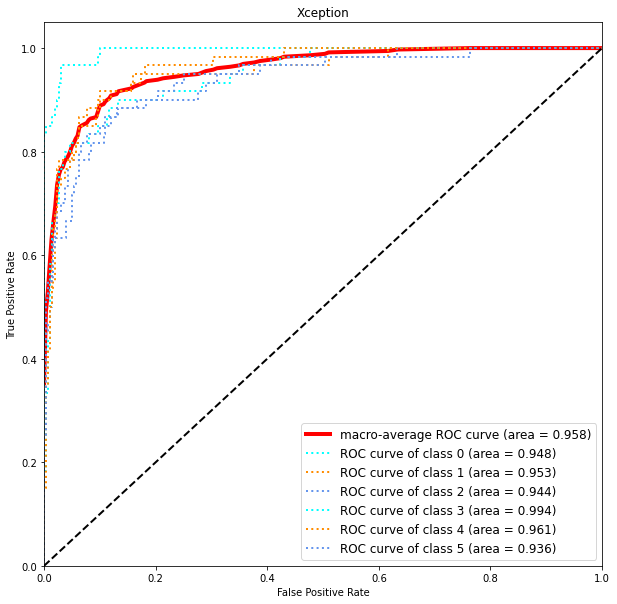

This is samplesize 1600 3
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1959 - categorical_accuracy: 0.5375
Epoch 1: val_categorical_accuracy improved from -inf to 0.54293, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 501ms/step - loss: 1.1959 - categorical_accuracy: 0.5375 - val_loss: 1.6897 - val_categorical_accuracy: 0.5429 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9187 - categorical_accuracy: 0.6441
Epoch 2: val_categorical_accuracy did not improve from 0.54293
233/233 [==============================] - 115s 492ms/step - loss: 0.9187 - categorical_accuracy: 0.6441 - val_loss: 1.5630 - val_categorical_accuracy: 0.5417 - lr: 0.0010
Epoch 3/60
233/233 [====================

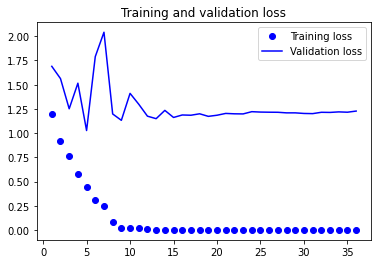

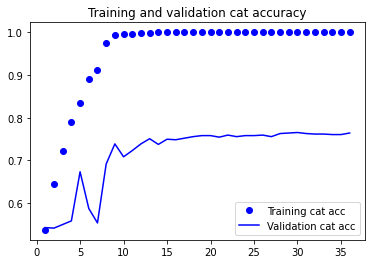

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[48  2  2  0  7  1]
 [ 4 44  3  0  8  1]
 [ 4  8 40  5  3  0]
 [ 1  2  7 50  0  0]
 [ 1  3  1  2 52  1]
 [10  2  4  0 11 33]]
              precision    recall  f1-score   support

         bcc       0.71      0.80      0.75        60
         bkl       0.72      0.73      0.73        60
         mel       0.70      0.67      0.68        60
          nv       0.88      0.83      0.85        60
      others       0.64      0.87      0.74        60
         scc       0.92      0.55      0.69        60

    accuracy                           0.74       360
   macro avg       0.76      0.74      0.74       360
weighted avg       0.76      0.74      0.74       360

Specificity of each class:
bcc : 0.933
bkl : 0.943
mel : 0.943
nv : 0.977
others : 0.903
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


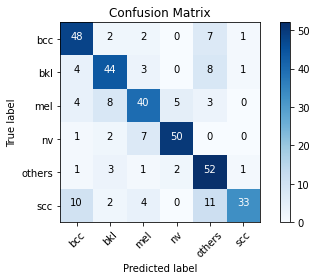

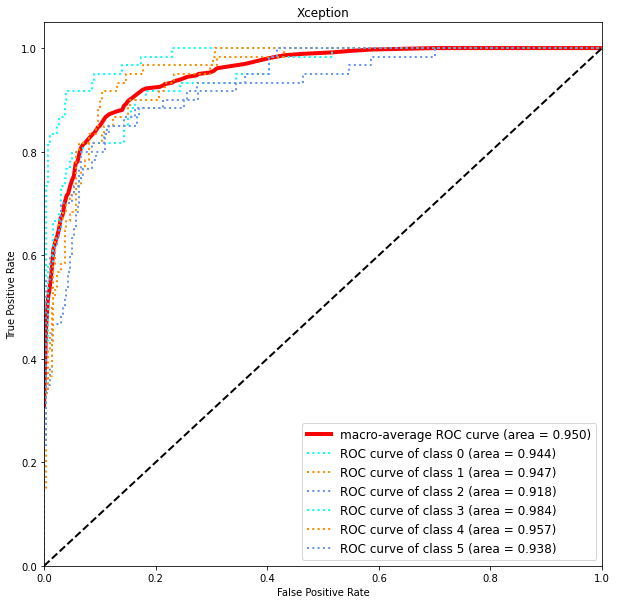

This is samplesize 1600 4
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1468 - categorical_accuracy: 0.5625
Epoch 1: val_categorical_accuracy improved from -inf to 0.49456, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 120s 498ms/step - loss: 1.1468 - categorical_accuracy: 0.5625 - val_loss: 1.9781 - val_categorical_accuracy: 0.4946 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8870 - categorical_accuracy: 0.6706
Epoch 2: val_categorical_accuracy did not improve from 0.49456
233/233 [==============================] - 115s 491ms/step - loss: 0.8870 - categorical_accuracy: 0.6706 - val_loss: 1.4606 - val_categorical_accuracy: 0.4764 - lr: 0.0010
Epoch 3/60
233/233 [====================

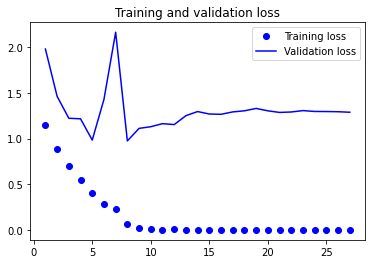

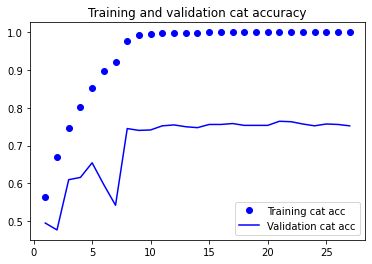

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[53  2  2  0  3  0]
 [ 3 44  5  2  6  0]
 [ 2  6 41  8  3  0]
 [ 0  4  2 53  1  0]
 [ 3  5  1  4 44  3]
 [ 5  6  6  0  6 37]]
              precision    recall  f1-score   support

         bcc       0.80      0.88      0.84        60
         bkl       0.66      0.73      0.69        60
         mel       0.72      0.68      0.70        60
          nv       0.79      0.88      0.83        60
      others       0.70      0.73      0.72        60
         scc       0.93      0.62      0.74        60

    accuracy                           0.76       360
   macro avg       0.77      0.76      0.75       360
weighted avg       0.77      0.76      0.75       360

Specificity of each class:
bcc : 0.957
bkl : 0.923
mel : 0.947
nv : 0.953
others : 0.937
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


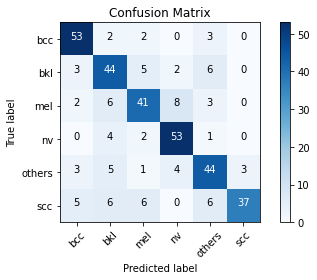

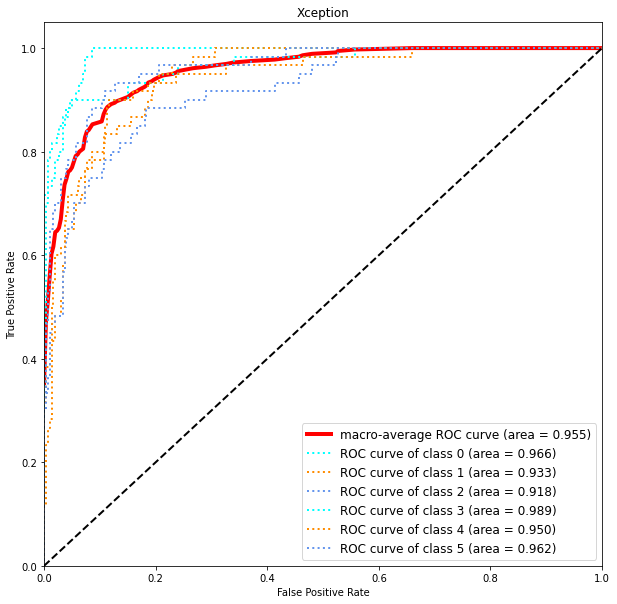

This is samplesize 1600 5
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1748 - categorical_accuracy: 0.5484
Epoch 1: val_categorical_accuracy improved from -inf to 0.52963, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 499ms/step - loss: 1.1748 - categorical_accuracy: 0.5484 - val_loss: 1.2668 - val_categorical_accuracy: 0.5296 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9148 - categorical_accuracy: 0.6532
Epoch 2: val_categorical_accuracy improved from 0.52963 to 0.58283, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 495ms/step - loss: 0.9148 - categorical_accuracy: 0.6532 - val_loss: 1.1648 - val_categorical_accura

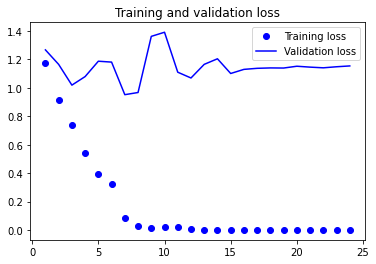

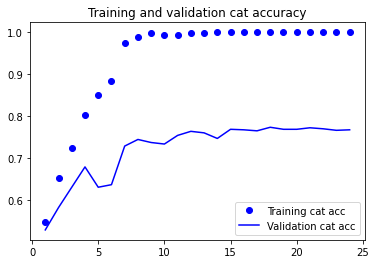

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[50  3  3  0  2  2]
 [ 2 46  6  1  5  0]
 [ 1  9 38  8  4  0]
 [ 0  1  3 55  1  0]
 [ 2  3  5  1 47  2]
 [12  2  4  1  7 34]]
              precision    recall  f1-score   support

         bcc       0.75      0.83      0.79        60
         bkl       0.72      0.77      0.74        60
         mel       0.64      0.63      0.64        60
          nv       0.83      0.92      0.87        60
      others       0.71      0.78      0.75        60
         scc       0.89      0.57      0.69        60

    accuracy                           0.75       360
   macro avg       0.76      0.75      0.75       360
weighted avg       0.76      0.75      0.75       360

Specificity of each class:
bcc : 0.943
bkl : 0.940
mel : 0.930
nv : 0.963
others : 0.937
scc : 0.987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


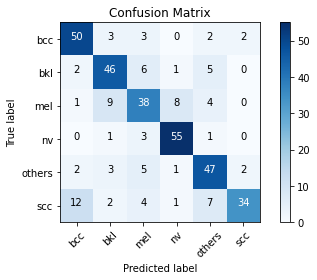

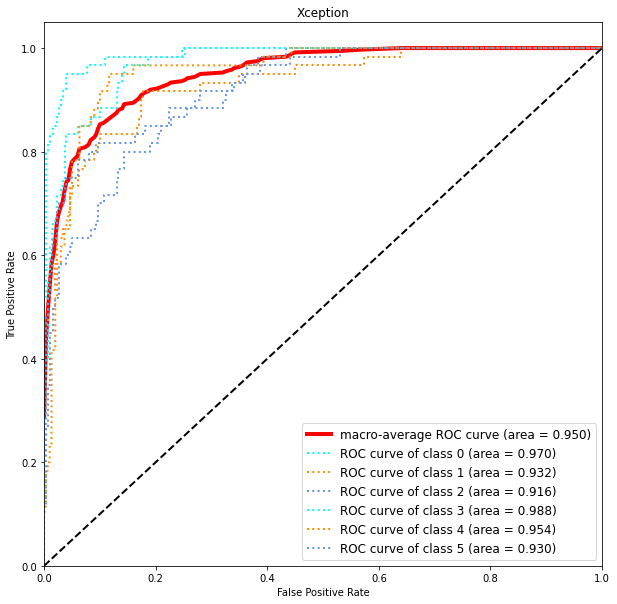

In [ ]:
train_model(1600)

100%|██████████| 360/360 [00:04<00:00, 75.11it/s]


This is samplesize 1600 1
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1740 - categorical_accuracy: 0.5476
Epoch 1: val_categorical_accuracy improved from -inf to 0.34462, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 132s 546ms/step - loss: 1.1740 - categorical_accuracy: 0.5476 - val_loss: 3.4094 - val_categorical_accuracy: 0.3446 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9092 - categorical_accuracy: 0.6597
Epoch 2: val_categorical_accuracy improved from 0.34462 to 0.57678, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 496ms/step - loss: 0.9092 - categorical_accuracy: 0.6597 - val_loss: 1.9050 - val_categorical_accura

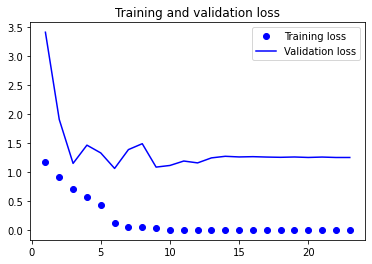

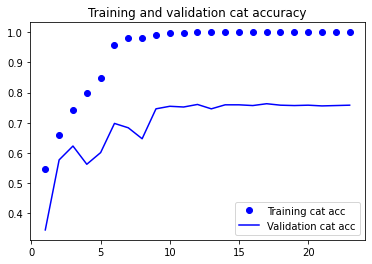

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[51  1  1  0  5  2]
 [ 1 52  1  0  5  1]
 [ 4  9 39  6  1  1]
 [ 0  0  5 55  0  0]
 [ 0  7  1  2 48  2]
 [ 8  5  2  1  8 36]]
              precision    recall  f1-score   support

         bcc       0.80      0.85      0.82        60
         bkl       0.70      0.87      0.78        60
         mel       0.80      0.65      0.72        60
          nv       0.86      0.92      0.89        60
      others       0.72      0.80      0.76        60
         scc       0.86      0.60      0.71        60

    accuracy                           0.78       360
   macro avg       0.79      0.78      0.78       360
weighted avg       0.79      0.78      0.78       360

Specificity of each class:
bcc : 0.957
bkl : 0.927
mel : 0.967
nv : 0.970
others : 0.937
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


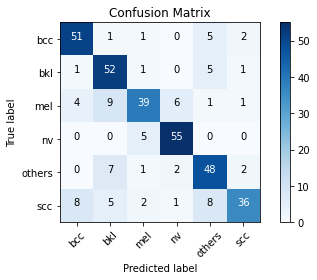

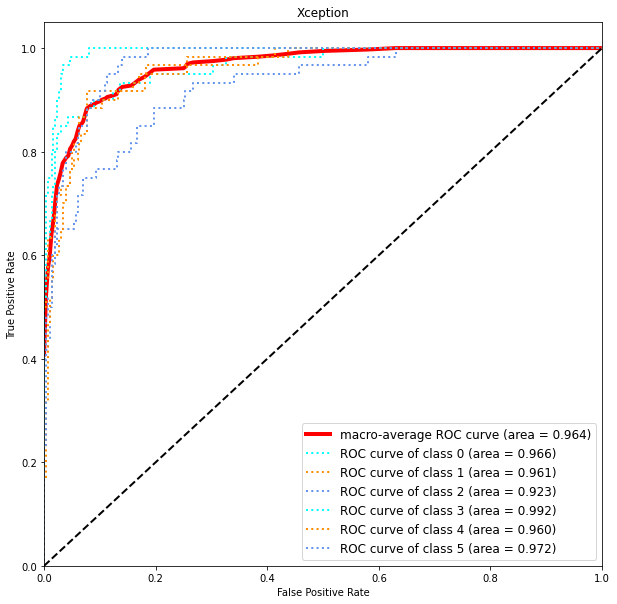

This is samplesize 1600 2
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1677 - categorical_accuracy: 0.5477
Epoch 1: val_categorical_accuracy improved from -inf to 0.51511, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 122s 502ms/step - loss: 1.1677 - categorical_accuracy: 0.5477 - val_loss: 1.3339 - val_categorical_accuracy: 0.5151 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8762 - categorical_accuracy: 0.6739
Epoch 2: val_categorical_accuracy improved from 0.51511 to 0.63724, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 496ms/step - loss: 0.8762 - categorical_accuracy: 0.6739 - val_loss: 1.0519 - val_categorical_accura

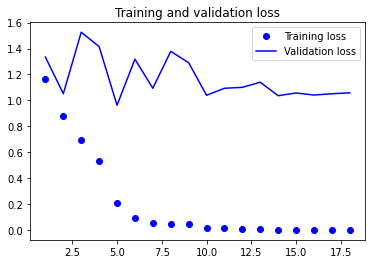

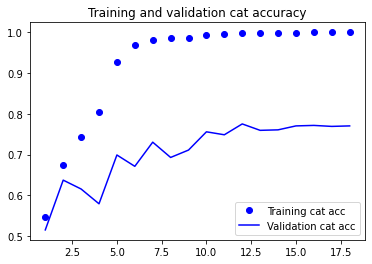

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 12ms/step
Confusion matrix, without normalization
[[51  1  5  0  2  1]
 [ 1 45  8  1  4  1]
 [ 5  7 43  2  3  0]
 [ 0  0 12 47  1  0]
 [ 4  2  4  3 43  4]
 [15  2  5  1  4 33]]
              precision    recall  f1-score   support

         bcc       0.67      0.85      0.75        60
         bkl       0.79      0.75      0.77        60
         mel       0.56      0.72      0.63        60
          nv       0.87      0.78      0.82        60
      others       0.75      0.72      0.74        60
         scc       0.85      0.55      0.67        60

    accuracy                           0.73       360
   macro avg       0.75      0.73      0.73       360
weighted avg       0.75      0.73      0.73       360

Specificity of each class:
bcc : 0.917
bkl : 0.960
mel : 0.887
nv : 0.977
others : 0.953
scc : 0.980


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


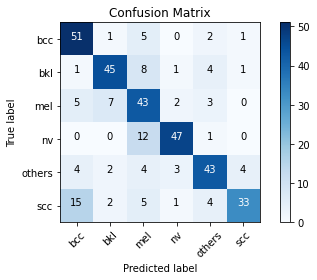

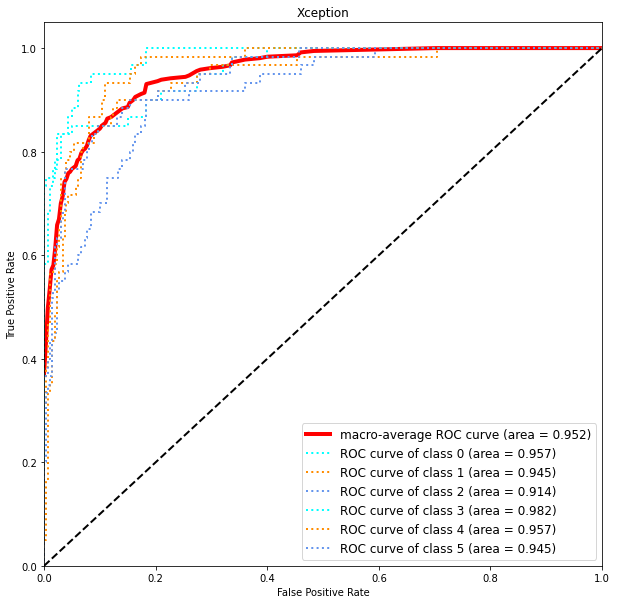

This is samplesize 1600 3
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1647 - categorical_accuracy: 0.5527
Epoch 1: val_categorical_accuracy improved from -inf to 0.57437, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1647 - categorical_accuracy: 0.5527 - val_loss: 1.3421 - val_categorical_accuracy: 0.5744 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8868 - categorical_accuracy: 0.6640
Epoch 2: val_categorical_accuracy improved from 0.57437 to 0.57920, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 495ms/step - loss: 0.8868 - categorical_accuracy: 0.6640 - val_loss: 1.1948 - val_categorical_accura

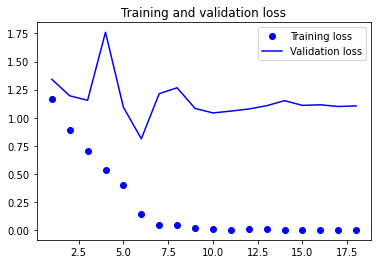

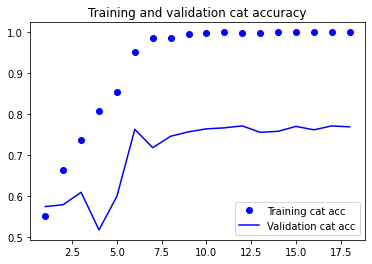

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[48  2  3  0  5  2]
 [ 2 53  1  1  3  0]
 [ 5  9 37  6  3  0]
 [ 1  3  5 51  0  0]
 [ 2  5  2  4 42  5]
 [ 9  8  5  0  7 31]]
              precision    recall  f1-score   support

         bcc       0.72      0.80      0.76        60
         bkl       0.66      0.88      0.76        60
         mel       0.70      0.62      0.65        60
          nv       0.82      0.85      0.84        60
      others       0.70      0.70      0.70        60
         scc       0.82      0.52      0.63        60

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.72       360
weighted avg       0.74      0.73      0.72       360

Specificity of each class:
bcc : 0.937
bkl : 0.910
mel : 0.947
nv : 0.963
others : 0.940
scc : 0.977


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


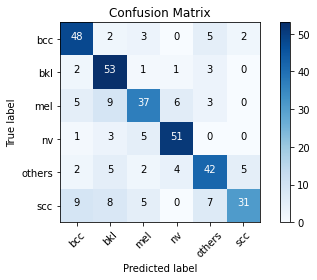

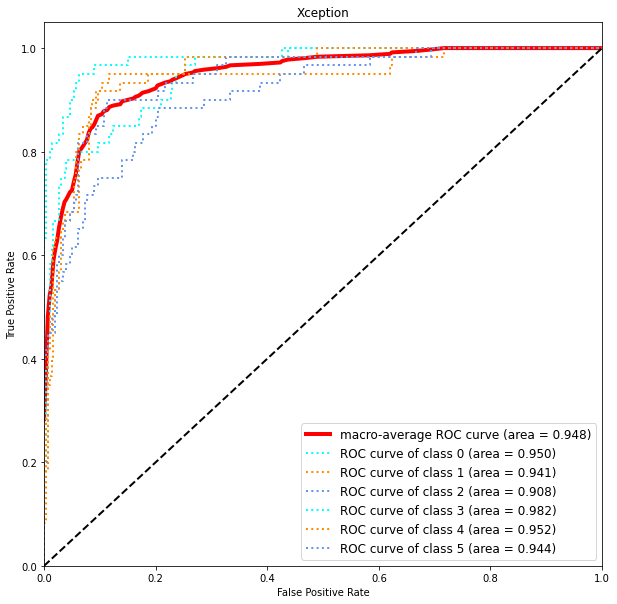

This is samplesize 1600 4
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1659 - categorical_accuracy: 0.5495
Epoch 1: val_categorical_accuracy improved from -inf to 0.54172, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 501ms/step - loss: 1.1659 - categorical_accuracy: 0.5495 - val_loss: 1.4694 - val_categorical_accuracy: 0.5417 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.9036 - categorical_accuracy: 0.6608
Epoch 2: val_categorical_accuracy improved from 0.54172 to 0.62273, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 116s 496ms/step - loss: 0.9036 - categorical_accuracy: 0.6608 - val_loss: 1.0268 - val_categorical_accura

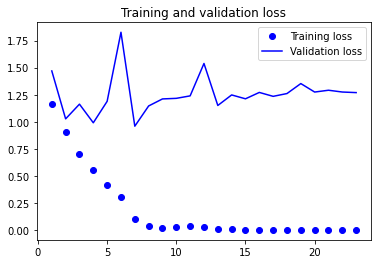

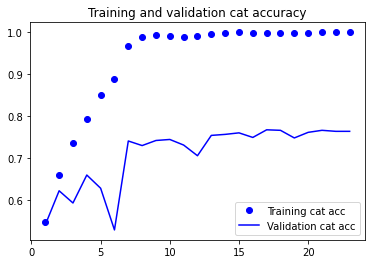

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[49  3  4  0  4  0]
 [ 2 49  2  4  1  2]
 [ 3  7 38  6  5  1]
 [ 0  1  0 59  0  0]
 [ 0  4  2  4 48  2]
 [ 6  4  6  0  5 39]]
              precision    recall  f1-score   support

         bcc       0.82      0.82      0.82        60
         bkl       0.72      0.82      0.77        60
         mel       0.73      0.63      0.68        60
          nv       0.81      0.98      0.89        60
      others       0.76      0.80      0.78        60
         scc       0.89      0.65      0.75        60

    accuracy                           0.78       360
   macro avg       0.79      0.78      0.78       360
weighted avg       0.79      0.78      0.78       360

Specificity of each class:
bcc : 0.963
bkl : 0.937
mel : 0.953
nv : 0.953
others : 0.950
scc : 0.983


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


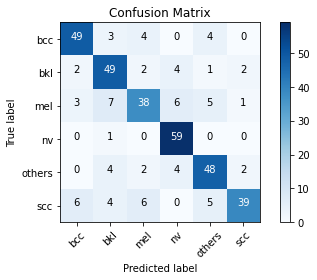

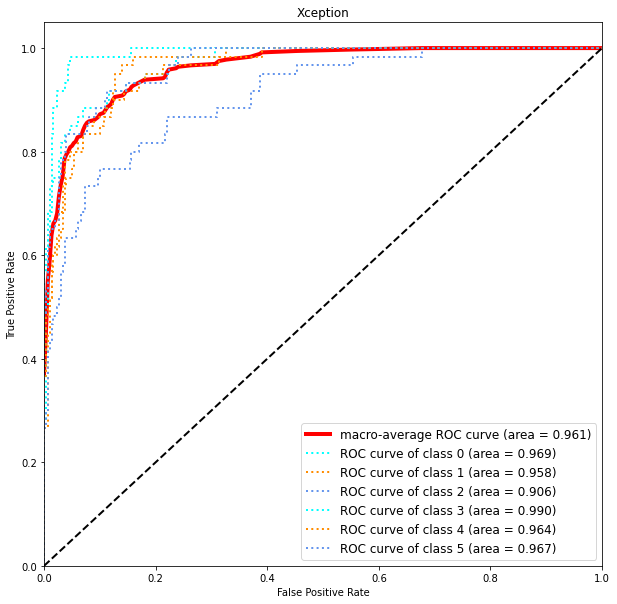

This is samplesize 1600 5
Found 7440 images belonging to 6 classes.
Found 827 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
233/233 [==============================] - ETA: 0s - loss: 1.1768 - categorical_accuracy: 0.5411
Epoch 1: val_categorical_accuracy improved from -inf to 0.55502, saving model to Model/Skin Lesion 299 Random resize 92%.h5
233/233 [==============================] - 121s 500ms/step - loss: 1.1768 - categorical_accuracy: 0.5411 - val_loss: 1.3214 - val_categorical_accuracy: 0.5550 - lr: 0.0010
Epoch 2/60
233/233 [==============================] - ETA: 0s - loss: 0.8853 - categorical_accuracy: 0.6668
Epoch 2: val_categorical_accuracy did not improve from 0.55502
233/233 [==============================] - 115s 492ms/step - loss: 0.8853 - categorical_accuracy: 0.6668 - val_loss: 1.4090 - val_categorical_accuracy: 0.5417 - lr: 0.0010
Epoch 3/60
233/233 [====================

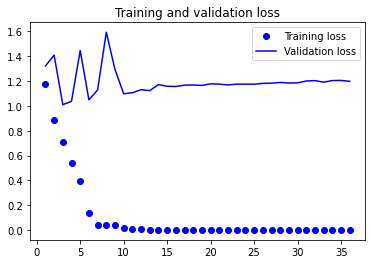

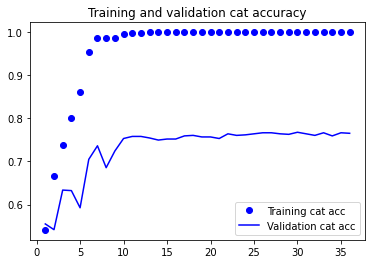

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[50  2  2  0  4  2]
 [ 2 50  1  1  6  0]
 [ 3  9 41  4  3  0]
 [ 1  4  2 52  1  0]
 [ 2  2  0  4 52  0]
 [ 7  5  5  1  6 36]]
              precision    recall  f1-score   support

         bcc       0.77      0.83      0.80        60
         bkl       0.69      0.83      0.76        60
         mel       0.80      0.68      0.74        60
          nv       0.84      0.87      0.85        60
      others       0.72      0.87      0.79        60
         scc       0.95      0.60      0.73        60

    accuracy                           0.78       360
   macro avg       0.80      0.78      0.78       360
weighted avg       0.80      0.78      0.78       360

Specificity of each class:
bcc : 0.950
bkl : 0.927
mel : 0.967
nv : 0.967
others : 0.933
scc : 0.993


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


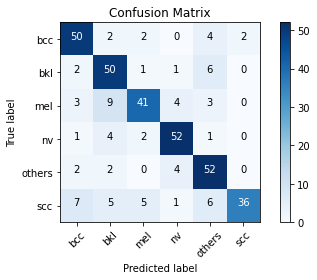

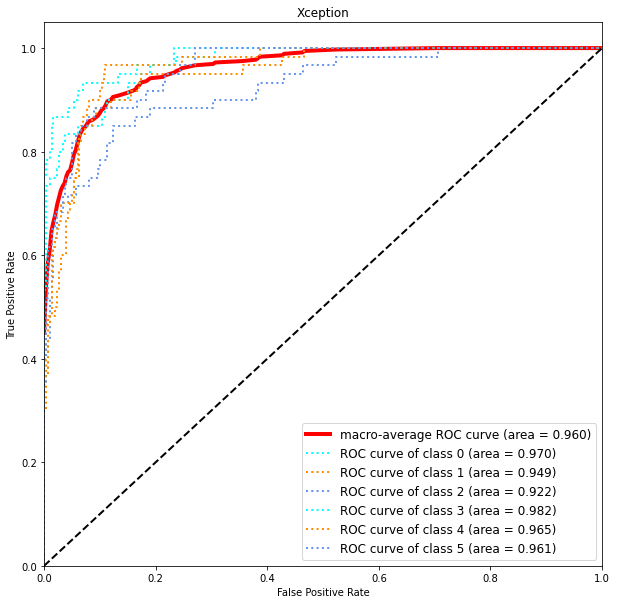

In [ ]:
train_model(1600)

## 3000

100%|██████████| 360/360 [00:06<00:00, 54.06it/s]


This is samplesize 3000 1
Found 11766 images belonging to 6 classes.
Found 1308 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
368/368 [==============================] - ETA: 0s - loss: 1.0383 - categorical_accuracy: 0.6167
Epoch 1: val_categorical_accuracy improved from -inf to 0.64908, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 263s 701ms/step - loss: 1.0383 - categorical_accuracy: 0.6167 - val_loss: 1.0215 - val_categorical_accuracy: 0.6491 - lr: 0.0010
Epoch 2/60
368/368 [==============================] - ETA: 0s - loss: 0.7833 - categorical_accuracy: 0.7073
Epoch 2: val_categorical_accuracy did not improve from 0.64908
368/368 [==============================] - 191s 518ms/step - loss: 0.7833 - categorical_accuracy: 0.7073 - val_loss: 1.2793 - val_categorical_accuracy: 0.6300 - lr: 0.0010
Epoch 3/60
368/368 [==================

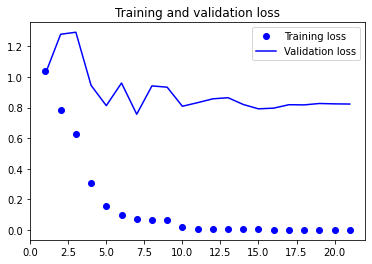

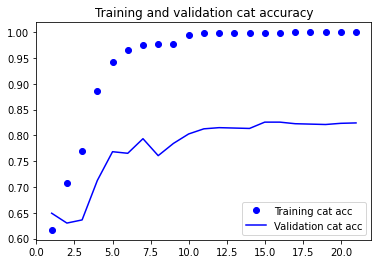

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[55  0  1  2  2  0]
 [ 4 51  2  1  2  0]
 [ 5  9 39  5  2  0]
 [ 1  2  0 57  0  0]
 [ 4  2  3  2 48  1]
 [14  6  5  0  8 27]]
              precision    recall  f1-score   support

         bcc       0.66      0.92      0.77        60
         bkl       0.73      0.85      0.78        60
         mel       0.78      0.65      0.71        60
          nv       0.85      0.95      0.90        60
      others       0.77      0.80      0.79        60
         scc       0.96      0.45      0.61        60

    accuracy                           0.77       360
   macro avg       0.79      0.77      0.76       360
weighted avg       0.79      0.77      0.76       360

Specificity of each class:
bcc : 0.907
bkl : 0.937
mel : 0.963
nv : 0.967
others : 0.953
scc : 0.997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


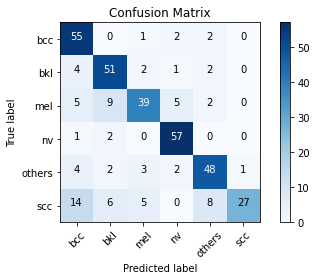

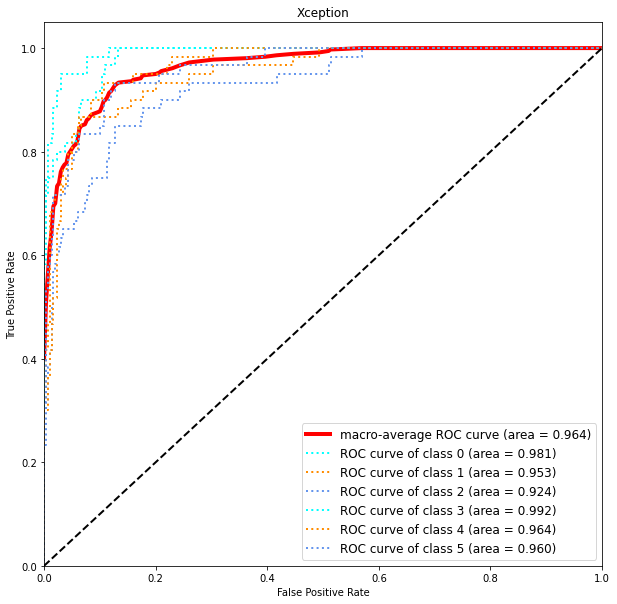

This is samplesize 3000 2
Found 11766 images belonging to 6 classes.
Found 1308 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
368/368 [==============================] - ETA: 0s - loss: 1.0601 - categorical_accuracy: 0.6098
Epoch 1: val_categorical_accuracy improved from -inf to 0.60627, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 188s 499ms/step - loss: 1.0601 - categorical_accuracy: 0.6098 - val_loss: 1.1459 - val_categorical_accuracy: 0.6063 - lr: 0.0010
Epoch 2/60
368/368 [==============================] - ETA: 0s - loss: 0.8250 - categorical_accuracy: 0.6966
Epoch 2: val_categorical_accuracy improved from 0.60627 to 0.66361, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 182s 494ms/step - loss: 0.8250 - categorical_accuracy: 0.6966 - val_loss: 0.9447 - val_categorical_accu

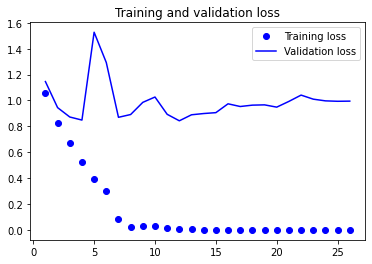

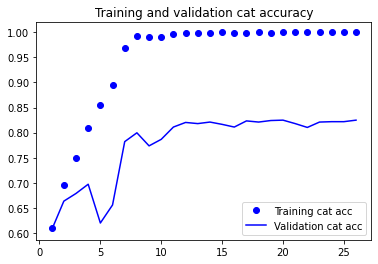

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[53  3  1  1  2  0]
 [ 2 47  4  4  3  0]
 [ 3  5 44  8  0  0]
 [ 0  0  1 58  1  0]
 [ 4  7  3  0 43  3]
 [10  5 10  0  3 32]]
              precision    recall  f1-score   support

         bcc       0.74      0.88      0.80        60
         bkl       0.70      0.78      0.74        60
         mel       0.70      0.73      0.72        60
          nv       0.82      0.97      0.89        60
      others       0.83      0.72      0.77        60
         scc       0.91      0.53      0.67        60

    accuracy                           0.77       360
   macro avg       0.78      0.77      0.76       360
weighted avg       0.78      0.77      0.76       360

Specificity of each class:
bcc : 0.937
bkl : 0.933
mel : 0.937
nv : 0.957
others : 0.970
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


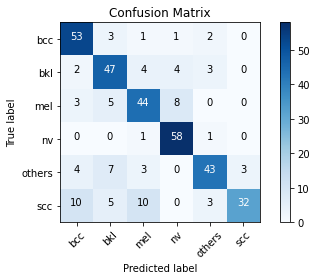

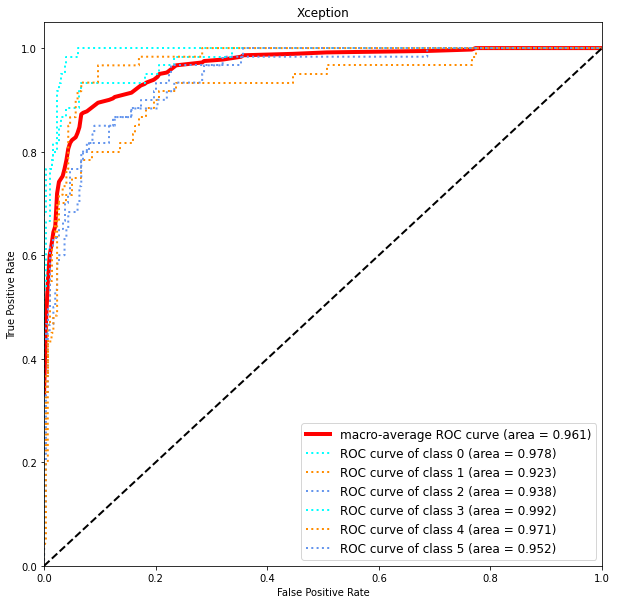

This is samplesize 3000 3
Found 11766 images belonging to 6 classes.
Found 1308 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
368/368 [==============================] - ETA: 0s - loss: 1.0264 - categorical_accuracy: 0.6164
Epoch 1: val_categorical_accuracy improved from -inf to 0.57798, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 189s 500ms/step - loss: 1.0264 - categorical_accuracy: 0.6164 - val_loss: 1.7371 - val_categorical_accuracy: 0.5780 - lr: 0.0010
Epoch 2/60
368/368 [==============================] - ETA: 0s - loss: 0.7735 - categorical_accuracy: 0.7142
Epoch 2: val_categorical_accuracy improved from 0.57798 to 0.62768, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 183s 497ms/step - loss: 0.7735 - categorical_accuracy: 0.7142 - val_loss: 1.1270 - val_categorical_accu

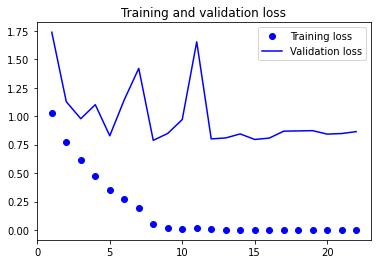

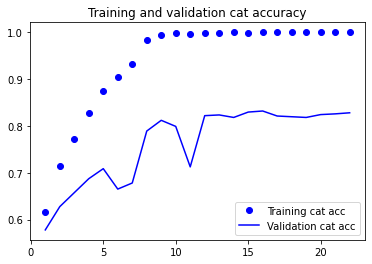

<Figure size 432x288 with 0 Axes>

360/360 [==============================] - 5s 13ms/step
Confusion matrix, without normalization
[[52  2  3  1  1  1]
 [ 2 50  2  2  4  0]
 [ 5  8 42  4  1  0]
 [ 0  0  1 58  1  0]
 [ 5  4  2  1 46  2]
 [ 9  3  7  1  6 34]]
              precision    recall  f1-score   support

         bcc       0.71      0.87      0.78        60
         bkl       0.75      0.83      0.79        60
         mel       0.74      0.70      0.72        60
          nv       0.87      0.97      0.91        60
      others       0.78      0.77      0.77        60
         scc       0.92      0.57      0.70        60

    accuracy                           0.78       360
   macro avg       0.79      0.78      0.78       360
weighted avg       0.79      0.78      0.78       360

Specificity of each class:
bcc : 0.930
bkl : 0.943
mel : 0.950
nv : 0.970
others : 0.957
scc : 0.990


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:229: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


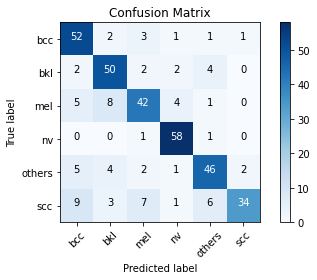

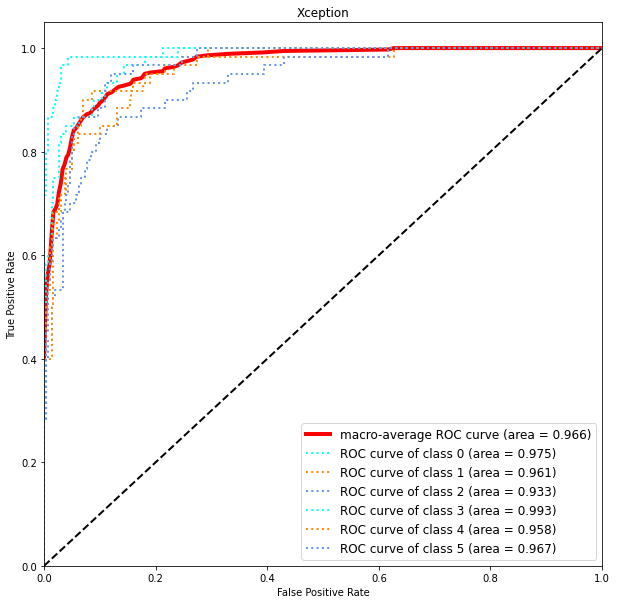

This is samplesize 3000 4
Found 11766 images belonging to 6 classes.
Found 1308 images belonging to 6 classes.
Found 360 images belonging to 6 classes.
{'bcc': 0, 'bkl': 1, 'mel': 2, 'nv': 3, 'others': 4, 'scc': 5}
Epoch 1/60
368/368 [==============================] - ETA: 0s - loss: 1.0141 - categorical_accuracy: 0.6220
Epoch 1: val_categorical_accuracy improved from -inf to 0.53593, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 189s 500ms/step - loss: 1.0141 - categorical_accuracy: 0.6220 - val_loss: 2.0138 - val_categorical_accuracy: 0.5359 - lr: 0.0010
Epoch 2/60
368/368 [==============================] - ETA: 0s - loss: 0.7734 - categorical_accuracy: 0.7138
Epoch 2: val_categorical_accuracy improved from 0.53593 to 0.70107, saving model to Model/Skin Lesion 299 Random resize 92%.h5
368/368 [==============================] - 184s 498ms/step - loss: 0.7734 - categorical_accuracy: 0.7138 - val_loss: 0.8420 - val_categorical_accu

In [ ]:
train_model(3000)

In [ ]:
train_model(3000)

In [ ]:
train_model(3000)

In [ ]:
train_model(3000)

In [ ]:
train_model(3000)